In [190]:
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pytorch_msssim import MS_SSIM
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import matplotlib.pyplot as plt

In [191]:
#device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
if torch.cuda.is_available():  
    device = "cuda:0"
else:  
    device = "cpu"
# TODO: make sure to .to(device) the class later, and also set up gpu

# path to font list
fonts_csv = "fonts.csv"
# root directory for dataset
dataroot = "images"
# number of workers for dataloader
workers = 0
# number of epochs
num_epochs = 1000
# batch size for training
batch_size = 16
# height and width of input image
img_size = 64
# the alphabet characters
alphabet = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
# number of channels
nc0 = 1 * len(alphabet)
nc1 = 4 * len(alphabet)
nc2 = 8 * len(alphabet)
nc3 = 16 * len(alphabet)
# disciminator channels
dc0 = 1
dc1 = 8
dc2 = 16
dc3 = 32
# threshold
thresh = 0
# learning rate
lr = 0.002
# beta1 for Adam
beta1 = 0.5
# real label
real_label = 1.0
# fake label
fake_label = 0.0
# number of extra times to run the discriminator than the encdec per epoch
num_dis = 1
# coefficient of the discriminator loss in training
cof_dis = 7e-3
# number of patches to sample
num_patches = 3
# letter we use to generate all the other letters
base_letter = 'R'
# letter we are trying to generate
gen_letter = 'B'

In [192]:
class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean
        
    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean
    
    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

In [193]:
class FontDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.fontlist = pd.read_csv(csv_file, sep=' ')
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.fontlist)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample = {}
        for c in alphabet:
            path = os.path.join(self.root_dir, c, f'{idx}.npy')
            img = np.load(path)
            img = img[img_size//2:img_size//2 + img_size, img_size//2:img_size//2 + img_size, :]
            img = self.transform(img)
            sample[c] = img.type(torch.cuda.FloatTensor)

        return sample

In [194]:
# From https://discuss.pytorch.org/t/is-there-anyway-to-do-gaussian-filtering-for-an-image-2d-3d-in-pytorch/12351/3
def get_gaussian_kernel(kernel_size=3, sigma=2, channels=3):
    # Create a x, y coordinate grid of shape (kernel_size, kernel_size, 2)
    x_coord = torch.arange(kernel_size)
    x_grid = x_coord.repeat(kernel_size).view(kernel_size, kernel_size)
    y_grid = x_grid.t()
    xy_grid = torch.stack([x_grid, y_grid], dim=-1).float()

    mean = (kernel_size - 1)/2.
    variance = sigma**2.

    # Calculate the 2-dimensional gaussian kernel which is
    # the product of two gaussian distributions for two different
    # variables (in this case called x and y)
    gaussian_kernel = (1./(2.*math.pi*variance)) *\
                      torch.exp(
                          -torch.sum((xy_grid - mean)**2., dim=-1) /\
                          (2*variance)
                      )

    # Make sure sum of values in gaussian kernel equals 1.
    gaussian_kernel = gaussian_kernel / torch.sum(gaussian_kernel)

    # Reshape to 2d depthwise convolutional weight
    gaussian_kernel = gaussian_kernel.view(1, 1, kernel_size, kernel_size)
    gaussian_kernel = gaussian_kernel.repeat(channels, 1, 1, 1)

    gaussian_filter = nn.Conv2d(in_channels=channels, out_channels=channels,
                                kernel_size=kernel_size, groups=channels, bias=False, padding=1)

    gaussian_filter.weight.data = gaussian_kernel
    gaussian_filter.weight.requires_grad = False
    
    return gaussian_filter

In [195]:
class EncoderDecoder(nn.Module):
    def __init__(self):
        super(EncoderDecoder, self).__init__()
        self.conv01 = nn.Conv2d(dc0, dc1, 3, padding=1)
        self.conv12 = nn.Conv2d(dc1, dc2, 3, padding=1)
        self.conv23 = nn.Conv2d(dc2, dc3, 3, padding=1)
#         self.conv24 = nn.Conv2d(dc2, dc4, 3, padding=1)
#         self.conv34 = nn.Conv2d(dc3, dc4, 3, padding=1)
        
        self.conv33 = nn.Conv2d(dc3, dc3, 3, padding=1)
        self.conv32 = nn.Conv2d(dc3, nc0, 3, padding=1)
        
#         self.conv1 = nn.Conv2d(nc0, nc1, 3, padding=1)
        self.conv0same = nn.Conv2d(nc0, nc0, 3, padding=1)
#         self.conv2 = nn.Conv2d(nc1, nc2, 3, padding=1)
#         self.conv3 = nn.Conv2d(nc2, nc2, 3, padding=1)
#         self.conv2back = nn.Conv2d(nc2, nc1, 3, padding=1)
#         self.conv1back = nn.Conv2d(nc1, nc0, 3, padding=1)
        
#         self.conv1strided = nn.Conv2d(nc1, nc1, 3, stride=2, padding=1)
#         self.conv2strided = nn.Conv2d(nc2, nc2, 3, stride=2, padding=1)

#         self.deconv1 = nn.ConvTranspose2d(nc1, nc0, 3, padding=1)
#         self.deconv2 = nn.ConvTranspose2d(nc2, nc1, 3, padding=1)
#         self.deconv1strided = nn.ConvTranspose2d(nc1, nc1, 3, stride=2, padding=1, output_padding=1)
#         self.deconv2strided = nn.ConvTranspose2d(nc2, nc2, 3, stride=2, padding=1, output_padding=1)

#         self.batchnorm0 = nn.BatchNorm2d(nc0)
#         self.batchnorm1 = nn.BatchNorm2d(nc1)
#         self.batchnorm2 = nn.BatchNorm2d(nc2)
        self.pool = nn.MaxPool2d(2, return_indices=True)
        self.unpool = nn.MaxUnpool2d(2)
        self.relu = nn.ReLU(inplace=True)
        self.leakyrelu = nn.LeakyReLU(0.2, inplace=True)
        self.sigmoid = nn.Sigmoid()
        self.tanh = nn.Tanh()
        self.threshold = nn.Threshold(thresh, 0)
        
        self.gaussian_filter = get_gaussian_kernel(kernel_size = 3, sigma=2, channels=nc0)
        
    def forward(self, x):
        x = self.conv01(x)
        x = self.leakyrelu(x)
        x = self.conv12(x)
        x = self.leakyrelu(x)
        x = self.conv23(x)
        x = self.leakyrelu(x)
        x, idx1 = self.pool(x)
        
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x, idx2 = self.pool(x)
        
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x, idx3 = self.pool(x)
        
        x = self.unpool(x, idx3)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        
        x = self.unpool(x, idx2)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        x = self.conv33(x)
        x = self.leakyrelu(x)
        
        x = self.unpool(x, idx1)
        x = self.conv32(x)
        x = self.leakyrelu(x)
        
        x = self.gaussian_filter(x)
        x = self.conv0same(x)
        x = self.leakyrelu(x)
        x = self.conv0same(x)
        x = self.leakyrelu(x)
        
        x = self.tanh(x)
        
        return x

In [196]:
class Transformer_EncDec(nn.Module):
    def __init__(self, nhead=8, num_encoder_layers=6):
        model = nn.Transformer(d_model=img_size**2, nhead=nhead, num_encoder_layers=num_encoder_layers)
        
    def generate_square_subsequent_mask(self, sz):
        mask = torch.triu(torch.ones(sz, sz), diagonal=1)
        mask = mask.float().masked_fill(mask == 1, float('-inf'))
        return mask
    
    def forward(self, src, src_mask):
        trans.torch.ones((1, src.shape[0], img_size*img_size))
        for i in src.shape[0]:
            trans[0][i] = src[i][0].reshape(-1)
        x = model(trans, src_mask)
        
        return model(src, src_mask)

In [197]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv0 = nn.Conv2d(nc0, nc2, 3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.conv2stri = nn.Conv2d(nc2, nc2, 4, stride=2, padding=1)
        self.conv2same = nn.Conv2d(nc2, nc2, 3, padding=1)
        self.conv3 = nn.Conv2d(nc2, nc3, 4, stride=2, padding=1)
        self.norm3 = nn.BatchNorm2d(nc3)
        self.conv3same = nn.Conv2d(nc3, nc3, 3, padding=1)
        self.conv3back = nn.Conv2d(nc3, nc2, 3, padding=1)
        self.conv0back = nn.Conv2d(nc2, nc0, 3, padding=1)
        self.flat = nn.Flatten(2)
        self.linear = nn.Linear(img_size//8 * img_size//8, 1)
        self.sigmoid = nn.Sigmoid()
        self.flat1 = nn.Flatten()
        
    def forward(self, input):
        # nc0 x img_size x img_size
        out = self.conv0(input)
        out = self.relu(out)
        
        # nc2 x img_size x img_size
        out = self.conv2stri(out)
        out = self.relu(out)
        
        # nc2 x img_size/2 x img_size/2
        out = self.conv2stri(out)
        out = self.relu(out)
        
        # nc2 x img_size/4 x img_size/4
        out = self.conv2same(out)
        out = self.relu(out)
        out = self.conv2same(out)
        out = self.relu(out)
        out = self.conv3(out)
        out = self.norm3(out)
        out = self.relu(out)
        
        # nc3 x img_size/8 x img_size/8
        out = self.conv3same(out)
        out = self.relu(out)
        out = self.conv3back(out)
        out = self.relu(out)
        
        # nc2 x img_size/8 x img_size/8
        out = self.conv0back(out)
        out = self.relu(out)
        
#         print(out.size())
        out = self.flat(out)
#         print(out.size())
        out = self.linear(out)
#         print(out.size())
        out = self.flat1(out)
        out = self.sigmoid(out)
#         print(out.size())
        
        return out

In [198]:
class LocalDiscriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # 1 x img_size x img_size
            nn.Conv2d(nc0, nc2, 3, padding=1),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(nc2, nc2, 4, stride=2, padding=1),
#             nn.BatchNorm2d(nc1),
            nn.ReLU(inplace=True),
            # 4 x img_size/2 x img_size/2
            nn.Conv2d(nc2, nc2, 4, stride=2, padding=1),
#             nn.BatchNorm2d(nc2),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(nc2, nc2, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(nc2, nc2, 3, padding=1),
            nn.ReLU(inplace=True),
            
            # 8 x img_size/4 x img_size/4
            nn.Flatten(),
            nn.Linear(nc2 * img_size // 4 * img_size // 4, 1),
            nn.Sigmoid(),
        )

    def forward(self, input):
        return self.main(input)

In [199]:
def concat_tensors(data):
    tensor = None
    
    for c in alphabet:
        if tensor == None:
            tensor = data[c]
        else:
            tensor = torch.cat((tensor, data[c]), 1)
    
    return tensor

In [200]:
lossD_list = []
loss_disc_list = []
loss_l1_list = []
loss_ssim_list = []
loss_local_list = []
val_set = None

In [203]:
def main():
    dataset = FontDataset(csv_file=fonts_csv, 
                        root_dir=dataroot, 
                        transform=transforms.Compose([
                            transforms.ToTensor(),
                            transforms.Normalize(0.5, 0.5),
#                             AddGaussianNoise(0., 0.05),
                        ]))
    global val_set
    testset_size = len(dataset) // 5 * 4
    train_set, val_set = random_split(dataset, [testset_size, len(dataset) - testset_size], generator=torch.Generator().manual_seed(42))
    
    train_data = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=workers)
    
    encdec = EncoderDecoder()
    encdec.to(device)
    # use this line to continue training instead of starting a new one
    encdec.load_state_dict(torch.load('encdec-Copy2.pt'))
    
    criterionED_l1 = nn.L1Loss()
    criterionED_ssim = MS_SSIM(win_size=3, data_range=1, size_average=True, channel=nc0)
    optimizerED = optim.Adam(encdec.parameters(), lr=lr)

    disc = Discriminator()
    disc.to(device)
    criterionD = nn.BCELoss()
    optimizerD = optim.Adam(disc.parameters(), lr=lr)
    
    # training loop
    for epoch in range(num_epochs):
        running_lossD = 0.0
        running_loss_disc = 0.0
        running_loss_l1 = 0.0
        running_loss_ssim = 0.0
        running_loss_local = 0.0
        
        for it in range(num_dis):
            for i, data in enumerate(train_data):
                train_batch = concat_tensors(data)
                disc.zero_grad()

                b_size = train_batch.size(0)
                c_size = train_batch.size(1)
                label = torch.full((b_size,c_size,), real_label, dtype=torch.float, device=device)

                outputD = disc(train_batch)
                lossD_real = criterionD(outputD, label)
                lossD_real.backward()

                # all fake batch
                outputED = encdec(data[base_letter])
                label.fill_(fake_label)
                outputD = disc(outputED.detach())
                lossD_fake = criterionD(outputD, label)
                lossD_fake.backward()

                lossD = lossD_real + lossD_fake
                optimizerD.step()
#         print('finished updating dis')
                
        for i, data in enumerate(train_data):
            train_batch = concat_tensors(data)
            train_batch.to(device)
            ###########################
            # update disc
            ###########################
            disc.zero_grad()
            # all real batch
            b_size = train_batch.size(0)
            c_size = train_batch.size(1)
            label = torch.full((b_size,c_size,), real_label, dtype=torch.float, device=device)
            label.to(device)
            outputD = disc(train_batch)
            lossD_real = criterionD(outputD, label)
            lossD_real.backward()
            
            # all fake batch
            data[base_letter].to(device)
            outputED = encdec(data[base_letter])
            
            label.fill_(fake_label)
            outputD = disc(outputED.detach())
            lossD_fake = criterionD(outputD, label)
            lossD_fake.backward()

            lossD = lossD_real + lossD_fake
            optimizerD.step()

            ###########################
            # update encdec
            ###########################
            encdec.zero_grad()
            # rerun disc
            label.fill_(real_label)
            outputD = disc(outputED)
            lossED_disc = criterionD(outputD, label)
            # run encdec
            lossED_l1 = criterionED_l1(outputED, train_batch)
            
            # calculate local loss
            lossED_local = 0.0
            for _ in range(num_patches):
                x = np.random.randint(16, 48)
                y = np.random.randint(16, 48)
                for j, c in enumerate(alphabet):
                    outputED_patch = outputED[:, j, x-8:x+8, y-8:y+8]
                    datac2_patch = data[c][:, 0, x-8:x+8, y-8:y+8]
                    outputED_patch = (outputED_patch + 1) / 2
                    datac2_patch = (datac2_patch + 1) / 2
                    lossED_local += criterionED_l1(outputED_patch, datac2_patch)
            
            outputED_norm = (outputED + 1) / 2
            train_norm = (train_batch + 1) / 2
            lossED_ssim = 1 - criterionED_ssim(outputED_norm, train_norm)

            lossED = cof_dis * lossED_disc + 0.16 * lossED_l1 + 0.84 * lossED_ssim + lossED_local/len(alphabet)/num_patches
            lossED.backward()
            optimizerED.step()
    
            running_lossD += lossD.item()
            running_loss_disc += lossED_disc.item()
            running_loss_l1 += lossED_l1.item()
            running_loss_ssim += lossED_ssim.item()
            running_loss_local += lossED_local.item()
            if i % 25 == 0:
                print(f"Epoch {epoch+1}, Iteration {i+1}, Loss D {running_lossD}, Loss Disc {running_loss_disc}, Loss L1 {running_loss_l1}, Loss SSIM {running_loss_ssim}, Loss Local {running_loss_local}")
                lossD_list.append(running_lossD)
                loss_disc_list.append(running_loss_disc)
                loss_l1_list.append(running_loss_l1)
                loss_ssim_list.append(running_loss_ssim)
                loss_local_list.append(running_loss_local)
                running_lossD = 0.0
                running_loss_disc = 0.0
                running_loss_l1 = 0.0
                running_loss_ssim = 0.0
                running_loss_local = 0.0
                
                fig = plt.figure(figsize=(8, 8))
                fig.add_subplot(1, 2, 1)
                plt.imshow(data['A'][0].permute(1, 2, 0).cpu().detach().numpy(), cmap='gray')
                fig.add_subplot(1, 2, 2)
                plt.imshow(outputED[0,0].cpu().detach().numpy(), cmap='gray')
                plt.show()
                torch.save(encdec.state_dict(), 'encdec.pt')
        
    print("Done")

Epoch 1, Iteration 1, Loss D 0.9401339292526245, Loss Disc 9.744901657104492, Loss L1 0.09072413295507431, Loss SSIM 0.14248734712600708, Loss Local 7.96611213684082


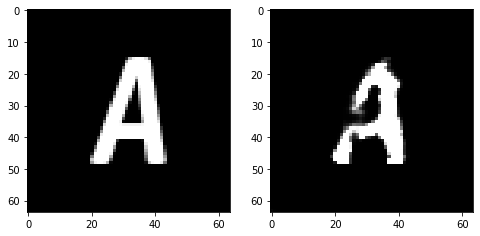

Epoch 1, Iteration 26, Loss D 124.58968210220337, Loss Disc 21.723085552453995, Loss L1 2.0670459270477295, Loss SSIM 3.2614603638648987, Loss Local 221.5850920677185


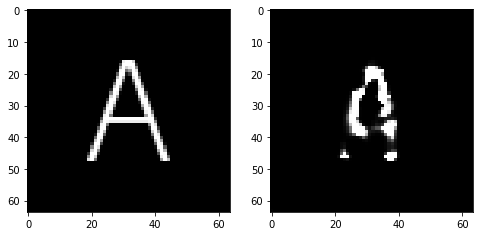

Epoch 1, Iteration 51, Loss D 33.24018347263336, Loss Disc 28.067887663841248, Loss L1 2.0609651654958725, Loss SSIM 3.0492403507232666, Loss Local 221.33443784713745


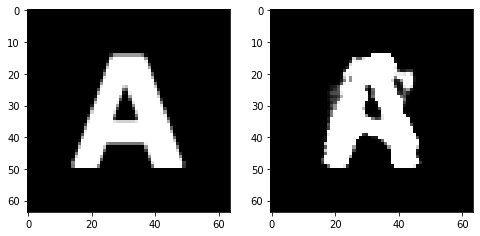

Epoch 1, Iteration 76, Loss D 34.65952527523041, Loss Disc 17.76464742422104, Loss L1 1.9573917463421822, Loss SSIM 2.8542087078094482, Loss Local 218.42411184310913


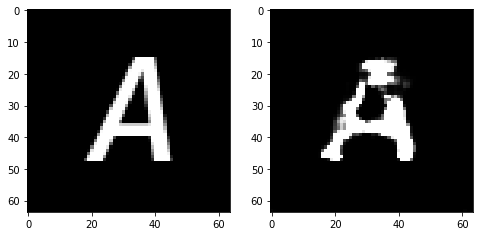

Epoch 1, Iteration 101, Loss D 34.508673310279846, Loss Disc 17.37731283903122, Loss L1 1.9928064197301865, Loss SSIM 2.9582947492599487, Loss Local 217.5929536819458


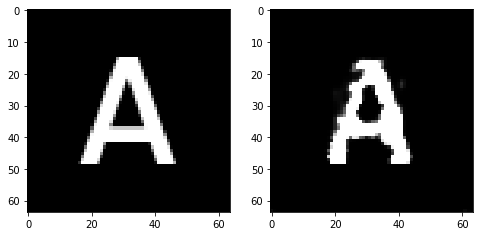

Epoch 1, Iteration 126, Loss D 34.43889808654785, Loss Disc 17.636970341205597, Loss L1 1.9576315730810165, Loss SSIM 2.9094749093055725, Loss Local 227.39290761947632


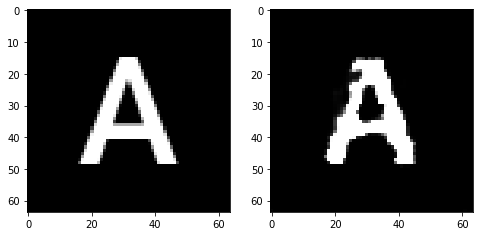

Epoch 1, Iteration 151, Loss D 34.42792582511902, Loss Disc 17.67593616247177, Loss L1 1.96917275339365, Loss SSIM 2.9381787180900574, Loss Local 221.33518981933594


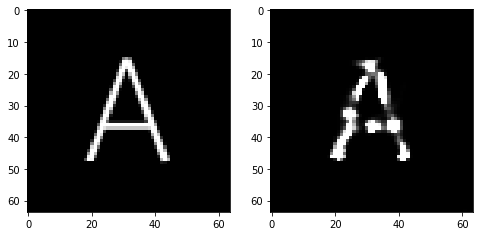

Epoch 1, Iteration 176, Loss D 34.28032684326172, Loss Disc 17.890997886657715, Loss L1 1.9427305608987808, Loss SSIM 2.8298884630203247, Loss Local 231.6335015296936


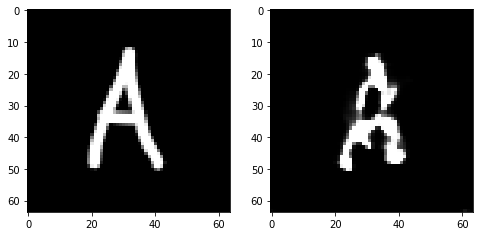

Epoch 2, Iteration 1, Loss D 0.2500684857368469, Loss Disc 8.240751266479492, Loss L1 0.08229819685220718, Loss SSIM 0.133525550365448, Loss Local 9.075068473815918


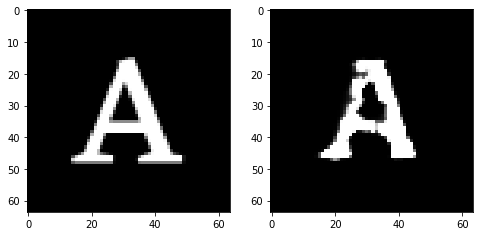

Epoch 2, Iteration 26, Loss D 40.39434176683426, Loss Disc 28.198688805103302, Loss L1 2.11244947463274, Loss SSIM 3.1228264570236206, Loss Local 236.6062469482422


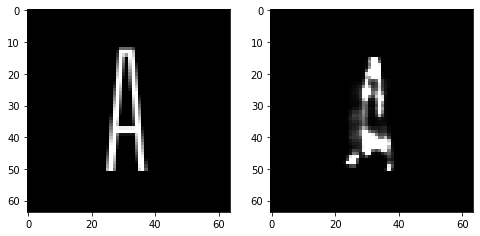

Epoch 2, Iteration 51, Loss D 33.09060215950012, Loss Disc 31.76116818189621, Loss L1 2.0097117573022842, Loss SSIM 3.0404602885246277, Loss Local 236.04654741287231


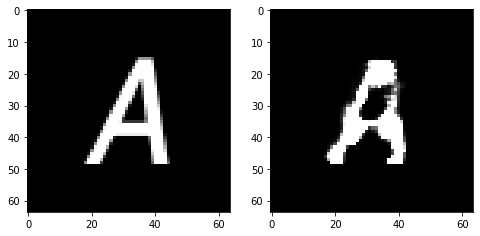

Epoch 2, Iteration 76, Loss D 34.711284041404724, Loss Disc 17.970573127269745, Loss L1 1.8864223212003708, Loss SSIM 2.740163266658783, Loss Local 221.0334939956665


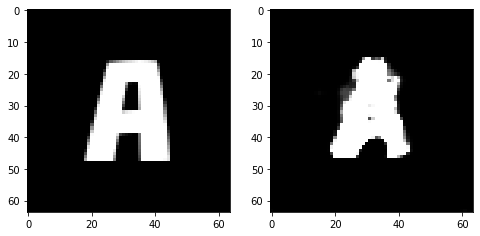

Epoch 2, Iteration 101, Loss D 34.64463806152344, Loss Disc 17.561470925807953, Loss L1 1.9606033861637115, Loss SSIM 3.0136659145355225, Loss Local 236.917622089386


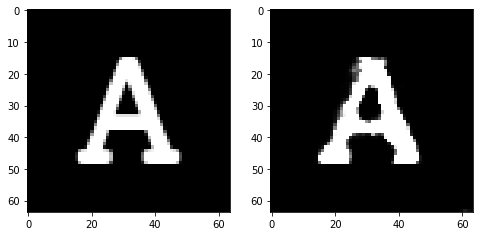

Epoch 2, Iteration 126, Loss D 34.619712114334106, Loss Disc 17.472996413707733, Loss L1 1.888713289052248, Loss SSIM 2.774593234062195, Loss Local 219.55798435211182


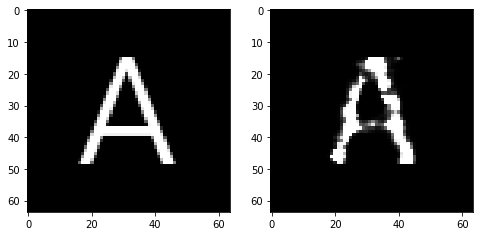

Epoch 2, Iteration 151, Loss D 34.59169626235962, Loss Disc 17.416785955429077, Loss L1 1.9198836088180542, Loss SSIM 2.8096598386764526, Loss Local 221.39634704589844


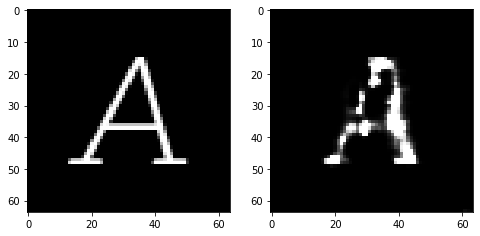

Epoch 2, Iteration 176, Loss D 34.55030977725983, Loss Disc 17.403034806251526, Loss L1 1.9737247675657272, Loss SSIM 2.8567039370536804, Loss Local 229.04979372024536


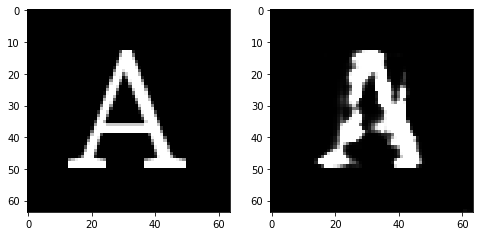

Epoch 3, Iteration 1, Loss D 0.3986648619174957, Loss Disc 6.809591770172119, Loss L1 0.08270691335201263, Loss SSIM 0.1295255422592163, Loss Local 7.798379898071289


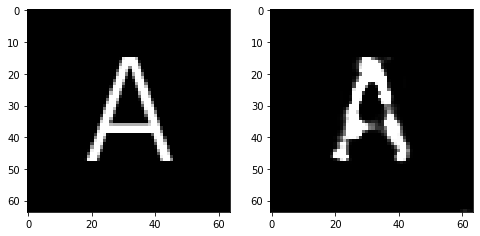

Epoch 3, Iteration 26, Loss D 38.24250566959381, Loss Disc 21.479870975017548, Loss L1 2.048105739057064, Loss SSIM 3.121243119239807, Loss Local 219.51718950271606


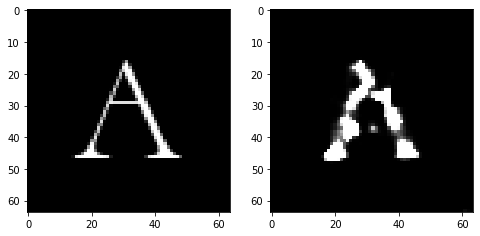

Epoch 3, Iteration 51, Loss D 28.22637128829956, Loss Disc 38.25239843130112, Loss L1 2.0179690197110176, Loss SSIM 3.073337733745575, Loss Local 228.20708513259888


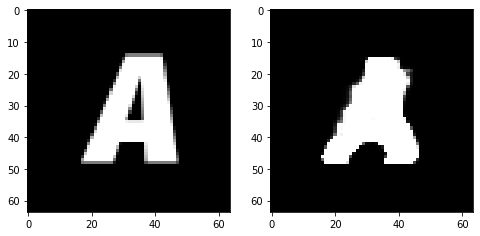

Epoch 3, Iteration 76, Loss D 21.203648924827576, Loss Disc 77.76715922355652, Loss L1 2.1096749678254128, Loss SSIM 3.3115052580833435, Loss Local 230.94927167892456


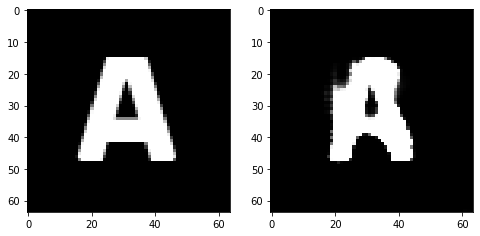

Epoch 3, Iteration 101, Loss D 25.832380563020706, Loss Disc 105.15811324119568, Loss L1 2.36285138130188, Loss SSIM 3.6126590967178345, Loss Local 260.66515016555786


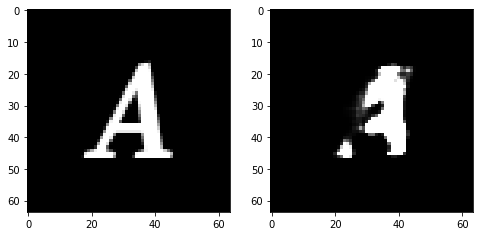

Epoch 3, Iteration 126, Loss D 18.92839479446411, Loss Disc 78.13996028900146, Loss L1 2.1919134855270386, Loss SSIM 3.4804901480674744, Loss Local 253.74496841430664


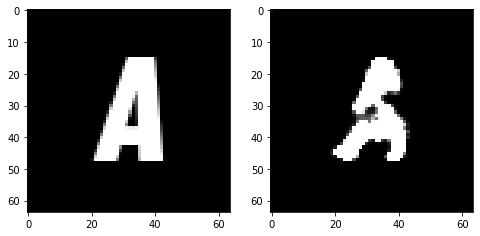

Epoch 3, Iteration 151, Loss D 16.094517052173615, Loss Disc 144.3617227077484, Loss L1 2.1547891423106194, Loss SSIM 3.4135531783103943, Loss Local 238.93436908721924


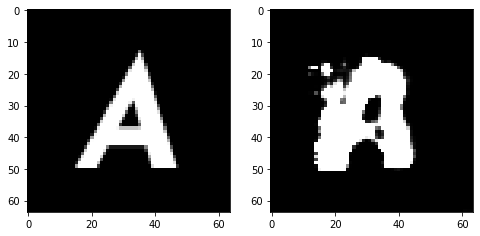

Epoch 3, Iteration 176, Loss D 33.22093164920807, Loss Disc 69.96279978752136, Loss L1 2.5659849494695663, Loss SSIM 3.9062209725379944, Loss Local 261.78559827804565


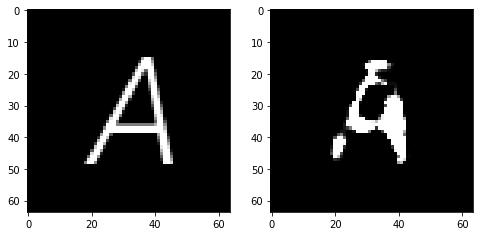

Epoch 4, Iteration 1, Loss D 0.12511155009269714, Loss Disc 4.8340277671813965, Loss L1 0.08305450528860092, Loss SSIM 0.10945916175842285, Loss Local 9.581059455871582


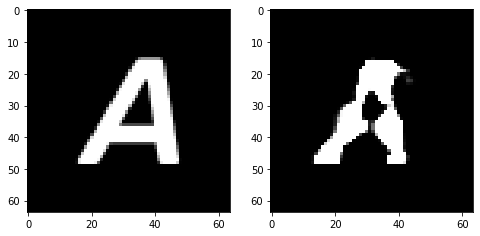

Epoch 4, Iteration 26, Loss D 36.54574504494667, Loss Disc 47.00337618589401, Loss L1 2.036728620529175, Loss SSIM 3.138776183128357, Loss Local 237.3294916152954


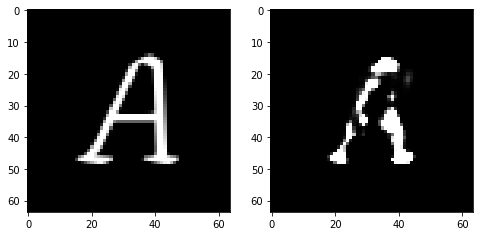

Epoch 4, Iteration 51, Loss D 37.260764360427856, Loss Disc 18.146985828876495, Loss L1 1.9673729613423347, Loss SSIM 2.9229637384414673, Loss Local 219.8967685699463


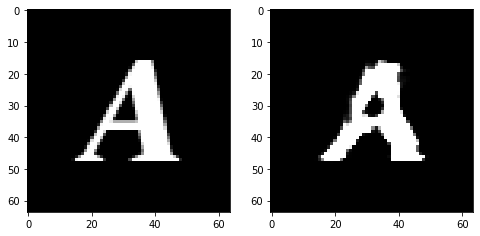

Epoch 4, Iteration 76, Loss D 34.657365798950195, Loss Disc 17.33914589881897, Loss L1 1.9759398847818375, Loss SSIM 2.9488829970359802, Loss Local 226.81978845596313


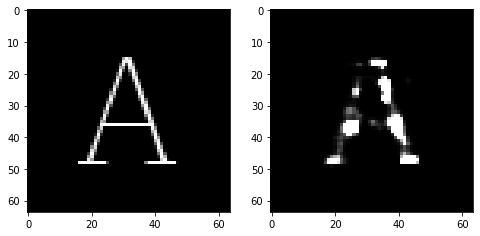

Epoch 4, Iteration 101, Loss D 34.65736377239227, Loss Disc 17.337893426418304, Loss L1 1.8880556002259254, Loss SSIM 2.719911217689514, Loss Local 211.9448938369751


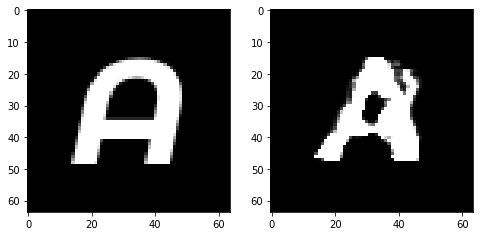

Epoch 4, Iteration 126, Loss D 34.657363533973694, Loss Disc 17.335706412792206, Loss L1 1.9531101733446121, Loss SSIM 2.897902488708496, Loss Local 219.7142457962036


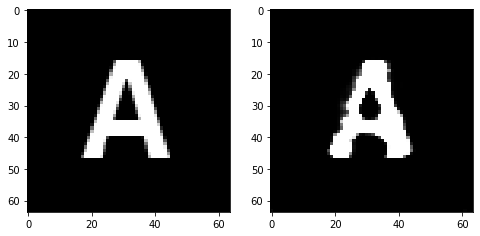

Epoch 4, Iteration 151, Loss D 34.65735995769501, Loss Disc 17.333921432495117, Loss L1 1.9543657675385475, Loss SSIM 2.884741425514221, Loss Local 220.762460231781


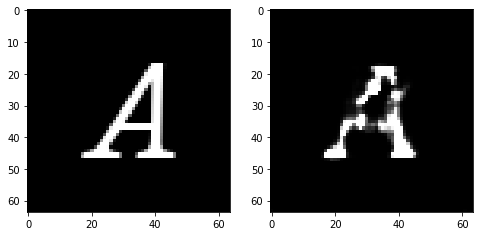

Epoch 4, Iteration 176, Loss D 34.657360196113586, Loss Disc 17.332562565803528, Loss L1 1.9106286019086838, Loss SSIM 2.7476710081100464, Loss Local 214.37673950195312


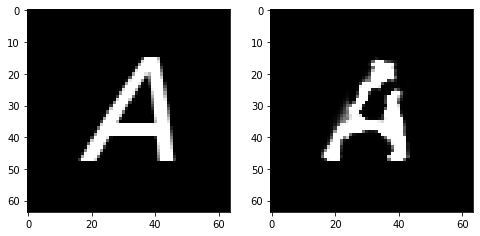

Epoch 5, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931557655334473, Loss L1 0.07023070007562637, Loss SSIM 0.10385584831237793, Loss Local 7.8647236824035645


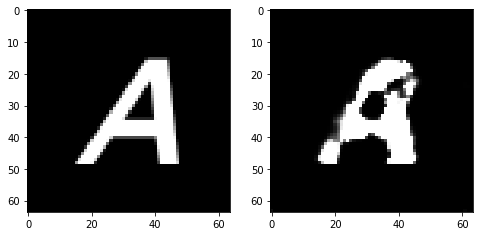

Epoch 5, Iteration 26, Loss D 34.657360315322876, Loss Disc 17.328860819339752, Loss L1 1.8750498071312904, Loss SSIM 2.708643138408661, Loss Local 210.45853757858276


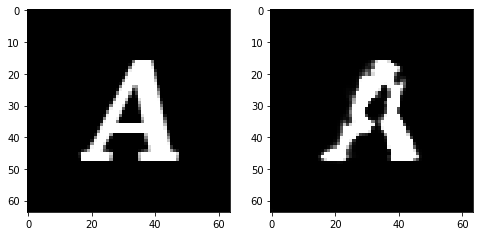

Epoch 5, Iteration 51, Loss D 34.657360553741455, Loss Disc 17.32880574464798, Loss L1 1.9330452159047127, Loss SSIM 2.759576439857483, Loss Local 210.22818803787231


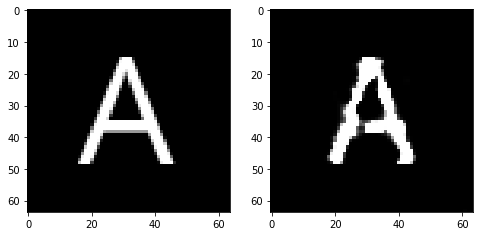

Epoch 5, Iteration 76, Loss D 34.657360553741455, Loss Disc 17.32876706123352, Loss L1 1.8631732761859894, Loss SSIM 2.6710174083709717, Loss Local 211.19610834121704


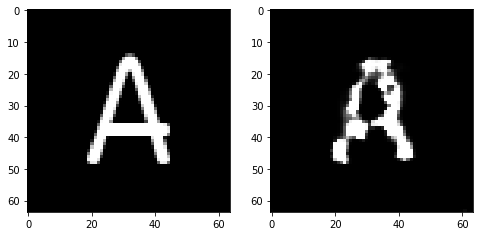

Epoch 5, Iteration 101, Loss D 34.657360196113586, Loss Disc 17.328739821910858, Loss L1 1.865827515721321, Loss SSIM 2.8056931495666504, Loss Local 196.9028182029724


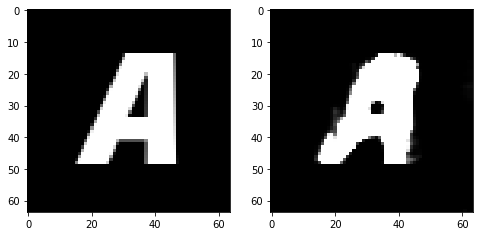

Epoch 5, Iteration 126, Loss D 34.657360553741455, Loss Disc 17.328721046447754, Loss L1 1.903542086482048, Loss SSIM 2.7737369537353516, Loss Local 218.20788955688477


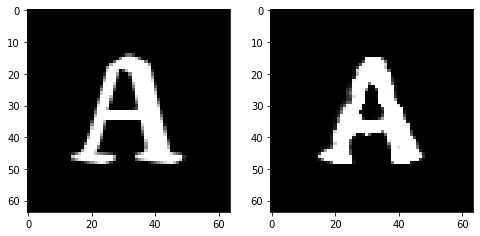

Epoch 5, Iteration 151, Loss D 34.657360196113586, Loss Disc 17.3287073969841, Loss L1 1.884872630238533, Loss SSIM 2.7071626782417297, Loss Local 218.7803177833557


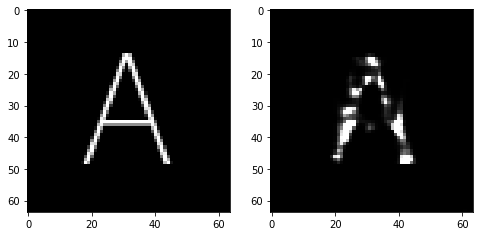

Epoch 5, Iteration 176, Loss D 34.657360911369324, Loss Disc 17.328699052333832, Loss L1 1.882142823189497, Loss SSIM 2.6747114658355713, Loss Local 199.75931692123413


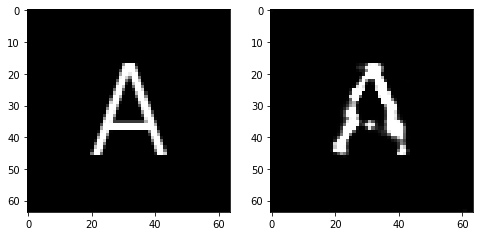

Epoch 6, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08366678655147552, Loss SSIM 0.12674665451049805, Loss Local 9.51829719543457


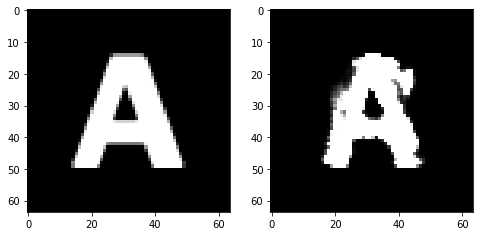

Epoch 6, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.87477208673954, Loss SSIM 2.703654408454895, Loss Local 211.69459104537964


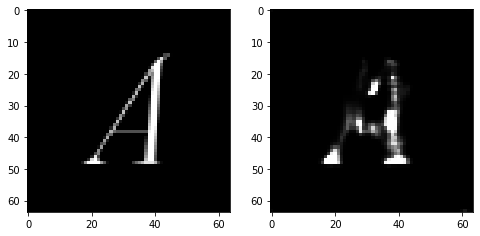

Epoch 6, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8894780427217484, Loss SSIM 2.746222972869873, Loss Local 216.61085557937622


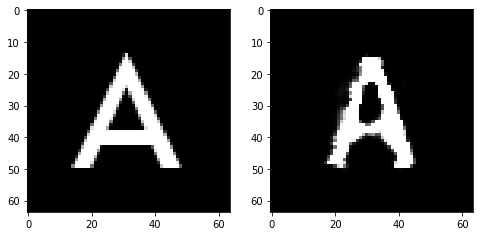

Epoch 6, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.897904921323061, Loss SSIM 2.7966122031211853, Loss Local 212.5727562904358


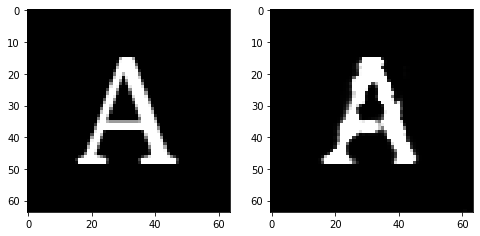

Epoch 6, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8988949805498123, Loss SSIM 2.687710702419281, Loss Local 222.58427906036377


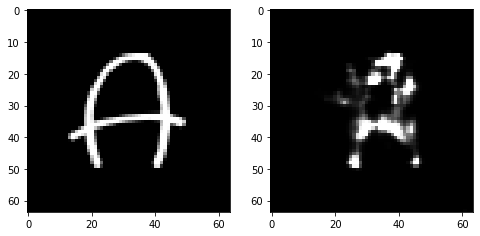

Epoch 6, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8881889283657074, Loss SSIM 2.761335849761963, Loss Local 208.3111720085144


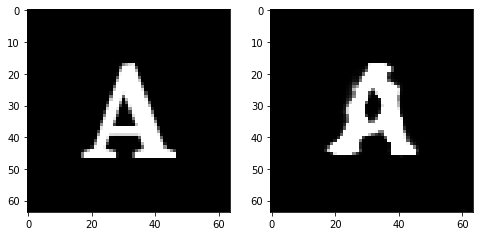

Epoch 6, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8047577738761902, Loss SSIM 2.6055803894996643, Loss Local 199.00420570373535


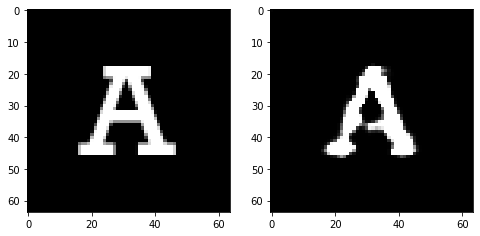

Epoch 6, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.9004381597042084, Loss SSIM 2.737800180912018, Loss Local 211.3479824066162


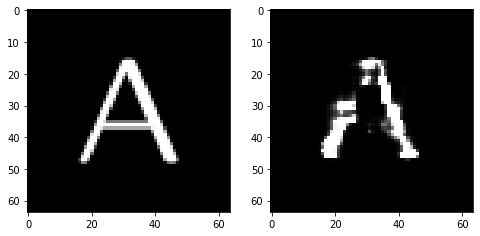

Epoch 7, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07489865273237228, Loss SSIM 0.09256291389465332, Loss Local 8.61997127532959


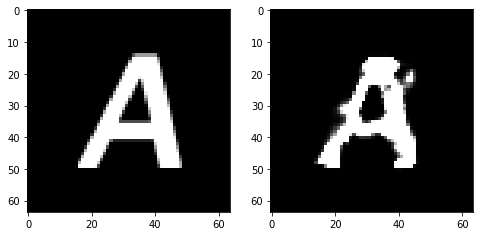

Epoch 7, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8305597677826881, Loss SSIM 2.5887566804885864, Loss Local 196.44892024993896


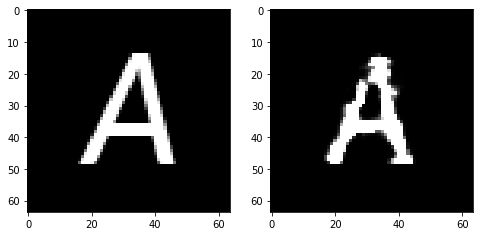

Epoch 7, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8520188629627228, Loss SSIM 2.6900582909584045, Loss Local 218.1094570159912


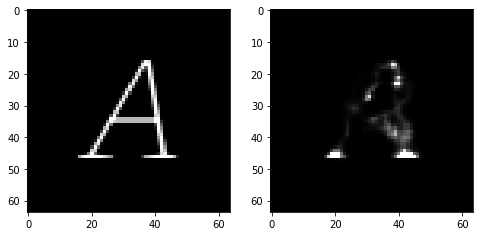

Epoch 7, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.9125022664666176, Loss SSIM 2.7570952773094177, Loss Local 208.891273021698


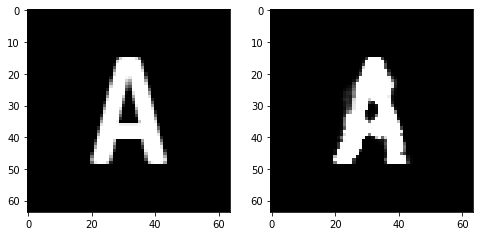

Epoch 7, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8546848595142365, Loss SSIM 2.6023016571998596, Loss Local 197.5515489578247


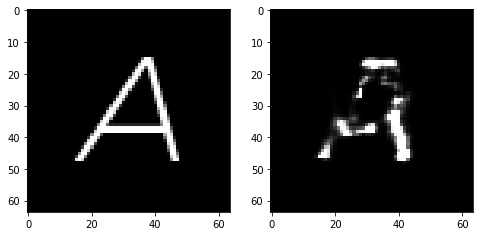

Epoch 7, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8840592131018639, Loss SSIM 2.7442002296447754, Loss Local 208.8760061264038


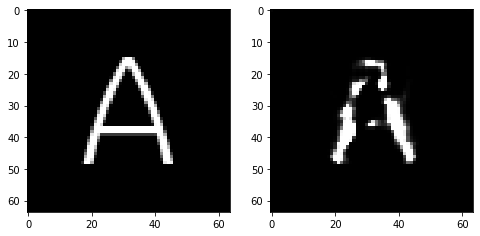

Epoch 7, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7825976386666298, Loss SSIM 2.5036652088165283, Loss Local 199.70996522903442


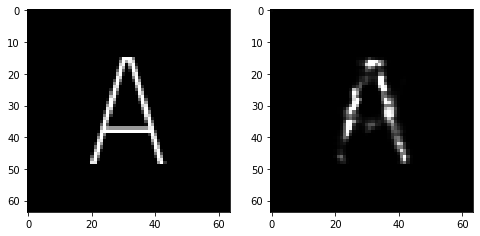

Epoch 7, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8488815166056156, Loss SSIM 2.6988407373428345, Loss Local 205.03078842163086


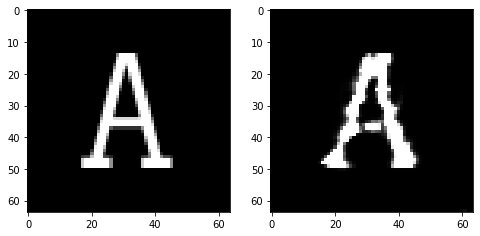

Epoch 8, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07825739681720734, Loss SSIM 0.11314332485198975, Loss Local 10.26069164276123


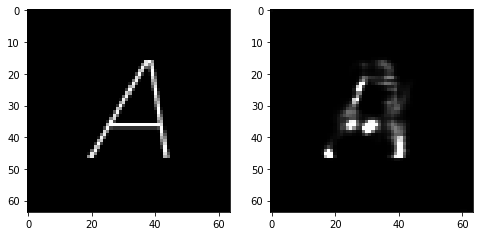

Epoch 8, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.801138237118721, Loss SSIM 2.5588720440864563, Loss Local 191.29118633270264


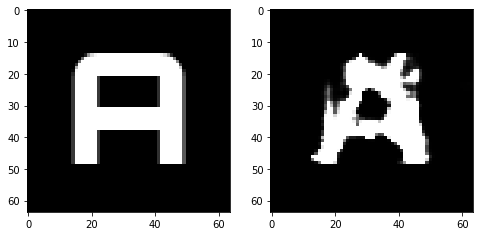

Epoch 8, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8395289406180382, Loss SSIM 2.6222487688064575, Loss Local 207.06064987182617


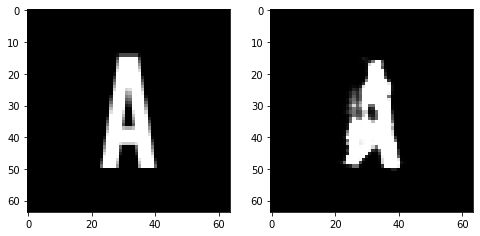

Epoch 8, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8707657977938652, Loss SSIM 2.708233892917633, Loss Local 212.41111516952515


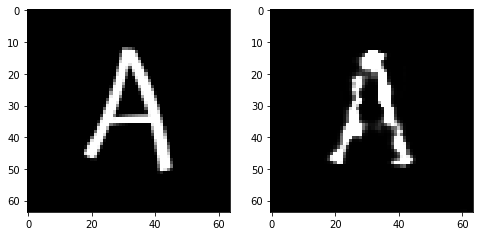

Epoch 8, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8273851051926613, Loss SSIM 2.5841280221939087, Loss Local 215.84357070922852


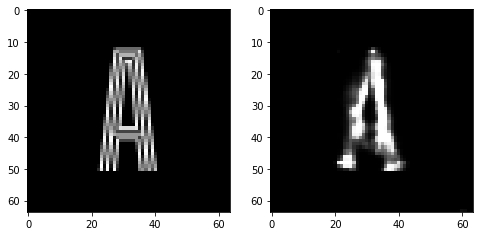

Epoch 8, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.831927478313446, Loss SSIM 2.6349337100982666, Loss Local 206.33294105529785


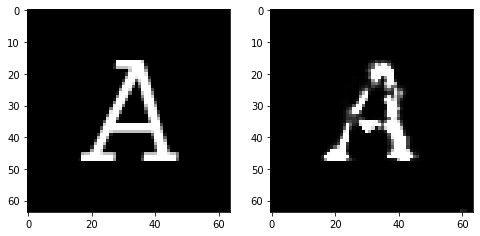

Epoch 8, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8587804585695267, Loss SSIM 2.6842162013053894, Loss Local 219.28280401229858


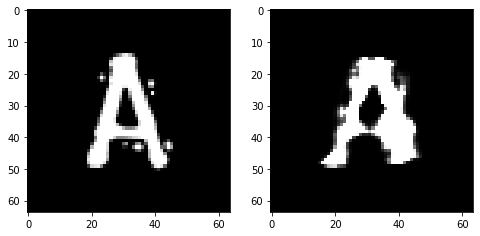

Epoch 8, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.882568970322609, Loss SSIM 2.661811649799347, Loss Local 208.6940999031067


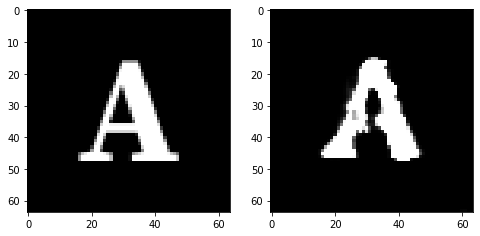

Epoch 9, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07596877962350845, Loss SSIM 0.11450517177581787, Loss Local 11.09768009185791


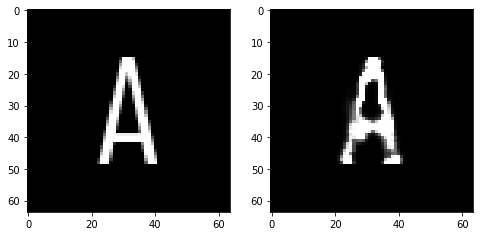

Epoch 9, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.839096873998642, Loss SSIM 2.6472280621528625, Loss Local 214.5434603691101


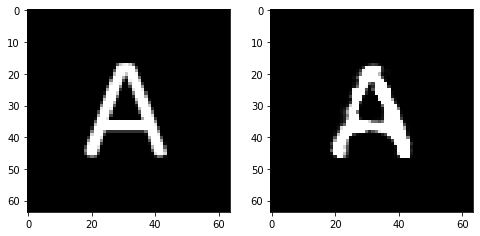

Epoch 9, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8149093426764011, Loss SSIM 2.6385262608528137, Loss Local 206.4205780029297


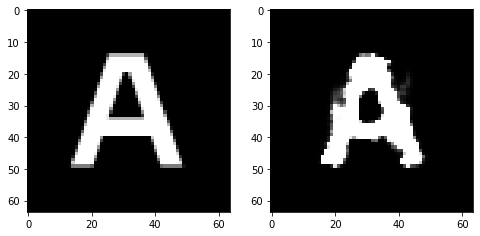

Epoch 9, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8336682803928852, Loss SSIM 2.6056586503982544, Loss Local 206.49254608154297


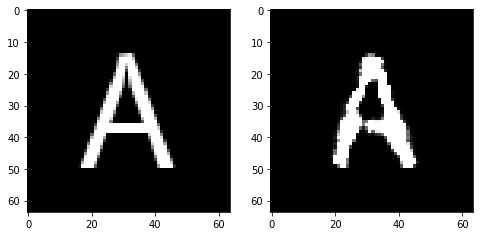

Epoch 9, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8611058630049229, Loss SSIM 2.689290702342987, Loss Local 216.89667224884033


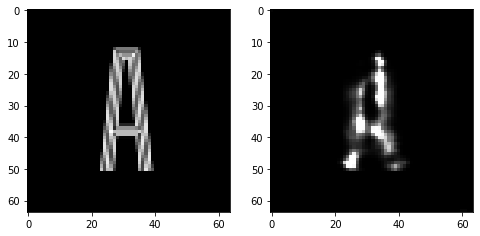

Epoch 9, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8487292379140854, Loss SSIM 2.707596719264984, Loss Local 212.38068389892578


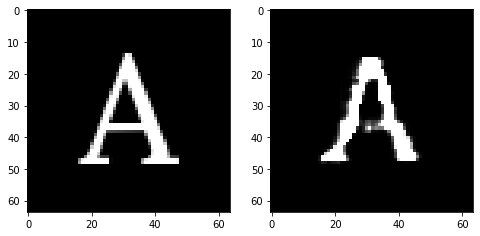

Epoch 9, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.83089030534029, Loss SSIM 2.562731981277466, Loss Local 207.10879182815552


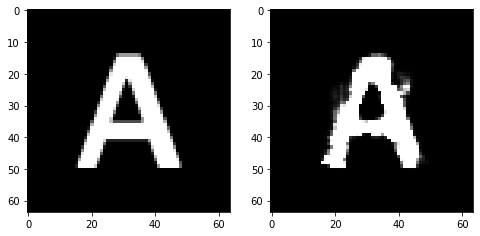

Epoch 9, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.877418726682663, Loss SSIM 2.609990358352661, Loss Local 204.95047521591187


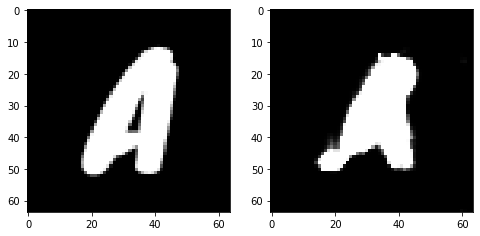

Epoch 10, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08026165515184402, Loss SSIM 0.12004166841506958, Loss Local 10.723895072937012


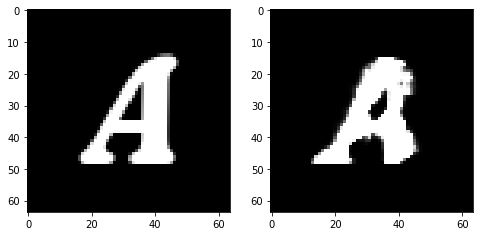

Epoch 10, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8594531454145908, Loss SSIM 2.6395496129989624, Loss Local 208.53500509262085


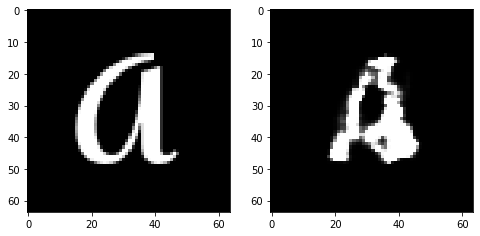

Epoch 10, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8654055297374725, Loss SSIM 2.6442925930023193, Loss Local 201.76918840408325


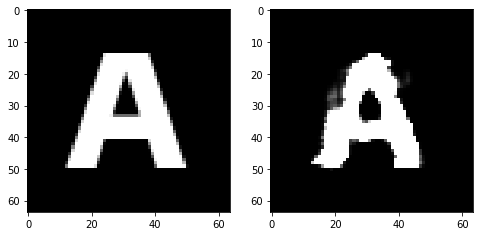

Epoch 10, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8224995359778404, Loss SSIM 2.639986574649811, Loss Local 220.45777988433838


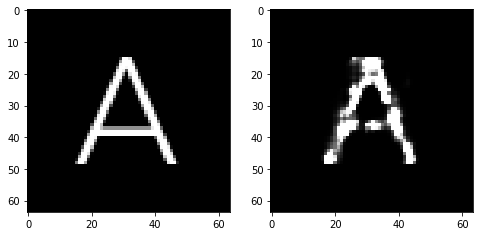

Epoch 10, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8088604025542736, Loss SSIM 2.607680380344391, Loss Local 212.16962242126465


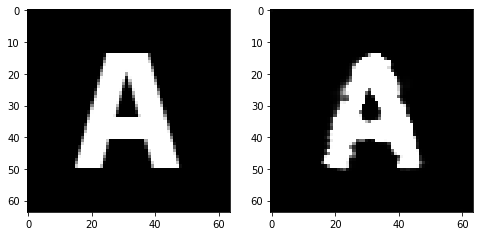

Epoch 10, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8019282035529613, Loss SSIM 2.5694148540496826, Loss Local 205.0542597770691


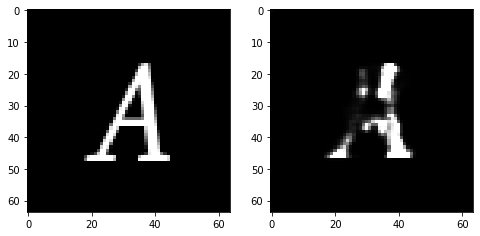

Epoch 10, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8231259174644947, Loss SSIM 2.568632960319519, Loss Local 201.887348651886


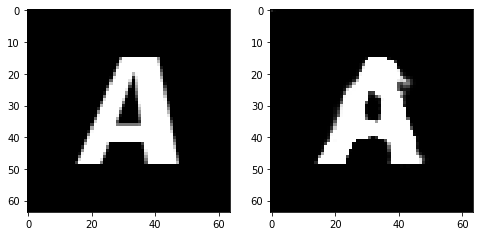

Epoch 10, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7907535806298256, Loss SSIM 2.518127918243408, Loss Local 200.83645725250244


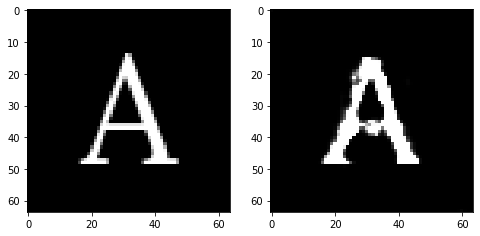

Epoch 11, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07338499277830124, Loss SSIM 0.10794919729232788, Loss Local 8.553306579589844


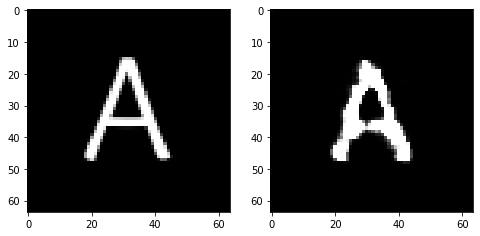

Epoch 11, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7800046168267727, Loss SSIM 2.548489809036255, Loss Local 200.72325086593628


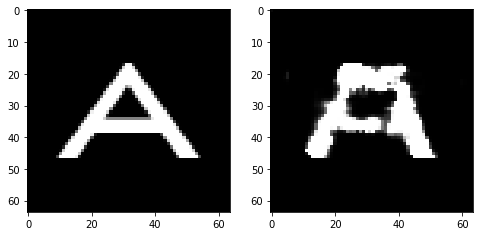

Epoch 11, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8304549343883991, Loss SSIM 2.6405268907546997, Loss Local 206.4338722229004


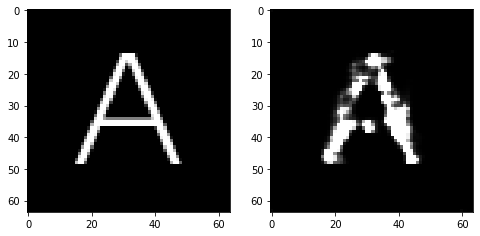

Epoch 11, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7931354828178883, Loss SSIM 2.5113720893859863, Loss Local 201.81378984451294


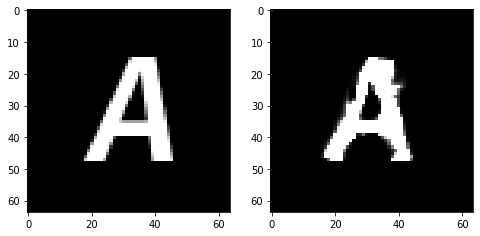

Epoch 11, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8156384266912937, Loss SSIM 2.5801130533218384, Loss Local 199.23562717437744


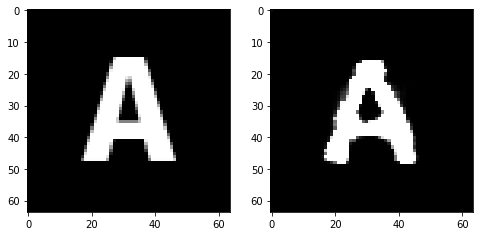

Epoch 11, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8236820548772812, Loss SSIM 2.5973228216171265, Loss Local 202.42062187194824


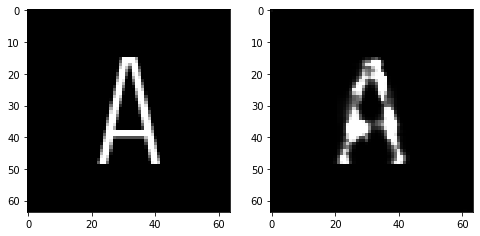

Epoch 11, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8595836497843266, Loss SSIM 2.62476509809494, Loss Local 208.7657971382141


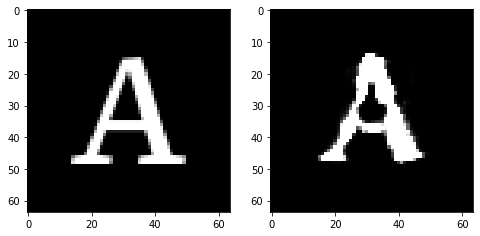

Epoch 11, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8074811324477196, Loss SSIM 2.569374918937683, Loss Local 204.5088438987732


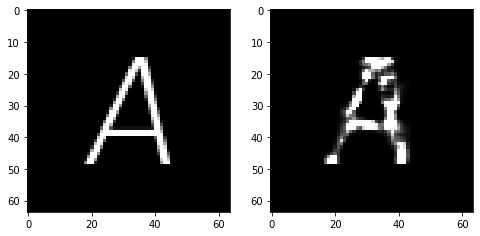

Epoch 12, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06363316625356674, Loss SSIM 0.08720797300338745, Loss Local 8.636856079101562


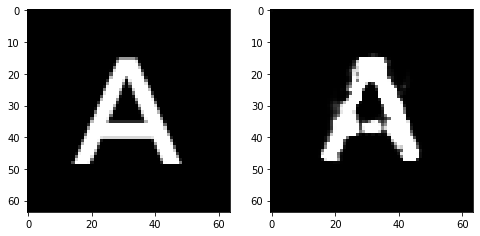

Epoch 12, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8435871005058289, Loss SSIM 2.622641682624817, Loss Local 212.8744306564331


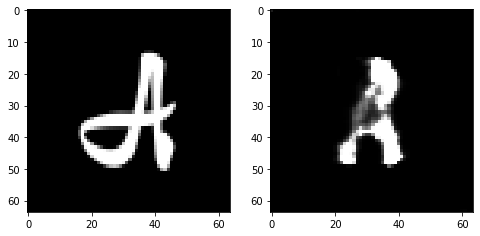

Epoch 12, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8003658652305603, Loss SSIM 2.597586512565613, Loss Local 194.59807872772217


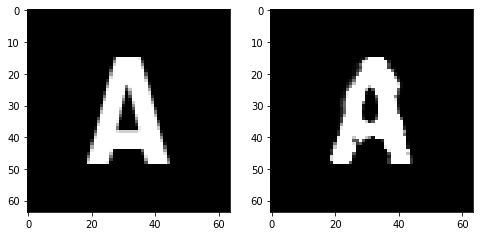

Epoch 12, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7792840078473091, Loss SSIM 2.532934546470642, Loss Local 190.42401313781738


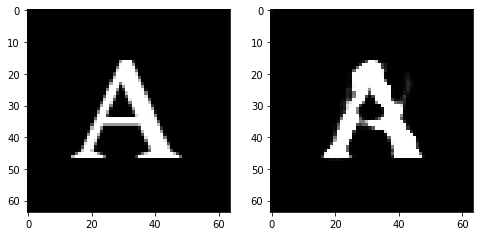

Epoch 12, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8656151741743088, Loss SSIM 2.6459843516349792, Loss Local 206.45627689361572


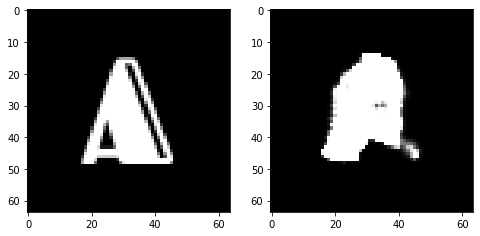

Epoch 12, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7537494860589504, Loss SSIM 2.4295339584350586, Loss Local 193.41235303878784


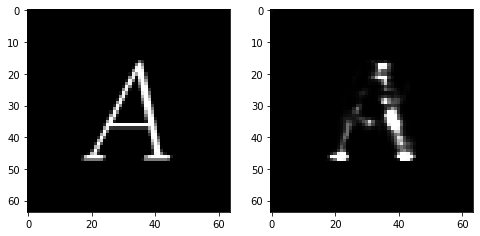

Epoch 12, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8435236774384975, Loss SSIM 2.6223825812339783, Loss Local 209.03236532211304


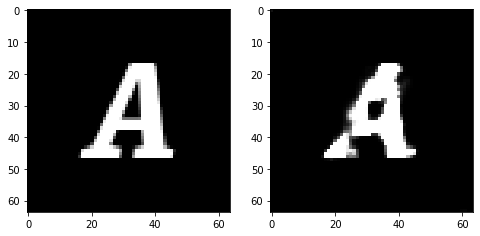

Epoch 12, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.822211254388094, Loss SSIM 2.607143819332123, Loss Local 208.1177101135254


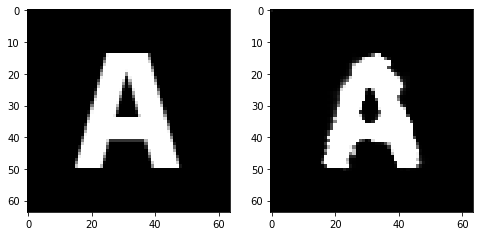

Epoch 13, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06580235064029694, Loss SSIM 0.08720088005065918, Loss Local 7.141826629638672


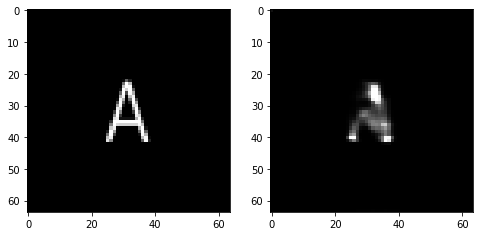

Epoch 13, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8379473984241486, Loss SSIM 2.5972177982330322, Loss Local 201.50462245941162


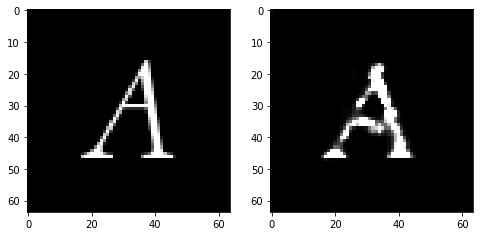

Epoch 13, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8153167888522148, Loss SSIM 2.532158672809601, Loss Local 211.0600814819336


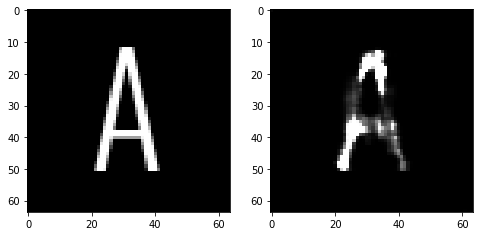

Epoch 13, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8011507615447044, Loss SSIM 2.5095792412757874, Loss Local 201.63293027877808


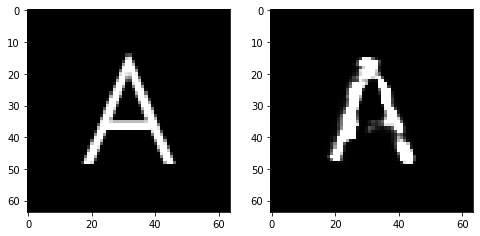

Epoch 13, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.795518845319748, Loss SSIM 2.5232024788856506, Loss Local 207.6465883255005


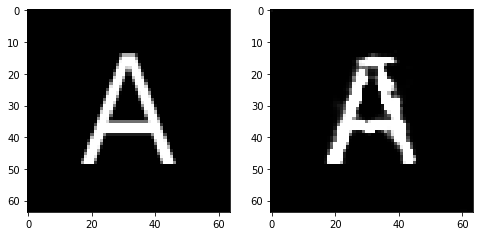

Epoch 13, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.744983747601509, Loss SSIM 2.408466339111328, Loss Local 193.04425859451294


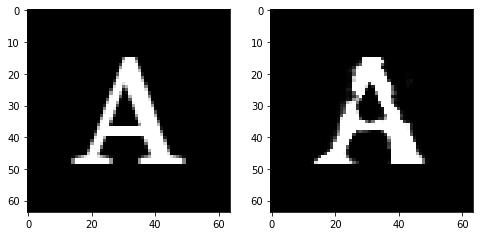

Epoch 13, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8061554357409477, Loss SSIM 2.6091869473457336, Loss Local 199.0377721786499


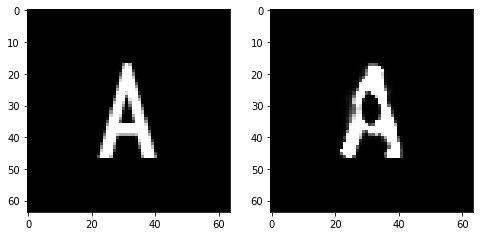

Epoch 13, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8092210181057453, Loss SSIM 2.644122362136841, Loss Local 214.1539511680603


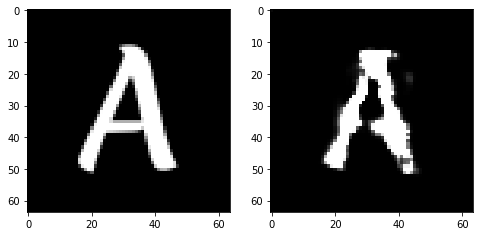

Epoch 14, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08078990876674652, Loss SSIM 0.12994515895843506, Loss Local 9.657442092895508


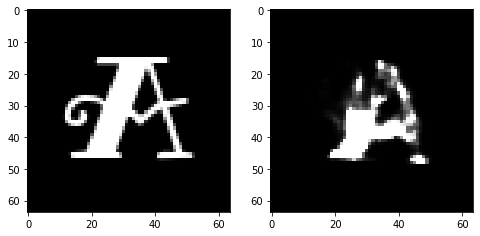

Epoch 14, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8020486421883106, Loss SSIM 2.53126722574234, Loss Local 213.29251337051392


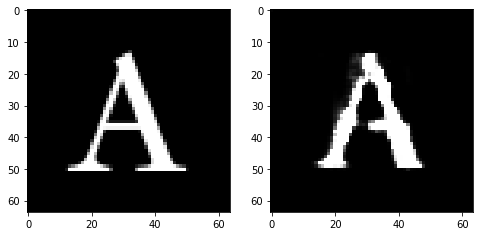

Epoch 14, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7584483847022057, Loss SSIM 2.3600043654441833, Loss Local 195.72865676879883


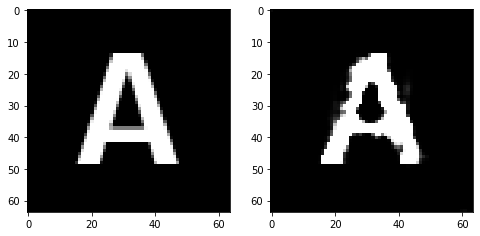

Epoch 14, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7856345027685165, Loss SSIM 2.5123311281204224, Loss Local 201.90466737747192


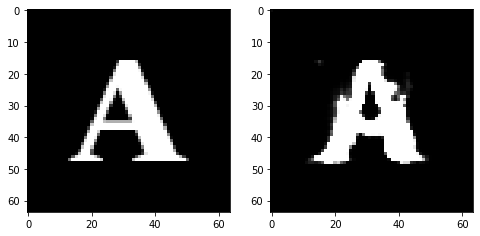

Epoch 14, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8201796673238277, Loss SSIM 2.587244391441345, Loss Local 202.32215118408203


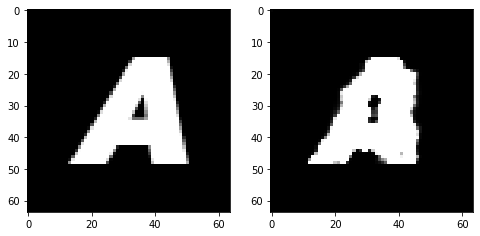

Epoch 14, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8424201719462872, Loss SSIM 2.66726416349411, Loss Local 206.96153116226196


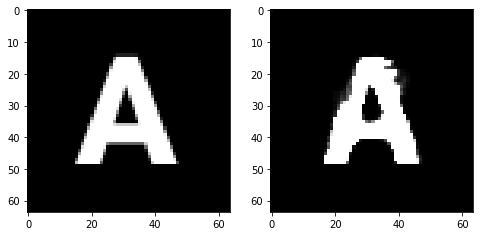

Epoch 14, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7787393108010292, Loss SSIM 2.549084722995758, Loss Local 208.81880283355713


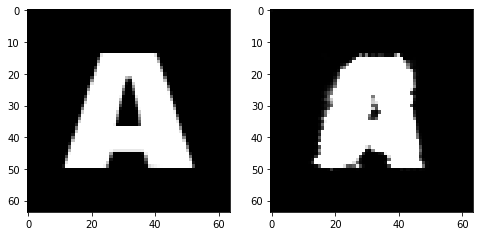

Epoch 14, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7699713185429573, Loss SSIM 2.513082981109619, Loss Local 203.22244215011597


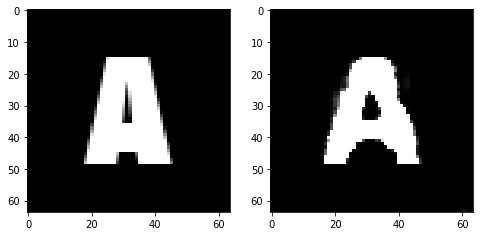

Epoch 15, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06906818598508835, Loss SSIM 0.10620075464248657, Loss Local 9.022162437438965


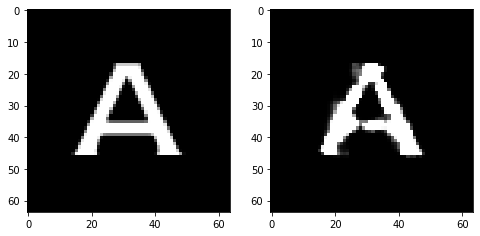

Epoch 15, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7326371893286705, Loss SSIM 2.4296706318855286, Loss Local 198.16070938110352


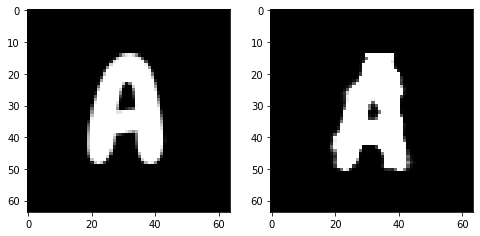

Epoch 15, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7189886420965195, Loss SSIM 2.462758719921112, Loss Local 191.3730616569519


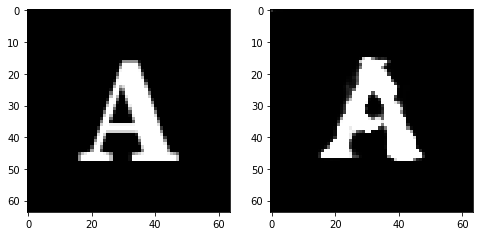

Epoch 15, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7959854193031788, Loss SSIM 2.5276666283607483, Loss Local 201.32270097732544


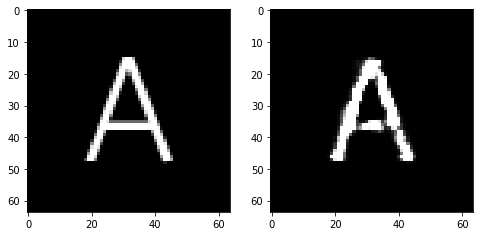

Epoch 15, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8597790002822876, Loss SSIM 2.626089572906494, Loss Local 196.59820985794067


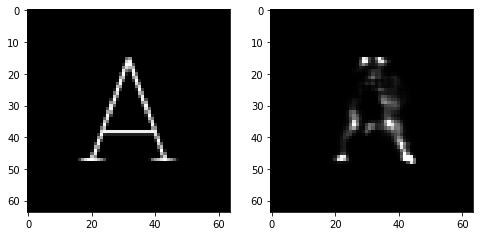

Epoch 15, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8188211135566235, Loss SSIM 2.628038167953491, Loss Local 211.10177516937256


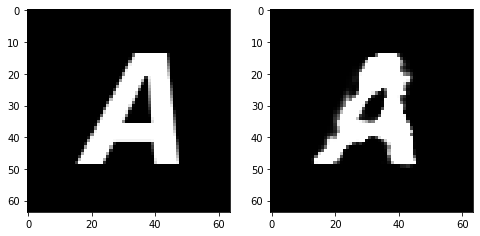

Epoch 15, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.856606736779213, Loss SSIM 2.65620493888855, Loss Local 198.0831060409546


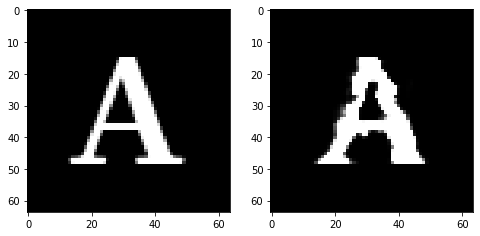

Epoch 15, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.740634597837925, Loss SSIM 2.336973547935486, Loss Local 191.13527584075928


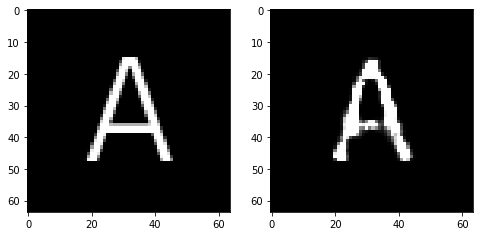

Epoch 16, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07600734382867813, Loss SSIM 0.10820680856704712, Loss Local 8.806212425231934


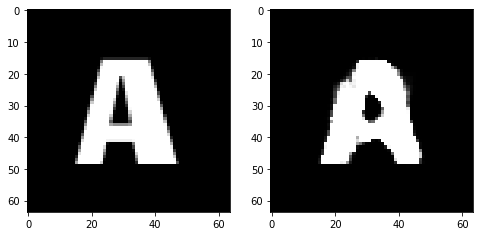

Epoch 16, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8307447172701359, Loss SSIM 2.5924095511436462, Loss Local 209.71392440795898


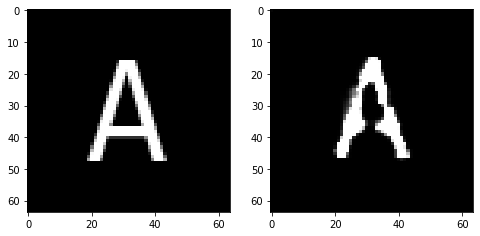

Epoch 16, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7591699287295341, Loss SSIM 2.4841615557670593, Loss Local 198.4092092514038


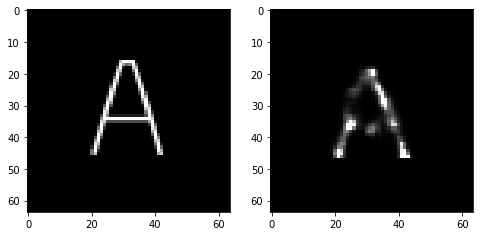

Epoch 16, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7524404749274254, Loss SSIM 2.4567756056785583, Loss Local 200.85227155685425


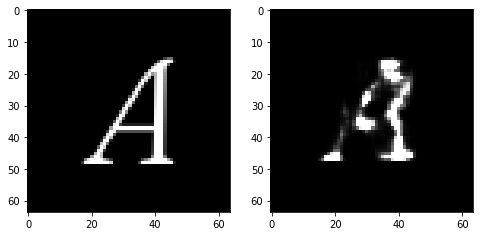

Epoch 16, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7226908169686794, Loss SSIM 2.415690064430237, Loss Local 205.79173612594604


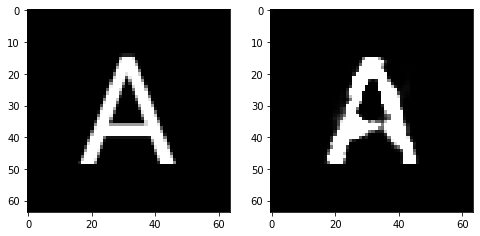

Epoch 16, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.809848841279745, Loss SSIM 2.537441909313202, Loss Local 215.10359621047974


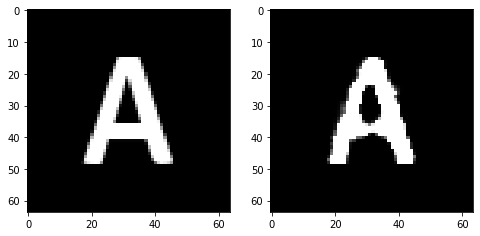

Epoch 16, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8047834746539593, Loss SSIM 2.551369607448578, Loss Local 199.68962287902832


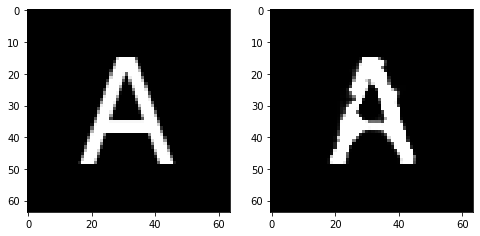

Epoch 16, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7886270955204964, Loss SSIM 2.5206989645957947, Loss Local 195.91026830673218


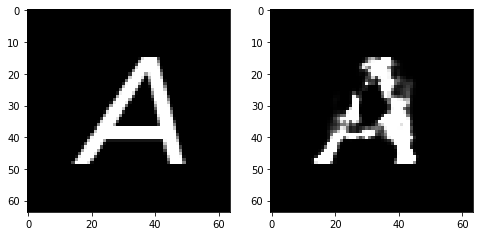

Epoch 17, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08110816776752472, Loss SSIM 0.12543779611587524, Loss Local 8.958133697509766


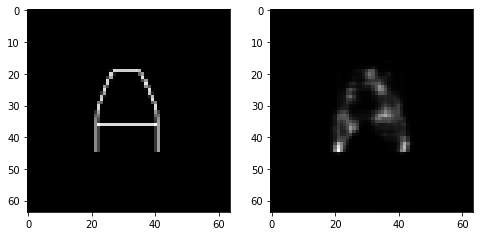

Epoch 17, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8060984052717686, Loss SSIM 2.5869168639183044, Loss Local 209.8346724510193


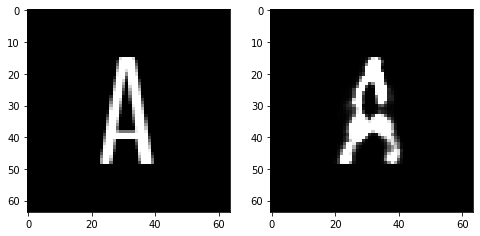

Epoch 17, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7329575717449188, Loss SSIM 2.411594867706299, Loss Local 198.35331392288208


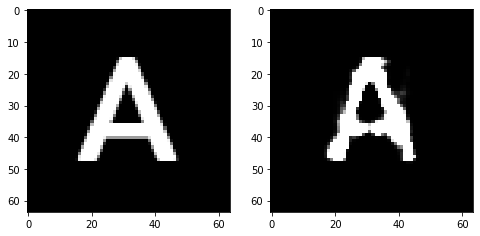

Epoch 17, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7521880567073822, Loss SSIM 2.4272443652153015, Loss Local 199.00478601455688


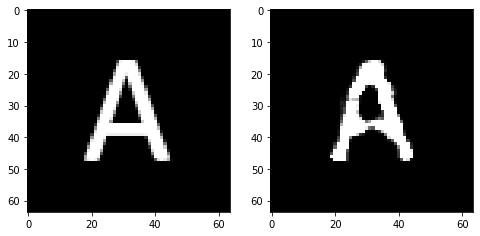

Epoch 17, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7820878475904465, Loss SSIM 2.5225666165351868, Loss Local 201.4640884399414


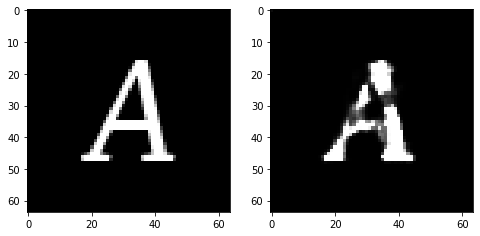

Epoch 17, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8241813741624355, Loss SSIM 2.5643686056137085, Loss Local 205.4592022895813


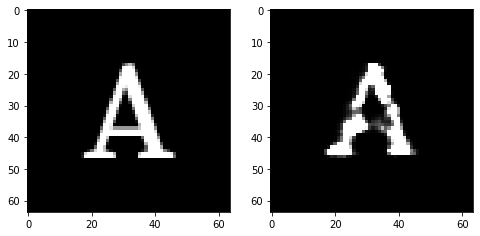

Epoch 17, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7454019822180271, Loss SSIM 2.446726679801941, Loss Local 197.11767482757568


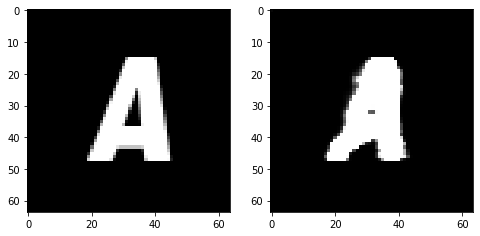

Epoch 17, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7983733229339123, Loss SSIM 2.500615179538727, Loss Local 201.2896614074707


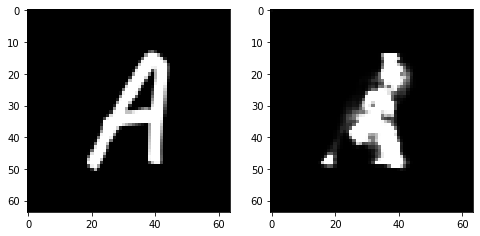

Epoch 18, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06888926774263382, Loss SSIM 0.0917317271232605, Loss Local 7.233308792114258


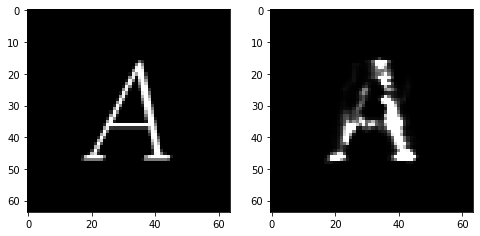

Epoch 18, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7733117640018463, Loss SSIM 2.5303975343704224, Loss Local 205.2953667640686


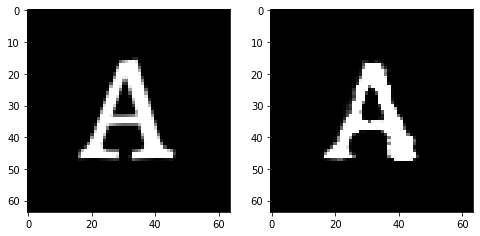

Epoch 18, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7981074526906013, Loss SSIM 2.5330207347869873, Loss Local 208.85640335083008


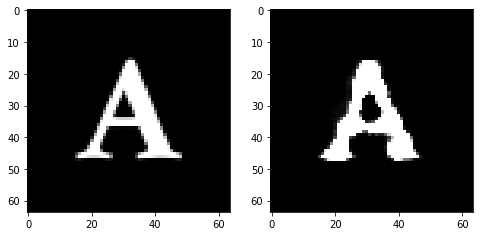

Epoch 18, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8087701499462128, Loss SSIM 2.5442965030670166, Loss Local 207.1162691116333


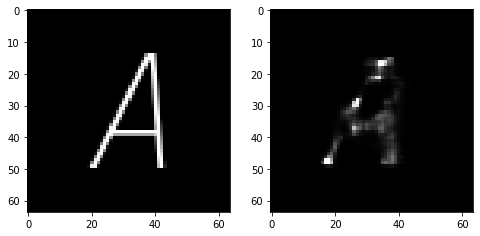

Epoch 18, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7529925219714642, Loss SSIM 2.4510721564292908, Loss Local 202.5222954750061


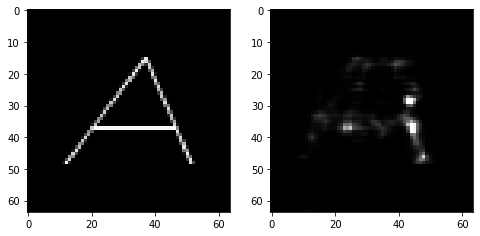

Epoch 18, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7676019296050072, Loss SSIM 2.4776384234428406, Loss Local 203.77465200424194


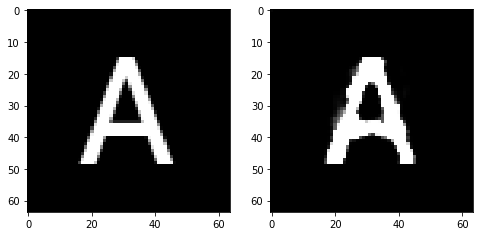

Epoch 18, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7620297707617283, Loss SSIM 2.4681963324546814, Loss Local 189.28145170211792


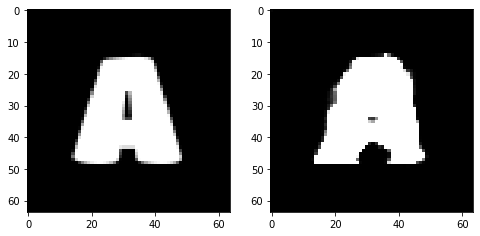

Epoch 18, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.788781188428402, Loss SSIM 2.491061270236969, Loss Local 203.46751832962036


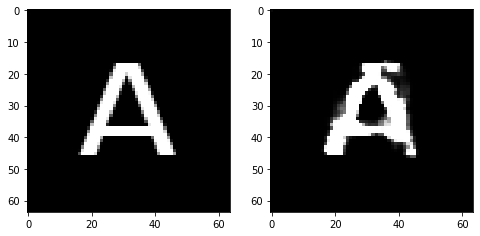

Epoch 19, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06950031220912933, Loss SSIM 0.09467488527297974, Loss Local 7.023277282714844


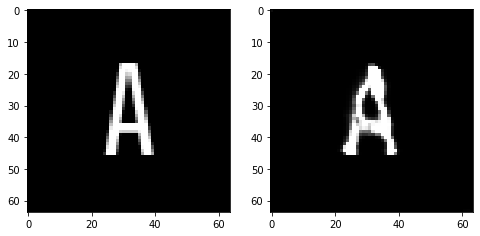

Epoch 19, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.807483710348606, Loss SSIM 2.5375778675079346, Loss Local 204.46327781677246


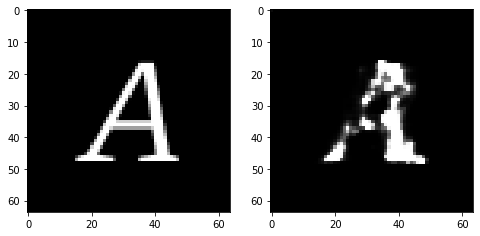

Epoch 19, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.76394297555089, Loss SSIM 2.4350850582122803, Loss Local 190.78788375854492


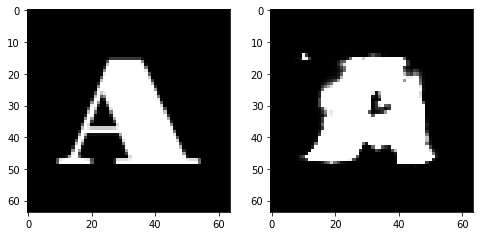

Epoch 19, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.744981549680233, Loss SSIM 2.4732008576393127, Loss Local 192.0433087348938


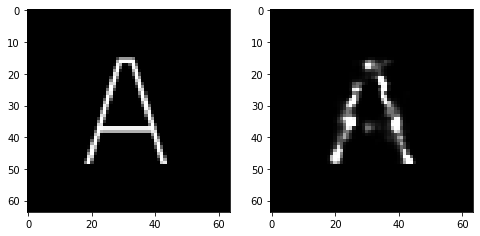

Epoch 19, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7312141135334969, Loss SSIM 2.3660876154899597, Loss Local 200.10947847366333


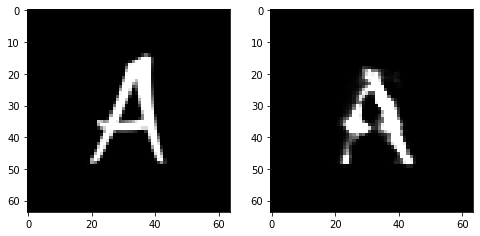

Epoch 19, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7366611137986183, Loss SSIM 2.494808793067932, Loss Local 197.67422103881836


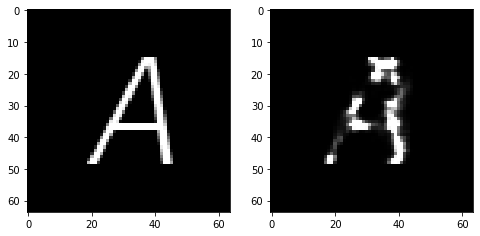

Epoch 19, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7892326153814793, Loss SSIM 2.4927541613578796, Loss Local 194.48995208740234


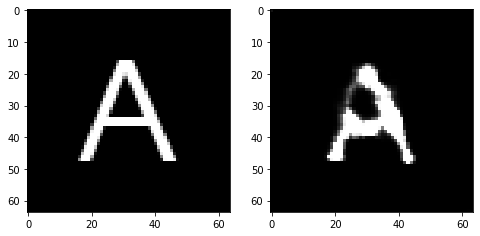

Epoch 19, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7615936882793903, Loss SSIM 2.491901218891144, Loss Local 200.17861652374268


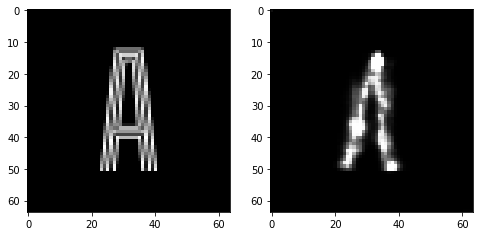

Epoch 20, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07106515020132065, Loss SSIM 0.1082463264465332, Loss Local 9.196720123291016


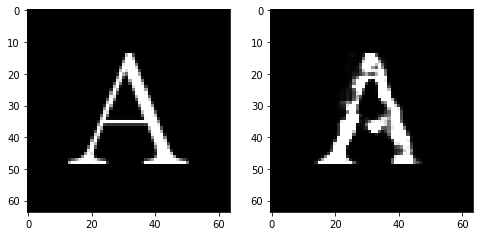

Epoch 20, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.746481530368328, Loss SSIM 2.4671347737312317, Loss Local 193.28734254837036


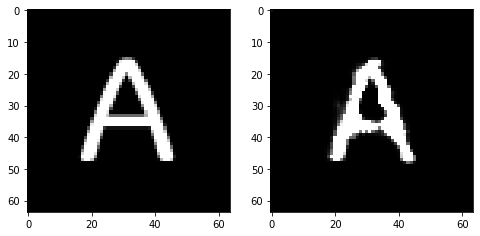

Epoch 20, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7319444008171558, Loss SSIM 2.4627434611320496, Loss Local 193.74383354187012


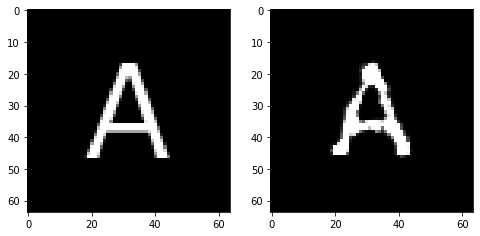

Epoch 20, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7333255745470524, Loss SSIM 2.4247725009918213, Loss Local 201.66197633743286


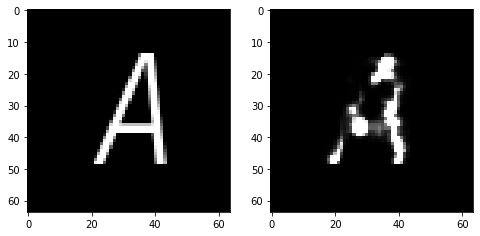

Epoch 20, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.776756290346384, Loss SSIM 2.451769709587097, Loss Local 190.9742841720581


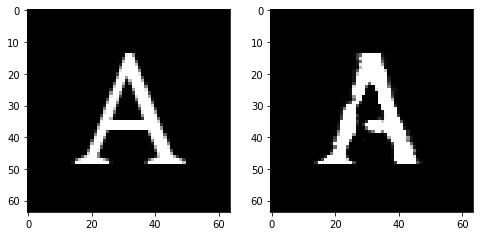

Epoch 20, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.802989799529314, Loss SSIM 2.4789265394210815, Loss Local 201.27900791168213


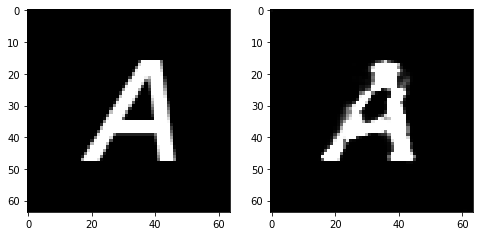

Epoch 20, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7744403034448624, Loss SSIM 2.4727237224578857, Loss Local 205.95604991912842


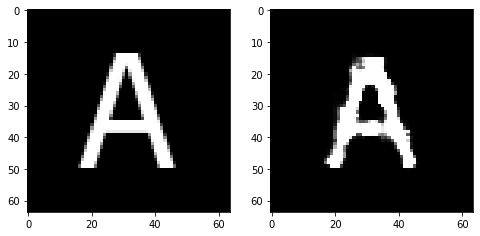

Epoch 20, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.764296118170023, Loss SSIM 2.497650384902954, Loss Local 207.49075841903687


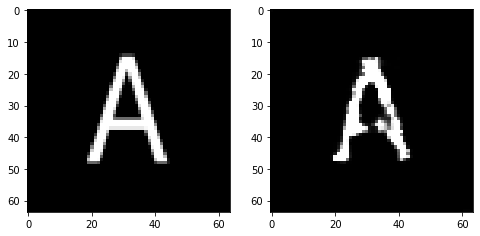

Epoch 21, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06440331786870956, Loss SSIM 0.09997057914733887, Loss Local 7.325260639190674


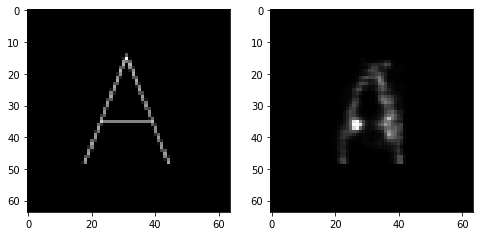

Epoch 21, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7709447219967842, Loss SSIM 2.4751039147377014, Loss Local 190.20698356628418


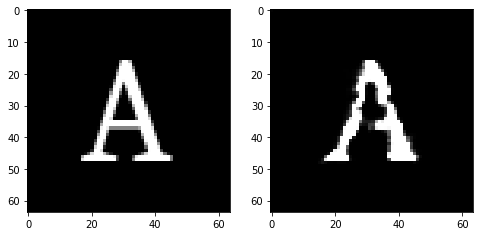

Epoch 21, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7524591870605946, Loss SSIM 2.4705695509910583, Loss Local 203.83716535568237


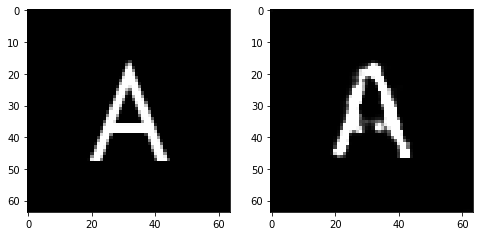

Epoch 21, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8127619326114655, Loss SSIM 2.6046245098114014, Loss Local 212.8111448287964


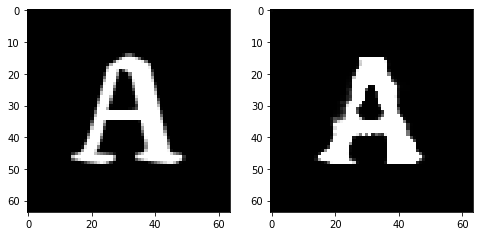

Epoch 21, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7584223337471485, Loss SSIM 2.4306781888008118, Loss Local 201.72791576385498


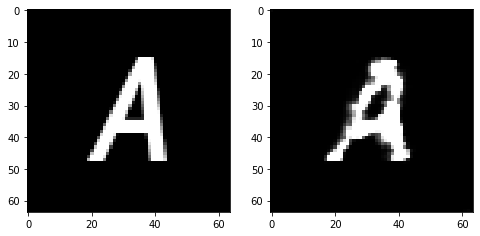

Epoch 21, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7829289212822914, Loss SSIM 2.5097071528434753, Loss Local 204.2057056427002


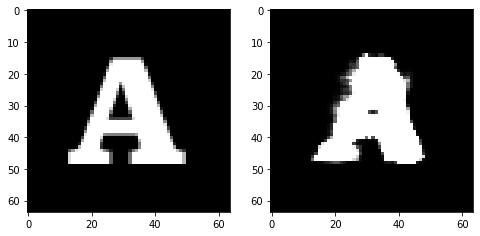

Epoch 21, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.72799788787961, Loss SSIM 2.3476412296295166, Loss Local 191.54034328460693


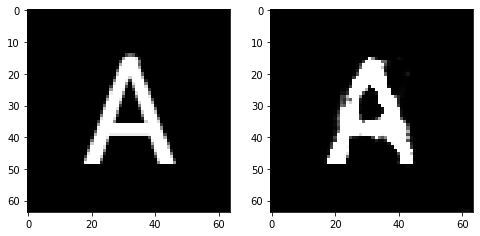

Epoch 21, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7467349395155907, Loss SSIM 2.457626521587372, Loss Local 184.36566019058228


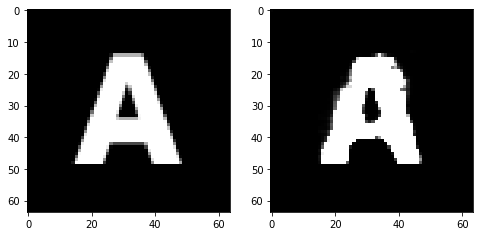

Epoch 22, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07666502892971039, Loss SSIM 0.11192077398300171, Loss Local 7.551159381866455


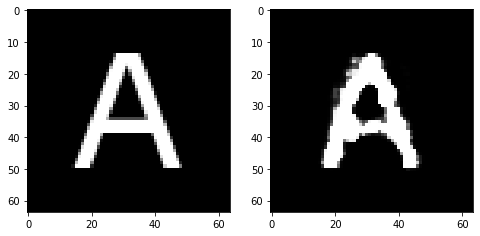

Epoch 22, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7988799177110195, Loss SSIM 2.538406252861023, Loss Local 195.8146357536316


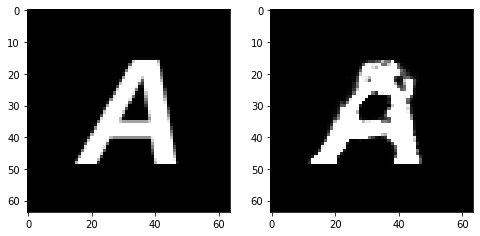

Epoch 22, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7629626467823982, Loss SSIM 2.4226489067077637, Loss Local 192.17055702209473


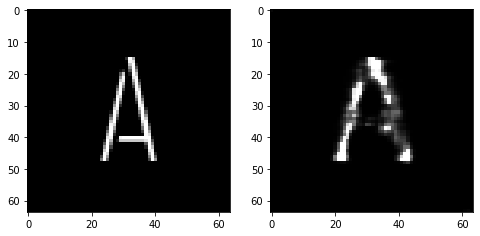

Epoch 22, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7910902760922909, Loss SSIM 2.5146303176879883, Loss Local 204.6445255279541


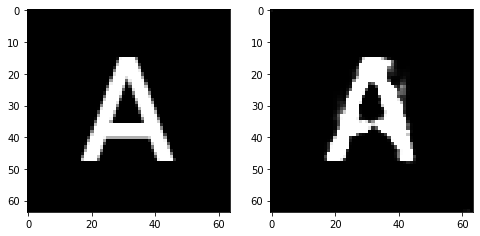

Epoch 22, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7251955904066563, Loss SSIM 2.395878791809082, Loss Local 197.92085075378418


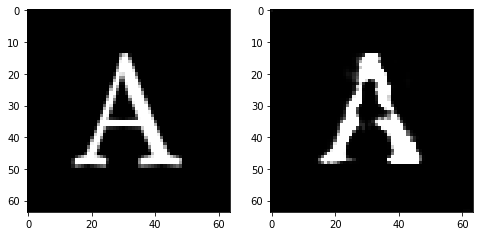

Epoch 22, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7256958186626434, Loss SSIM 2.3826778531074524, Loss Local 194.41740083694458


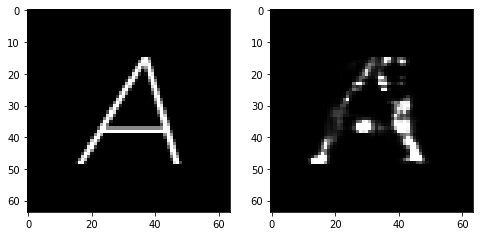

Epoch 22, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7796000763773918, Loss SSIM 2.5170310139656067, Loss Local 198.1918067932129


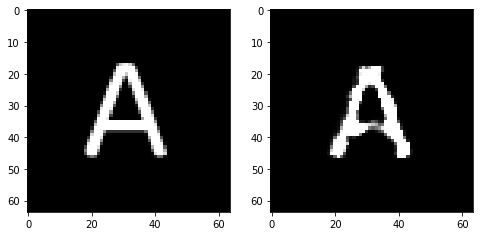

Epoch 22, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7437917739152908, Loss SSIM 2.447810411453247, Loss Local 204.1846718788147


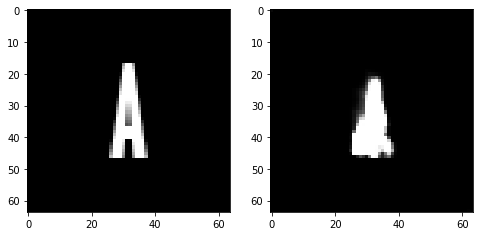

Epoch 23, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07400447875261307, Loss SSIM 0.10258221626281738, Loss Local 7.756834506988525


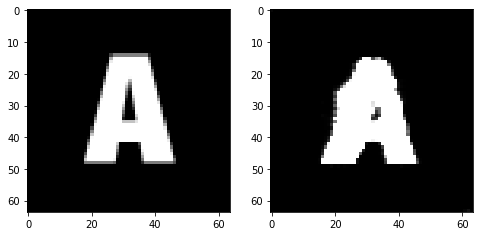

Epoch 23, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8082118295133114, Loss SSIM 2.543575942516327, Loss Local 205.69793176651


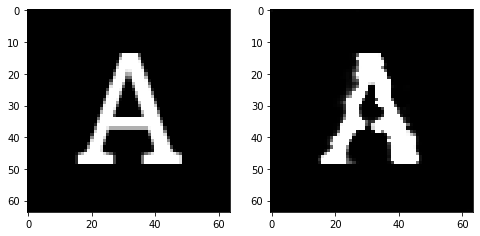

Epoch 23, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.756632063537836, Loss SSIM 2.4969329833984375, Loss Local 197.54383420944214


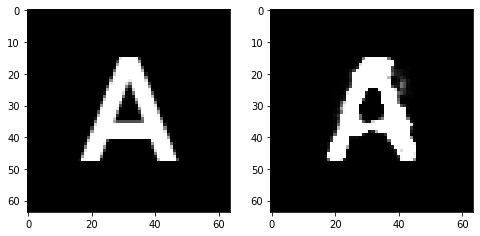

Epoch 23, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.786892518401146, Loss SSIM 2.489262640476227, Loss Local 199.1799921989441


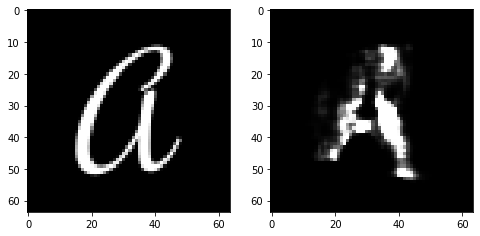

Epoch 23, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.776325587183237, Loss SSIM 2.4552533626556396, Loss Local 194.68717336654663


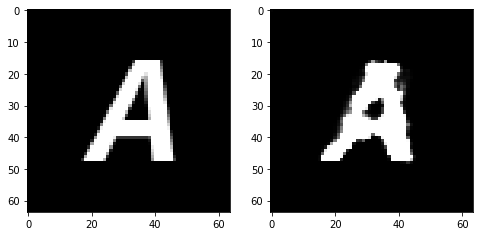

Epoch 23, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7033310607075691, Loss SSIM 2.3522481322288513, Loss Local 197.07145977020264


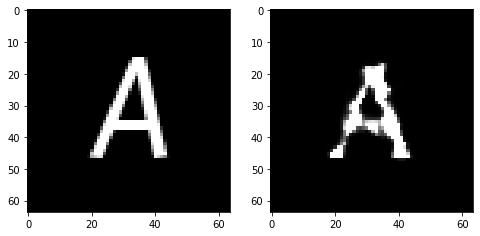

Epoch 23, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.728811964392662, Loss SSIM 2.3839901089668274, Loss Local 189.77660179138184


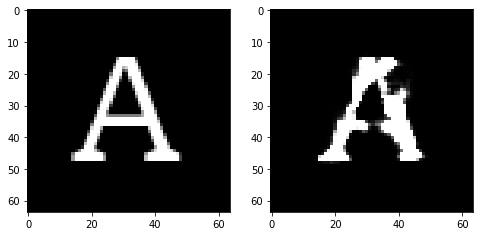

Epoch 23, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.795829564332962, Loss SSIM 2.596426010131836, Loss Local 198.98221588134766


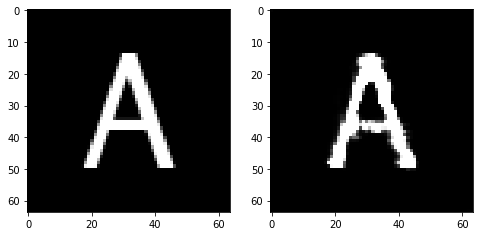

Epoch 24, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.061810605227947235, Loss SSIM 0.07783830165863037, Loss Local 5.412650108337402


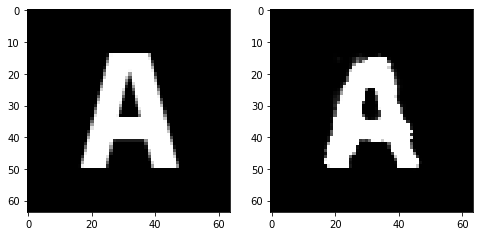

Epoch 24, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7519762143492699, Loss SSIM 2.412686765193939, Loss Local 197.79741191864014


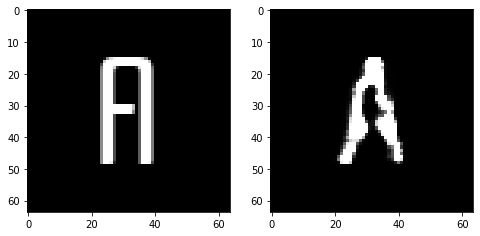

Epoch 24, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7854592874646187, Loss SSIM 2.51040917634964, Loss Local 201.93435096740723


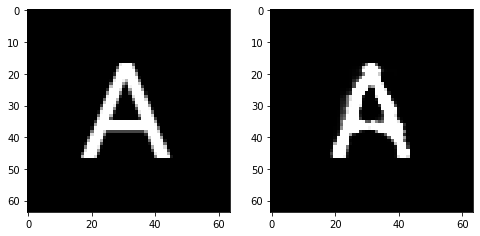

Epoch 24, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8212009407579899, Loss SSIM 2.5783902406692505, Loss Local 203.2500524520874


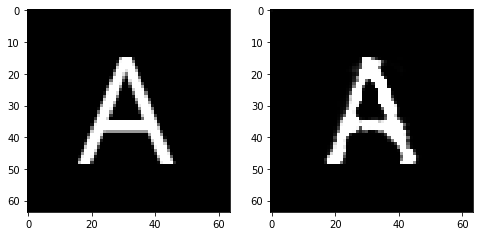

Epoch 24, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7078970819711685, Loss SSIM 2.383742570877075, Loss Local 193.42553567886353


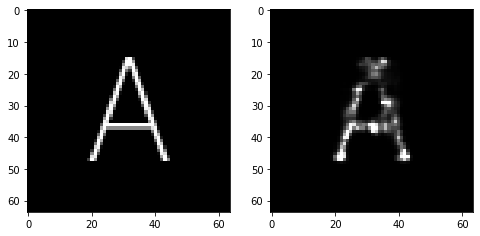

Epoch 24, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7693844586610794, Loss SSIM 2.482206344604492, Loss Local 205.38317441940308


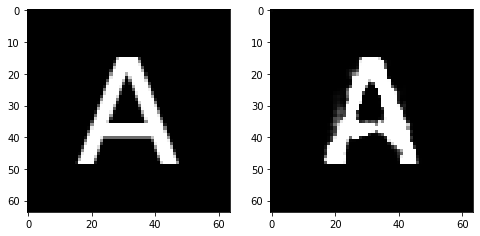

Epoch 24, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7552533000707626, Loss SSIM 2.5153489112854004, Loss Local 197.17258262634277


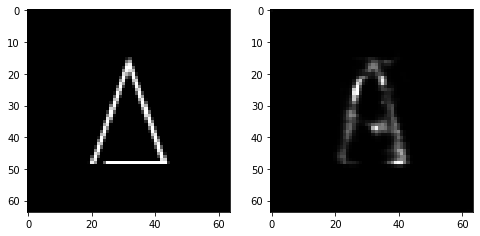

Epoch 24, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.759128462523222, Loss SSIM 2.4395554065704346, Loss Local 188.20599603652954


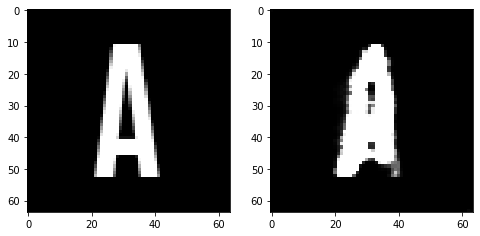

Epoch 25, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06493262946605682, Loss SSIM 0.07984566688537598, Loss Local 6.88763952255249


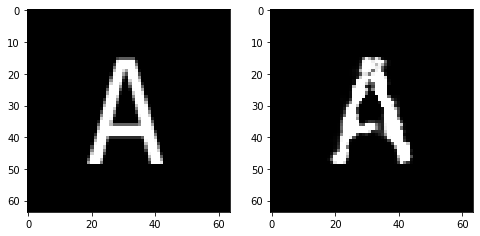

Epoch 25, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7472816705703735, Loss SSIM 2.3974223732948303, Loss Local 195.2449278831482


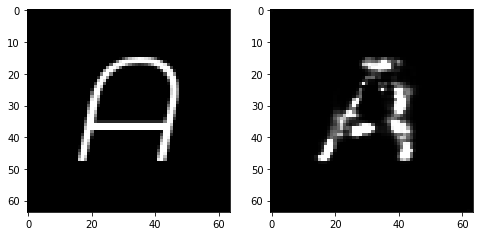

Epoch 25, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.729774434119463, Loss SSIM 2.3956174850463867, Loss Local 205.8202519416809


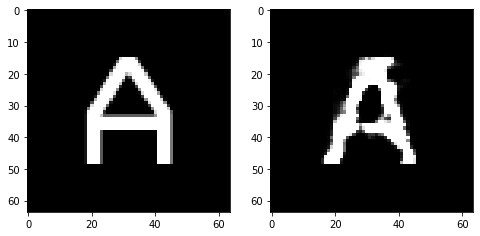

Epoch 25, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7519531212747097, Loss SSIM 2.4633477330207825, Loss Local 198.66672897338867


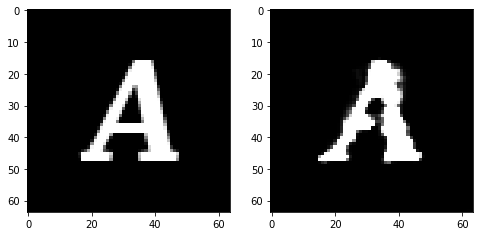

Epoch 25, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7750136740505695, Loss SSIM 2.4701969027519226, Loss Local 195.32086372375488


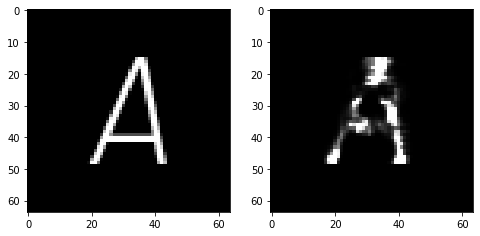

Epoch 25, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7629003524780273, Loss SSIM 2.466375231742859, Loss Local 204.79752445220947


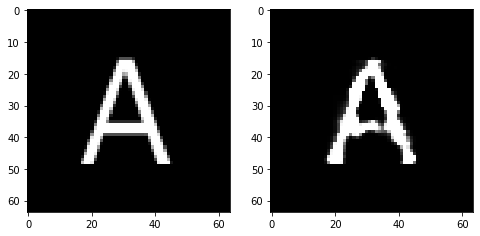

Epoch 25, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7345620319247246, Loss SSIM 2.3997199535369873, Loss Local 194.92054843902588


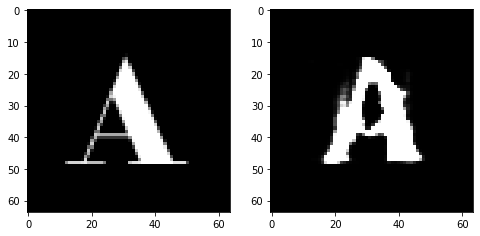

Epoch 25, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7793209999799728, Loss SSIM 2.509466290473938, Loss Local 201.42843961715698


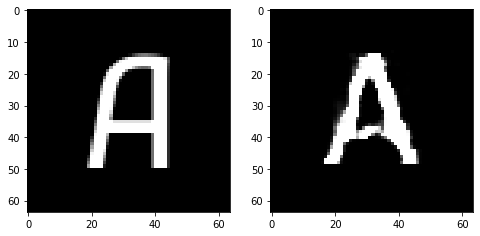

Epoch 26, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.088236503303051, Loss SSIM 0.1318644881248474, Loss Local 10.803604125976562


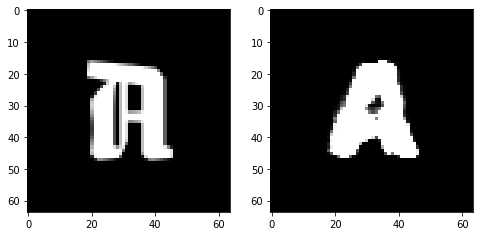

Epoch 26, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6483539752662182, Loss SSIM 2.2872645258903503, Loss Local 191.61612272262573


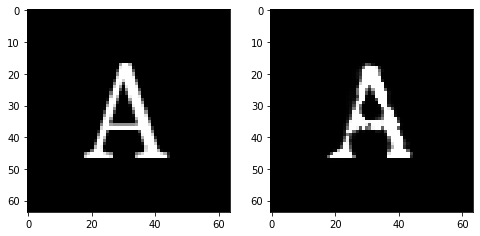

Epoch 26, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.794211097061634, Loss SSIM 2.5134241580963135, Loss Local 214.79147338867188


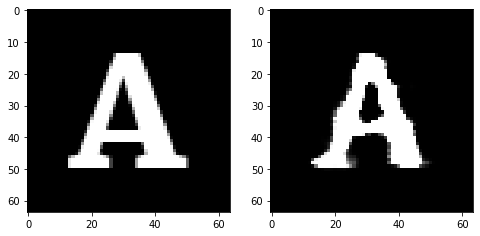

Epoch 26, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7358603216707706, Loss SSIM 2.3988251090049744, Loss Local 192.12841367721558


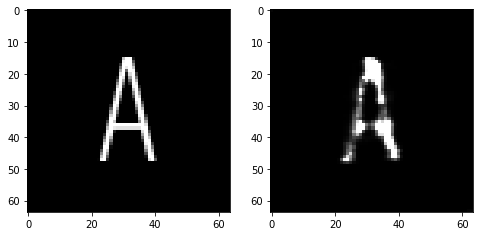

Epoch 26, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7552568465471268, Loss SSIM 2.4521945118904114, Loss Local 201.64769649505615


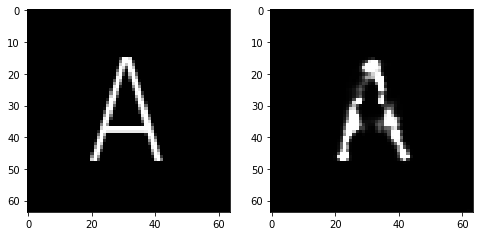

Epoch 26, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7611461840569973, Loss SSIM 2.419912099838257, Loss Local 204.2825174331665


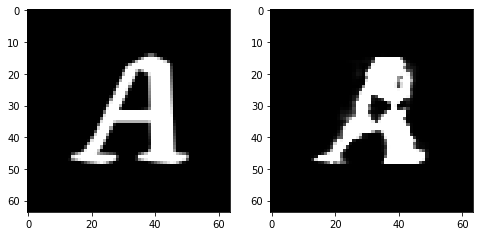

Epoch 26, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7389714792370796, Loss SSIM 2.4067848920822144, Loss Local 205.71788215637207


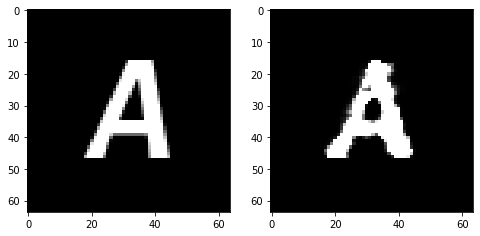

Epoch 26, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7564903162419796, Loss SSIM 2.42476624250412, Loss Local 191.71079540252686


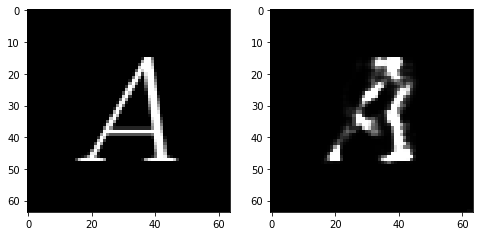

Epoch 27, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06565412133932114, Loss SSIM 0.08274662494659424, Loss Local 6.710862159729004


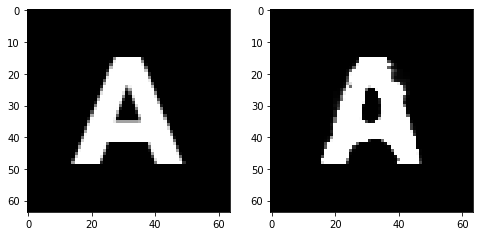

Epoch 27, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7420971766114235, Loss SSIM 2.391823709011078, Loss Local 195.83609628677368


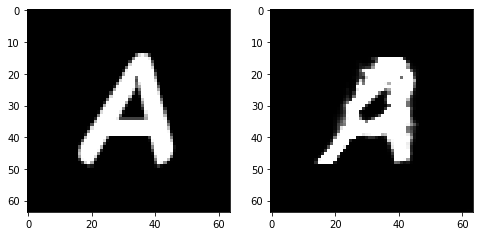

Epoch 27, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.711331583559513, Loss SSIM 2.3580393195152283, Loss Local 179.2556176185608


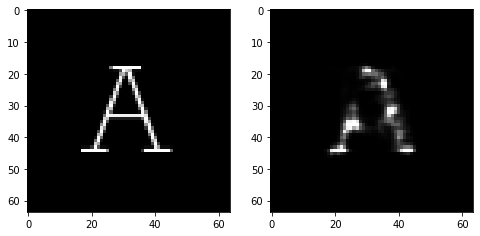

Epoch 27, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7341228649020195, Loss SSIM 2.4131187796592712, Loss Local 205.08575248718262


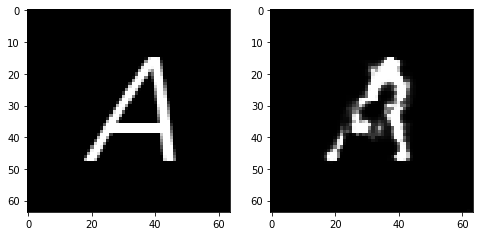

Epoch 27, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.729823924601078, Loss SSIM 2.4073619842529297, Loss Local 196.17508220672607


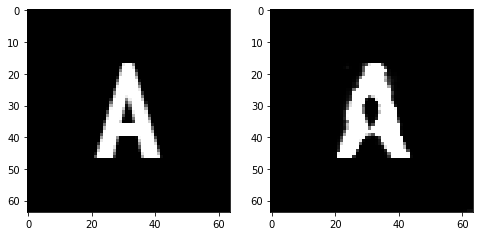

Epoch 27, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7496752366423607, Loss SSIM 2.4798584580421448, Loss Local 200.50615644454956


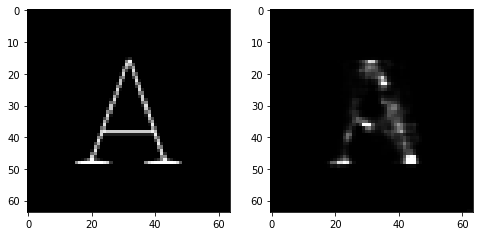

Epoch 27, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.743454184383154, Loss SSIM 2.412931501865387, Loss Local 191.98922967910767


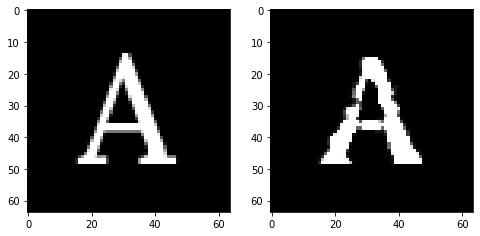

Epoch 27, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7877703830599785, Loss SSIM 2.543181836605072, Loss Local 192.0178427696228


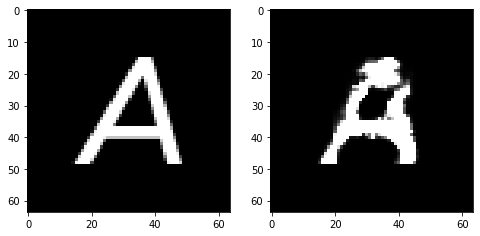

Epoch 28, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06442929804325104, Loss SSIM 0.08061498403549194, Loss Local 7.859323501586914


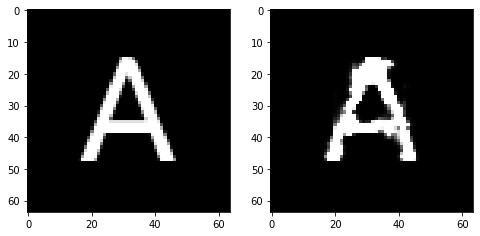

Epoch 28, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.737143475562334, Loss SSIM 2.423921525478363, Loss Local 191.1920142173767


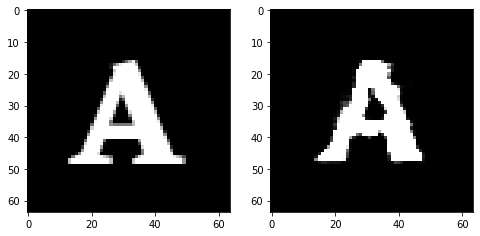

Epoch 28, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.724244512617588, Loss SSIM 2.3577466011047363, Loss Local 191.77967643737793


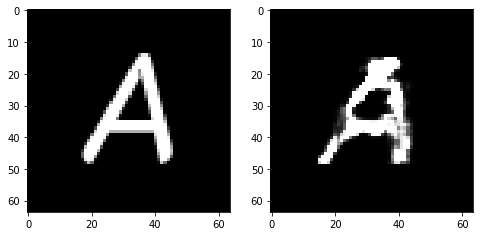

Epoch 28, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7524317651987076, Loss SSIM 2.393551230430603, Loss Local 201.6083860397339


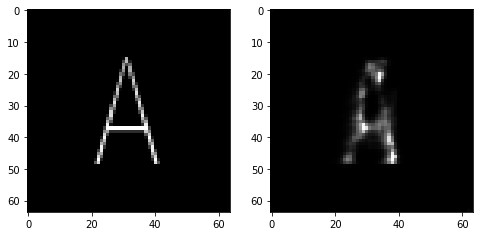

Epoch 28, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7949863821268082, Loss SSIM 2.540274202823639, Loss Local 187.5799045562744


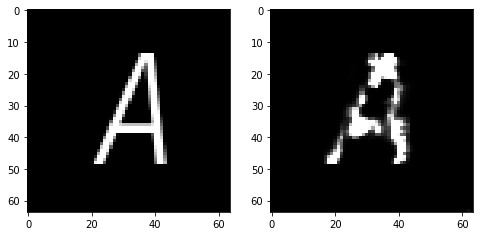

Epoch 28, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7697904221713543, Loss SSIM 2.5025822520256042, Loss Local 196.33873081207275


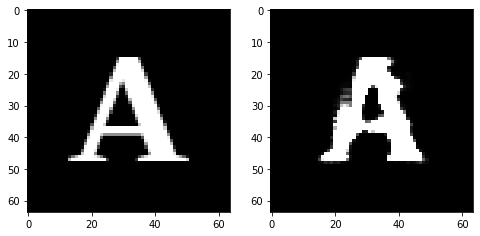

Epoch 28, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7449670024216175, Loss SSIM 2.4887436032295227, Loss Local 205.53387069702148


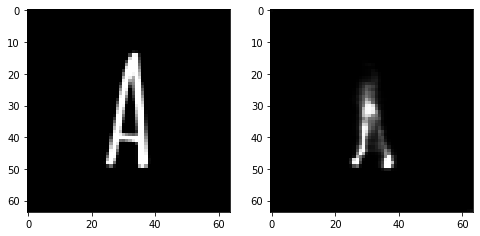

Epoch 28, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7041254118084908, Loss SSIM 2.3816885352134705, Loss Local 188.8933334350586


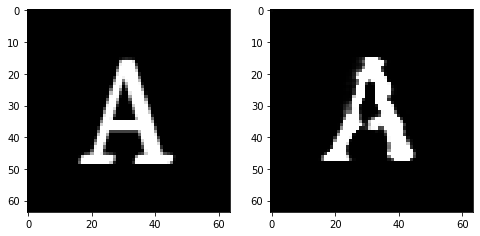

Epoch 29, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06780973821878433, Loss SSIM 0.0845450758934021, Loss Local 7.293163776397705


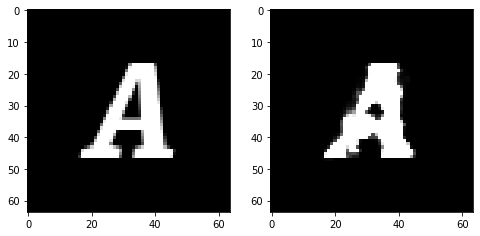

Epoch 29, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7721806094050407, Loss SSIM 2.3978238105773926, Loss Local 205.9422378540039


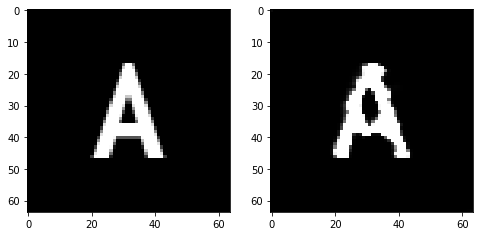

Epoch 29, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7134431861341, Loss SSIM 2.3907352089881897, Loss Local 203.03516054153442


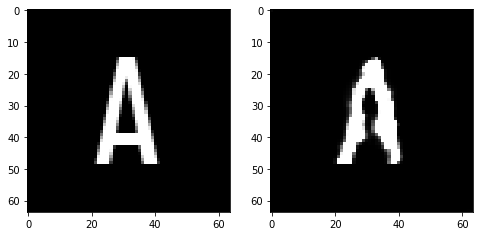

Epoch 29, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7277160286903381, Loss SSIM 2.4214243292808533, Loss Local 203.23530435562134


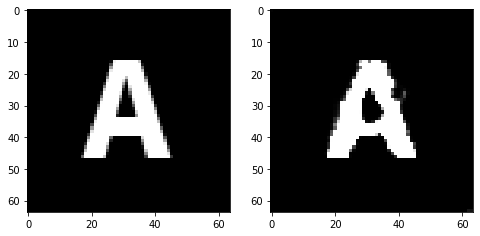

Epoch 29, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7481600977480412, Loss SSIM 2.424586772918701, Loss Local 194.27726554870605


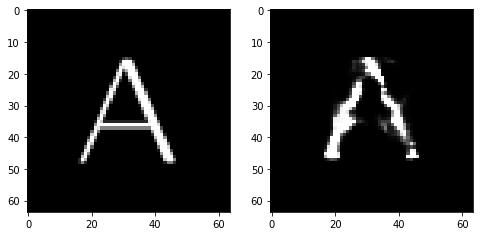

Epoch 29, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7293780744075775, Loss SSIM 2.473357141017914, Loss Local 197.6248083114624


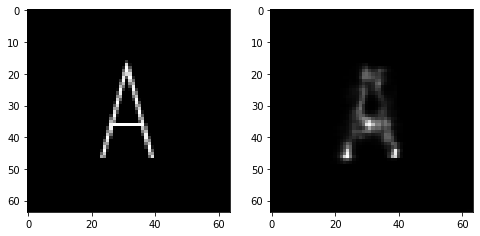

Epoch 29, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7411968559026718, Loss SSIM 2.4252735376358032, Loss Local 201.22593116760254


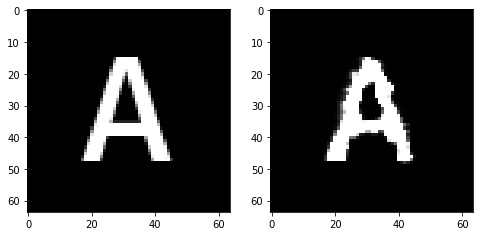

Epoch 29, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7492074444890022, Loss SSIM 2.4630634784698486, Loss Local 193.33338117599487


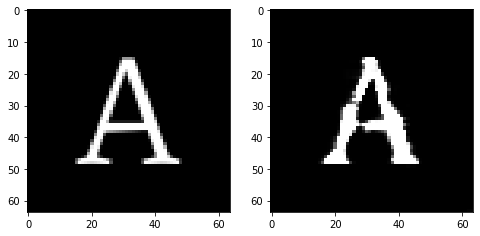

Epoch 30, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06223025172948837, Loss SSIM 0.10169804096221924, Loss Local 8.849332809448242


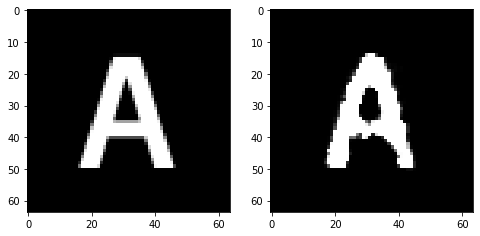

Epoch 30, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7829335033893585, Loss SSIM 2.4580228328704834, Loss Local 195.9853391647339


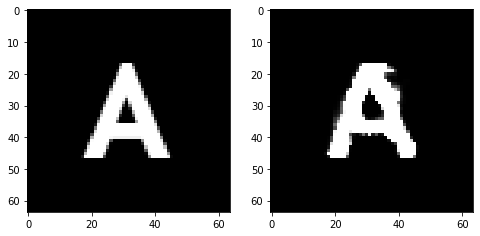

Epoch 30, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.796547956764698, Loss SSIM 2.4867141246795654, Loss Local 193.81514263153076


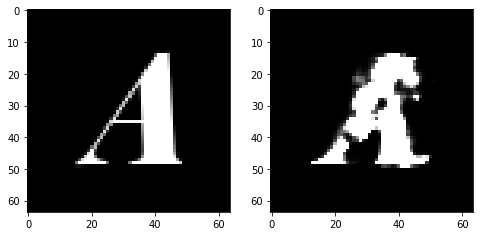

Epoch 30, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.715528953820467, Loss SSIM 2.3994497060775757, Loss Local 198.27558851242065


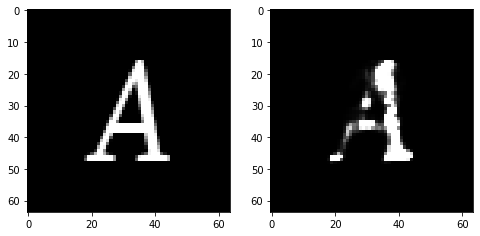

Epoch 30, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7900254055857658, Loss SSIM 2.470399796962738, Loss Local 203.35208702087402


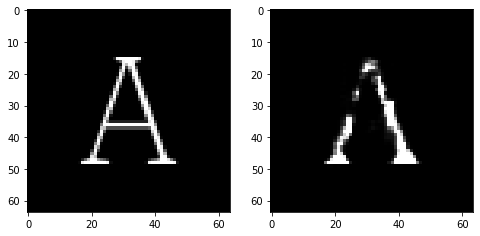

Epoch 30, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7421277798712254, Loss SSIM 2.496236801147461, Loss Local 198.89243268966675


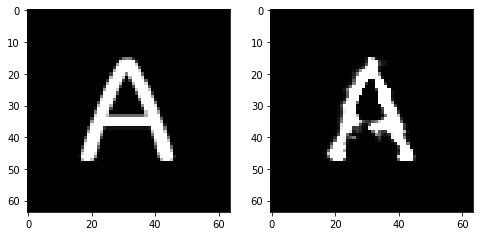

Epoch 30, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7166548036038876, Loss SSIM 2.3777554035186768, Loss Local 184.17139434814453


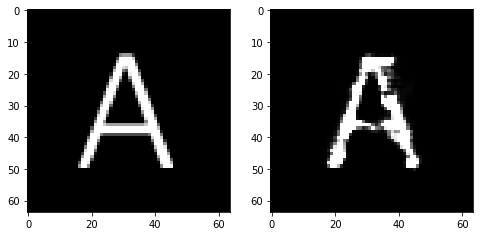

Epoch 30, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.675516989082098, Loss SSIM 2.3019195795059204, Loss Local 192.83671522140503


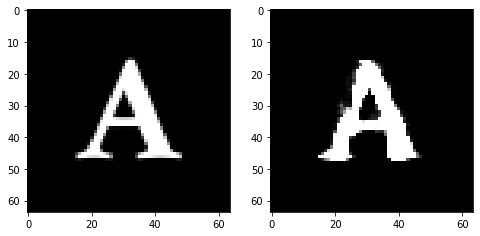

Epoch 31, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08470900356769562, Loss SSIM 0.11326873302459717, Loss Local 9.484297752380371


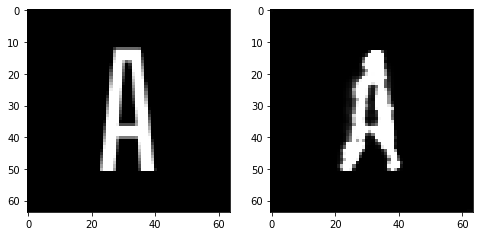

Epoch 31, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7160246632993221, Loss SSIM 2.3640777468681335, Loss Local 189.88971996307373


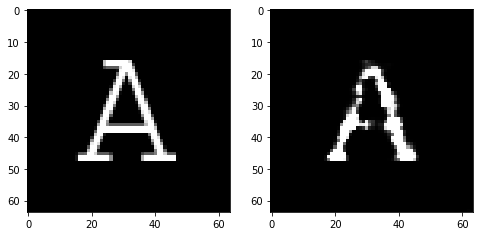

Epoch 31, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7222943007946014, Loss SSIM 2.3926424384117126, Loss Local 188.01481008529663


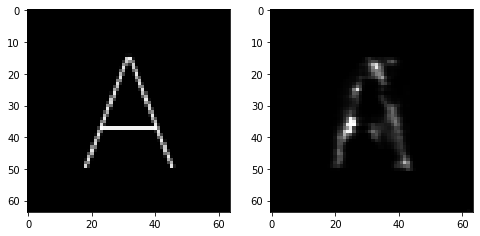

Epoch 31, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.747865229845047, Loss SSIM 2.4807331562042236, Loss Local 193.5678882598877


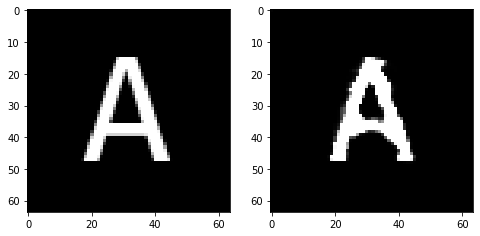

Epoch 31, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7354631312191486, Loss SSIM 2.4141035079956055, Loss Local 187.57073259353638


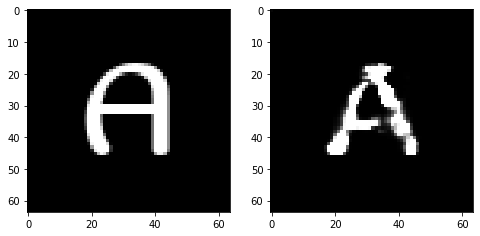

Epoch 31, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7077513486146927, Loss SSIM 2.3925246000289917, Loss Local 187.63889837265015


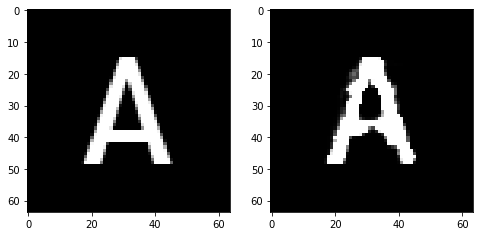

Epoch 31, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7275538817048073, Loss SSIM 2.3675849437713623, Loss Local 193.66320943832397


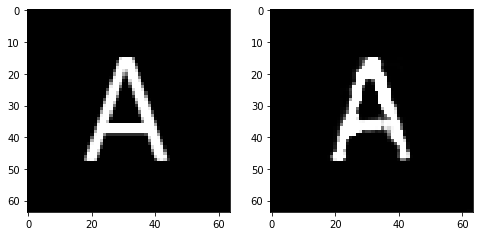

Epoch 31, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7698129266500473, Loss SSIM 2.414287030696869, Loss Local 196.1175937652588


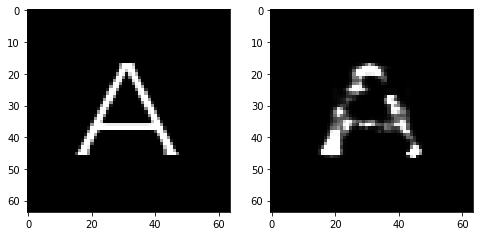

Epoch 32, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08369102329015732, Loss SSIM 0.10760265588760376, Loss Local 9.155196189880371


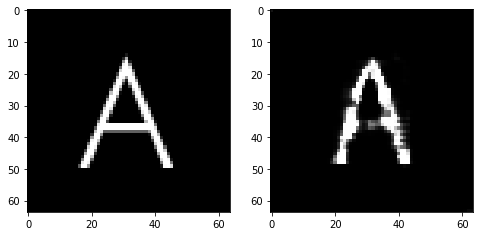

Epoch 32, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7160394228994846, Loss SSIM 2.4138593077659607, Loss Local 198.08961129188538


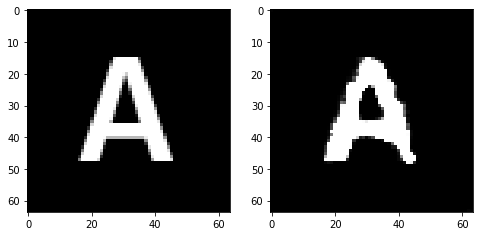

Epoch 32, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7493637800216675, Loss SSIM 2.4444954991340637, Loss Local 194.42754125595093


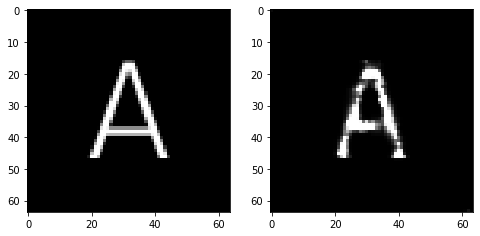

Epoch 32, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.735051903873682, Loss SSIM 2.4474985599517822, Loss Local 203.88941383361816


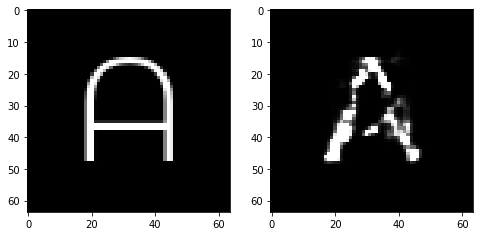

Epoch 32, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7103756815195084, Loss SSIM 2.395475447177887, Loss Local 201.91283178329468


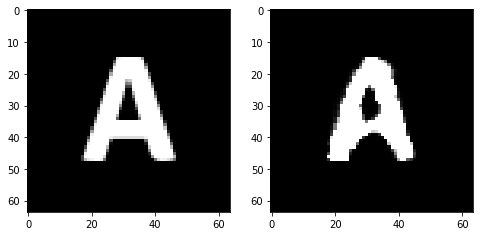

Epoch 32, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7486707493662834, Loss SSIM 2.447690784931183, Loss Local 199.94119787216187


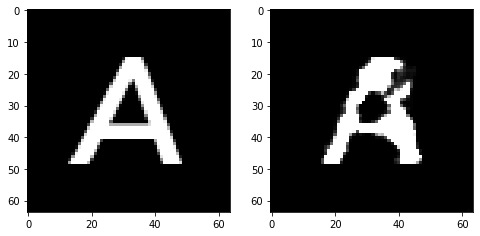

Epoch 32, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7297796308994293, Loss SSIM 2.350072741508484, Loss Local 192.7612795829773


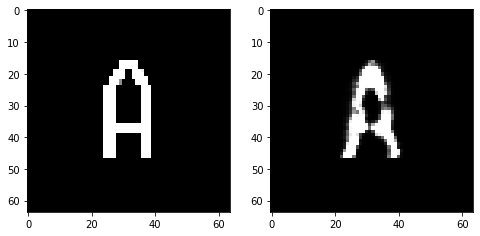

Epoch 32, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7027910575270653, Loss SSIM 2.3384124040603638, Loss Local 192.35736322402954


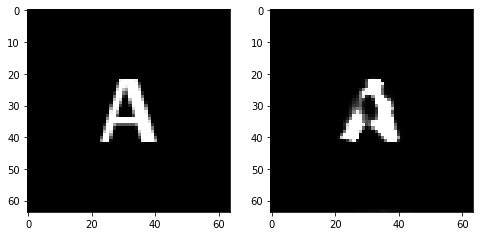

Epoch 33, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07182134687900543, Loss SSIM 0.09721219539642334, Loss Local 8.40955638885498


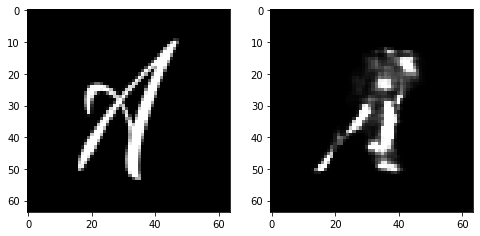

Epoch 33, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7357386387884617, Loss SSIM 2.414723753929138, Loss Local 193.85102605819702


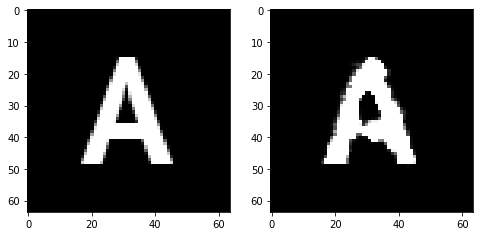

Epoch 33, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7090365923941135, Loss SSIM 2.321224868297577, Loss Local 195.68298768997192


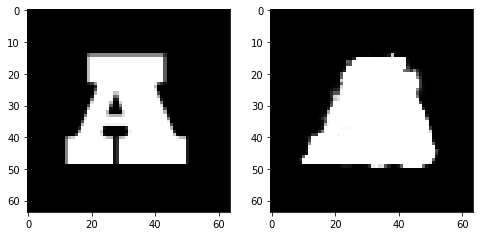

Epoch 33, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6689956486225128, Loss SSIM 2.2780169248580933, Loss Local 187.9662618637085


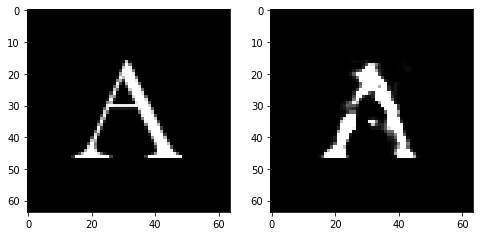

Epoch 33, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.732826005667448, Loss SSIM 2.439425766468048, Loss Local 192.5971794128418


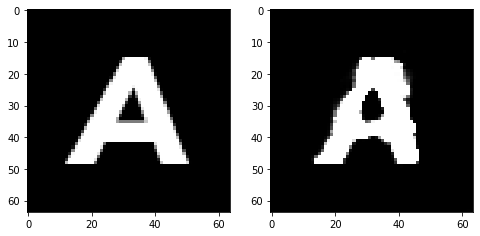

Epoch 33, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7410206496715546, Loss SSIM 2.4188112616539, Loss Local 197.66300916671753


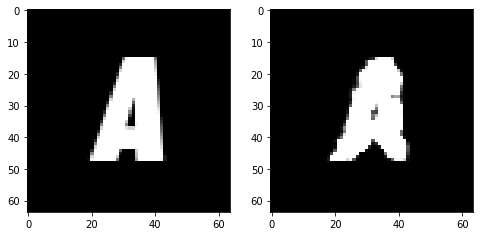

Epoch 33, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7258786782622337, Loss SSIM 2.430155396461487, Loss Local 194.75442934036255


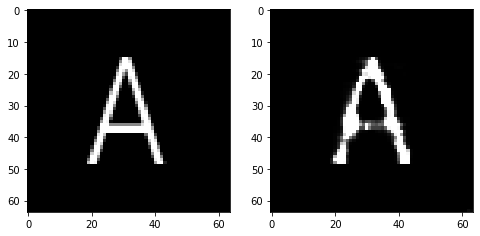

Epoch 33, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.793902836740017, Loss SSIM 2.5244800448417664, Loss Local 201.76831102371216


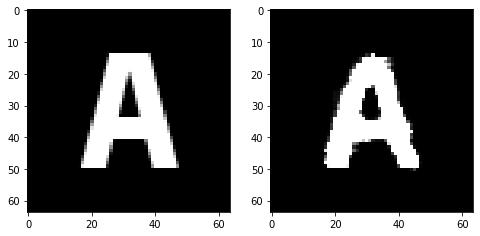

Epoch 34, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06606459617614746, Loss SSIM 0.08131682872772217, Loss Local 8.59715747833252


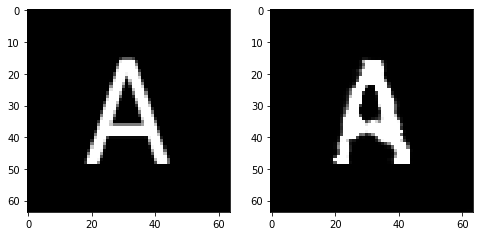

Epoch 34, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7347058802843094, Loss SSIM 2.352170944213867, Loss Local 183.38751983642578


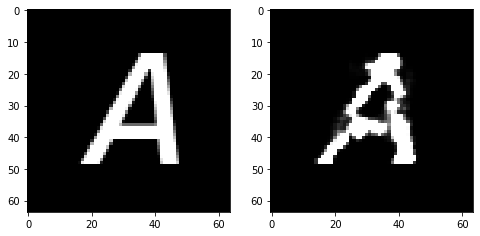

Epoch 34, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7329930812120438, Loss SSIM 2.3508565425872803, Loss Local 199.5091791152954


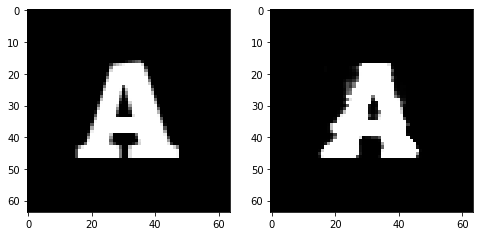

Epoch 34, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7435379587113857, Loss SSIM 2.3805378079414368, Loss Local 192.60779905319214


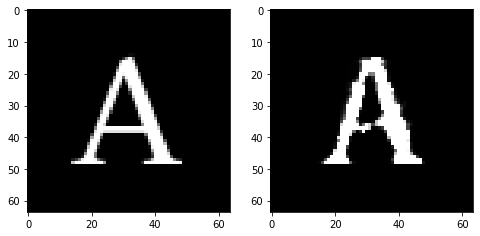

Epoch 34, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6666311994194984, Loss SSIM 2.300222098827362, Loss Local 190.2686734199524


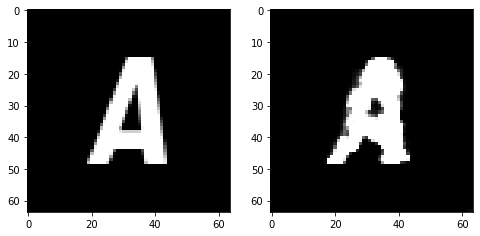

Epoch 34, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6979523450136185, Loss SSIM 2.379360556602478, Loss Local 186.62833833694458


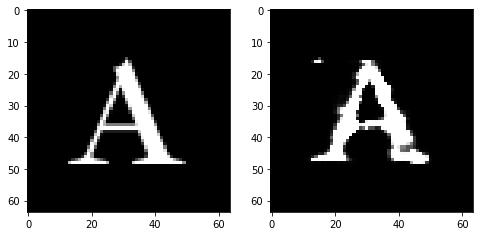

Epoch 34, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7487630061805248, Loss SSIM 2.468900740146637, Loss Local 195.94506406784058


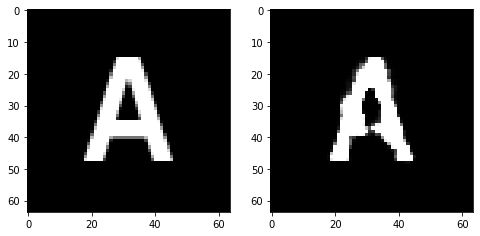

Epoch 34, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7242314033210278, Loss SSIM 2.450074255466461, Loss Local 202.09732151031494


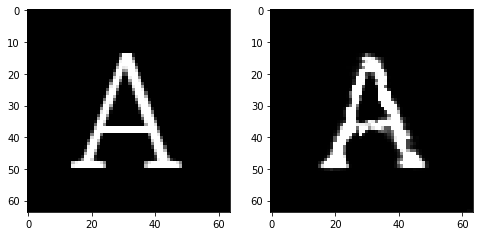

Epoch 35, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06608794629573822, Loss SSIM 0.08655476570129395, Loss Local 8.094450950622559


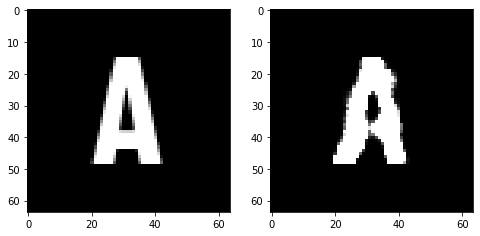

Epoch 35, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6886879168450832, Loss SSIM 2.334964156150818, Loss Local 189.21494913101196


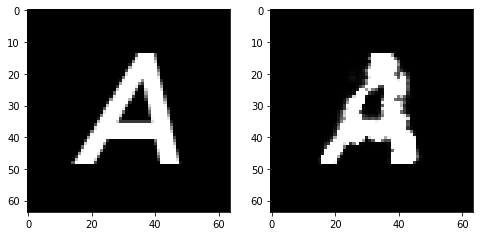

Epoch 35, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.742590218782425, Loss SSIM 2.3674142956733704, Loss Local 200.71448373794556


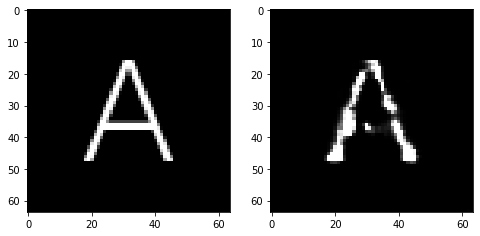

Epoch 35, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.722279131412506, Loss SSIM 2.392321825027466, Loss Local 195.32506275177002


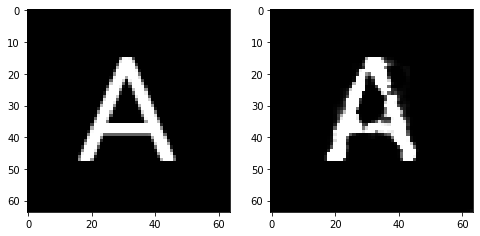

Epoch 35, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7546305693686008, Loss SSIM 2.4876784086227417, Loss Local 197.52700853347778


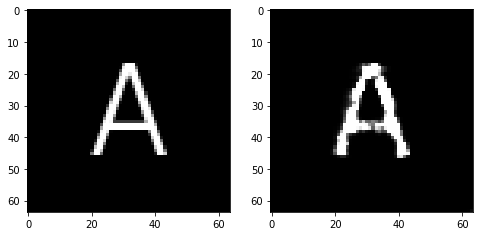

Epoch 35, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7386705242097378, Loss SSIM 2.4348902702331543, Loss Local 197.55907344818115


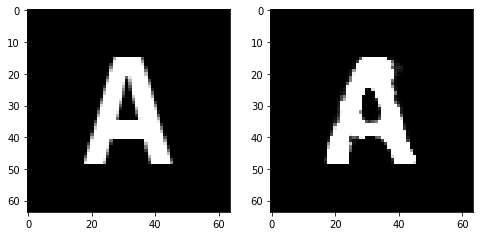

Epoch 35, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.680487122386694, Loss SSIM 2.299769699573517, Loss Local 184.69789361953735


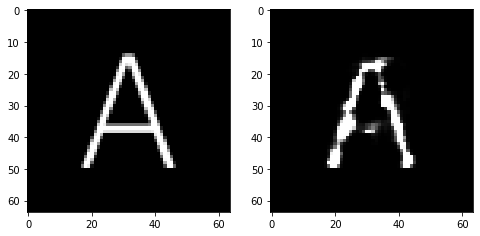

Epoch 35, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7102714702486992, Loss SSIM 2.339268207550049, Loss Local 193.11738777160645


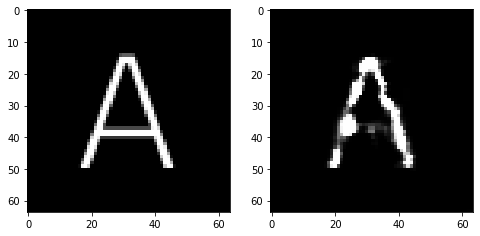

Epoch 36, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06017103046178818, Loss SSIM 0.07337844371795654, Loss Local 6.065954208374023


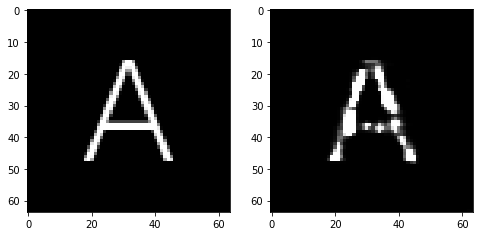

Epoch 36, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7359031699597836, Loss SSIM 2.427190899848938, Loss Local 189.64423370361328


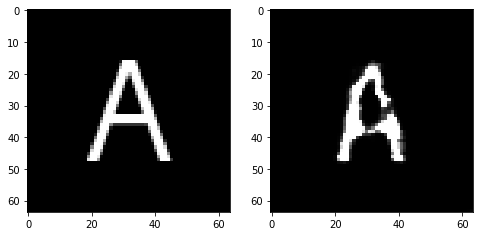

Epoch 36, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7367284931242466, Loss SSIM 2.4182117581367493, Loss Local 200.84131145477295


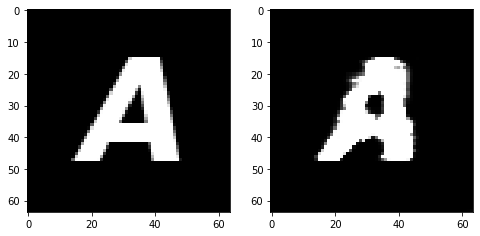

Epoch 36, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7261964194476604, Loss SSIM 2.3866403102874756, Loss Local 189.8302960395813


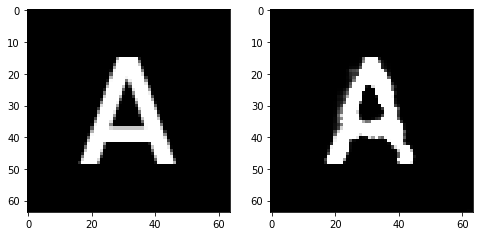

Epoch 36, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.70809206366539, Loss SSIM 2.336304008960724, Loss Local 201.15716123580933


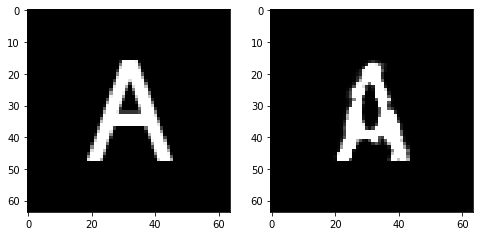

Epoch 36, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6724627986550331, Loss SSIM 2.2964348793029785, Loss Local 198.81788063049316


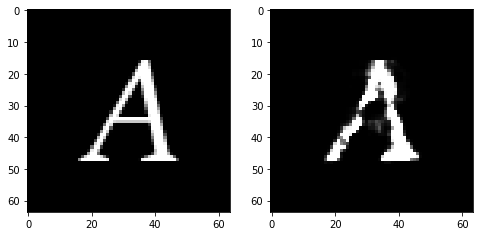

Epoch 36, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8237465359270573, Loss SSIM 2.5458584427833557, Loss Local 205.9808988571167


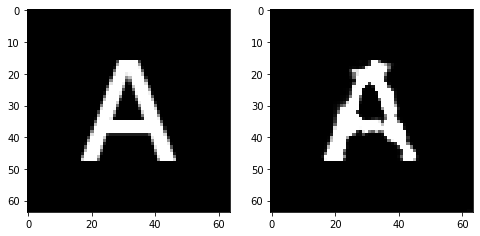

Epoch 36, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6920743510127068, Loss SSIM 2.3800331354141235, Loss Local 190.9561095237732


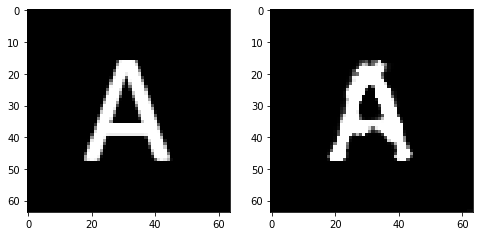

Epoch 37, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06973269581794739, Loss SSIM 0.1102532148361206, Loss Local 8.712347984313965


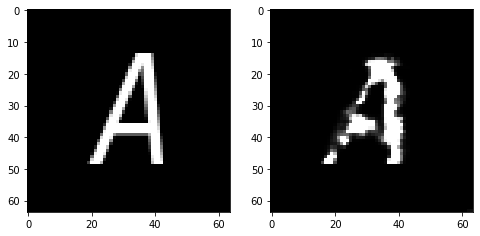

Epoch 37, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7348933443427086, Loss SSIM 2.4284157156944275, Loss Local 189.95248222351074


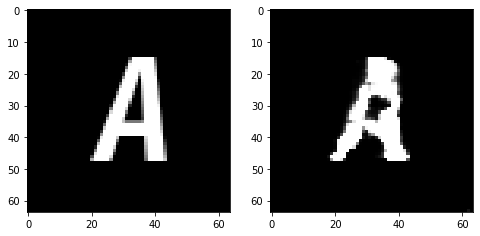

Epoch 37, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7416532970964909, Loss SSIM 2.356710374355316, Loss Local 193.53247714042664


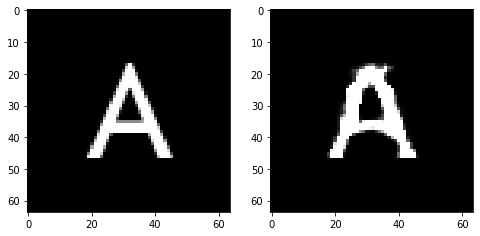

Epoch 37, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6779032684862614, Loss SSIM 2.306238114833832, Loss Local 191.32567167282104


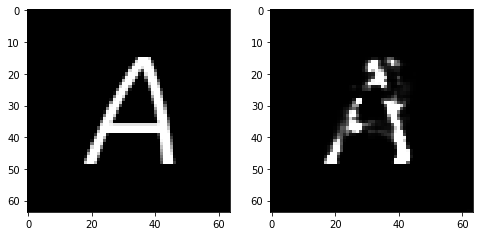

Epoch 37, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7467240802943707, Loss SSIM 2.4492308497428894, Loss Local 192.8713493347168


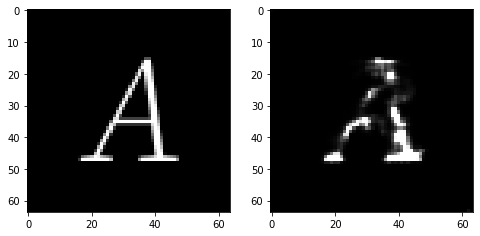

Epoch 37, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7043175883591175, Loss SSIM 2.387940287590027, Loss Local 194.33997249603271


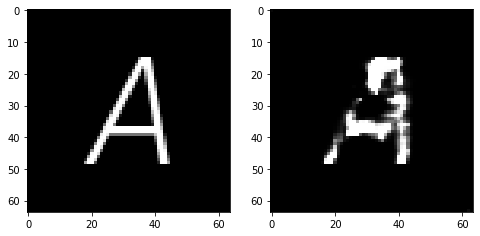

Epoch 37, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.726168792694807, Loss SSIM 2.3847901821136475, Loss Local 191.07680559158325


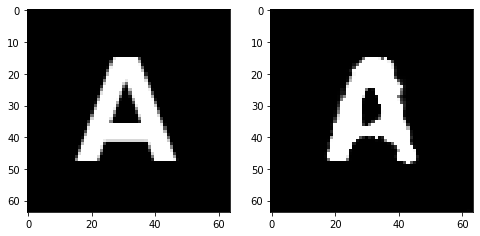

Epoch 37, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7099321708083153, Loss SSIM 2.332286834716797, Loss Local 192.16683673858643


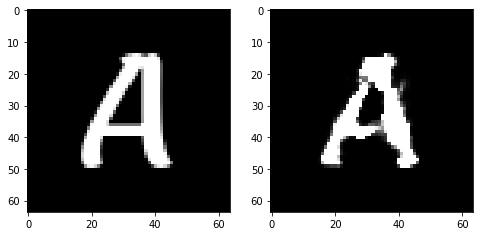

Epoch 38, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06866160780191422, Loss SSIM 0.0946468710899353, Loss Local 7.98459529876709


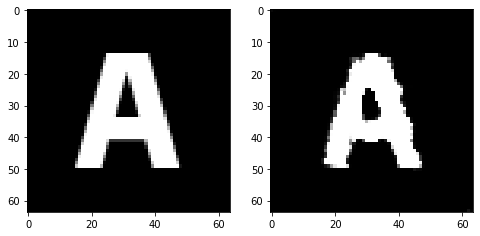

Epoch 38, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7308947667479515, Loss SSIM 2.397879123687744, Loss Local 185.6907925605774


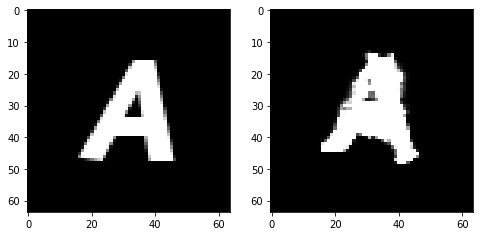

Epoch 38, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7334433421492577, Loss SSIM 2.4294753074645996, Loss Local 195.09499597549438


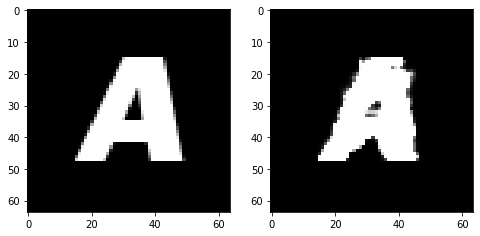

Epoch 38, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7004023864865303, Loss SSIM 2.3865382075309753, Loss Local 188.52488803863525


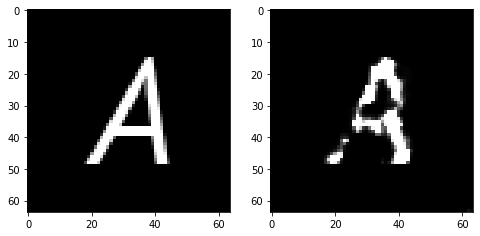

Epoch 38, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6887432001531124, Loss SSIM 2.274024546146393, Loss Local 183.9034333229065


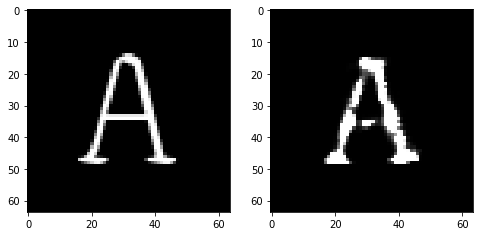

Epoch 38, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7468466833233833, Loss SSIM 2.3705488443374634, Loss Local 189.11386346817017


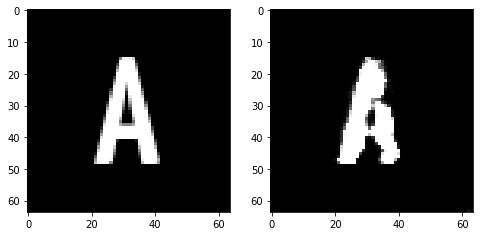

Epoch 38, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7526735179126263, Loss SSIM 2.4607839584350586, Loss Local 201.4394974708557


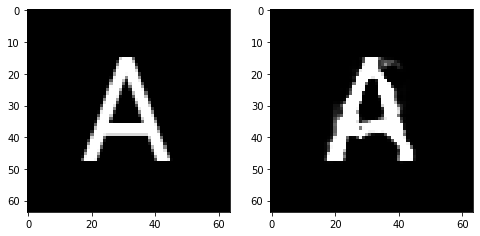

Epoch 38, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7346025072038174, Loss SSIM 2.403937041759491, Loss Local 203.28367471694946


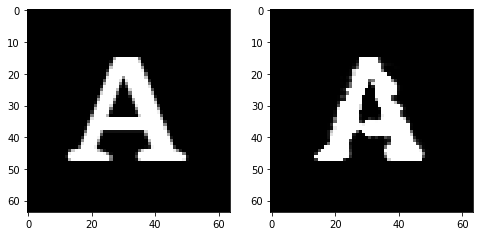

Epoch 39, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06592516601085663, Loss SSIM 0.09125351905822754, Loss Local 7.374591827392578


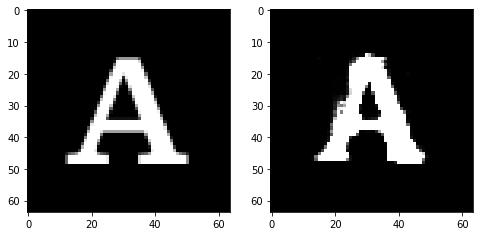

Epoch 39, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7442035339772701, Loss SSIM 2.4893781542778015, Loss Local 196.42258882522583


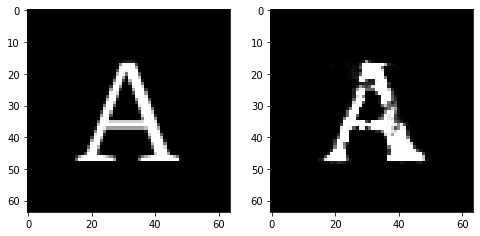

Epoch 39, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6579533778131008, Loss SSIM 2.313646137714386, Loss Local 187.22206687927246


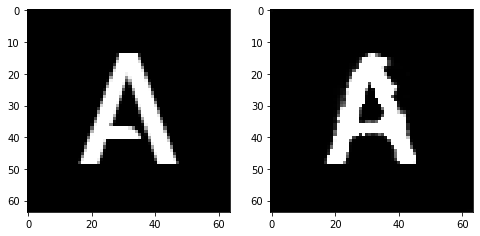

Epoch 39, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7448022328317165, Loss SSIM 2.382872223854065, Loss Local 204.20748901367188


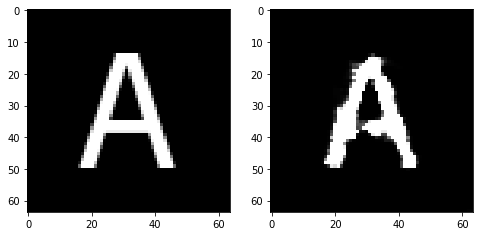

Epoch 39, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7686115056276321, Loss SSIM 2.4320258498191833, Loss Local 196.8608717918396


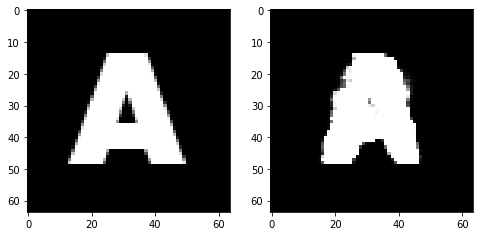

Epoch 39, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7168371863663197, Loss SSIM 2.393697738647461, Loss Local 189.99028778076172


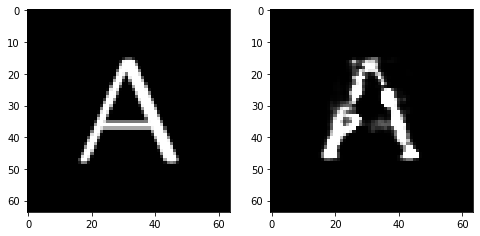

Epoch 39, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6947881802916527, Loss SSIM 2.3253650665283203, Loss Local 186.13927698135376


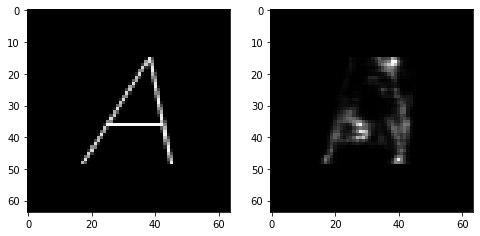

Epoch 39, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.721429631114006, Loss SSIM 2.370509922504425, Loss Local 189.62824058532715


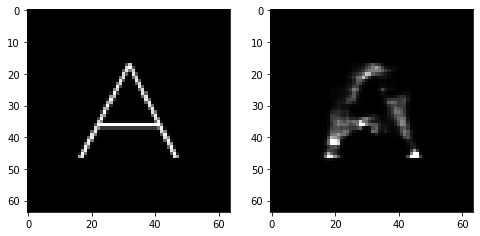

Epoch 40, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07798642665147781, Loss SSIM 0.10770845413208008, Loss Local 9.83230972290039


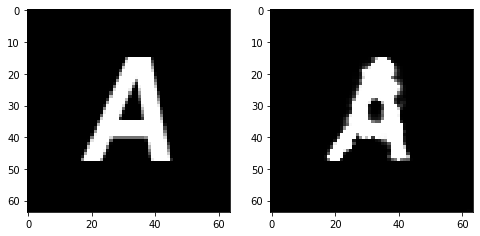

Epoch 40, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7005736641585827, Loss SSIM 2.357240080833435, Loss Local 201.96616744995117


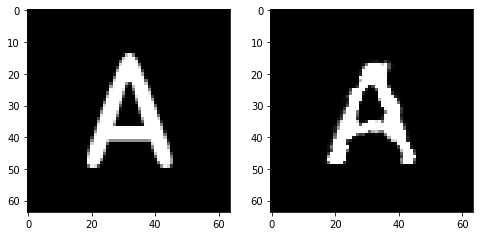

Epoch 40, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7091469876468182, Loss SSIM 2.402501106262207, Loss Local 194.42331504821777


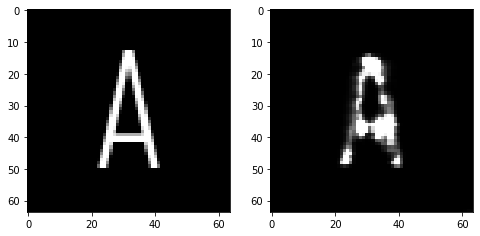

Epoch 40, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.78913901373744, Loss SSIM 2.495850086212158, Loss Local 195.92709589004517


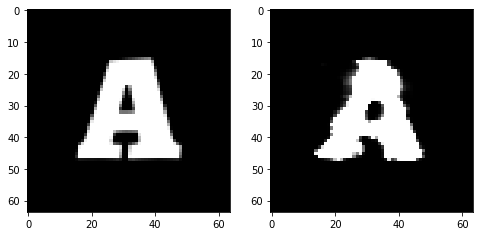

Epoch 40, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.769629206508398, Loss SSIM 2.5212411880493164, Loss Local 200.3698606491089


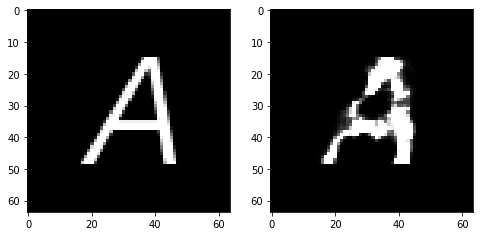

Epoch 40, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6619413197040558, Loss SSIM 2.2420374751091003, Loss Local 192.83412504196167


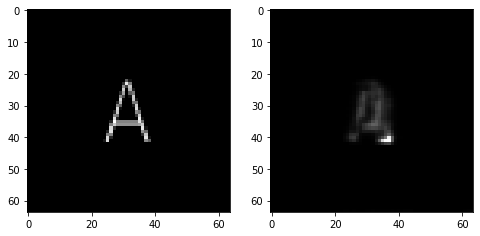

Epoch 40, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7141439951956272, Loss SSIM 2.3384042382240295, Loss Local 195.29024267196655


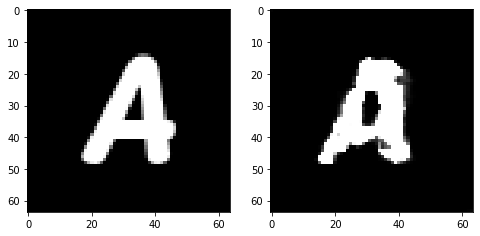

Epoch 40, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7192117236554623, Loss SSIM 2.391413986682892, Loss Local 197.25173807144165


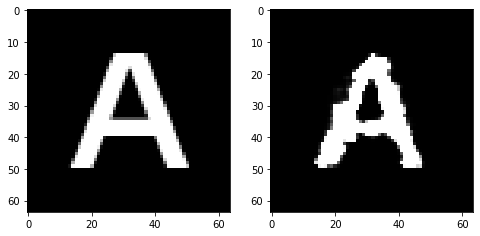

Epoch 41, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07344163954257965, Loss SSIM 0.11213243007659912, Loss Local 7.458654403686523


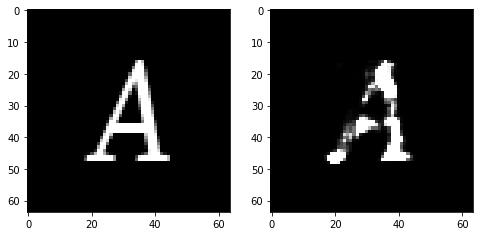

Epoch 41, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7552389688789845, Loss SSIM 2.435065805912018, Loss Local 194.55001211166382


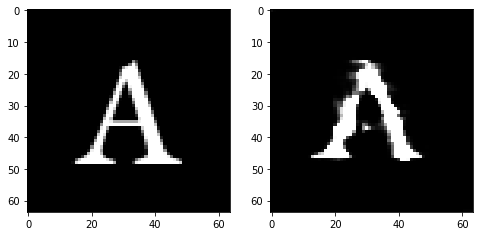

Epoch 41, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7951033115386963, Loss SSIM 2.5118921995162964, Loss Local 202.82175731658936


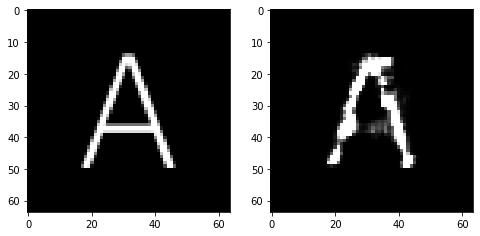

Epoch 41, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.65724291279912, Loss SSIM 2.2622446417808533, Loss Local 185.48336172103882


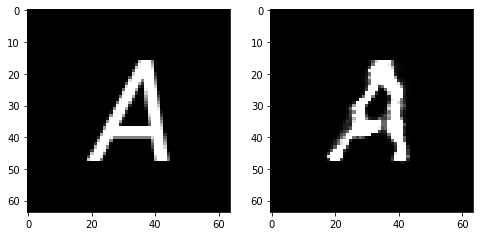

Epoch 41, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6797305047512054, Loss SSIM 2.325800895690918, Loss Local 195.15558624267578


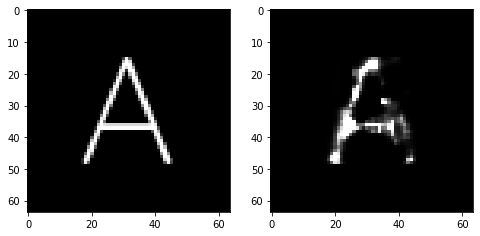

Epoch 41, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.737317867577076, Loss SSIM 2.4455161094665527, Loss Local 196.27529096603394


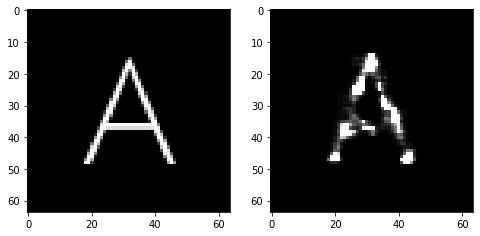

Epoch 41, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.688817735761404, Loss SSIM 2.296143352985382, Loss Local 195.2087264060974


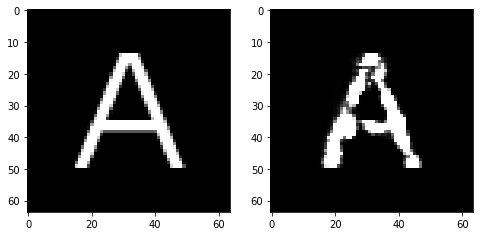

Epoch 41, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7408213391900063, Loss SSIM 2.4083805084228516, Loss Local 192.71223163604736


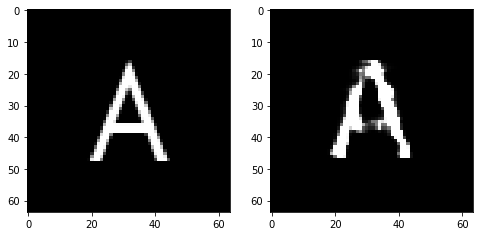

Epoch 42, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0712326169013977, Loss SSIM 0.09160393476486206, Loss Local 7.568927764892578


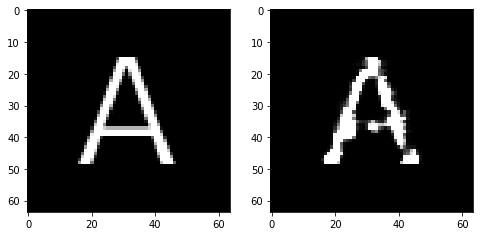

Epoch 42, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.680658008903265, Loss SSIM 2.326617658138275, Loss Local 199.354829788208


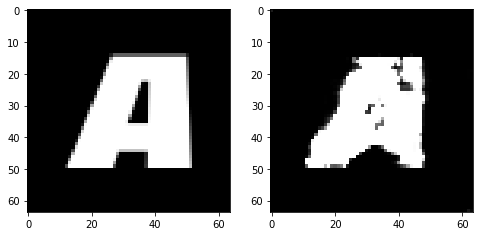

Epoch 42, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6417333111166954, Loss SSIM 2.209639251232147, Loss Local 168.97551345825195


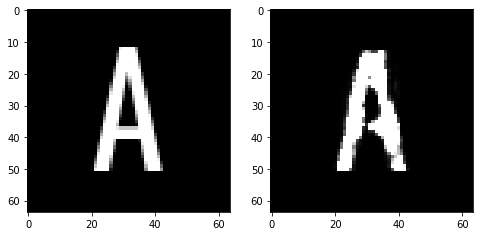

Epoch 42, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7477298378944397, Loss SSIM 2.4730175137519836, Loss Local 198.91570329666138


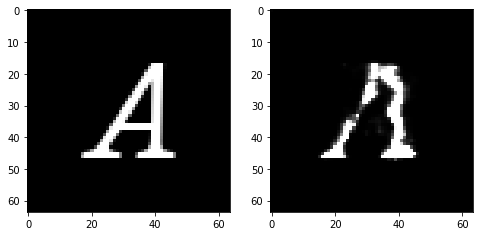

Epoch 42, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7403616085648537, Loss SSIM 2.3854440450668335, Loss Local 190.47642612457275


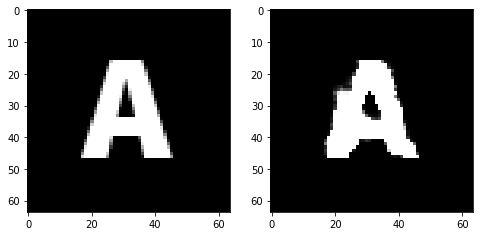

Epoch 42, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7131829001009464, Loss SSIM 2.3672180771827698, Loss Local 185.85757899284363


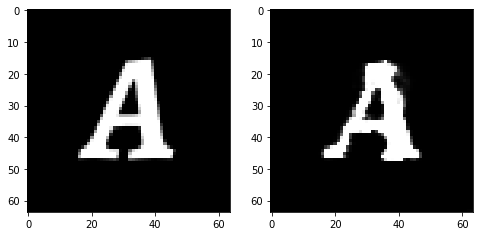

Epoch 42, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.717490628361702, Loss SSIM 2.3546537160873413, Loss Local 193.77217721939087


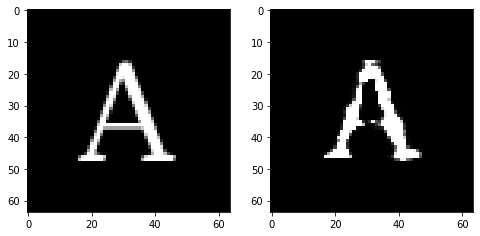

Epoch 42, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7020921781659126, Loss SSIM 2.382559299468994, Loss Local 188.23381853103638


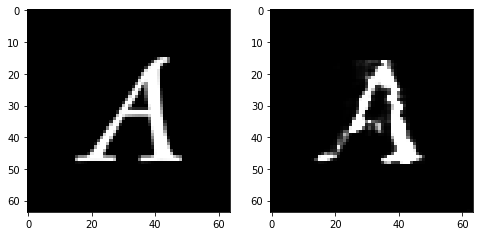

Epoch 43, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06847326457500458, Loss SSIM 0.09041297435760498, Loss Local 8.141904830932617


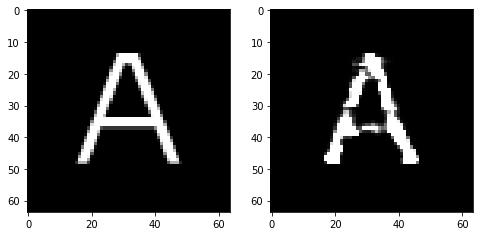

Epoch 43, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7212652117013931, Loss SSIM 2.381724536418915, Loss Local 195.14210271835327


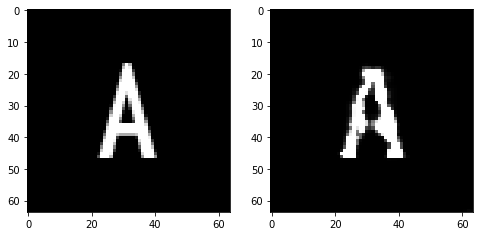

Epoch 43, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7091487608850002, Loss SSIM 2.267988085746765, Loss Local 201.84717512130737


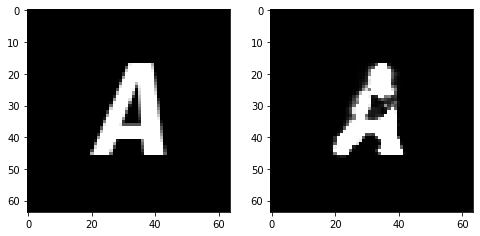

Epoch 43, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7361003644764423, Loss SSIM 2.4123602509498596, Loss Local 198.05801343917847


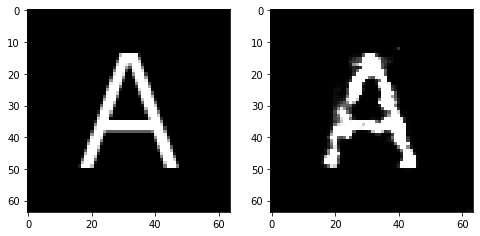

Epoch 43, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6539628468453884, Loss SSIM 2.2672234177589417, Loss Local 187.04387855529785


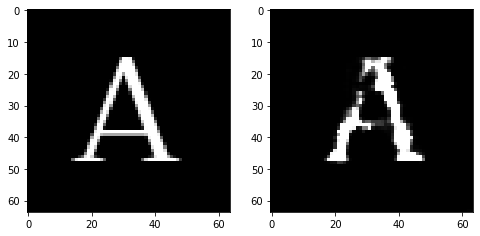

Epoch 43, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6896744407713413, Loss SSIM 2.396554708480835, Loss Local 184.70618510246277


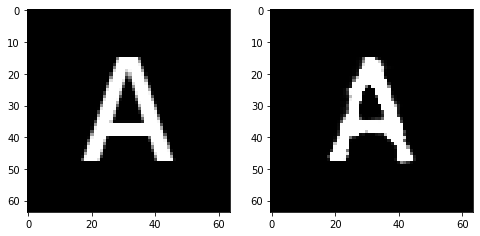

Epoch 43, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6692409999668598, Loss SSIM 2.284596800804138, Loss Local 188.76860237121582


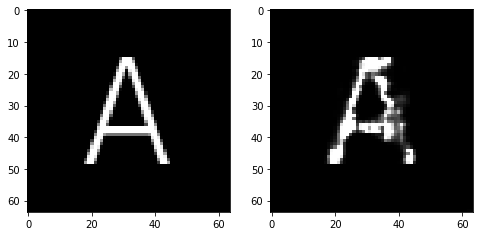

Epoch 43, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7746239081025124, Loss SSIM 2.4913963079452515, Loss Local 206.56752347946167


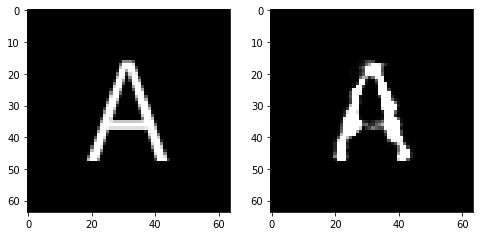

Epoch 44, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07175277173519135, Loss SSIM 0.10848110914230347, Loss Local 7.80312442779541


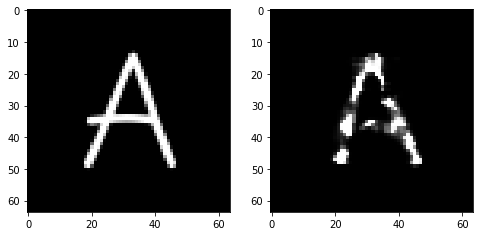

Epoch 44, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7176087498664856, Loss SSIM 2.3744847774505615, Loss Local 188.48213863372803


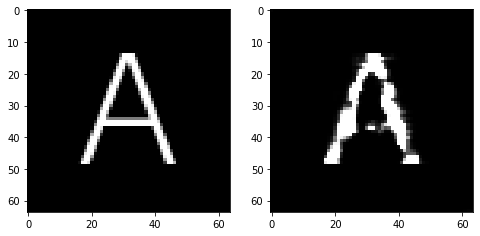

Epoch 44, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6582508720457554, Loss SSIM 2.307045638561249, Loss Local 193.19305038452148


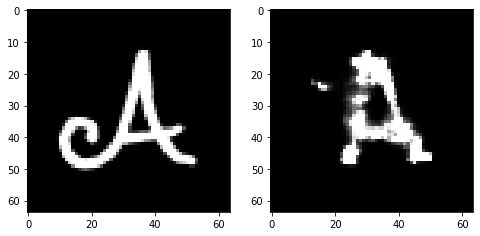

Epoch 44, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.703578893095255, Loss SSIM 2.322361648082733, Loss Local 196.76656913757324


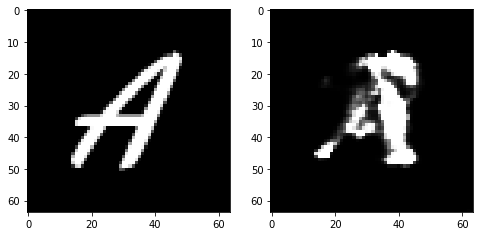

Epoch 44, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7594157680869102, Loss SSIM 2.360825836658478, Loss Local 190.7461657524109


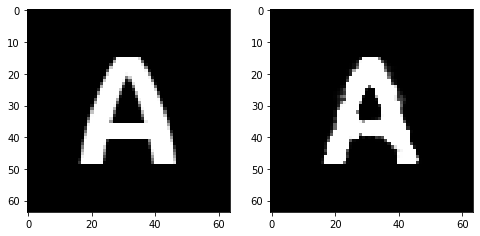

Epoch 44, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7085602320730686, Loss SSIM 2.3343023657798767, Loss Local 196.27616453170776


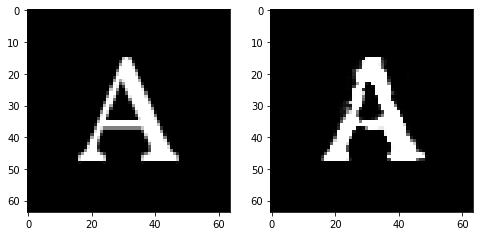

Epoch 44, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7280952036380768, Loss SSIM 2.454417645931244, Loss Local 202.6712965965271


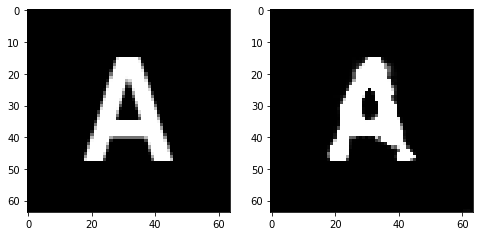

Epoch 44, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6928105913102627, Loss SSIM 2.320625364780426, Loss Local 189.0201439857483


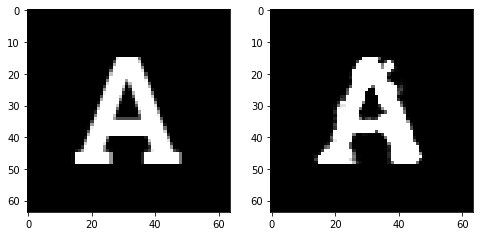

Epoch 45, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06624990701675415, Loss SSIM 0.1074683666229248, Loss Local 8.022194862365723


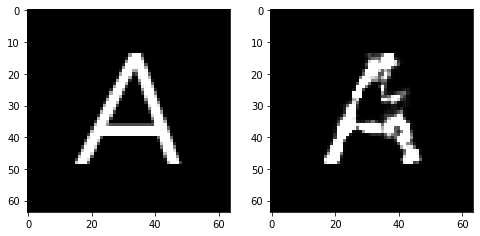

Epoch 45, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7489391714334488, Loss SSIM 2.3972049355506897, Loss Local 200.2408685684204


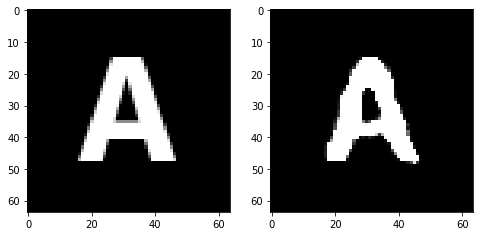

Epoch 45, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7203870676457882, Loss SSIM 2.400510013103485, Loss Local 192.2247085571289


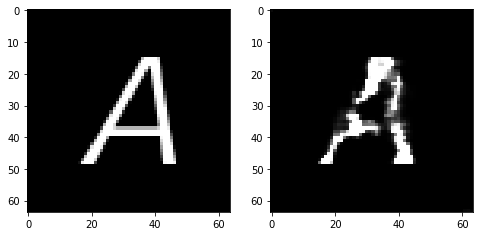

Epoch 45, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6615194790065289, Loss SSIM 2.3222962021827698, Loss Local 185.07064771652222


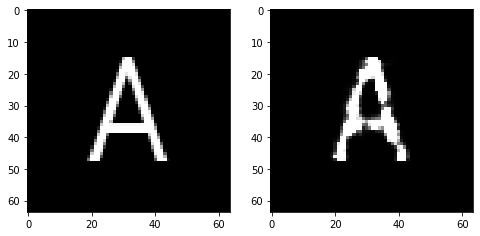

Epoch 45, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6766484305262566, Loss SSIM 2.236178398132324, Loss Local 201.0075306892395


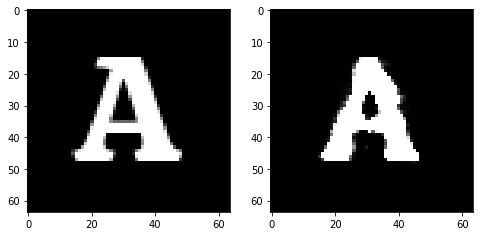

Epoch 45, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.733911395072937, Loss SSIM 2.399433732032776, Loss Local 195.16412830352783


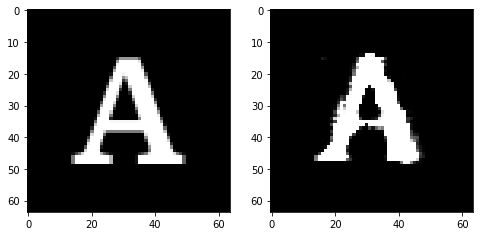

Epoch 45, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.735483456403017, Loss SSIM 2.4069501757621765, Loss Local 195.21563529968262


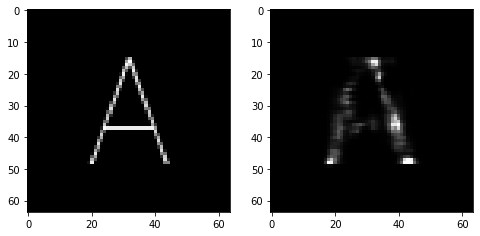

Epoch 45, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7139616906642914, Loss SSIM 2.3958175778388977, Loss Local 180.37320947647095


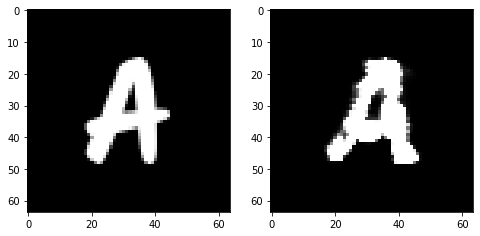

Epoch 46, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07562769949436188, Loss SSIM 0.11256253719329834, Loss Local 10.391707420349121


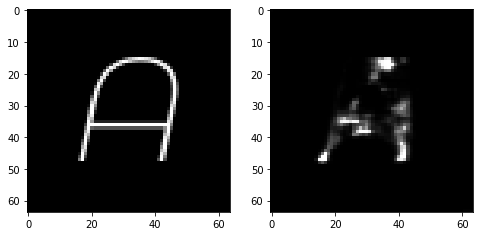

Epoch 46, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.691912766546011, Loss SSIM 2.299223780632019, Loss Local 194.56719255447388


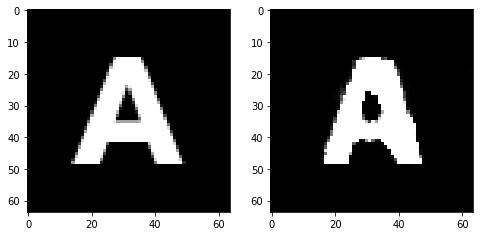

Epoch 46, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7026951983571053, Loss SSIM 2.372178018093109, Loss Local 193.17656898498535


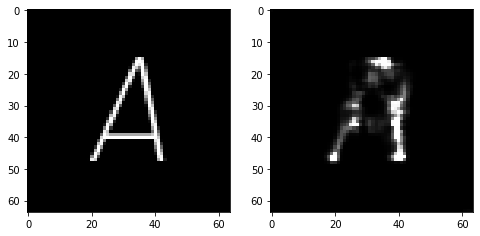

Epoch 46, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7307291366159916, Loss SSIM 2.430135130882263, Loss Local 198.50491046905518


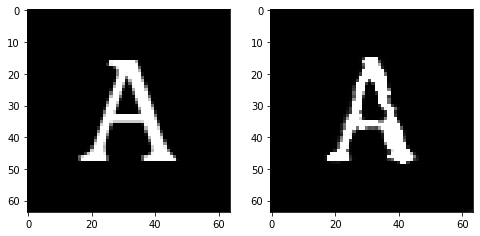

Epoch 46, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7170276083052158, Loss SSIM 2.385374426841736, Loss Local 195.57582092285156


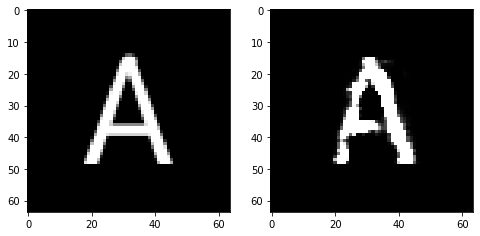

Epoch 46, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.700563121587038, Loss SSIM 2.3146601915359497, Loss Local 191.7601022720337


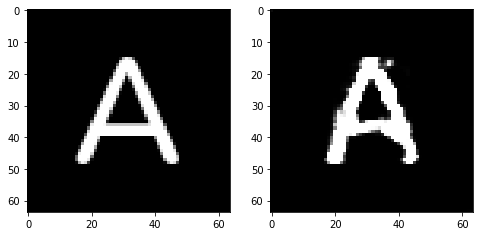

Epoch 46, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7199430502951145, Loss SSIM 2.347513794898987, Loss Local 190.8766655921936


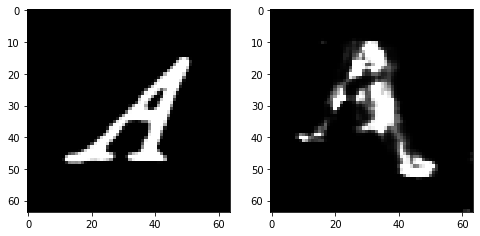

Epoch 46, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6939356997609138, Loss SSIM 2.3723774552345276, Loss Local 191.65948343276978


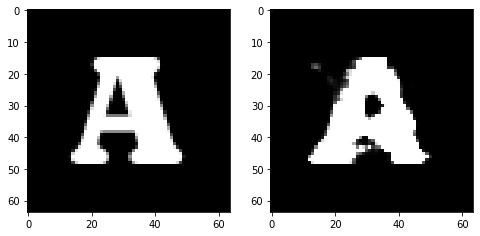

Epoch 47, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.055282145738601685, Loss SSIM 0.0726354718208313, Loss Local 5.002253532409668


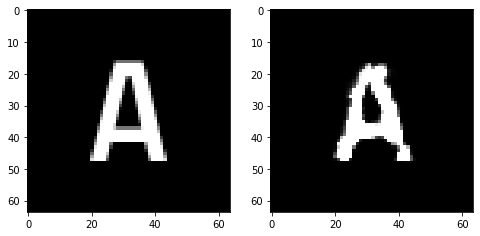

Epoch 47, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7147999927401543, Loss SSIM 2.3703309297561646, Loss Local 177.95162391662598


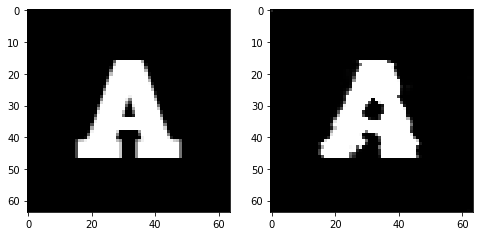

Epoch 47, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6853114441037178, Loss SSIM 2.372093141078949, Loss Local 184.4880394935608


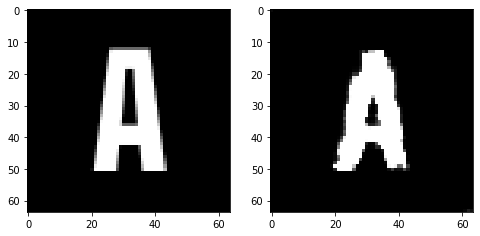

Epoch 47, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6917631775140762, Loss SSIM 2.3092572689056396, Loss Local 190.55885410308838


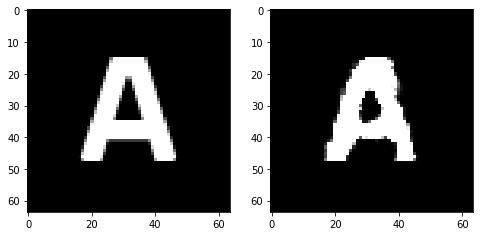

Epoch 47, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7084233090281487, Loss SSIM 2.3179633021354675, Loss Local 184.86342239379883


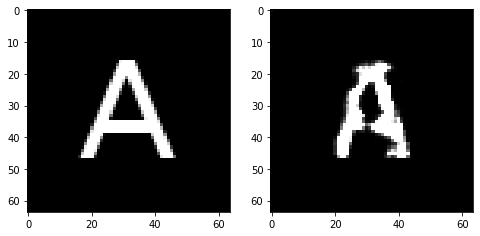

Epoch 47, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7036047205328941, Loss SSIM 2.357126474380493, Loss Local 190.91912412643433


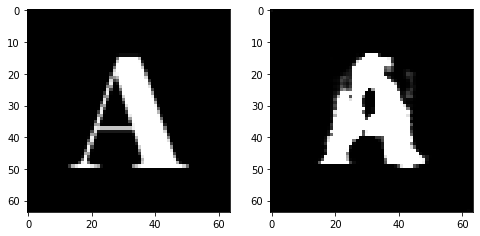

Epoch 47, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7422088496387005, Loss SSIM 2.424693465232849, Loss Local 201.10046005249023


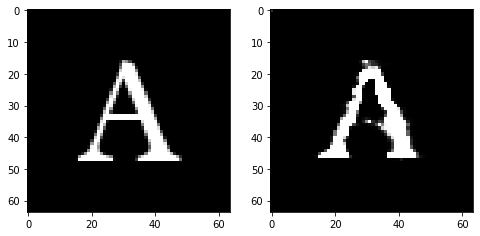

Epoch 47, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7255491949617863, Loss SSIM 2.362426996231079, Loss Local 190.6992645263672


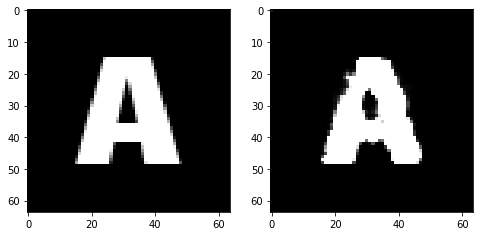

Epoch 48, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07438987493515015, Loss SSIM 0.11926060914993286, Loss Local 8.04288101196289


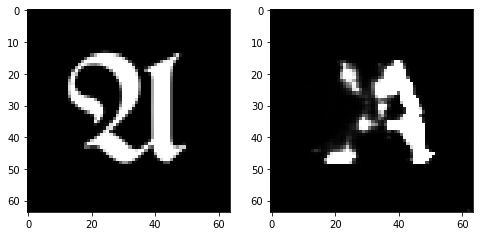

Epoch 48, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7091034278273582, Loss SSIM 2.374069631099701, Loss Local 195.72207689285278


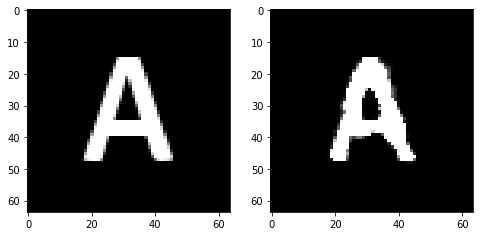

Epoch 48, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7086176611483097, Loss SSIM 2.383082926273346, Loss Local 189.27306127548218


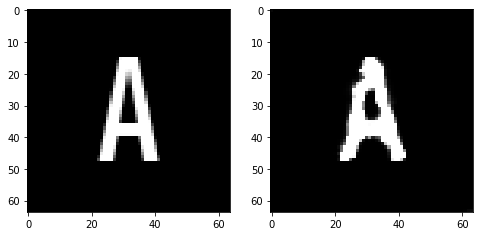

Epoch 48, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6804689206182957, Loss SSIM 2.300069272518158, Loss Local 188.74997806549072


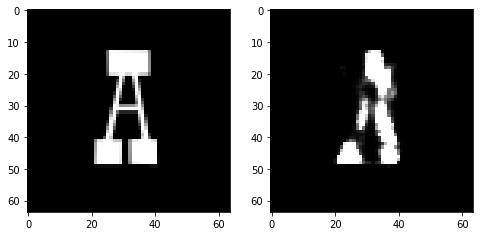

Epoch 48, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7143041267991066, Loss SSIM 2.3565194606781006, Loss Local 195.9573574066162


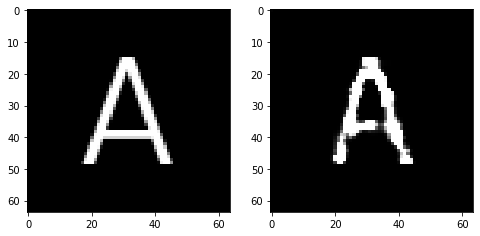

Epoch 48, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6932713612914085, Loss SSIM 2.3799977898597717, Loss Local 189.96655941009521


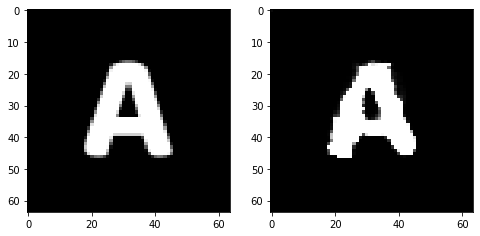

Epoch 48, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6864182725548744, Loss SSIM 2.2459649443626404, Loss Local 187.73161506652832


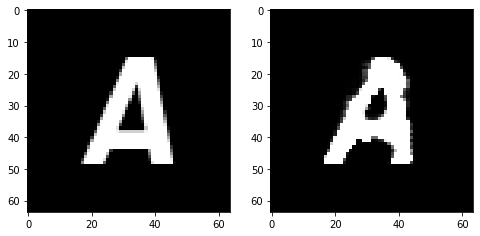

Epoch 48, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7405487298965454, Loss SSIM 2.4162846207618713, Loss Local 195.17642784118652


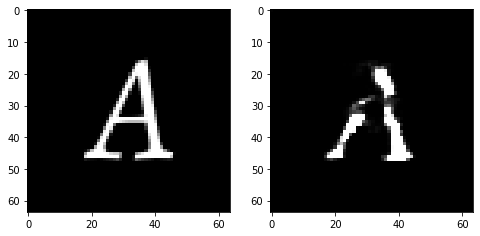

Epoch 49, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06659962981939316, Loss SSIM 0.08428335189819336, Loss Local 7.588684558868408


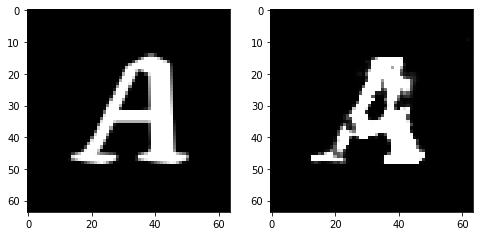

Epoch 49, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7336912788450718, Loss SSIM 2.395049750804901, Loss Local 188.22963857650757


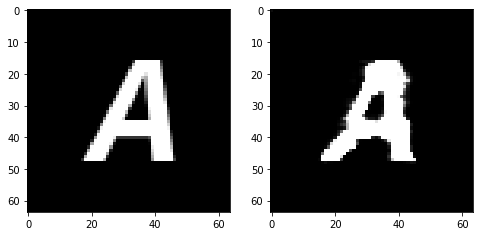

Epoch 49, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6935200467705727, Loss SSIM 2.309331476688385, Loss Local 185.28496885299683


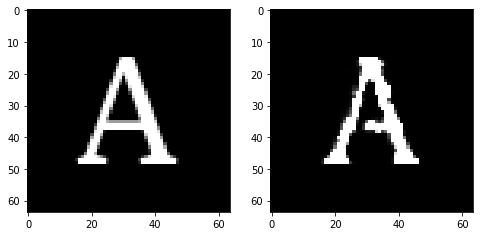

Epoch 49, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.689654991030693, Loss SSIM 2.3348600268363953, Loss Local 182.06469440460205


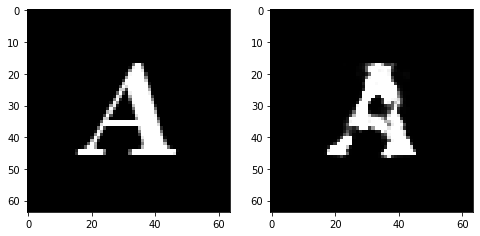

Epoch 49, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7129118703305721, Loss SSIM 2.3711816668510437, Loss Local 185.49813747406006


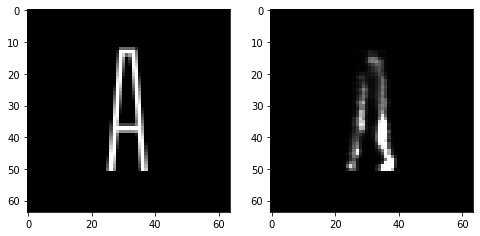

Epoch 49, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7173426821827888, Loss SSIM 2.4045714735984802, Loss Local 186.2499876022339


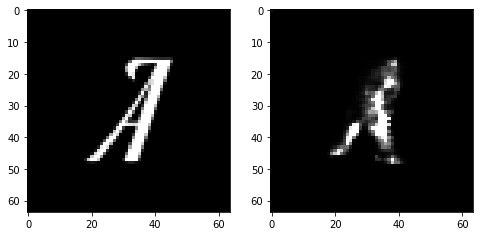

Epoch 49, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.762574128806591, Loss SSIM 2.4431540966033936, Loss Local 198.5559720993042


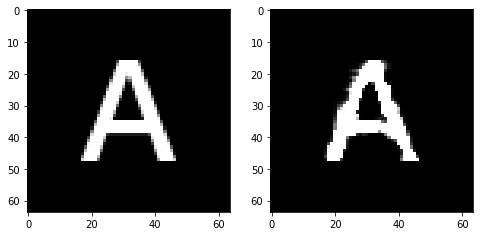

Epoch 49, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6765516474843025, Loss SSIM 2.2615537643432617, Loss Local 192.33312225341797


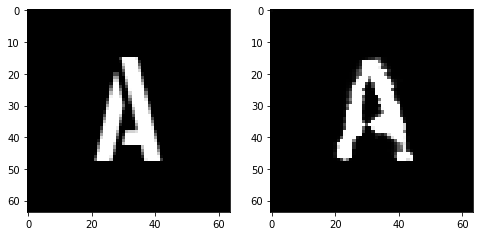

Epoch 50, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08371172100305557, Loss SSIM 0.12304186820983887, Loss Local 9.733316421508789


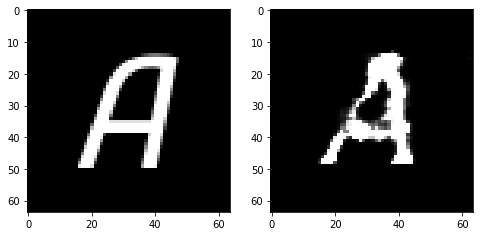

Epoch 50, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7243049927055836, Loss SSIM 2.3574398159980774, Loss Local 182.1380853652954


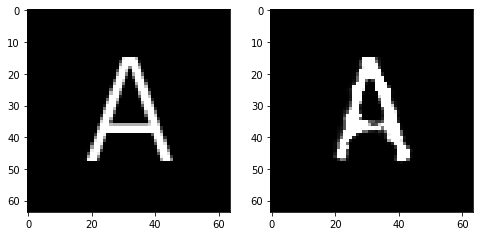

Epoch 50, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6884128786623478, Loss SSIM 2.32522976398468, Loss Local 193.21656131744385


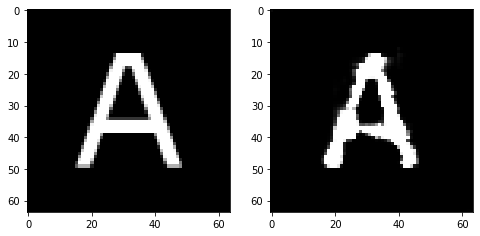

Epoch 50, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7269397154450417, Loss SSIM 2.3649786710739136, Loss Local 202.07504177093506


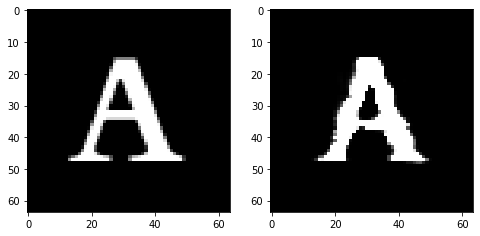

Epoch 50, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.687767155468464, Loss SSIM 2.3619880080223083, Loss Local 198.06322526931763


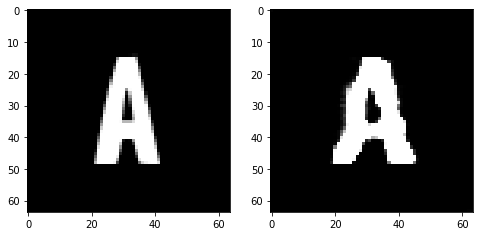

Epoch 50, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6696146987378597, Loss SSIM 2.3164865970611572, Loss Local 187.54597663879395


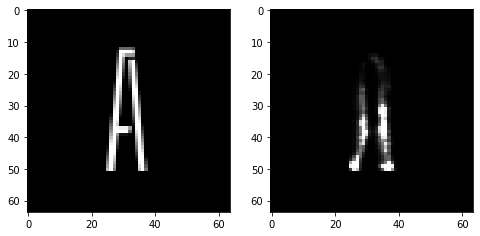

Epoch 50, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6884727142751217, Loss SSIM 2.267783463001251, Loss Local 193.4430537223816


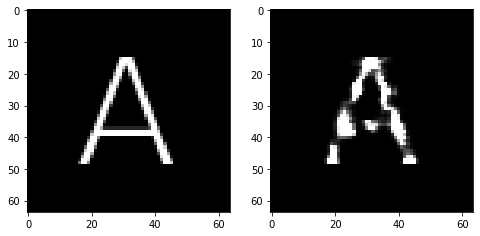

Epoch 50, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.722268495708704, Loss SSIM 2.3435298204421997, Loss Local 189.91924810409546


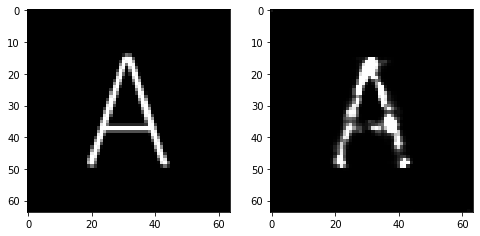

Epoch 51, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06255705654621124, Loss SSIM 0.08126884698867798, Loss Local 7.230144023895264


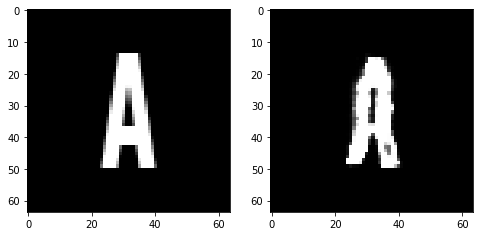

Epoch 51, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6967023760080338, Loss SSIM 2.392091929912567, Loss Local 191.04083442687988


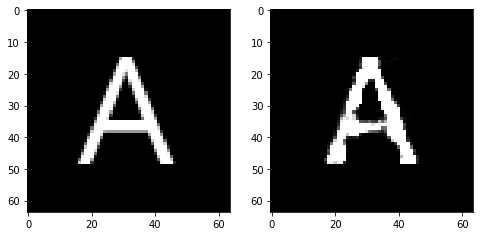

Epoch 51, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6915314495563507, Loss SSIM 2.3239641785621643, Loss Local 185.31426572799683


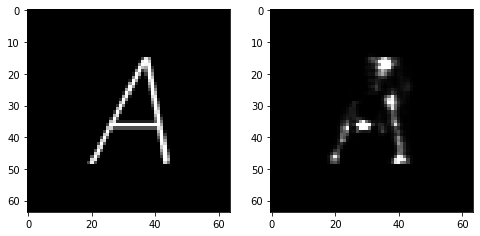

Epoch 51, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.677259799093008, Loss SSIM 2.312715232372284, Loss Local 187.46457195281982


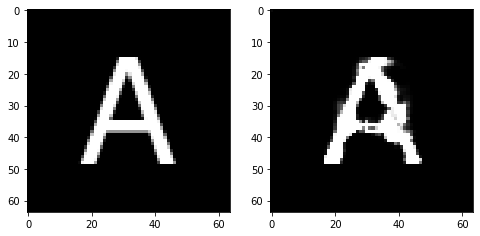

Epoch 51, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7596244812011719, Loss SSIM 2.4497417211532593, Loss Local 192.22283935546875


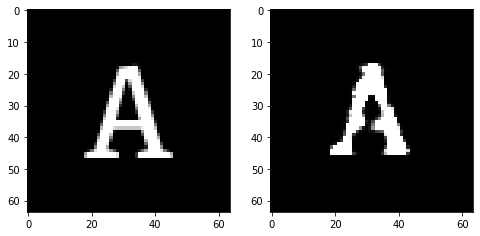

Epoch 51, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7252279743552208, Loss SSIM 2.403031647205353, Loss Local 193.23687267303467


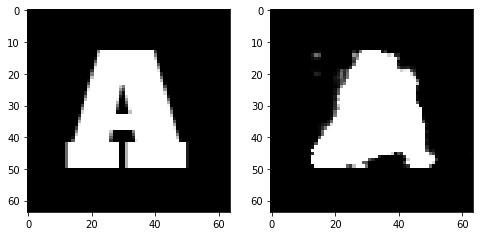

Epoch 51, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7154099605977535, Loss SSIM 2.3395387530326843, Loss Local 195.23802185058594


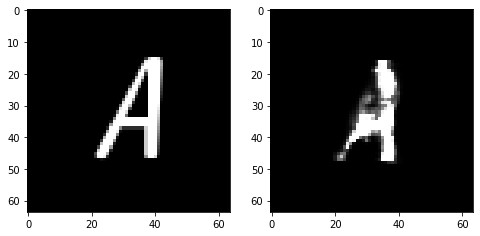

Epoch 51, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6943691596388817, Loss SSIM 2.3167834281921387, Loss Local 187.53040552139282


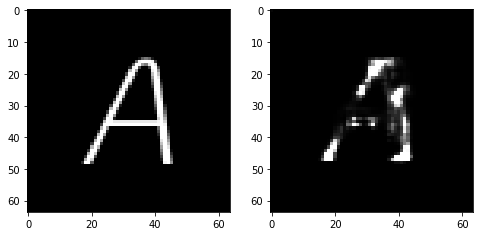

Epoch 52, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06772851198911667, Loss SSIM 0.0867236852645874, Loss Local 7.748335838317871


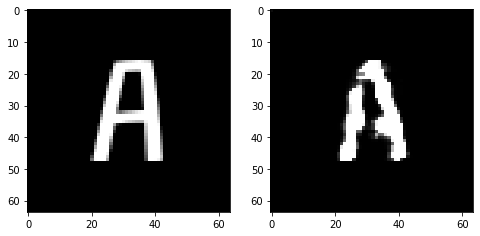

Epoch 52, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7152611277997494, Loss SSIM 2.35501492023468, Loss Local 186.00629663467407


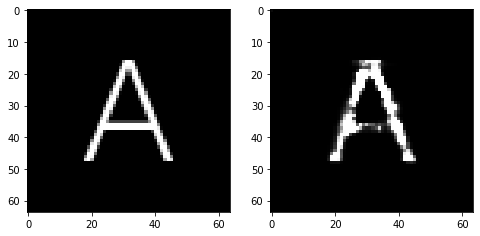

Epoch 52, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7117254622280598, Loss SSIM 2.3525297045707703, Loss Local 197.49528646469116


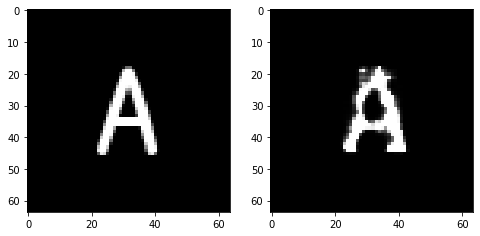

Epoch 52, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6835578009486198, Loss SSIM 2.310697317123413, Loss Local 194.5925588607788


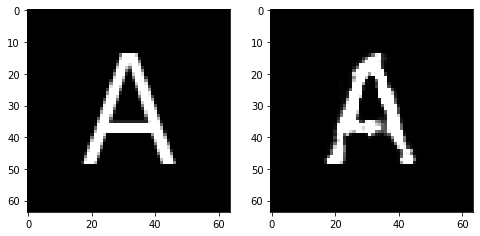

Epoch 52, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6904928386211395, Loss SSIM 2.335698902606964, Loss Local 190.1250433921814


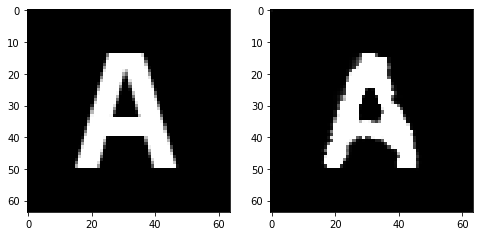

Epoch 52, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7207607179880142, Loss SSIM 2.3813337683677673, Loss Local 190.0482988357544


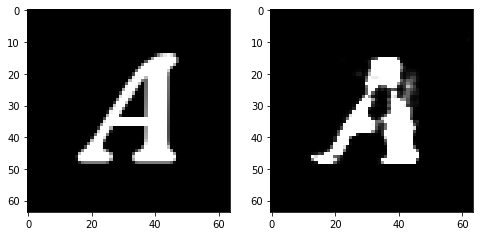

Epoch 52, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7099163569509983, Loss SSIM 2.3536519408226013, Loss Local 193.80052852630615


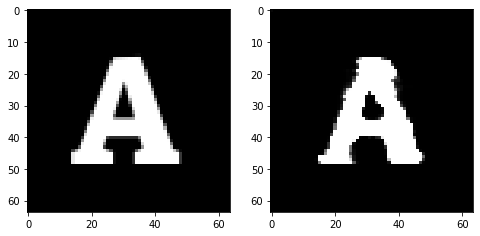

Epoch 52, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6690986528992653, Loss SSIM 2.3128333687782288, Loss Local 188.79312562942505


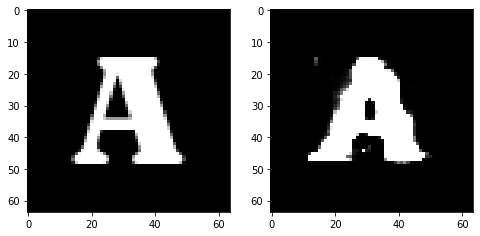

Epoch 53, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08284255117177963, Loss SSIM 0.11284738779067993, Loss Local 8.742716789245605


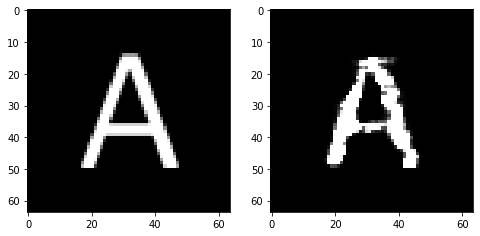

Epoch 53, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6945708580315113, Loss SSIM 2.298647403717041, Loss Local 190.4719729423523


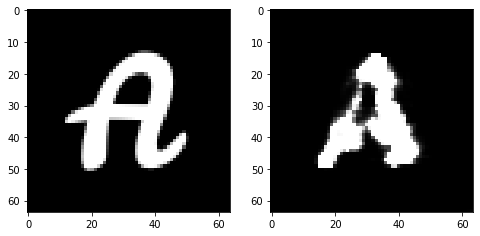

Epoch 53, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.708466112613678, Loss SSIM 2.36674040555954, Loss Local 201.0034794807434


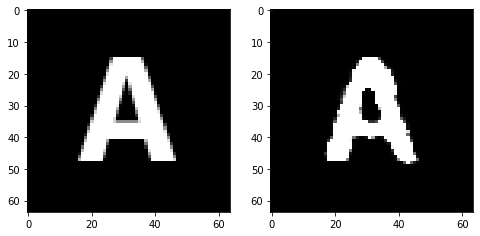

Epoch 53, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7282664775848389, Loss SSIM 2.408083498477936, Loss Local 193.61808824539185


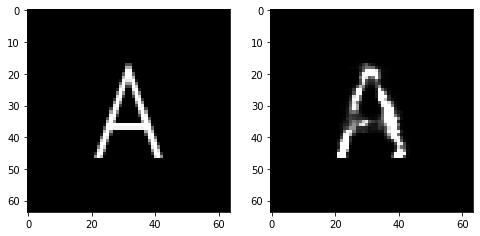

Epoch 53, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7038564085960388, Loss SSIM 2.3637590408325195, Loss Local 189.4000163078308


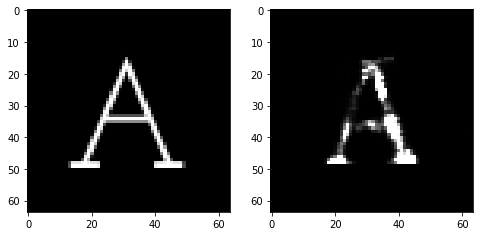

Epoch 53, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6956472024321556, Loss SSIM 2.3287585377693176, Loss Local 195.78305387496948


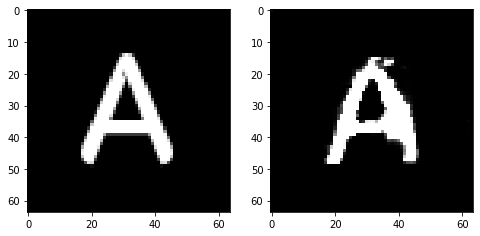

Epoch 53, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.699979968369007, Loss SSIM 2.2855529189109802, Loss Local 183.36159658432007


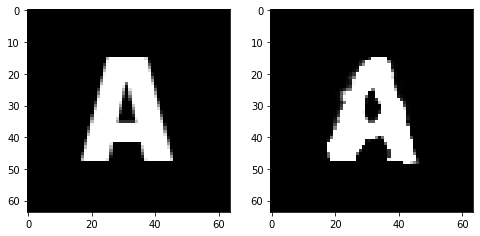

Epoch 53, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6619582884013653, Loss SSIM 2.3058183789253235, Loss Local 189.76833152770996


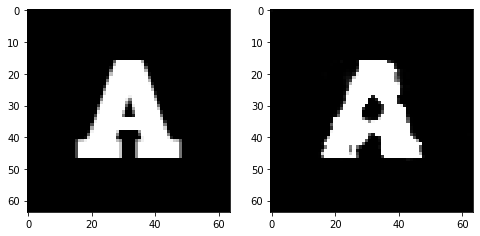

Epoch 54, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06076183170080185, Loss SSIM 0.08794713020324707, Loss Local 8.003913879394531


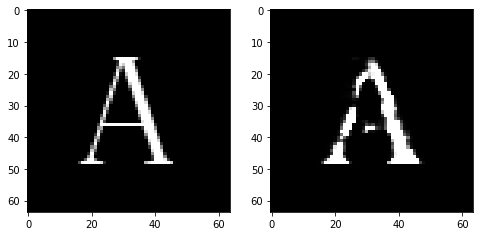

Epoch 54, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7309425361454487, Loss SSIM 2.3349520564079285, Loss Local 187.7414836883545


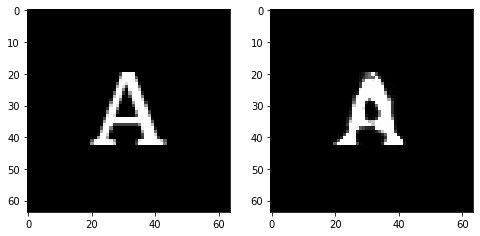

Epoch 54, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7157537788152695, Loss SSIM 2.3200064301490784, Loss Local 195.52961540222168


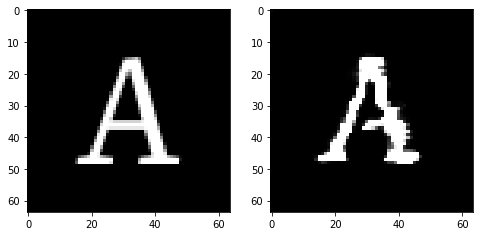

Epoch 54, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6894053220748901, Loss SSIM 2.277665913105011, Loss Local 187.40375232696533


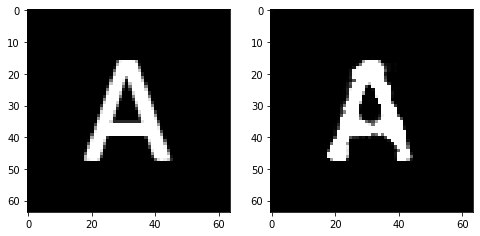

Epoch 54, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6760236322879791, Loss SSIM 2.311513304710388, Loss Local 189.34645223617554


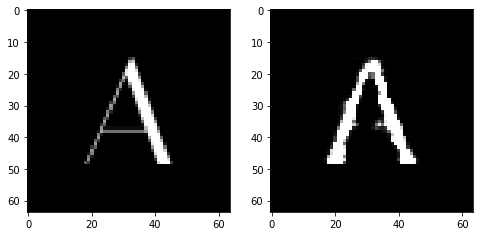

Epoch 54, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7668177783489227, Loss SSIM 2.493034303188324, Loss Local 198.8578519821167


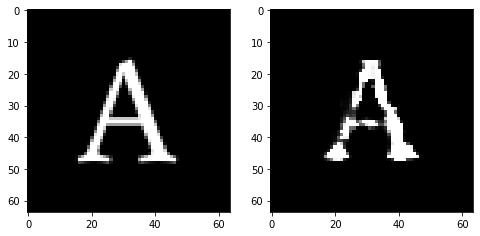

Epoch 54, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6889399252831936, Loss SSIM 2.4166924953460693, Loss Local 188.10398387908936


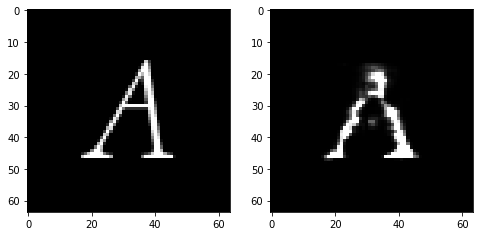

Epoch 54, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6886933334171772, Loss SSIM 2.334772050380707, Loss Local 196.06023502349854


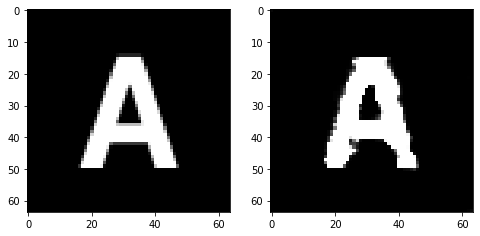

Epoch 55, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07702473551034927, Loss SSIM 0.11400365829467773, Loss Local 7.557279109954834


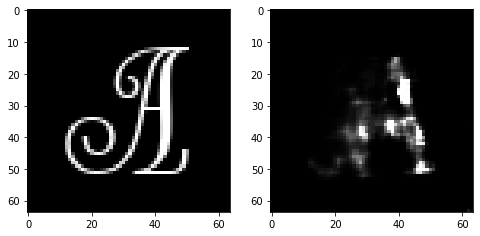

Epoch 55, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6893978081643581, Loss SSIM 2.349534273147583, Loss Local 193.09526014328003


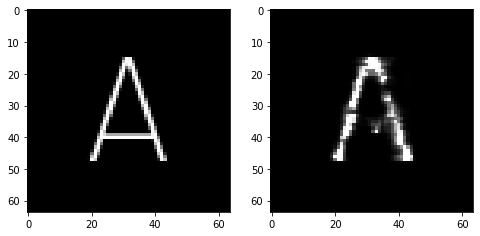

Epoch 55, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.704656396061182, Loss SSIM 2.2881352305412292, Loss Local 187.08348655700684


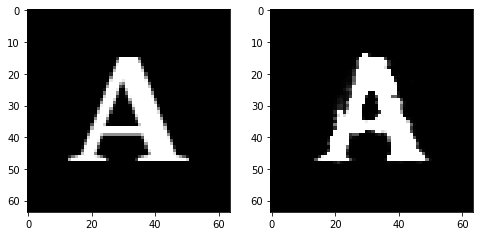

Epoch 55, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7090188972651958, Loss SSIM 2.4181350469589233, Loss Local 182.455180644989


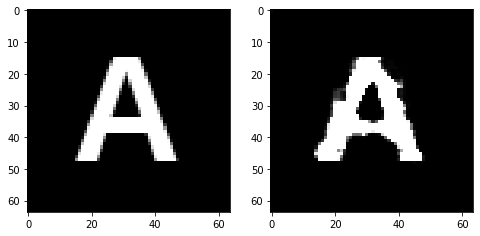

Epoch 55, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6628162525594234, Loss SSIM 2.208980441093445, Loss Local 176.40534925460815


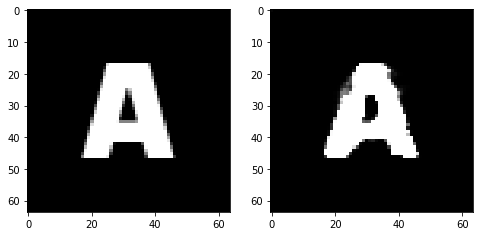

Epoch 55, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7038717344403267, Loss SSIM 2.3561861515045166, Loss Local 195.52458000183105


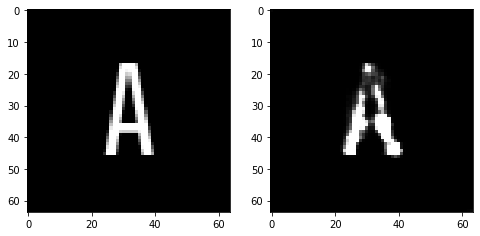

Epoch 55, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7051065191626549, Loss SSIM 2.341584801673889, Loss Local 196.07270765304565


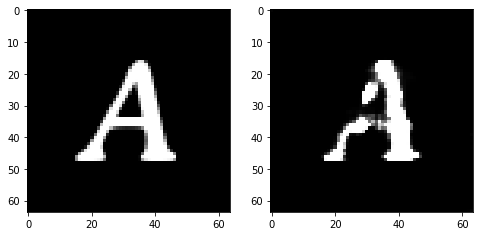

Epoch 55, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7176904156804085, Loss SSIM 2.3966402411460876, Loss Local 192.12118101119995


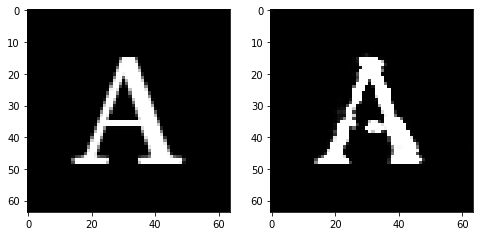

Epoch 56, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05391094461083412, Loss SSIM 0.07468980550765991, Loss Local 6.298578262329102


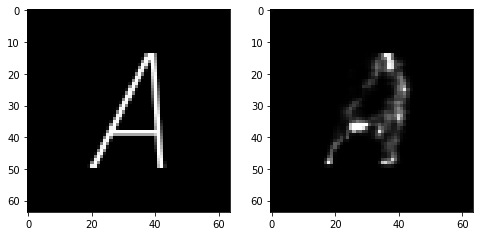

Epoch 56, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6622801832854748, Loss SSIM 2.2832372784614563, Loss Local 190.07014989852905


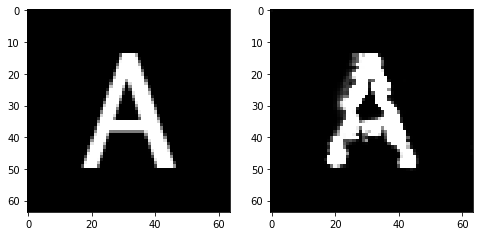

Epoch 56, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7093600034713745, Loss SSIM 2.401605188846588, Loss Local 192.2193455696106


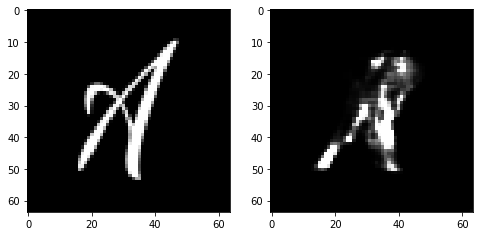

Epoch 56, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6654725447297096, Loss SSIM 2.2635579705238342, Loss Local 189.94777488708496


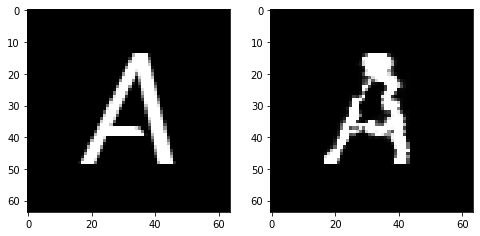

Epoch 56, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.713356625288725, Loss SSIM 2.3336724638938904, Loss Local 200.50386810302734


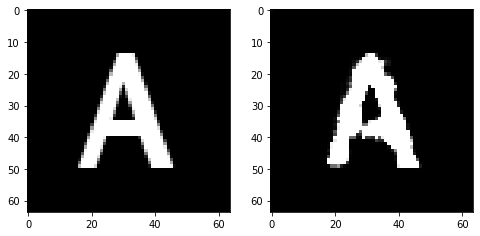

Epoch 56, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.703891895711422, Loss SSIM 2.3163236379623413, Loss Local 190.7304196357727


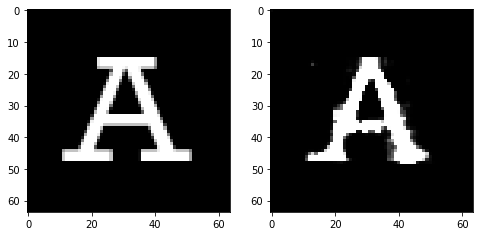

Epoch 56, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.734293844550848, Loss SSIM 2.3702138662338257, Loss Local 191.6752471923828


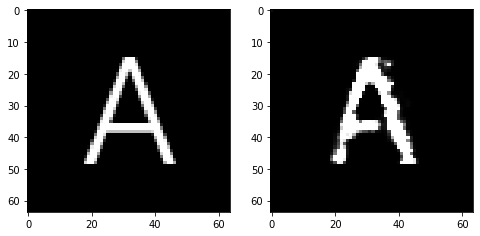

Epoch 56, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7383454255759716, Loss SSIM 2.4555845856666565, Loss Local 185.72510290145874


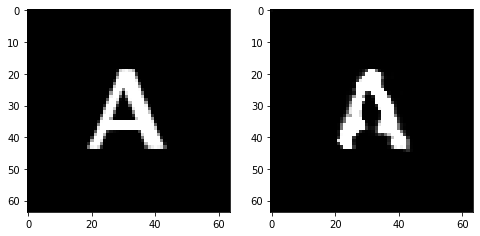

Epoch 57, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06302817910909653, Loss SSIM 0.07805776596069336, Loss Local 6.54969596862793


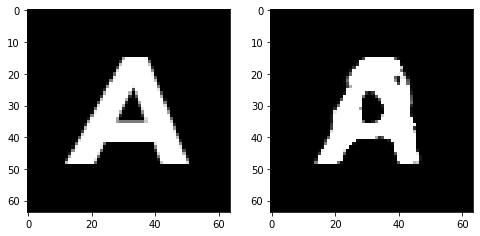

Epoch 57, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7010742090642452, Loss SSIM 2.3033493757247925, Loss Local 177.55523109436035


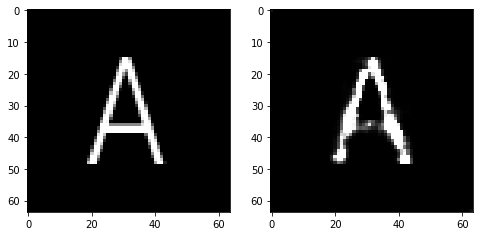

Epoch 57, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7454325444996357, Loss SSIM 2.4150301814079285, Loss Local 201.51318264007568


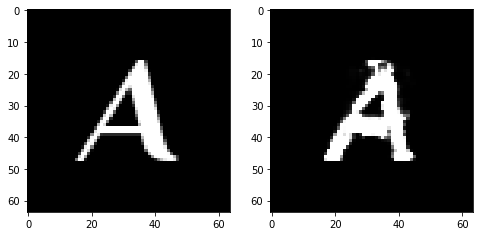

Epoch 57, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6981151029467583, Loss SSIM 2.321797549724579, Loss Local 186.1203670501709


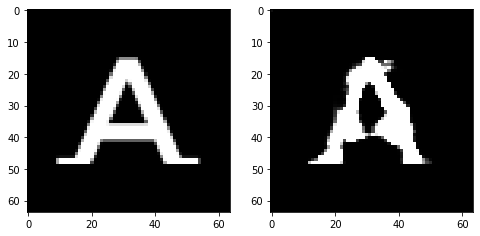

Epoch 57, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7160317450761795, Loss SSIM 2.402563214302063, Loss Local 191.60693454742432


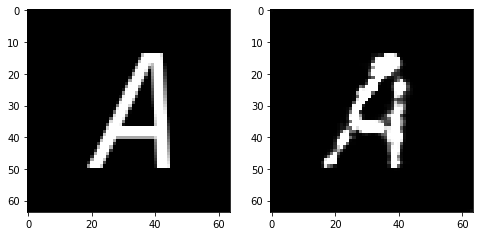

Epoch 57, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6639881953597069, Loss SSIM 2.2601401805877686, Loss Local 188.53184175491333


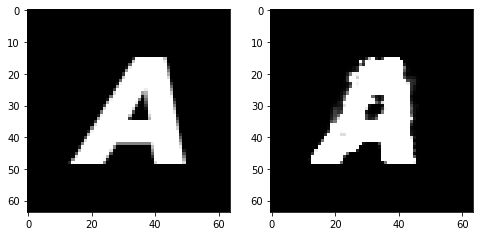

Epoch 57, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.667525913566351, Loss SSIM 2.2969910502433777, Loss Local 187.98082327842712


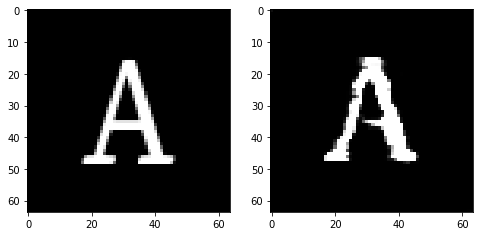

Epoch 57, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7263432256877422, Loss SSIM 2.4000393748283386, Loss Local 190.92180681228638


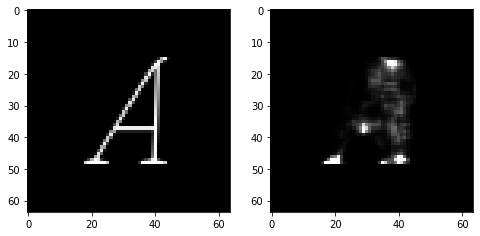

Epoch 58, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06040290370583534, Loss SSIM 0.08393865823745728, Loss Local 7.798744201660156


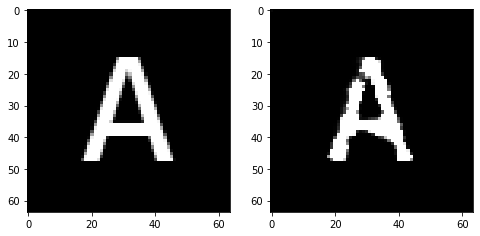

Epoch 58, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7359218373894691, Loss SSIM 2.3606385588645935, Loss Local 191.1163773536682


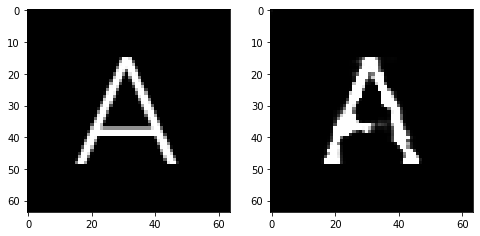

Epoch 58, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6965253464877605, Loss SSIM 2.382067322731018, Loss Local 192.98981523513794


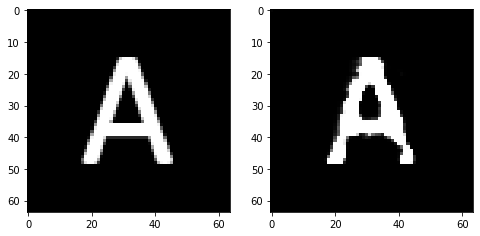

Epoch 58, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.768479123711586, Loss SSIM 2.4362521171569824, Loss Local 202.37361431121826


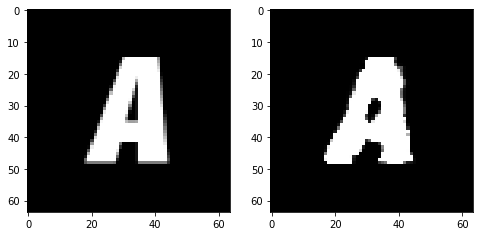

Epoch 58, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.711010430008173, Loss SSIM 2.3296489119529724, Loss Local 183.7198257446289


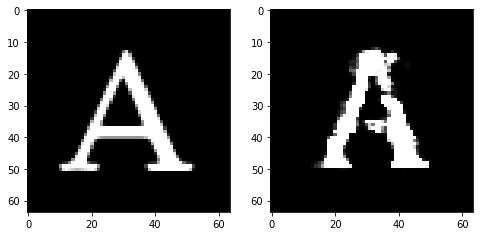

Epoch 58, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6596530936658382, Loss SSIM 2.2256163358688354, Loss Local 182.32653427124023


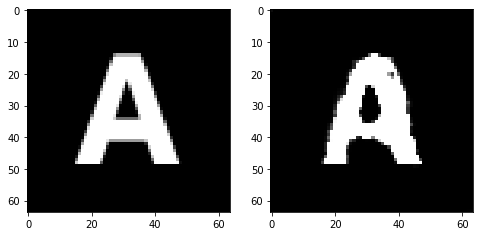

Epoch 58, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6334552764892578, Loss SSIM 2.2721943259239197, Loss Local 189.39984607696533


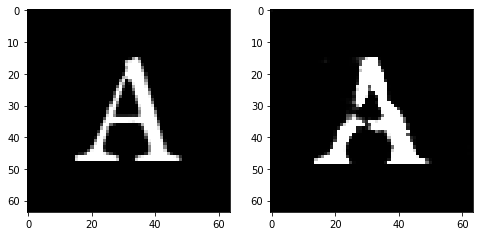

Epoch 58, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6919556111097336, Loss SSIM 2.3949275612831116, Loss Local 193.9890604019165


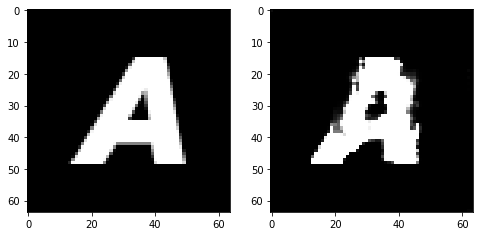

Epoch 59, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07042471319437027, Loss SSIM 0.1001010537147522, Loss Local 8.00067138671875


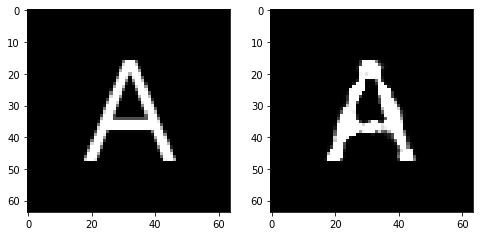

Epoch 59, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6679692566394806, Loss SSIM 2.2138049602508545, Loss Local 193.70879793167114


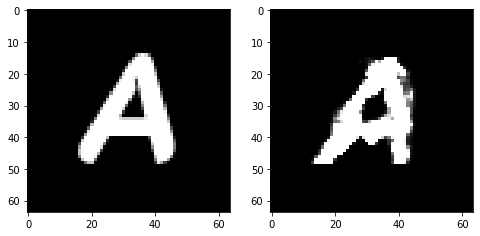

Epoch 59, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7220790348947048, Loss SSIM 2.3937249183654785, Loss Local 189.51350498199463


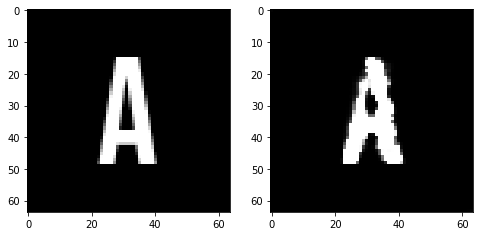

Epoch 59, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6569761335849762, Loss SSIM 2.2920011281967163, Loss Local 199.337571144104


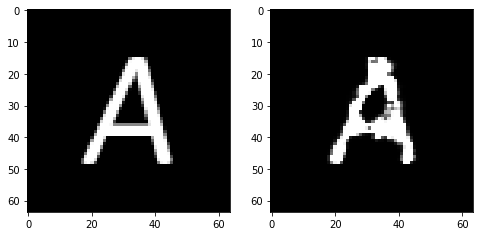

Epoch 59, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7600701712071896, Loss SSIM 2.452143132686615, Loss Local 196.21755695343018


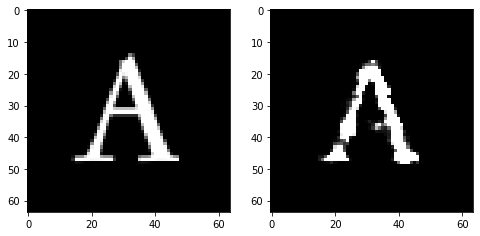

Epoch 59, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6712212786078453, Loss SSIM 2.270607888698578, Loss Local 183.53668642044067


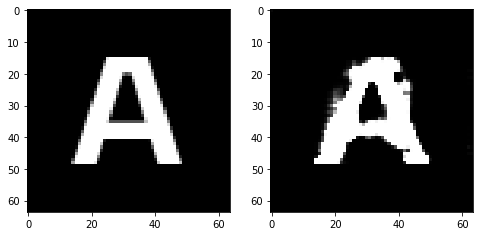

Epoch 59, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.640713106840849, Loss SSIM 2.266225576400757, Loss Local 189.84124851226807


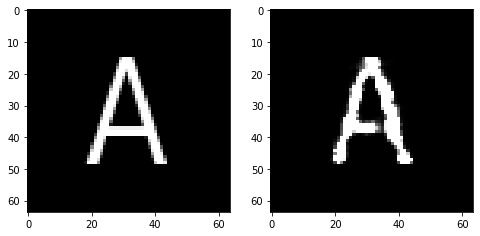

Epoch 59, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7104474045336246, Loss SSIM 2.2988354563713074, Loss Local 180.9222993850708


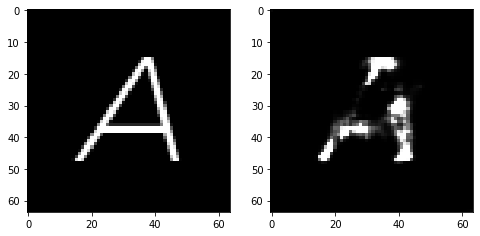

Epoch 60, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07582801580429077, Loss SSIM 0.10329127311706543, Loss Local 7.733234882354736


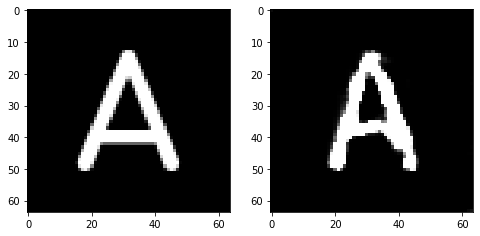

Epoch 60, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7360119000077248, Loss SSIM 2.4219189882278442, Loss Local 194.85498094558716


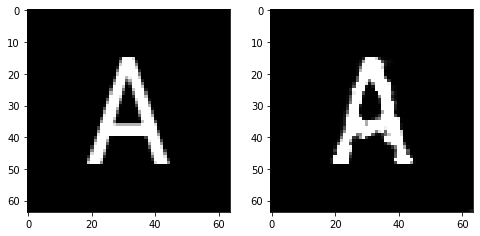

Epoch 60, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6598366759717464, Loss SSIM 2.249053716659546, Loss Local 187.36441707611084


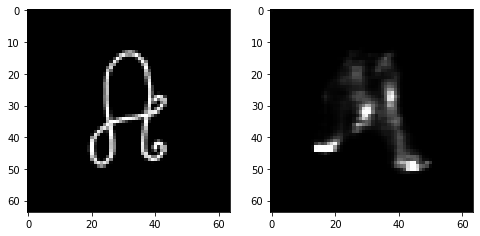

Epoch 60, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7150713726878166, Loss SSIM 2.33373361825943, Loss Local 199.0084958076477


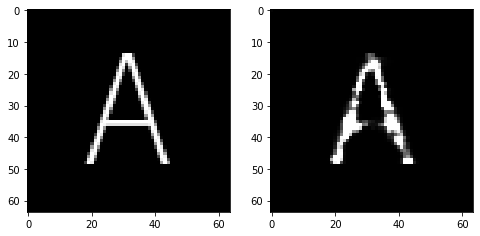

Epoch 60, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.690259400755167, Loss SSIM 2.3081979751586914, Loss Local 176.65210437774658


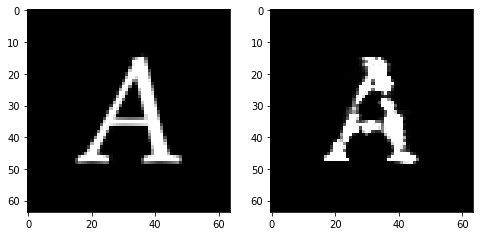

Epoch 60, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.682292427867651, Loss SSIM 2.3273277282714844, Loss Local 183.25229740142822


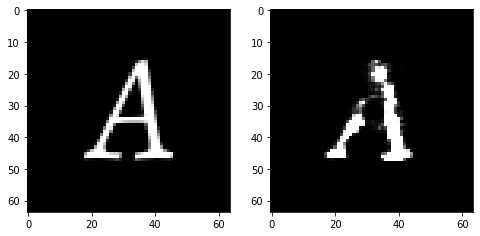

Epoch 60, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.68734210729599, Loss SSIM 2.3069692254066467, Loss Local 188.30962944030762


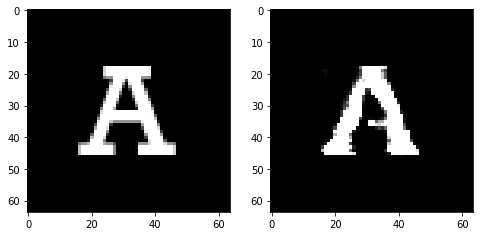

Epoch 60, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.679246224462986, Loss SSIM 2.2830732464790344, Loss Local 195.2147068977356


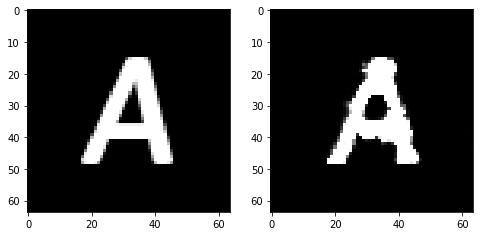

Epoch 61, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.058841221034526825, Loss SSIM 0.07940304279327393, Loss Local 6.686736583709717


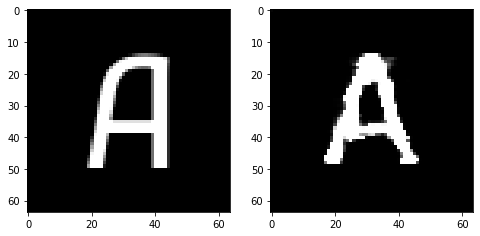

Epoch 61, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6718948110938072, Loss SSIM 2.2786797285079956, Loss Local 176.00055408477783


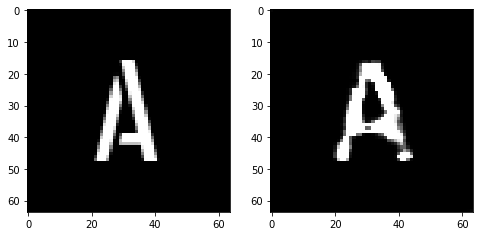

Epoch 61, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6648890562355518, Loss SSIM 2.2798338532447815, Loss Local 184.33163166046143


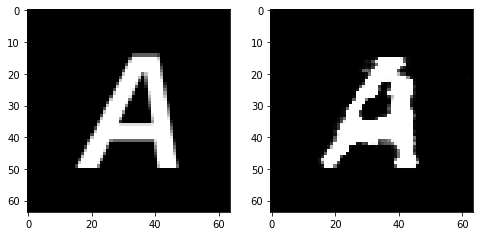

Epoch 61, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6958418153226376, Loss SSIM 2.315279960632324, Loss Local 194.58398723602295


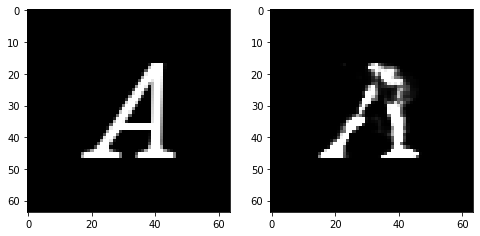

Epoch 61, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6566187217831612, Loss SSIM 2.2103636264801025, Loss Local 190.70052862167358


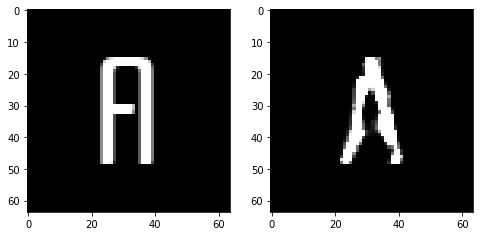

Epoch 61, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7187282294034958, Loss SSIM 2.396332323551178, Loss Local 186.0759162902832


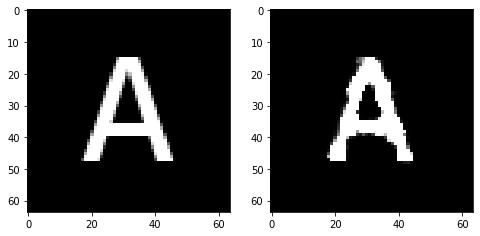

Epoch 61, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.746883250772953, Loss SSIM 2.4361020922660828, Loss Local 189.79064273834229


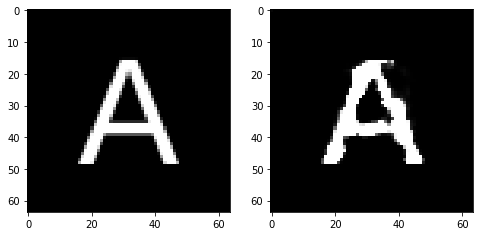

Epoch 61, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6657425500452518, Loss SSIM 2.2831221222877502, Loss Local 191.52979946136475


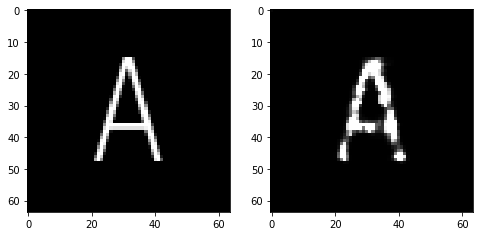

Epoch 62, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08387456834316254, Loss SSIM 0.12945610284805298, Loss Local 10.07713794708252


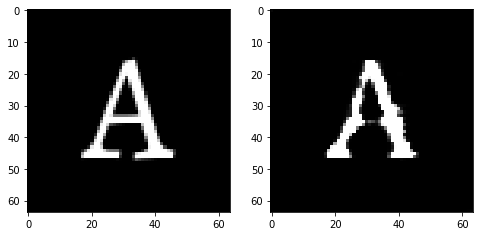

Epoch 62, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7014965303242207, Loss SSIM 2.3834670782089233, Loss Local 200.5666356086731


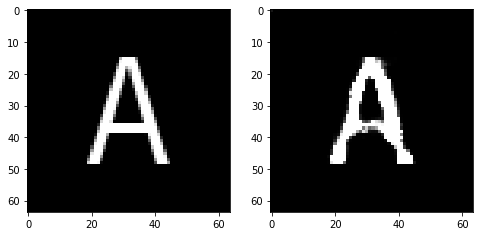

Epoch 62, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6449777595698833, Loss SSIM 2.1848979592323303, Loss Local 182.49360847473145


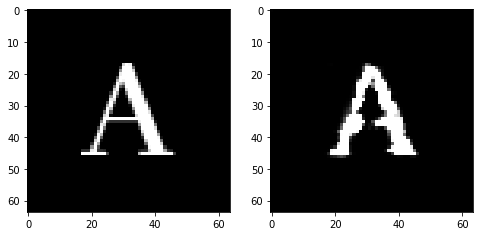

Epoch 62, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.747119352221489, Loss SSIM 2.407375693321228, Loss Local 188.2753667831421


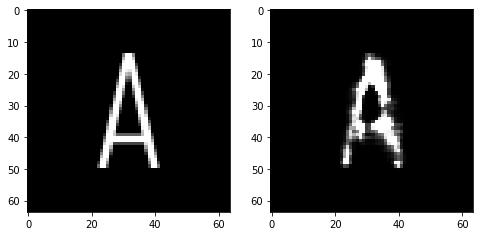

Epoch 62, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6791221722960472, Loss SSIM 2.3377565145492554, Loss Local 197.87672424316406


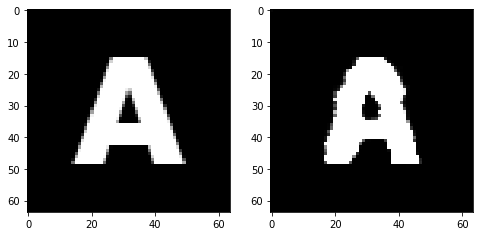

Epoch 62, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6571548283100128, Loss SSIM 2.2586751580238342, Loss Local 179.8116626739502


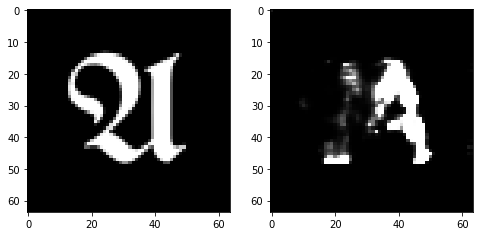

Epoch 62, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6927230916917324, Loss SSIM 2.329710602760315, Loss Local 181.17787742614746


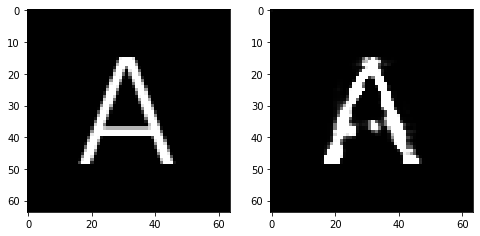

Epoch 62, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6896089985966682, Loss SSIM 2.2858278155326843, Loss Local 193.01855087280273


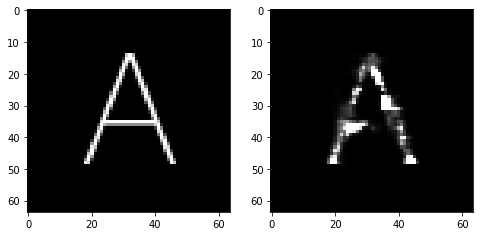

Epoch 63, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07047588378190994, Loss SSIM 0.09726518392562866, Loss Local 7.885002613067627


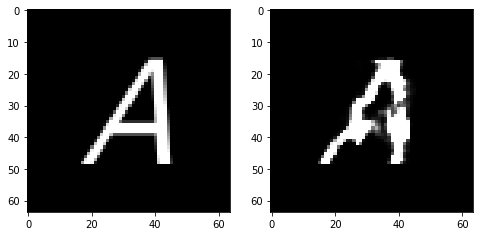

Epoch 63, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6553405672311783, Loss SSIM 2.291138470172882, Loss Local 201.43328285217285


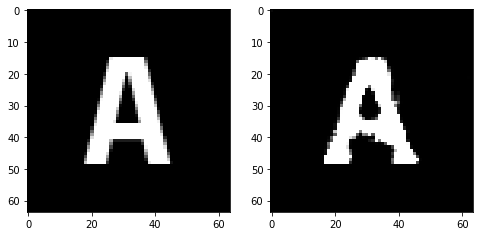

Epoch 63, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.703125536441803, Loss SSIM 2.3381972312927246, Loss Local 187.34800958633423


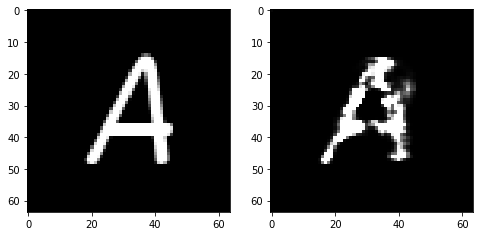

Epoch 63, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.729356724768877, Loss SSIM 2.3193247318267822, Loss Local 191.24157524108887


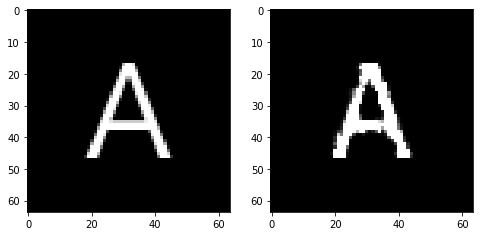

Epoch 63, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6779303513467312, Loss SSIM 2.332856595516205, Loss Local 186.3161323070526


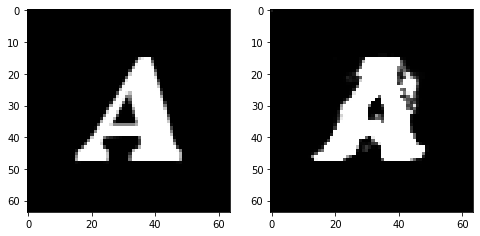

Epoch 63, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7185622081160545, Loss SSIM 2.378107249736786, Loss Local 186.444917678833


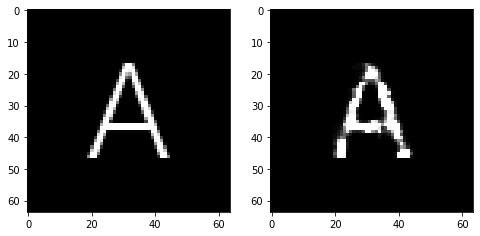

Epoch 63, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7019047625362873, Loss SSIM 2.3378393054008484, Loss Local 190.67926216125488


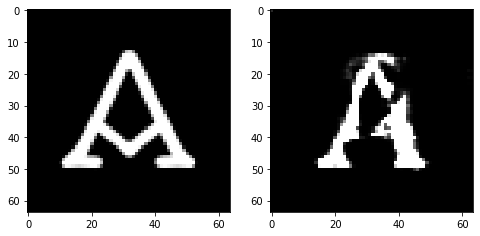

Epoch 63, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7035100162029266, Loss SSIM 2.3565688133239746, Loss Local 183.97623443603516


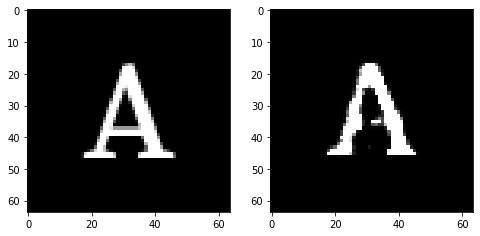

Epoch 64, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06273183971643448, Loss SSIM 0.10498952865600586, Loss Local 5.572257995605469


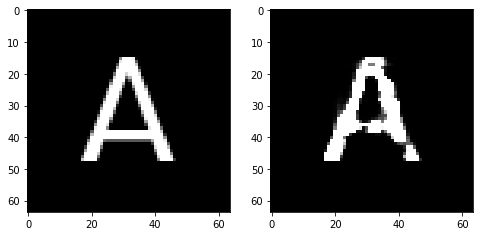

Epoch 64, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6510420441627502, Loss SSIM 2.2519315481185913, Loss Local 172.47784805297852


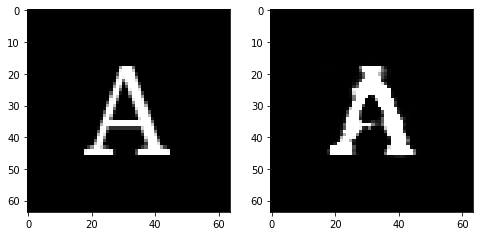

Epoch 64, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.696670576930046, Loss SSIM 2.3470988273620605, Loss Local 186.5354814529419


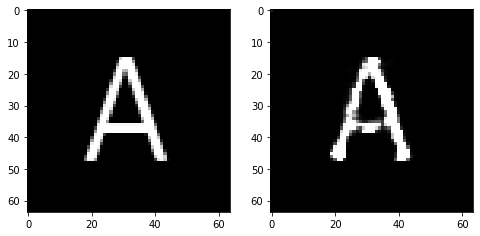

Epoch 64, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7305631674826145, Loss SSIM 2.392906904220581, Loss Local 192.62951707839966


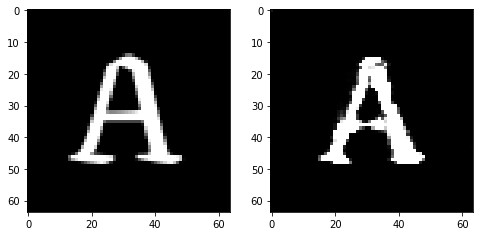

Epoch 64, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.656977903097868, Loss SSIM 2.2092984318733215, Loss Local 190.60508060455322


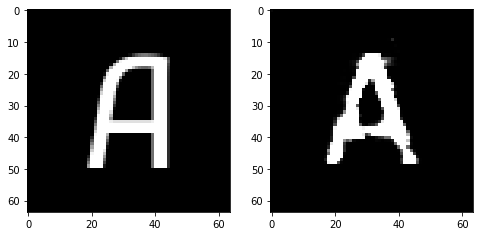

Epoch 64, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6986390799283981, Loss SSIM 2.3406922221183777, Loss Local 199.211932182312


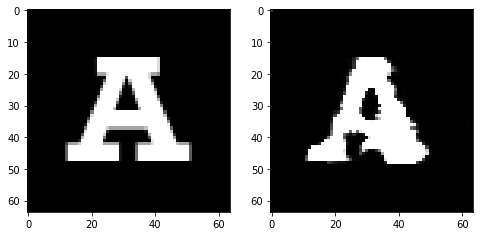

Epoch 64, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6934630498290062, Loss SSIM 2.3202481865882874, Loss Local 188.5081663131714


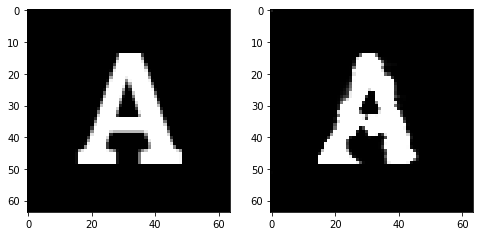

Epoch 64, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7129267789423466, Loss SSIM 2.323742985725403, Loss Local 197.10263204574585


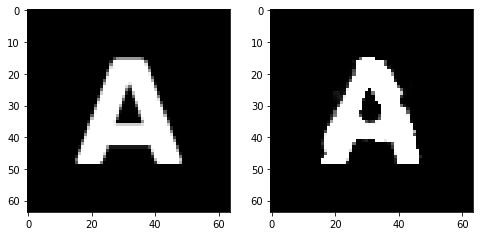

Epoch 65, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06045706570148468, Loss SSIM 0.07689106464385986, Loss Local 7.4076457023620605


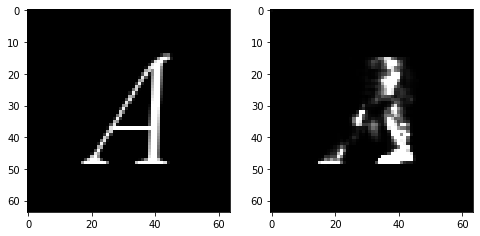

Epoch 65, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7007599510252476, Loss SSIM 2.3223437666893005, Loss Local 187.88952779769897


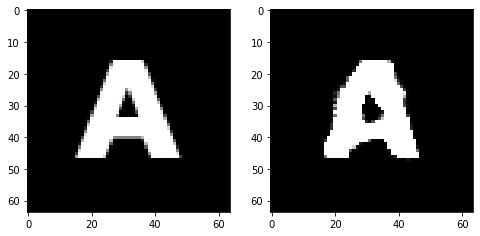

Epoch 65, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7034463956952095, Loss SSIM 2.3494322299957275, Loss Local 183.17722940444946


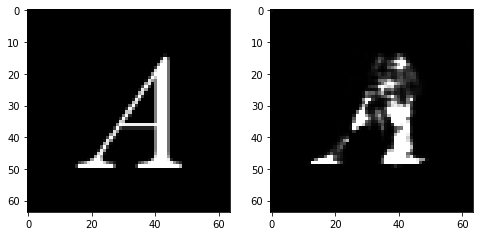

Epoch 65, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6979042291641235, Loss SSIM 2.3680633306503296, Loss Local 184.49885034561157


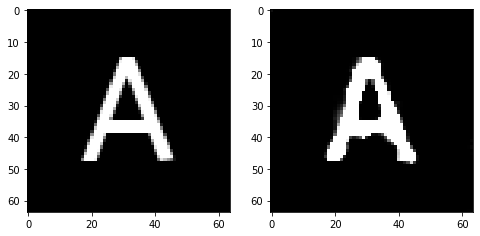

Epoch 65, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6465139091014862, Loss SSIM 2.1886062622070312, Loss Local 181.9302453994751


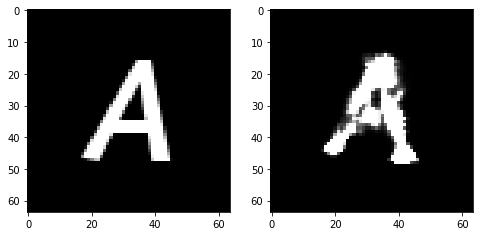

Epoch 65, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7109928913414478, Loss SSIM 2.367152452468872, Loss Local 194.71298599243164


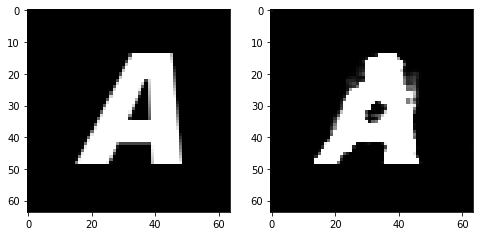

Epoch 65, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7137046083807945, Loss SSIM 2.39706152677536, Loss Local 194.741473197937


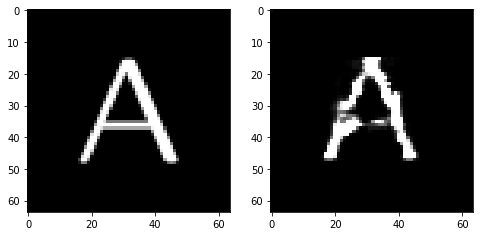

Epoch 65, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7026781924068928, Loss SSIM 2.3487536907196045, Loss Local 182.43509531021118


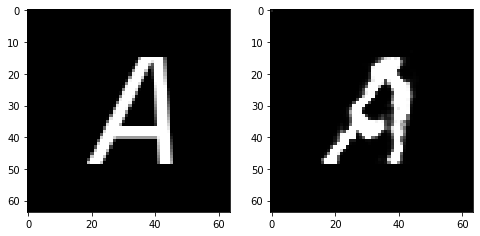

Epoch 66, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06098531559109688, Loss SSIM 0.08909106254577637, Loss Local 7.51570463180542


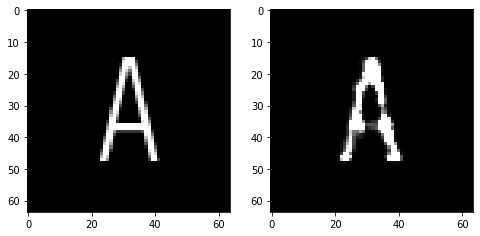

Epoch 66, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7069110237061977, Loss SSIM 2.3069100379943848, Loss Local 189.35159254074097


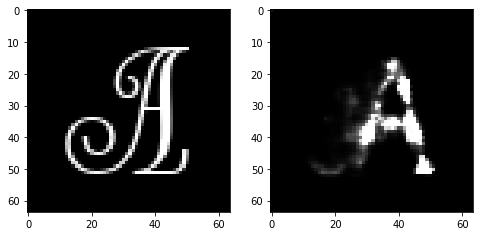

Epoch 66, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6845376677811146, Loss SSIM 2.3188769221305847, Loss Local 195.98336839675903


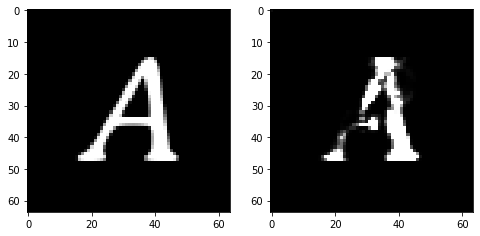

Epoch 66, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6618322767317295, Loss SSIM 2.2455824613571167, Loss Local 189.657066822052


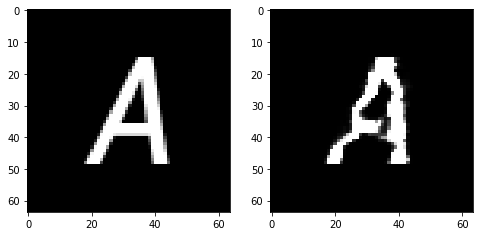

Epoch 66, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7022277005016804, Loss SSIM 2.366181433200836, Loss Local 189.06533765792847


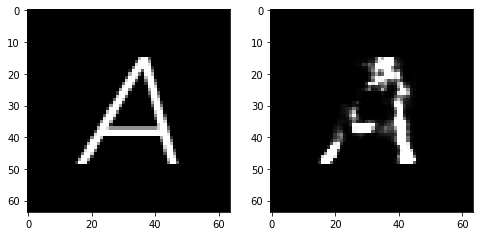

Epoch 66, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6806842274963856, Loss SSIM 2.253220558166504, Loss Local 184.1611294746399


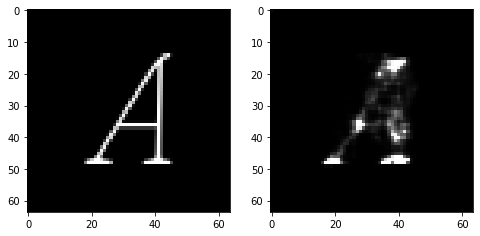

Epoch 66, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.698416743427515, Loss SSIM 2.336761474609375, Loss Local 187.69870710372925


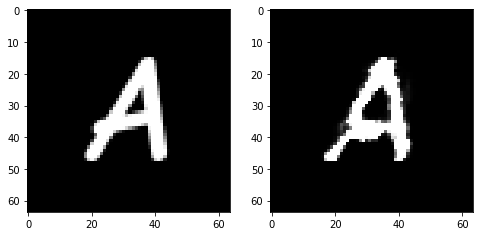

Epoch 66, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6587375439703465, Loss SSIM 2.28850394487381, Loss Local 176.7755856513977


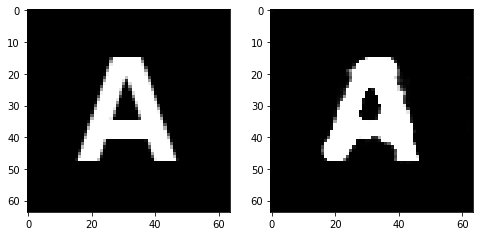

Epoch 67, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06016874685883522, Loss SSIM 0.07999080419540405, Loss Local 6.733976364135742


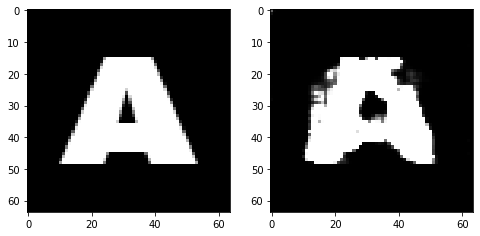

Epoch 67, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6688785701990128, Loss SSIM 2.274970591068268, Loss Local 195.45843982696533


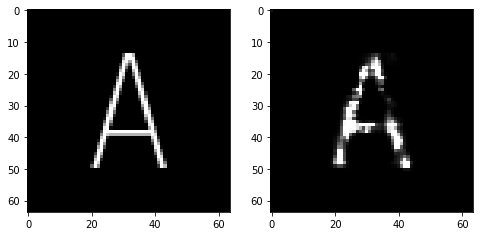

Epoch 67, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7412662841379642, Loss SSIM 2.4447125792503357, Loss Local 188.4539442062378


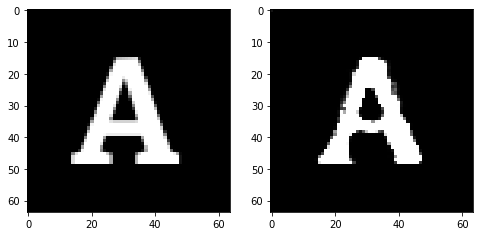

Epoch 67, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6995965279638767, Loss SSIM 2.342947542667389, Loss Local 202.49593210220337


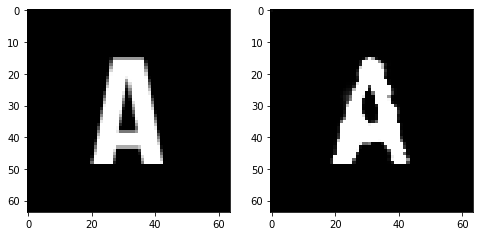

Epoch 67, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.691904477775097, Loss SSIM 2.323476254940033, Loss Local 193.04403400421143


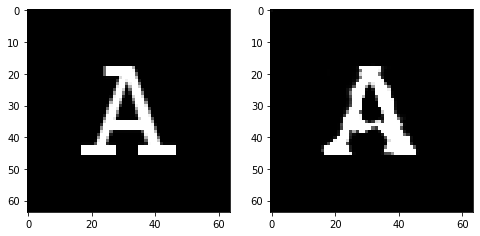

Epoch 67, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6463469713926315, Loss SSIM 2.2365124225616455, Loss Local 182.47139835357666


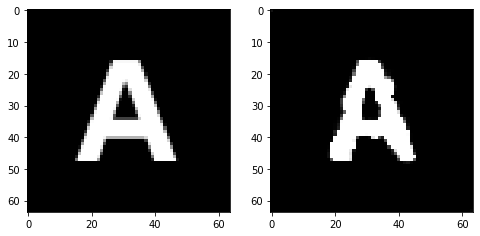

Epoch 67, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.688000500202179, Loss SSIM 2.3417014479637146, Loss Local 183.2329707145691


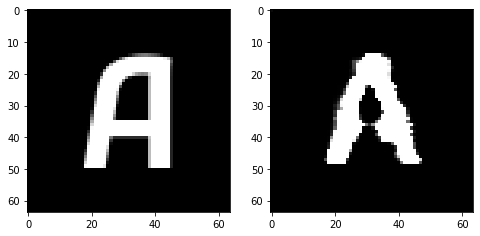

Epoch 67, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6861770488321781, Loss SSIM 2.2684929370880127, Loss Local 186.5342559814453


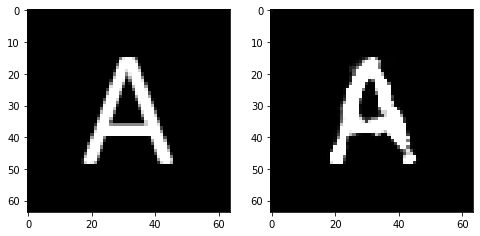

Epoch 68, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08561226725578308, Loss SSIM 0.1447049379348755, Loss Local 8.76639175415039


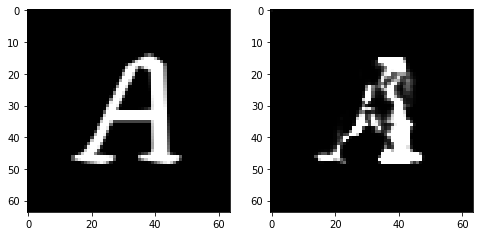

Epoch 68, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.707926169037819, Loss SSIM 2.3759654760360718, Loss Local 181.9761142730713


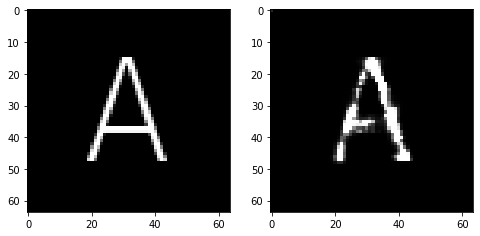

Epoch 68, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6506439335644245, Loss SSIM 2.2997002005577087, Loss Local 199.75469779968262


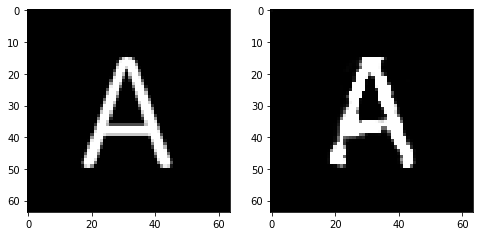

Epoch 68, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6582970172166824, Loss SSIM 2.2783612608909607, Loss Local 185.47853994369507


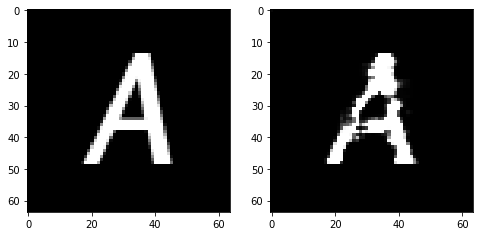

Epoch 68, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6967814788222313, Loss SSIM 2.311683773994446, Loss Local 194.0402717590332


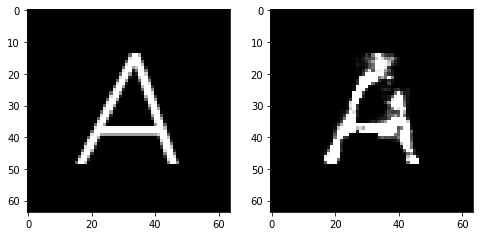

Epoch 68, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.695830337703228, Loss SSIM 2.323387026786804, Loss Local 192.68610763549805


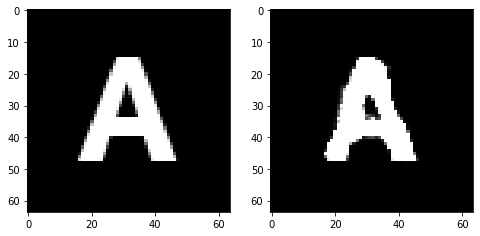

Epoch 68, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6525387093424797, Loss SSIM 2.1996567249298096, Loss Local 185.64903593063354


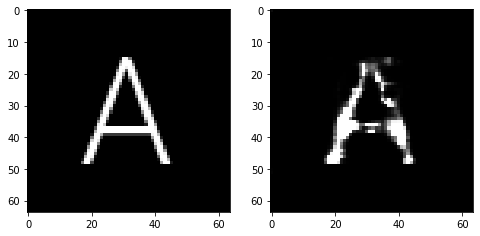

Epoch 68, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6992248371243477, Loss SSIM 2.3356406688690186, Loss Local 186.27792596817017


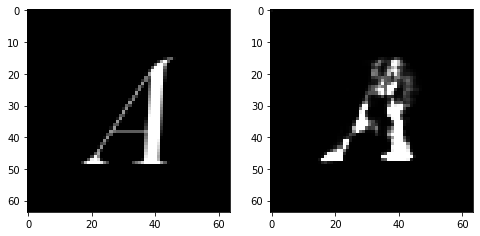

Epoch 69, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.061977818608284, Loss SSIM 0.08440148830413818, Loss Local 6.892276763916016


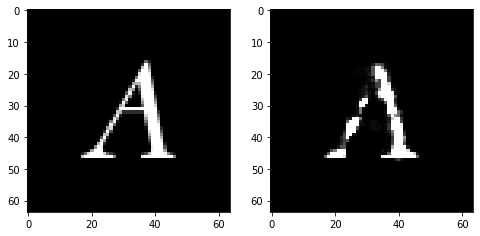

Epoch 69, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7160610221326351, Loss SSIM 2.373811423778534, Loss Local 201.49892854690552


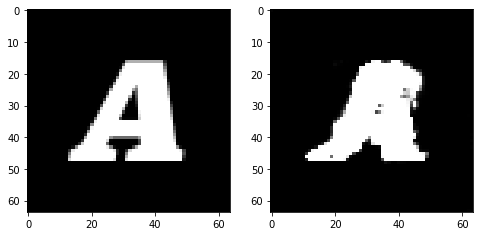

Epoch 69, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6336092799901962, Loss SSIM 2.228134572505951, Loss Local 187.33202171325684


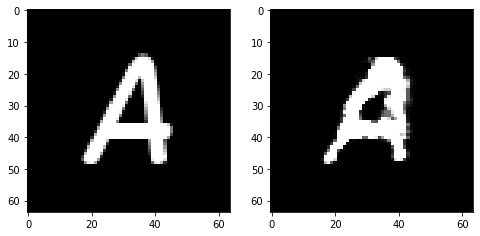

Epoch 69, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6625279635190964, Loss SSIM 2.2694053649902344, Loss Local 189.7183485031128


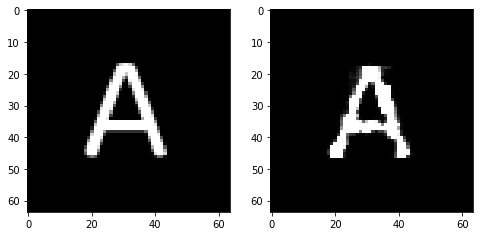

Epoch 69, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7089012749493122, Loss SSIM 2.3762256503105164, Loss Local 185.24691104888916


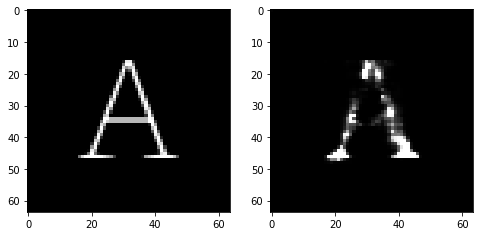

Epoch 69, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.655154924839735, Loss SSIM 2.250461220741272, Loss Local 183.50669288635254


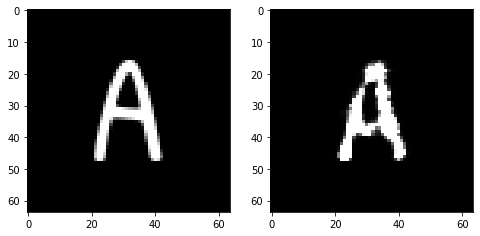

Epoch 69, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6624889597296715, Loss SSIM 2.2829240560531616, Loss Local 186.2952699661255


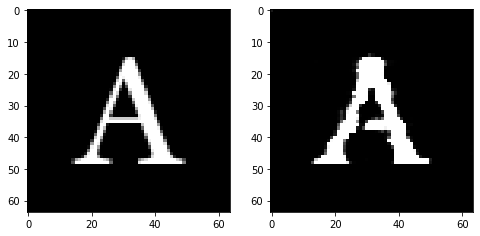

Epoch 69, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7749795503914356, Loss SSIM 2.4382487535476685, Loss Local 195.72668075561523


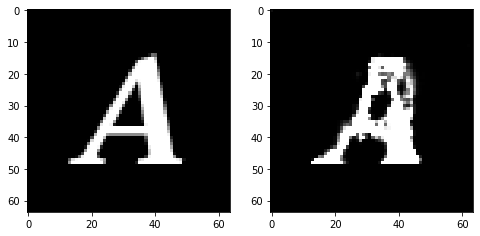

Epoch 70, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06443595886230469, Loss SSIM 0.08410531282424927, Loss Local 6.712112903594971


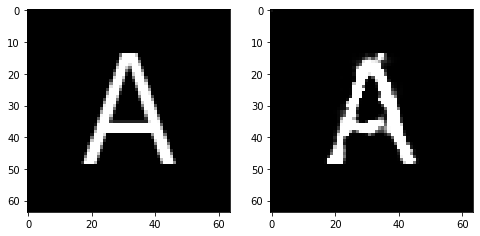

Epoch 70, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6287668943405151, Loss SSIM 2.2267212867736816, Loss Local 183.4843454360962


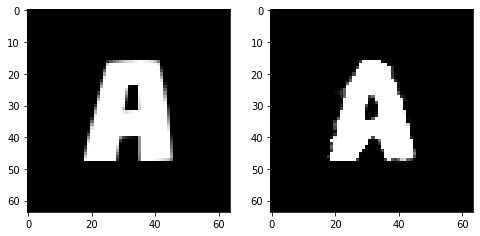

Epoch 70, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.714760173112154, Loss SSIM 2.3867820501327515, Loss Local 190.70102548599243


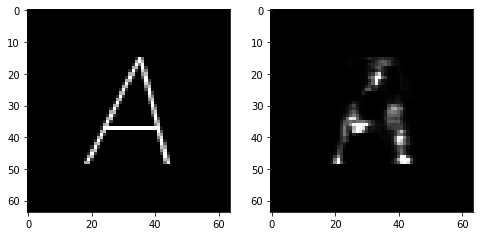

Epoch 70, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7365936897695065, Loss SSIM 2.4015907645225525, Loss Local 191.21789026260376


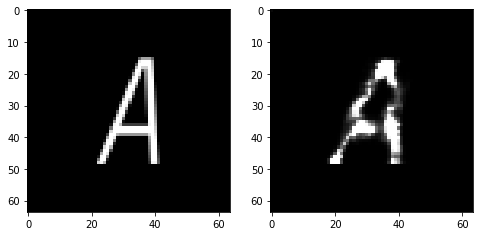

Epoch 70, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6474585086107254, Loss SSIM 2.2405601739883423, Loss Local 193.38982820510864


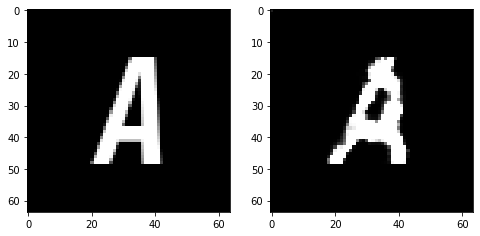

Epoch 70, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6717933639883995, Loss SSIM 2.249210298061371, Loss Local 183.54434823989868


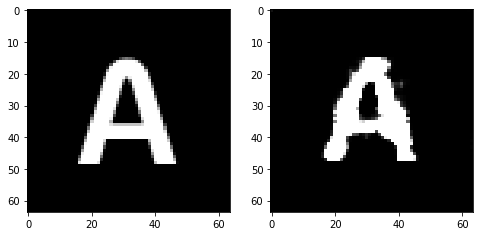

Epoch 70, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.718444298952818, Loss SSIM 2.331755042076111, Loss Local 185.26288223266602


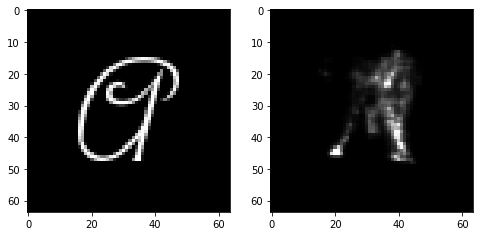

Epoch 70, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.660271905362606, Loss SSIM 2.2886868119239807, Loss Local 185.9165539741516


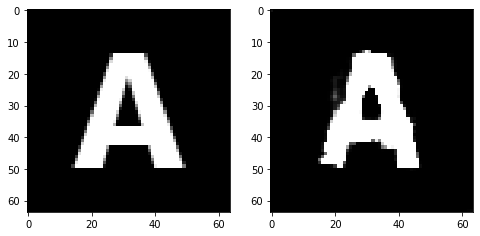

Epoch 71, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06215300410985947, Loss SSIM 0.0861017107963562, Loss Local 5.9317626953125


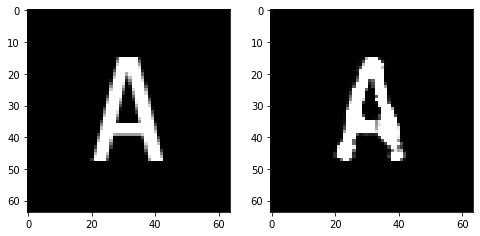

Epoch 71, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.645596295595169, Loss SSIM 2.2165098190307617, Loss Local 191.15158653259277


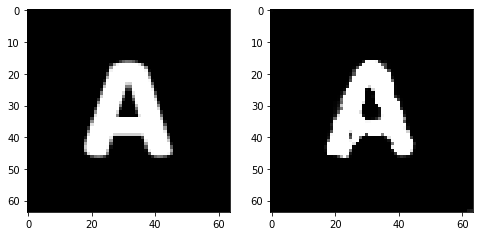

Epoch 71, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6686491891741753, Loss SSIM 2.2366228103637695, Loss Local 178.81287288665771


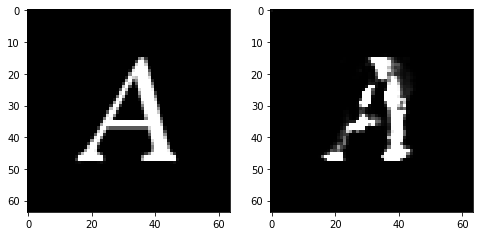

Epoch 71, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6781018637120724, Loss SSIM 2.3052011728286743, Loss Local 185.3101110458374


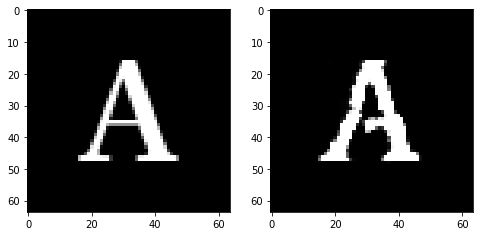

Epoch 71, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7173616737127304, Loss SSIM 2.3488067984580994, Loss Local 193.33979272842407


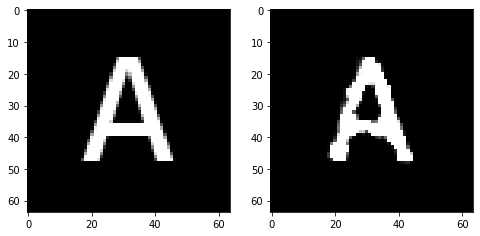

Epoch 71, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651384998112917, Loss SSIM 2.3238945603370667, Loss Local 177.3558053970337


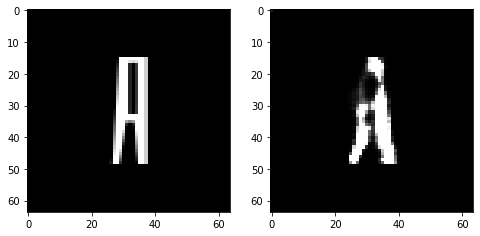

Epoch 71, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7347504422068596, Loss SSIM 2.402788460254669, Loss Local 191.07026481628418


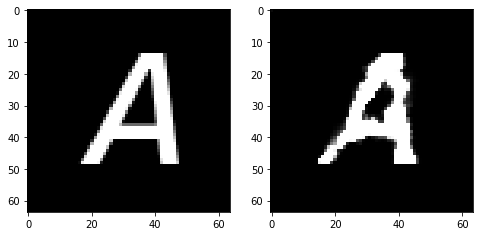

Epoch 71, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7038446143269539, Loss SSIM 2.3320952653884888, Loss Local 194.43851518630981


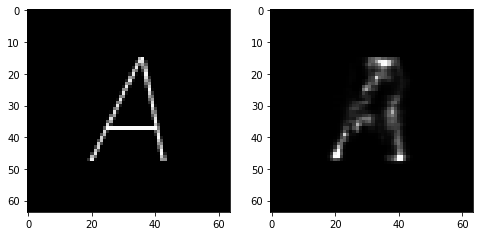

Epoch 72, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06369751691818237, Loss SSIM 0.08117556571960449, Loss Local 8.671887397766113


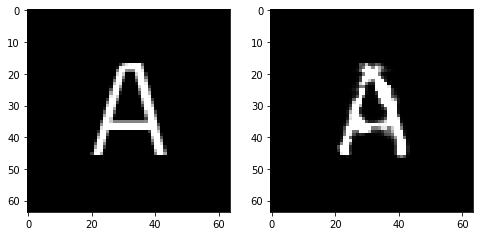

Epoch 72, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7348052114248276, Loss SSIM 2.377148985862732, Loss Local 195.70514345169067


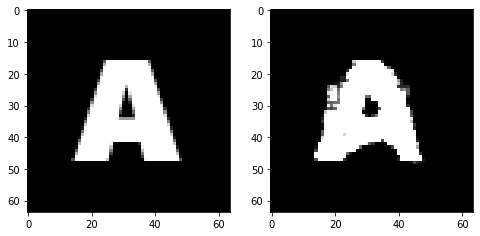

Epoch 72, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.701887309551239, Loss SSIM 2.342172861099243, Loss Local 183.82974576950073


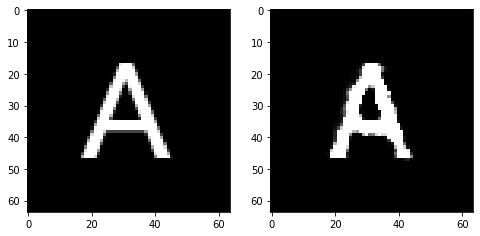

Epoch 72, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7134123928844929, Loss SSIM 2.3401821851730347, Loss Local 192.77109956741333


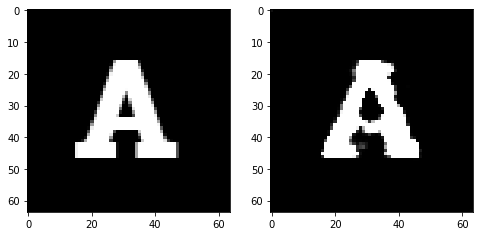

Epoch 72, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6748643554747105, Loss SSIM 2.336044728755951, Loss Local 194.64217805862427


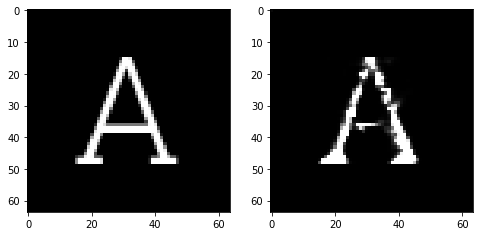

Epoch 72, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7355501390993595, Loss SSIM 2.399738073348999, Loss Local 189.4355936050415


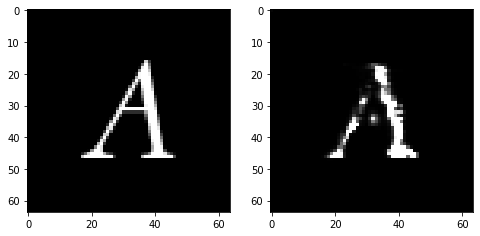

Epoch 72, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.665120955556631, Loss SSIM 2.2651811242103577, Loss Local 182.2137472629547


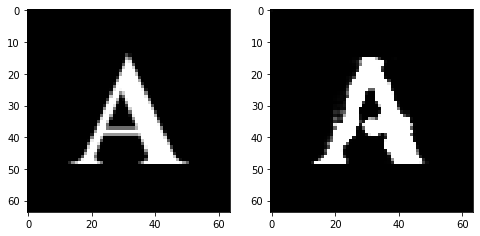

Epoch 72, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6356950923800468, Loss SSIM 2.2199230790138245, Loss Local 181.31484842300415


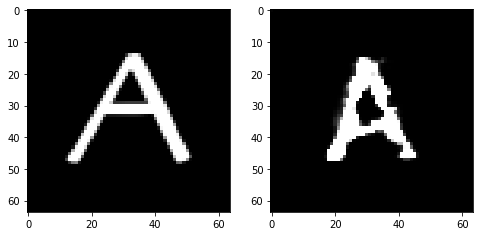

Epoch 73, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06641440093517303, Loss SSIM 0.08626377582550049, Loss Local 6.26113748550415


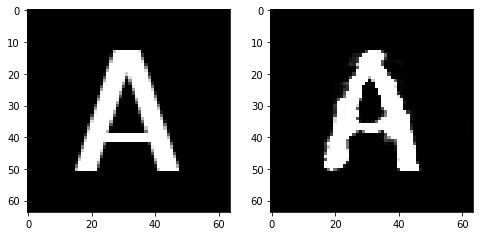

Epoch 73, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7075478807091713, Loss SSIM 2.3442406058311462, Loss Local 185.9270420074463


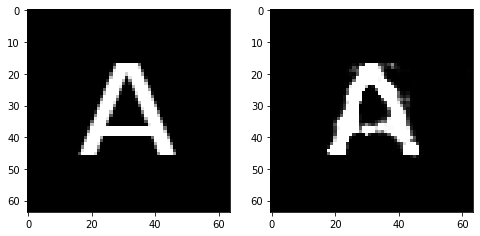

Epoch 73, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651402909308672, Loss SSIM 2.2519304156303406, Loss Local 185.32452630996704


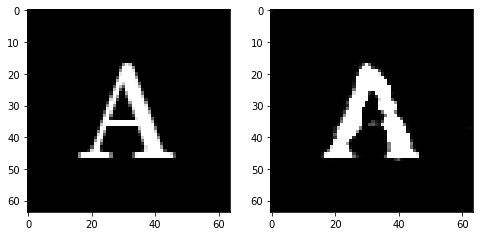

Epoch 73, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6998813226819038, Loss SSIM 2.347904086112976, Loss Local 200.08950853347778


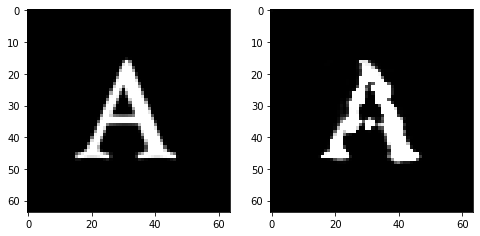

Epoch 73, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.641328040510416, Loss SSIM 2.2280431985855103, Loss Local 184.70281505584717


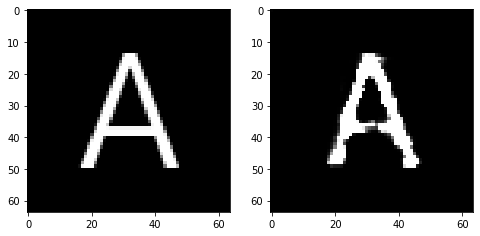

Epoch 73, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7314464077353477, Loss SSIM 2.3978318572044373, Loss Local 185.37632131576538


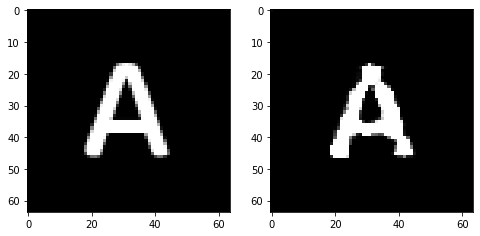

Epoch 73, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7406514771282673, Loss SSIM 2.4349395632743835, Loss Local 186.8564715385437


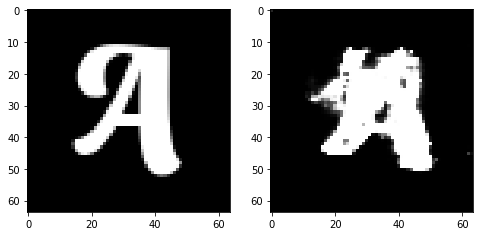

Epoch 73, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6445136778056622, Loss SSIM 2.2294785380363464, Loss Local 185.58106565475464


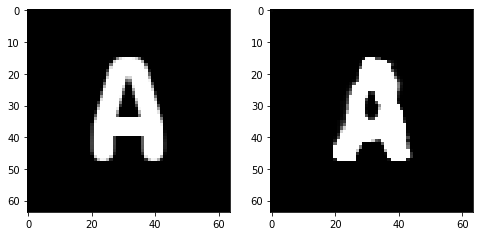

Epoch 74, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06143815815448761, Loss SSIM 0.07440018653869629, Loss Local 6.201771259307861


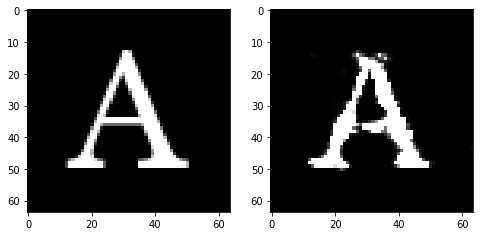

Epoch 74, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7039283588528633, Loss SSIM 2.3469550013542175, Loss Local 186.278555393219


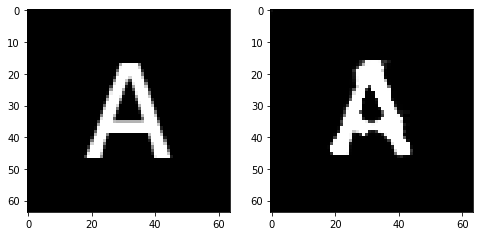

Epoch 74, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6248589716851711, Loss SSIM 2.169922709465027, Loss Local 186.9069390296936


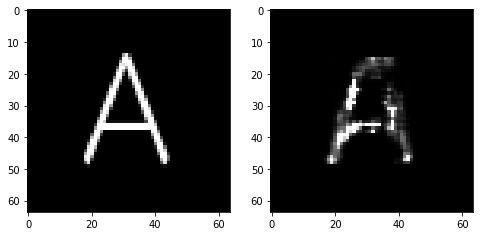

Epoch 74, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6922491826117039, Loss SSIM 2.3384969234466553, Loss Local 188.40314245224


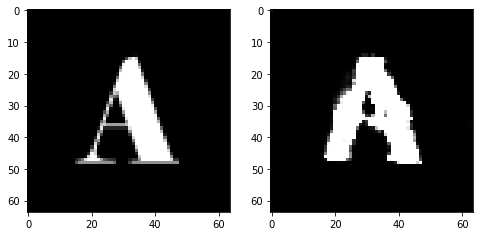

Epoch 74, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6178176887333393, Loss SSIM 2.2262521982192993, Loss Local 180.27642822265625


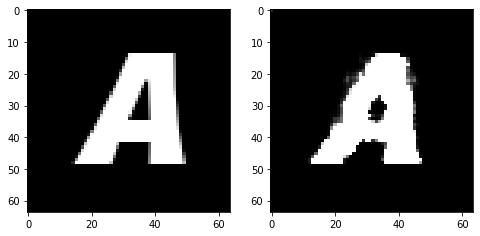

Epoch 74, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7080894485116005, Loss SSIM 2.3289957642555237, Loss Local 193.22854232788086


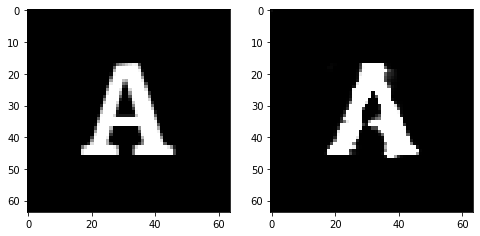

Epoch 74, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.704346191138029, Loss SSIM 2.3880895376205444, Loss Local 185.19078588485718


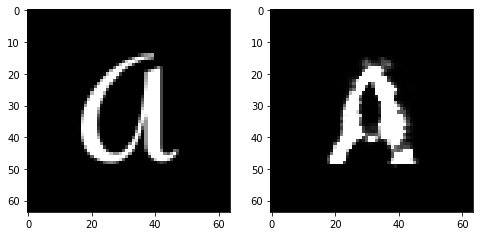

Epoch 74, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7321774549782276, Loss SSIM 2.3580251336097717, Loss Local 189.5339822769165


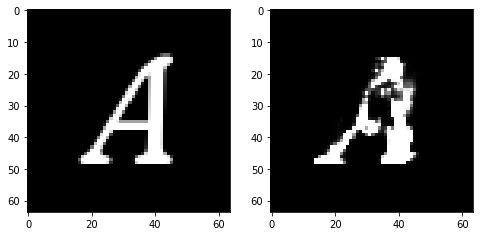

Epoch 75, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07209377735853195, Loss SSIM 0.09228473901748657, Loss Local 8.082469940185547


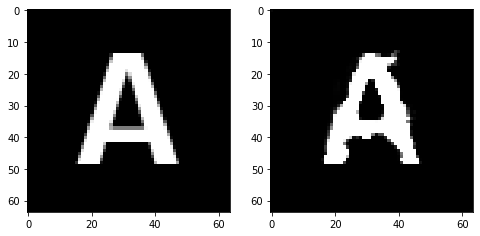

Epoch 75, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6763729229569435, Loss SSIM 2.3407671451568604, Loss Local 179.92095613479614


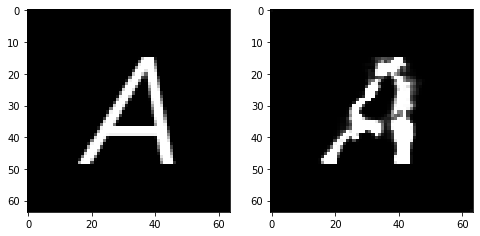

Epoch 75, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6691231802105904, Loss SSIM 2.2777034044265747, Loss Local 185.90375328063965


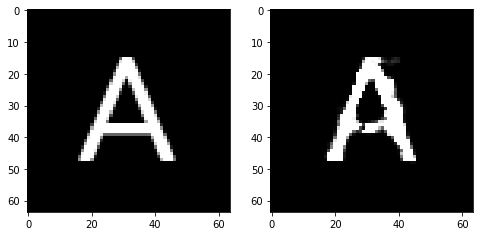

Epoch 75, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6350605748593807, Loss SSIM 2.206801950931549, Loss Local 187.63222074508667


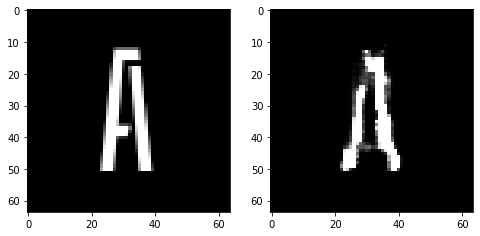

Epoch 75, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7139174193143845, Loss SSIM 2.354628324508667, Loss Local 196.6881399154663


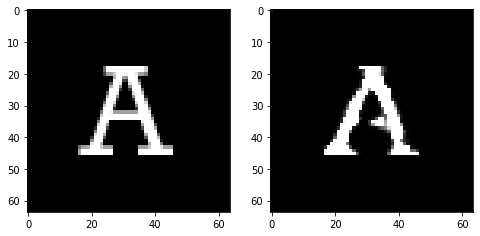

Epoch 75, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6641329415142536, Loss SSIM 2.257582724094391, Loss Local 189.13834619522095


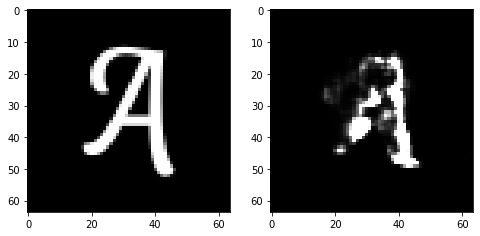

Epoch 75, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6883415058255196, Loss SSIM 2.282380163669586, Loss Local 188.6810064315796


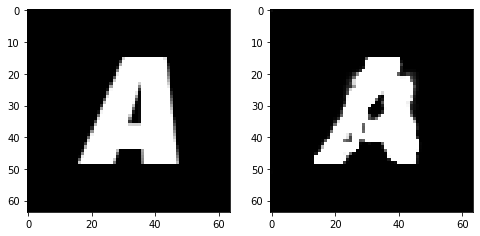

Epoch 75, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7640233784914017, Loss SSIM 2.456743061542511, Loss Local 200.68184995651245


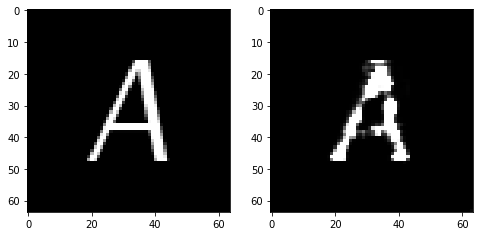

Epoch 76, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07871120423078537, Loss SSIM 0.11204856634140015, Loss Local 9.871291160583496


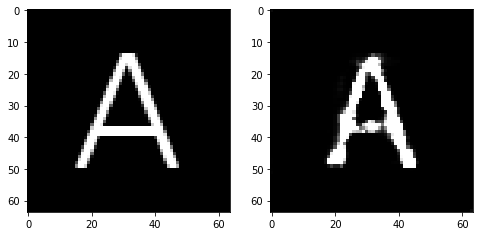

Epoch 76, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6543305553495884, Loss SSIM 2.241174638271332, Loss Local 182.8077154159546


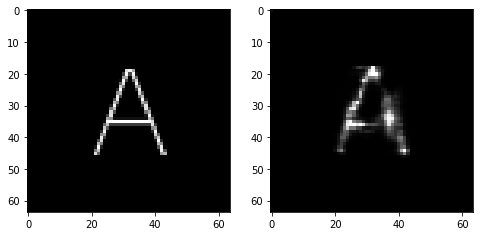

Epoch 76, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6977134384214878, Loss SSIM 2.323003113269806, Loss Local 185.82494831085205


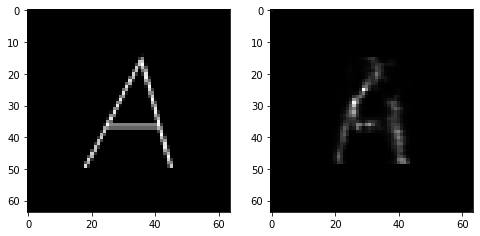

Epoch 76, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6549758724868298, Loss SSIM 2.225507438182831, Loss Local 177.09046602249146


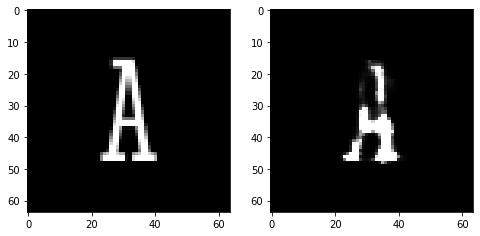

Epoch 76, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.642620276659727, Loss SSIM 2.2137049436569214, Loss Local 189.3099160194397


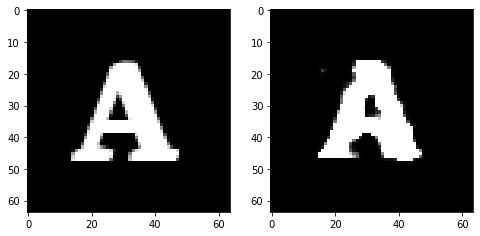

Epoch 76, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7390680462121964, Loss SSIM 2.421587586402893, Loss Local 199.03596305847168


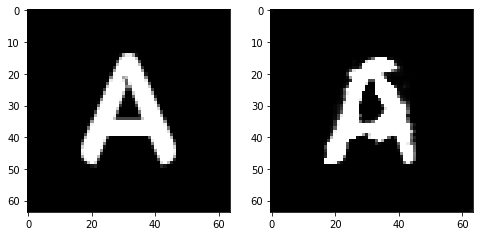

Epoch 76, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6864474229514599, Loss SSIM 2.28588205575943, Loss Local 187.62370777130127


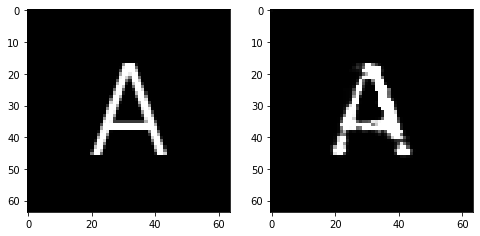

Epoch 76, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6776947416365147, Loss SSIM 2.311454176902771, Loss Local 182.0667700767517


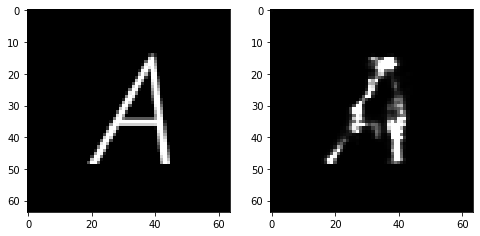

Epoch 77, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06497631967067719, Loss SSIM 0.08259981870651245, Loss Local 6.165426254272461


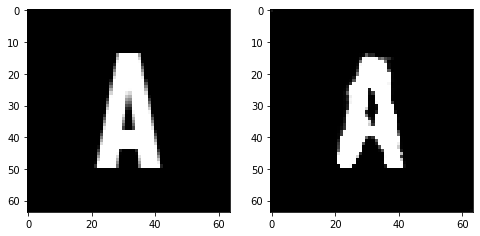

Epoch 77, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6781305521726608, Loss SSIM 2.289691388607025, Loss Local 183.8943748474121


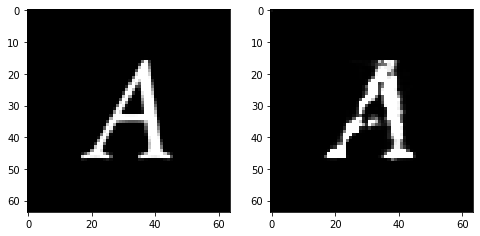

Epoch 77, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.664257325232029, Loss SSIM 2.2235068678855896, Loss Local 193.90935230255127


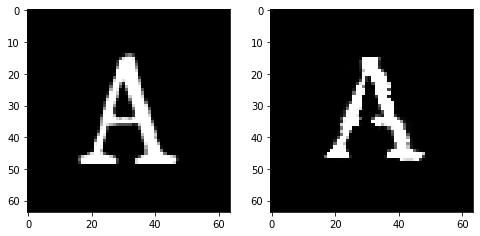

Epoch 77, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6568577848374844, Loss SSIM 2.321464419364929, Loss Local 181.09106826782227


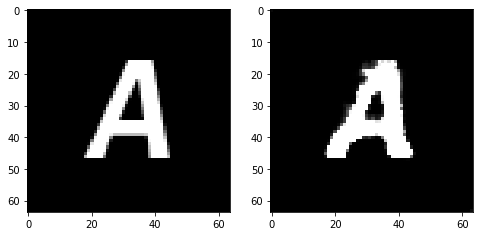

Epoch 77, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6923189796507359, Loss SSIM 2.3220431208610535, Loss Local 189.19733381271362


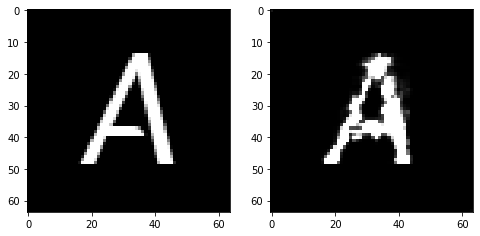

Epoch 77, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7063980959355831, Loss SSIM 2.3274874091148376, Loss Local 183.49603033065796


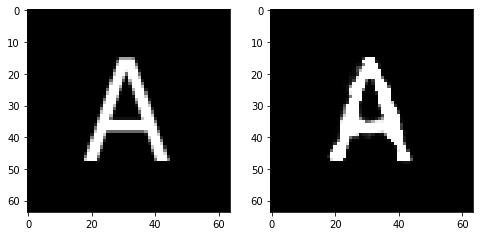

Epoch 77, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7071417570114136, Loss SSIM 2.331348180770874, Loss Local 196.4483437538147


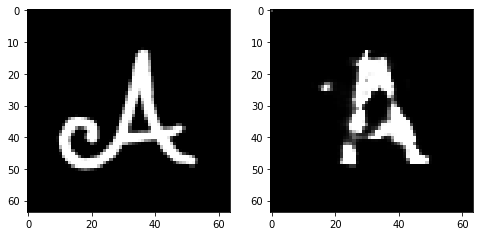

Epoch 77, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7011975944042206, Loss SSIM 2.371476709842682, Loss Local 198.56187343597412


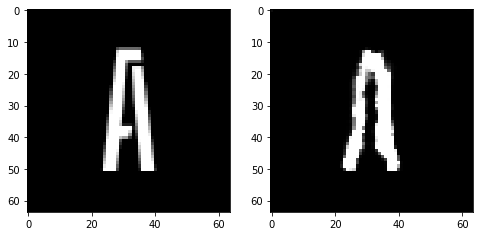

Epoch 78, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.061219047755002975, Loss SSIM 0.07572054862976074, Loss Local 7.511226177215576


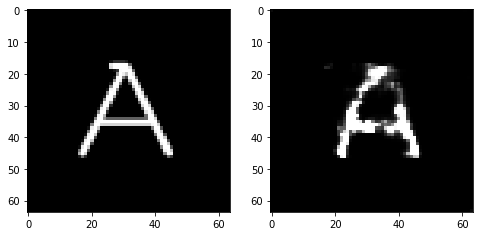

Epoch 78, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6927016228437424, Loss SSIM 2.3791204690933228, Loss Local 198.23280000686646


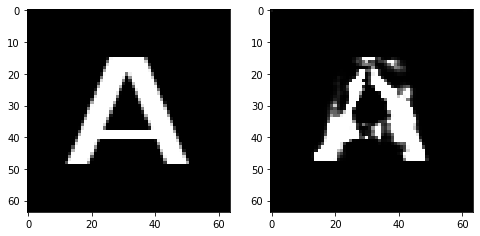

Epoch 78, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6961733549833298, Loss SSIM 2.323447585105896, Loss Local 189.9544973373413


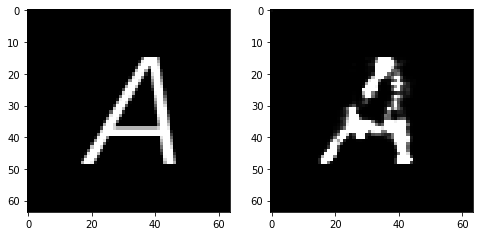

Epoch 78, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6712082549929619, Loss SSIM 2.2458808422088623, Loss Local 182.3824052810669


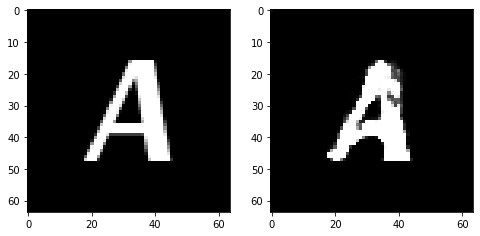

Epoch 78, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6566860675811768, Loss SSIM 2.2058926820755005, Loss Local 192.31170272827148


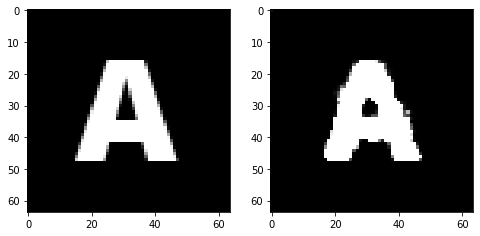

Epoch 78, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7062547355890274, Loss SSIM 2.3506158590316772, Loss Local 184.64446783065796


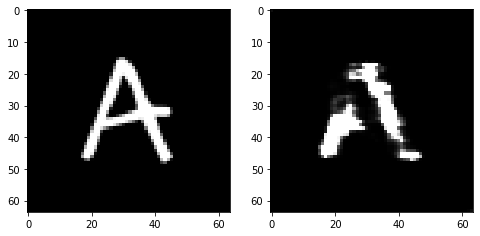

Epoch 78, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6774237491190434, Loss SSIM 2.286687195301056, Loss Local 173.107572555542


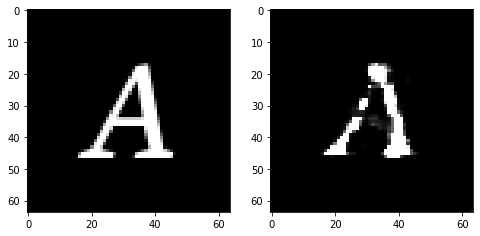

Epoch 78, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6647194661200047, Loss SSIM 2.2949729561805725, Loss Local 194.79696893692017


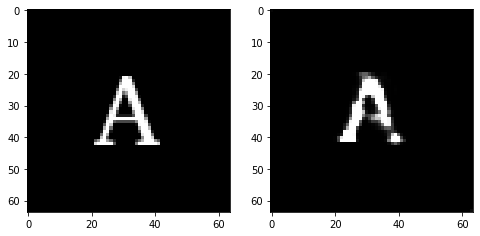

Epoch 79, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.060884881764650345, Loss SSIM 0.07790219783782959, Loss Local 7.847992897033691


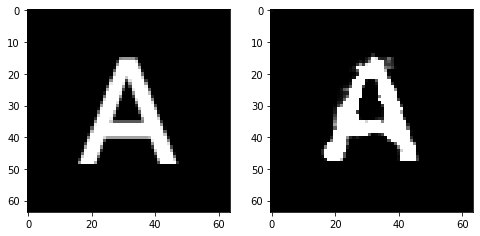

Epoch 79, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.627720169723034, Loss SSIM 2.166621208190918, Loss Local 186.2427110671997


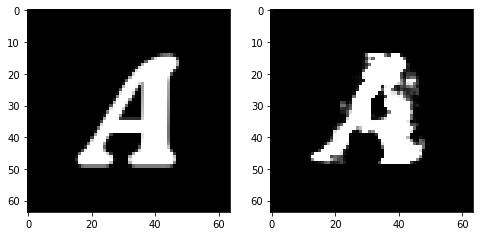

Epoch 79, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7695028334856033, Loss SSIM 2.4473644495010376, Loss Local 204.3526372909546


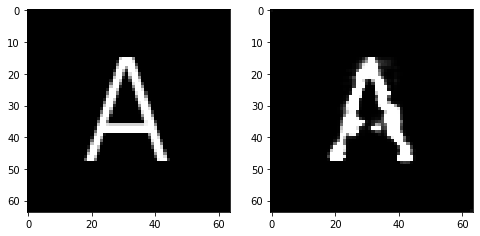

Epoch 79, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6952915899455547, Loss SSIM 2.3032901287078857, Loss Local 189.55841779708862


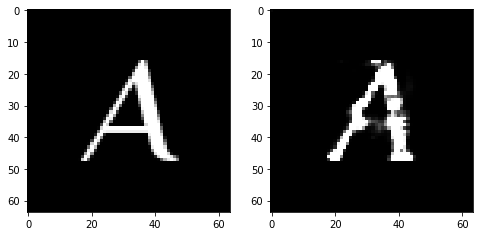

Epoch 79, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6295974776148796, Loss SSIM 2.2259321808815002, Loss Local 193.676531791687


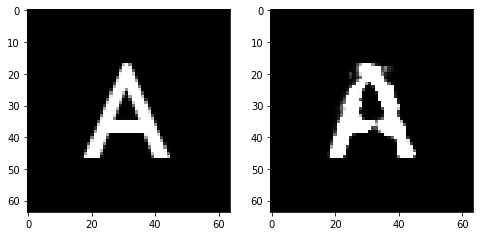

Epoch 79, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6997799091041088, Loss SSIM 2.339808225631714, Loss Local 192.60778141021729


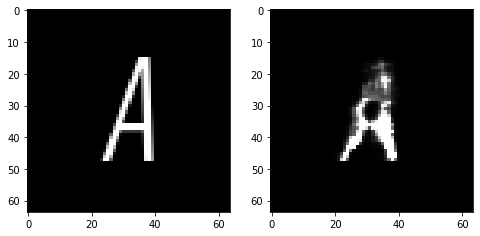

Epoch 79, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6434146538376808, Loss SSIM 2.240447461605072, Loss Local 187.22733879089355


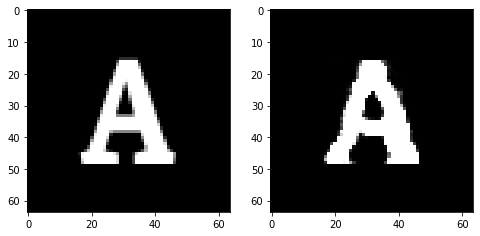

Epoch 79, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7294022627174854, Loss SSIM 2.4447746872901917, Loss Local 199.26116514205933


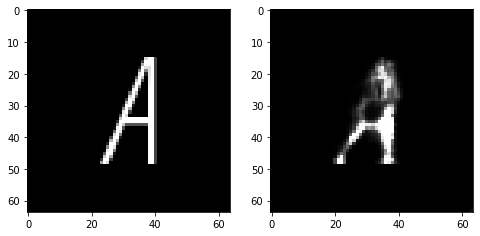

Epoch 80, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07021806389093399, Loss SSIM 0.10792279243469238, Loss Local 7.655574321746826


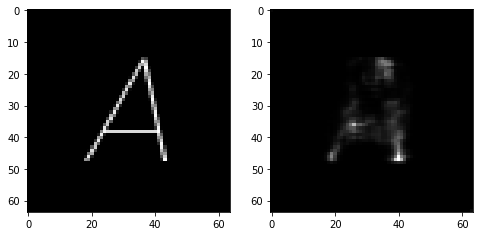

Epoch 80, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.694307193160057, Loss SSIM 2.415358066558838, Loss Local 183.31670713424683


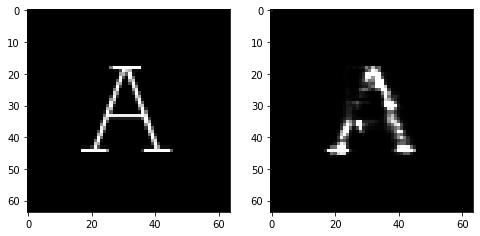

Epoch 80, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.634083230048418, Loss SSIM 2.156156301498413, Loss Local 188.36694860458374


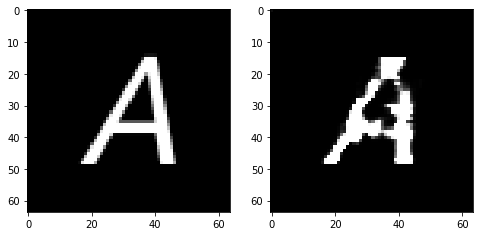

Epoch 80, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6881167255342007, Loss SSIM 2.3602494597434998, Loss Local 179.12113332748413


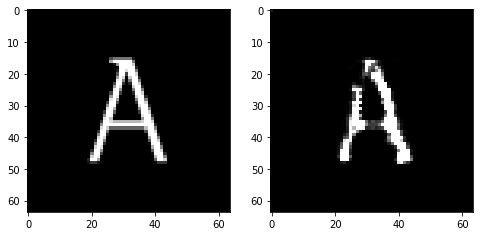

Epoch 80, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.666239470243454, Loss SSIM 2.257342219352722, Loss Local 187.83791780471802


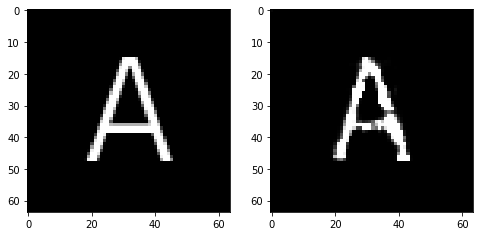

Epoch 80, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.645094696432352, Loss SSIM 2.1880983710289, Loss Local 186.4837203025818


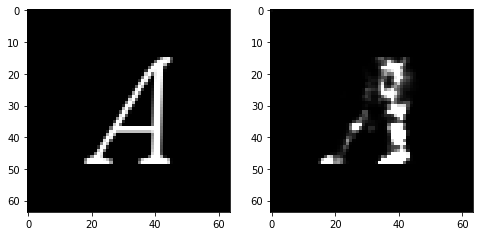

Epoch 80, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6751996837556362, Loss SSIM 2.2200910449028015, Loss Local 189.15950107574463


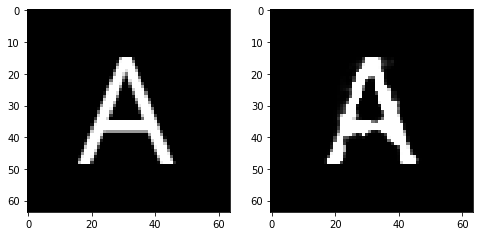

Epoch 80, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7223218008875847, Loss SSIM 2.4487165808677673, Loss Local 202.37225151062012


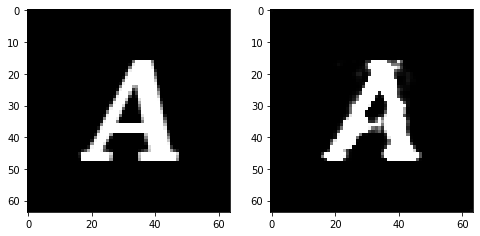

Epoch 81, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06430311501026154, Loss SSIM 0.08525127172470093, Loss Local 5.600230693817139


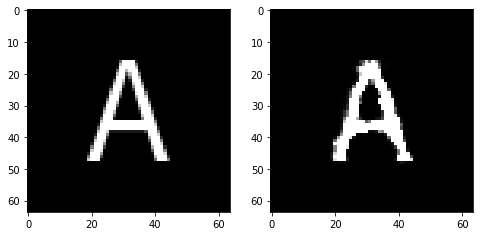

Epoch 81, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6505182199180126, Loss SSIM 2.256542205810547, Loss Local 174.6904158592224


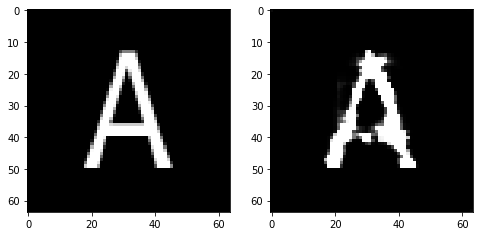

Epoch 81, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6892979964613914, Loss SSIM 2.2966228127479553, Loss Local 190.46323680877686


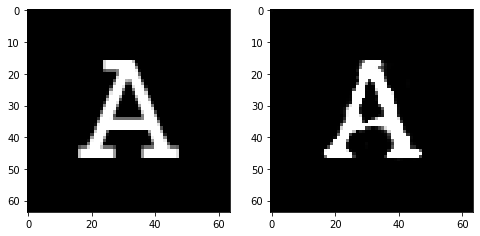

Epoch 81, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.718557395040989, Loss SSIM 2.340722441673279, Loss Local 185.21153211593628


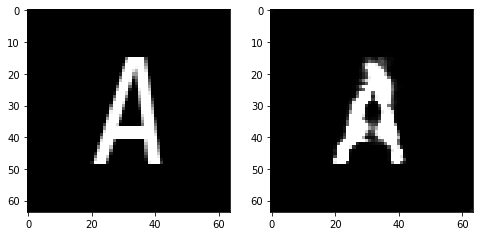

Epoch 81, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6290532946586609, Loss SSIM 2.1908324360847473, Loss Local 178.2478289604187


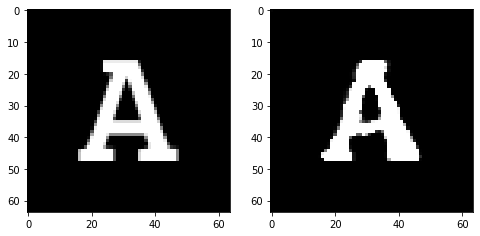

Epoch 81, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7229277417063713, Loss SSIM 2.419758141040802, Loss Local 189.50281810760498


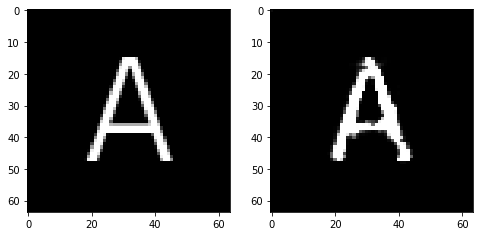

Epoch 81, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.696164008229971, Loss SSIM 2.322207450866699, Loss Local 201.7203950881958


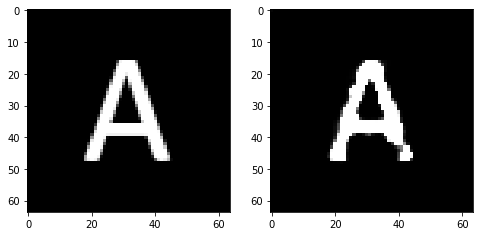

Epoch 81, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6672518961131573, Loss SSIM 2.2856467366218567, Loss Local 186.26639556884766


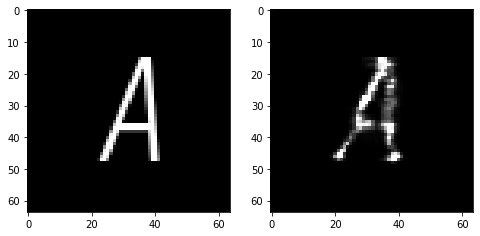

Epoch 82, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06941831856966019, Loss SSIM 0.09267300367355347, Loss Local 7.75128173828125


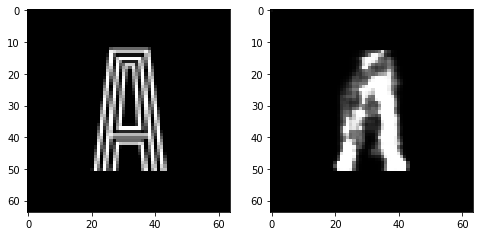

Epoch 82, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.657083846628666, Loss SSIM 2.265265703201294, Loss Local 173.17600393295288


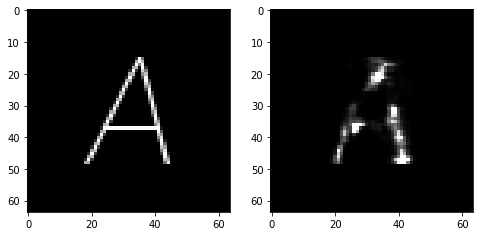

Epoch 82, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6817428804934025, Loss SSIM 2.2682201862335205, Loss Local 194.78060007095337


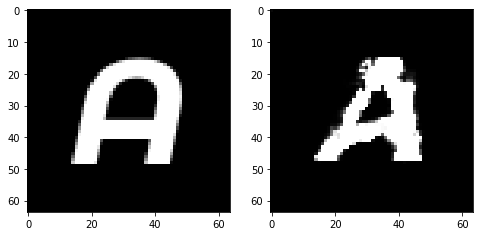

Epoch 82, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6695341244339943, Loss SSIM 2.2530415654182434, Loss Local 191.39770555496216


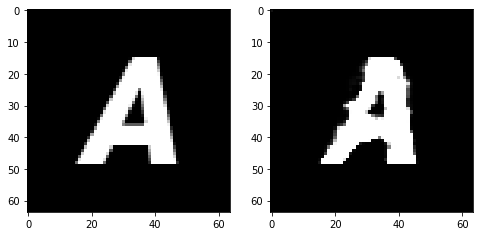

Epoch 82, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6300179362297058, Loss SSIM 2.1595650911331177, Loss Local 184.91972875595093


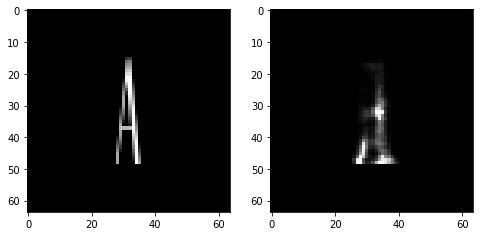

Epoch 82, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6672662273049355, Loss SSIM 2.2992427349090576, Loss Local 175.94285702705383


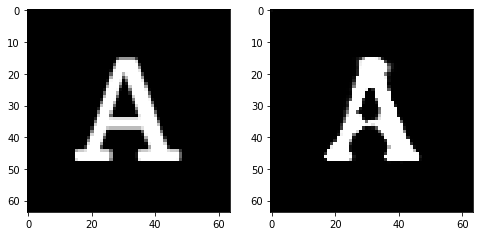

Epoch 82, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7671085745096207, Loss SSIM 2.495813548564911, Loss Local 190.6938190460205


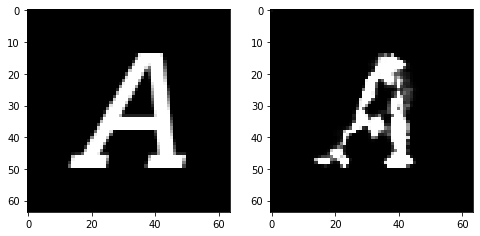

Epoch 82, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6837762109935284, Loss SSIM 2.333275318145752, Loss Local 193.35700607299805


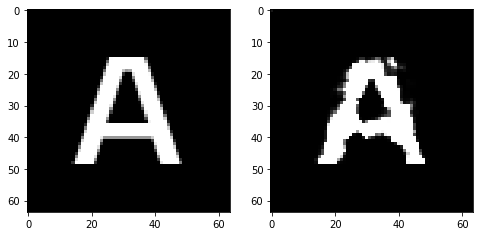

Epoch 83, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.068239226937294, Loss SSIM 0.08984726667404175, Loss Local 7.4172492027282715


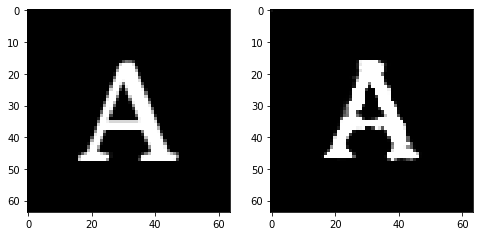

Epoch 83, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6779888235032558, Loss SSIM 2.2793025374412537, Loss Local 195.3674898147583


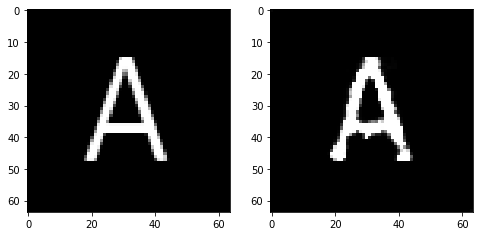

Epoch 83, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7476274333894253, Loss SSIM 2.4141637086868286, Loss Local 199.8995189666748


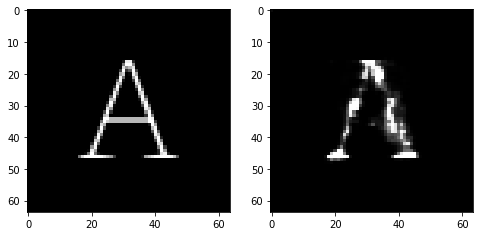

Epoch 83, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6702152229845524, Loss SSIM 2.2932828068733215, Loss Local 187.3468155860901


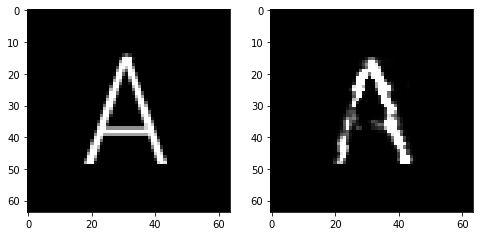

Epoch 83, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6382654570043087, Loss SSIM 2.2509963512420654, Loss Local 188.79069232940674


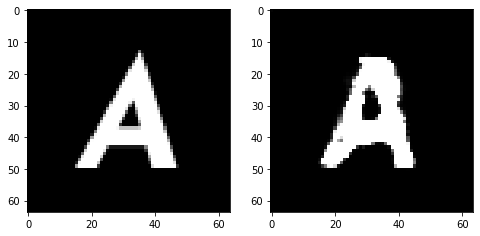

Epoch 83, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6897328309714794, Loss SSIM 2.3305583000183105, Loss Local 182.22091913223267


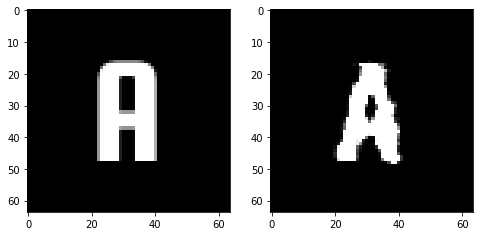

Epoch 83, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6876085810363293, Loss SSIM 2.27689927816391, Loss Local 184.99243640899658


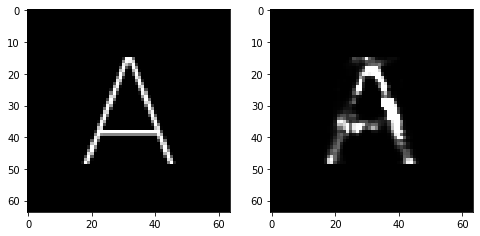

Epoch 83, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6687177866697311, Loss SSIM 2.255157709121704, Loss Local 189.11929512023926


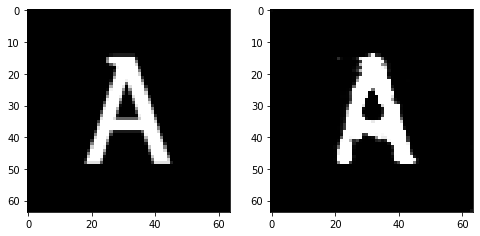

Epoch 84, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06578557938337326, Loss SSIM 0.09054571390151978, Loss Local 7.632143974304199


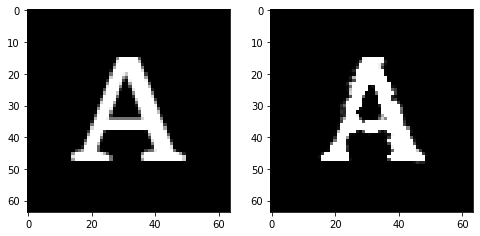

Epoch 84, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7016075886785984, Loss SSIM 2.2960062623023987, Loss Local 186.3184084892273


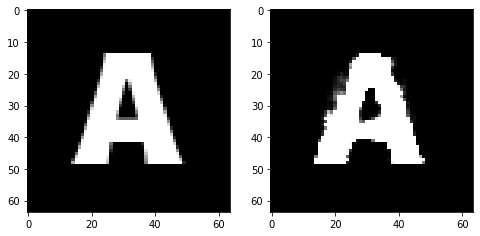

Epoch 84, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6740175932645798, Loss SSIM 2.270437717437744, Loss Local 189.26319932937622


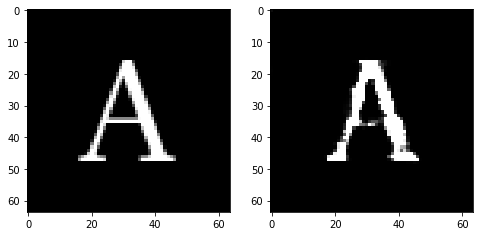

Epoch 84, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6506901904940605, Loss SSIM 2.2574759125709534, Loss Local 181.62174320220947


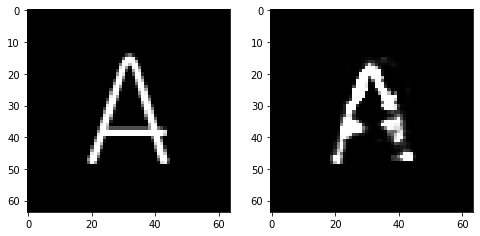

Epoch 84, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7434368841350079, Loss SSIM 2.392741858959198, Loss Local 198.98926162719727


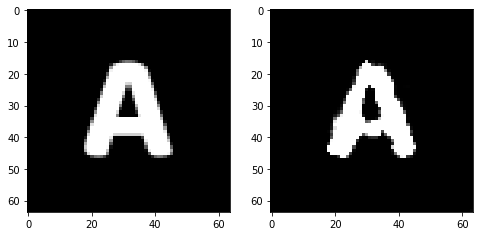

Epoch 84, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7324171476066113, Loss SSIM 2.3846269845962524, Loss Local 185.4121551513672


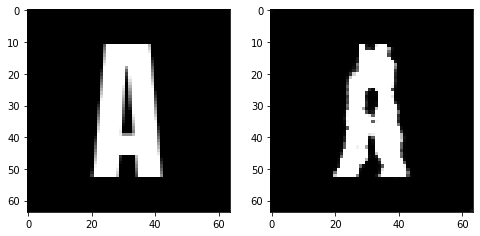

Epoch 84, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6198744364082813, Loss SSIM 2.190565586090088, Loss Local 184.09270858764648


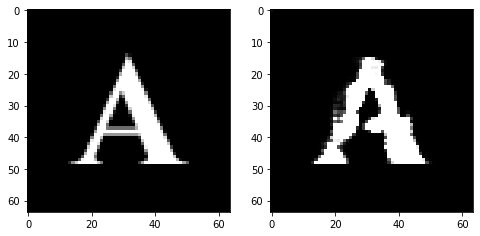

Epoch 84, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6718266382813454, Loss SSIM 2.3327972292900085, Loss Local 191.64073848724365


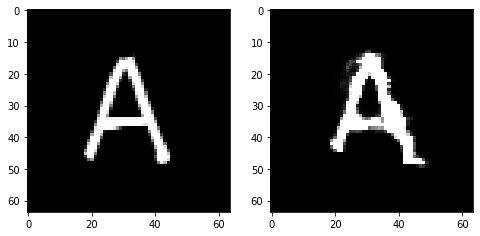

Epoch 85, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.060588862746953964, Loss SSIM 0.08129352331161499, Loss Local 5.954873085021973


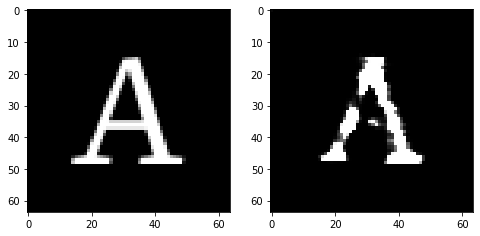

Epoch 85, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.703657105565071, Loss SSIM 2.3520241379737854, Loss Local 181.2861704826355


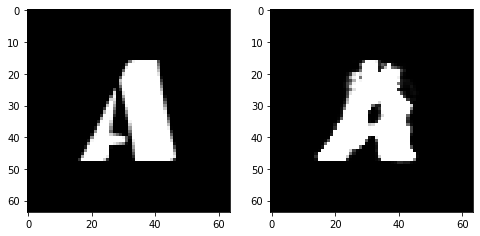

Epoch 85, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6105717979371548, Loss SSIM 2.158792555332184, Loss Local 185.882550239563


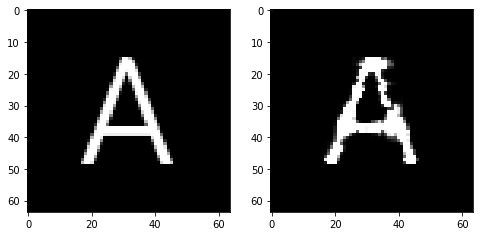

Epoch 85, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6807629615068436, Loss SSIM 2.277754545211792, Loss Local 184.78635501861572


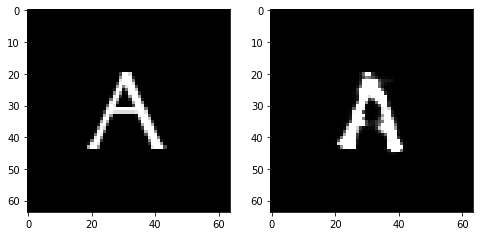

Epoch 85, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.67651691660285, Loss SSIM 2.262168049812317, Loss Local 198.96783828735352


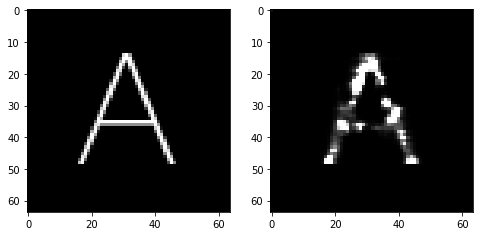

Epoch 85, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7012707442045212, Loss SSIM 2.370098352432251, Loss Local 185.33278274536133


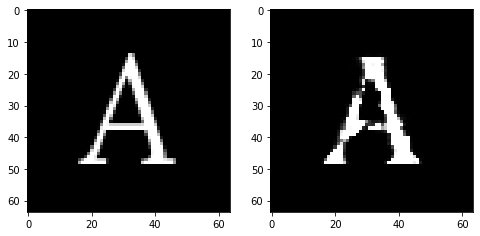

Epoch 85, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6793510019779205, Loss SSIM 2.315101146697998, Loss Local 179.67680644989014


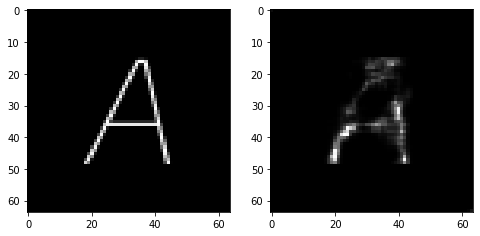

Epoch 85, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6559325531125069, Loss SSIM 2.2833682894706726, Loss Local 179.74792385101318


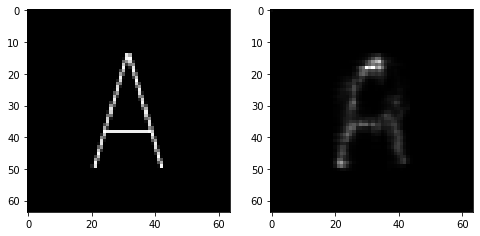

Epoch 86, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0798007920384407, Loss SSIM 0.10436326265335083, Loss Local 8.808260917663574


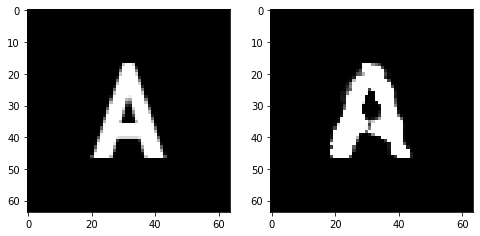

Epoch 86, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.723815456032753, Loss SSIM 2.37622207403183, Loss Local 196.8559889793396


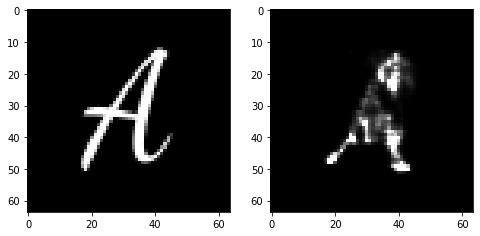

Epoch 86, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7635497525334358, Loss SSIM 2.4828431010246277, Loss Local 200.62065076828003


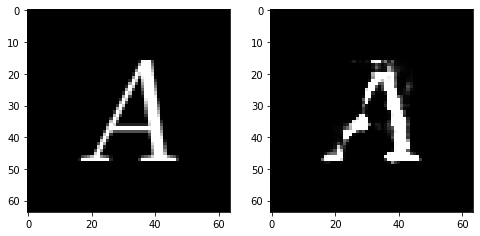

Epoch 86, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.632721185684204, Loss SSIM 2.2242579460144043, Loss Local 185.6425256729126


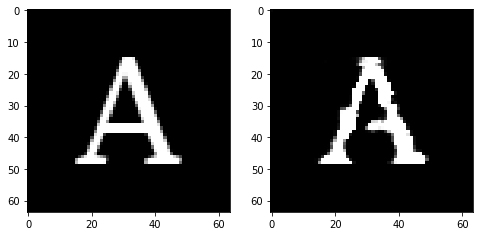

Epoch 86, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6066880375146866, Loss SSIM 2.180546283721924, Loss Local 182.07835006713867


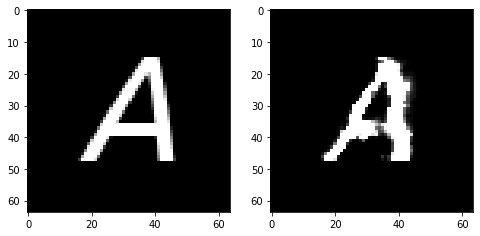

Epoch 86, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6561926156282425, Loss SSIM 2.2783271074295044, Loss Local 194.26248741149902


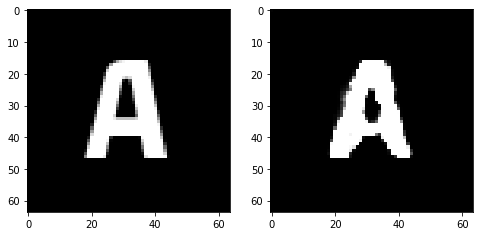

Epoch 86, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6735592558979988, Loss SSIM 2.263840138912201, Loss Local 185.02156972885132


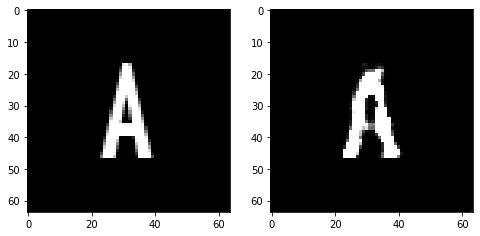

Epoch 86, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6700182743370533, Loss SSIM 2.2634679079055786, Loss Local 186.6414999961853


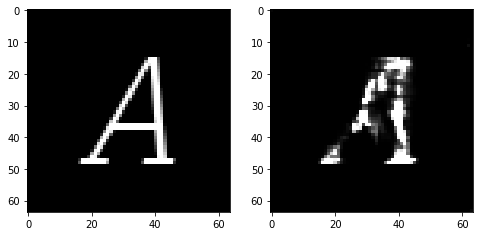

Epoch 87, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06676515936851501, Loss SSIM 0.09608250856399536, Loss Local 6.918397426605225


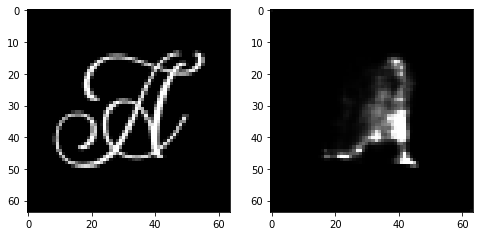

Epoch 87, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6474895365536213, Loss SSIM 2.2696605920791626, Loss Local 187.67984533309937


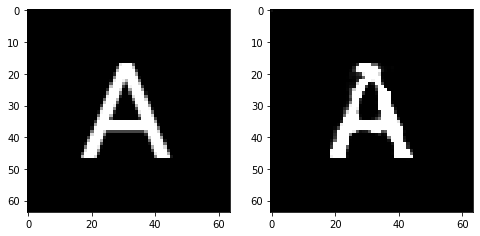

Epoch 87, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.703683353960514, Loss SSIM 2.2868335247039795, Loss Local 191.53490543365479


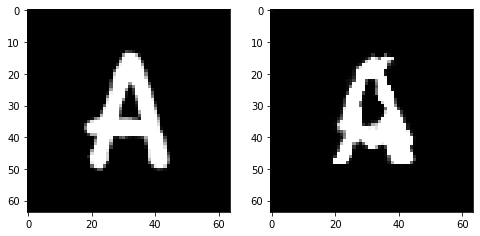

Epoch 87, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6956743486225605, Loss SSIM 2.313306212425232, Loss Local 197.10197162628174


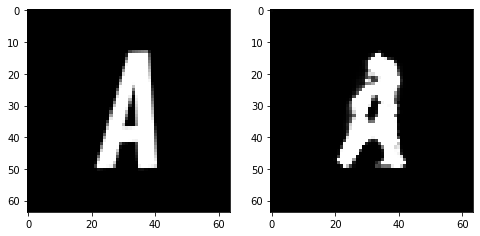

Epoch 87, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6631919220089912, Loss SSIM 2.285641312599182, Loss Local 181.37606859207153


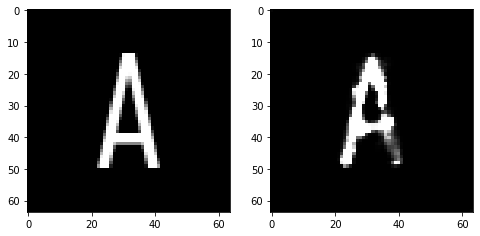

Epoch 87, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6274821683764458, Loss SSIM 2.200032353401184, Loss Local 184.47463274002075


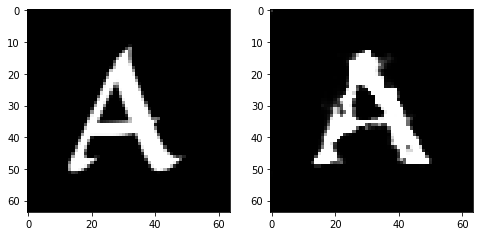

Epoch 87, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7225861065089703, Loss SSIM 2.413155257701874, Loss Local 194.29974842071533


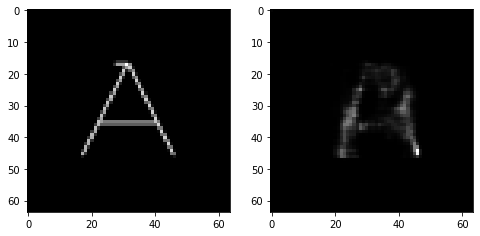

Epoch 87, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6619445271790028, Loss SSIM 2.2469122409820557, Loss Local 196.54284715652466


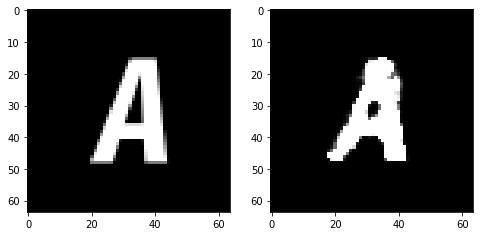

Epoch 88, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07020894438028336, Loss SSIM 0.08656251430511475, Loss Local 6.934526443481445


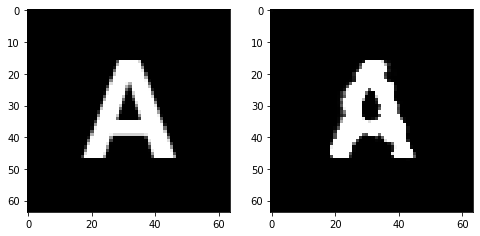

Epoch 88, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6778192818164825, Loss SSIM 2.3455382585525513, Loss Local 187.60857725143433


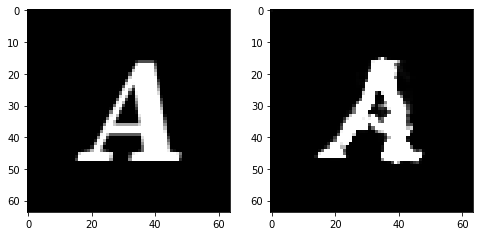

Epoch 88, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6938289552927017, Loss SSIM 2.254158139228821, Loss Local 182.01667428016663


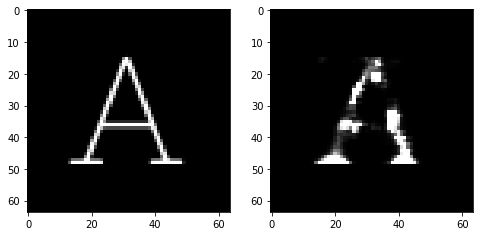

Epoch 88, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.707159399986267, Loss SSIM 2.385478436946869, Loss Local 202.54715299606323


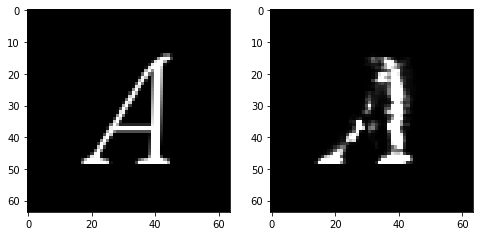

Epoch 88, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6669233329594135, Loss SSIM 2.2267552614212036, Loss Local 174.6029567718506


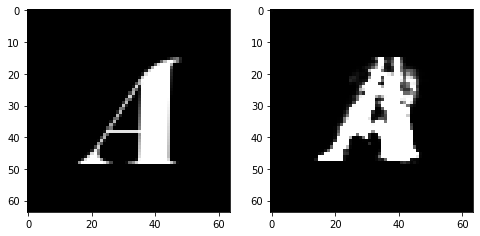

Epoch 88, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6594896130263805, Loss SSIM 2.2122033834457397, Loss Local 188.01174020767212


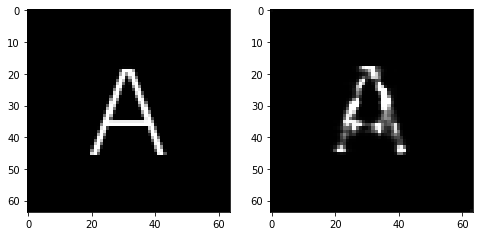

Epoch 88, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6666268147528172, Loss SSIM 2.3074936866760254, Loss Local 179.45172262191772


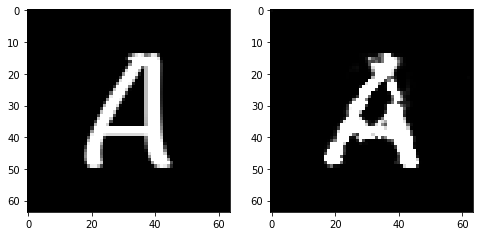

Epoch 88, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.678343154489994, Loss SSIM 2.3525243401527405, Loss Local 188.51168489456177


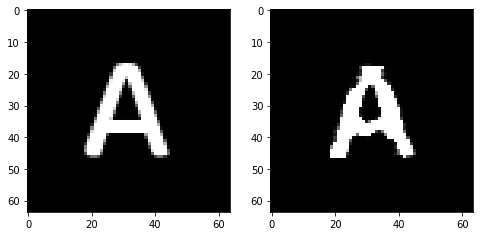

Epoch 89, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06005297973752022, Loss SSIM 0.07067573070526123, Loss Local 7.051717281341553


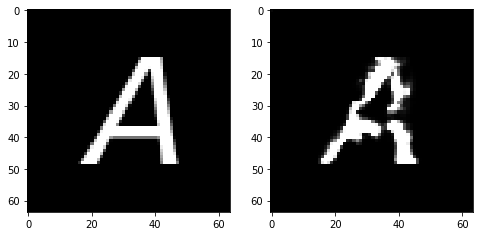

Epoch 89, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7198467627167702, Loss SSIM 2.3744420409202576, Loss Local 196.042809009552


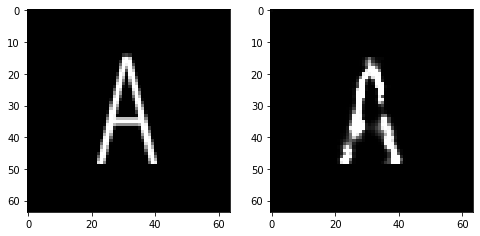

Epoch 89, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6605334356427193, Loss SSIM 2.250540018081665, Loss Local 184.16067743301392


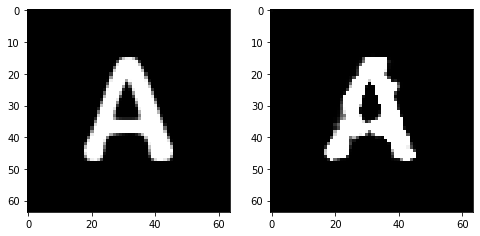

Epoch 89, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6580688618123531, Loss SSIM 2.2701594829559326, Loss Local 195.4214928150177


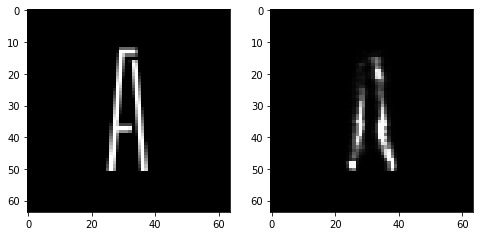

Epoch 89, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.679904993623495, Loss SSIM 2.330032169818878, Loss Local 188.9343466758728


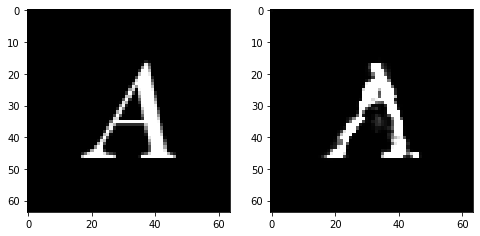

Epoch 89, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6869648844003677, Loss SSIM 2.301584541797638, Loss Local 181.54462337493896


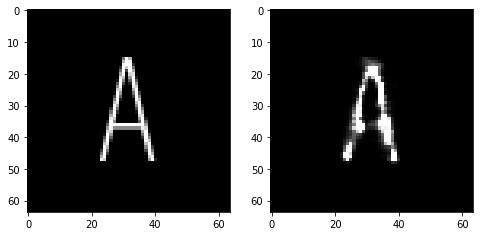

Epoch 89, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.699824433773756, Loss SSIM 2.3259564638137817, Loss Local 199.94064140319824


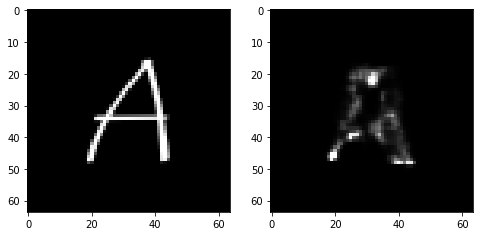

Epoch 89, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.630063846707344, Loss SSIM 2.2035860419273376, Loss Local 196.60041904449463


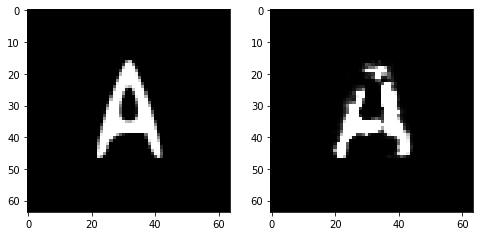

Epoch 90, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07360269129276276, Loss SSIM 0.09661740064620972, Loss Local 9.028556823730469


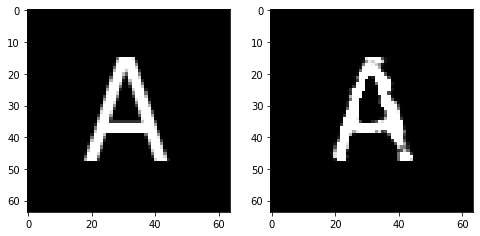

Epoch 90, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6430342085659504, Loss SSIM 2.2268316745758057, Loss Local 179.66076469421387


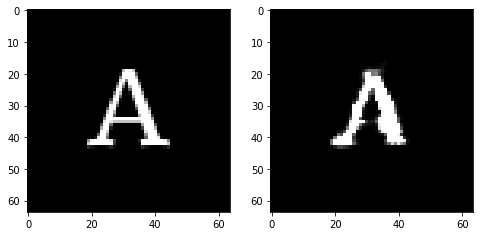

Epoch 90, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.700782909989357, Loss SSIM 2.3140010833740234, Loss Local 177.44312381744385


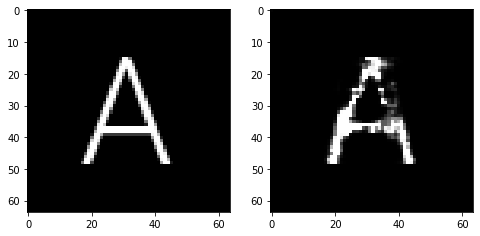

Epoch 90, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.662134762853384, Loss SSIM 2.279042422771454, Loss Local 183.2911958694458


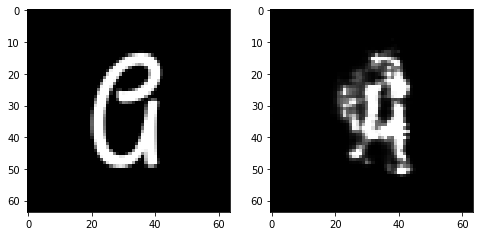

Epoch 90, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7391806580126286, Loss SSIM 2.4419317841529846, Loss Local 195.20798206329346


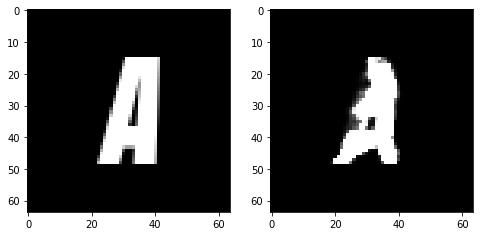

Epoch 90, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6921976394951344, Loss SSIM 2.324296295642853, Loss Local 188.45220947265625


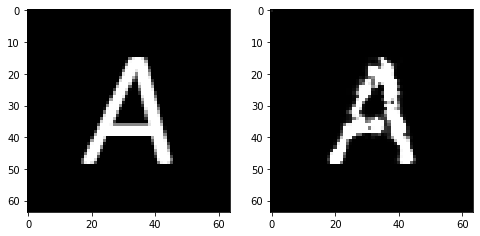

Epoch 90, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6436143331229687, Loss SSIM 2.212121903896332, Loss Local 189.89539527893066


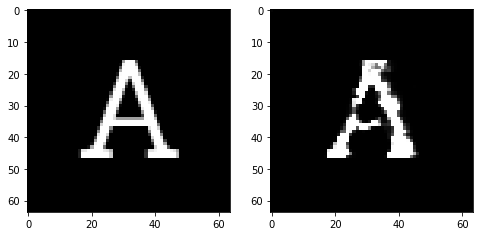

Epoch 90, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.700037818402052, Loss SSIM 2.3323605060577393, Loss Local 190.26203060150146


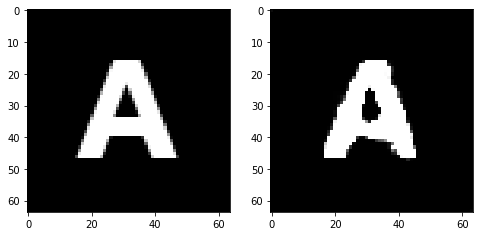

Epoch 91, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06596888601779938, Loss SSIM 0.09829401969909668, Loss Local 5.955861568450928


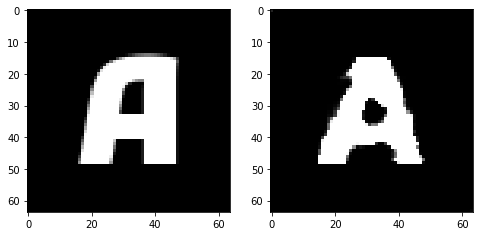

Epoch 91, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.669593170285225, Loss SSIM 2.32456111907959, Loss Local 186.63563585281372


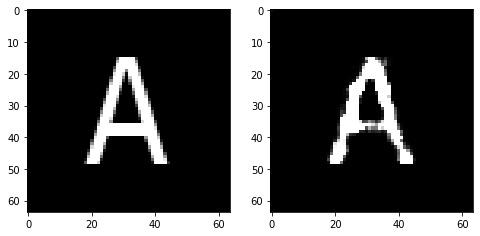

Epoch 91, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7269218005239964, Loss SSIM 2.3934693932533264, Loss Local 203.8216733932495


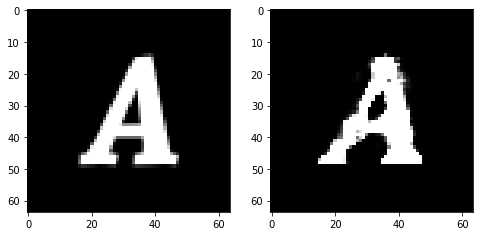

Epoch 91, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.650331236422062, Loss SSIM 2.1909786462783813, Loss Local 183.86271238327026


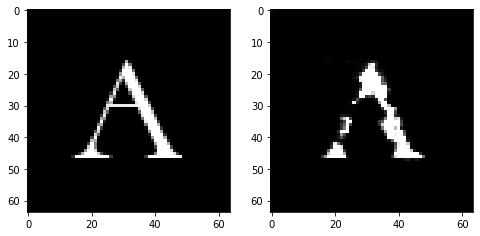

Epoch 91, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6938653849065304, Loss SSIM 2.3140957951545715, Loss Local 188.74656343460083


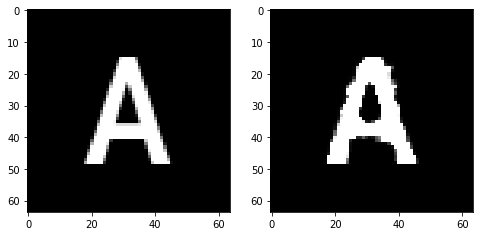

Epoch 91, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7070412822067738, Loss SSIM 2.3189110159873962, Loss Local 188.91032600402832


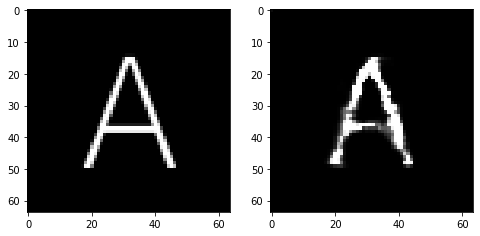

Epoch 91, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6797249913215637, Loss SSIM 2.309010684490204, Loss Local 185.22587156295776


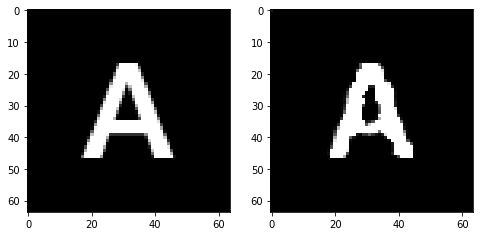

Epoch 91, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6586727611720562, Loss SSIM 2.268060564994812, Loss Local 188.86673879623413


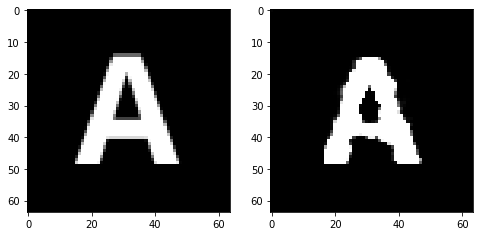

Epoch 92, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0991927981376648, Loss SSIM 0.14833182096481323, Loss Local 11.830221176147461


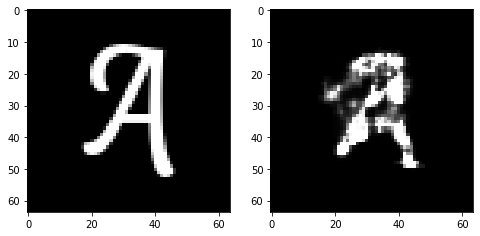

Epoch 92, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.76196676120162, Loss SSIM 2.3877673149108887, Loss Local 190.70598077774048


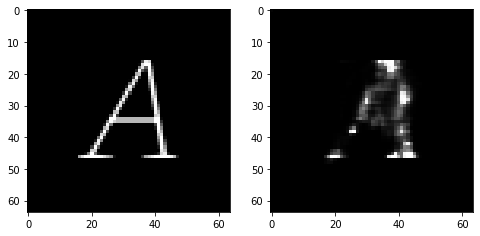

Epoch 92, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.714148972183466, Loss SSIM 2.3567931056022644, Loss Local 191.15356636047363


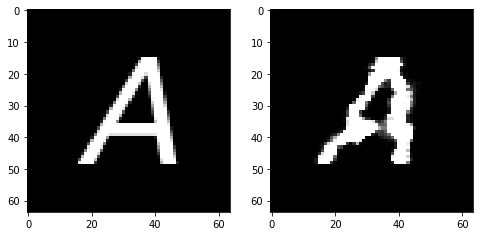

Epoch 92, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6745311506092548, Loss SSIM 2.2864773869514465, Loss Local 198.12915182113647


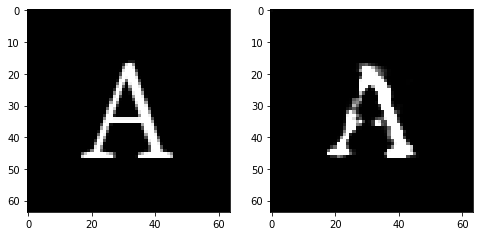

Epoch 92, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651214424520731, Loss SSIM 2.2476611137390137, Loss Local 189.50406789779663


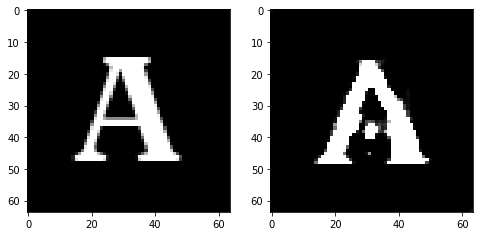

Epoch 92, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6611050702631474, Loss SSIM 2.2422621846199036, Loss Local 197.07240629196167


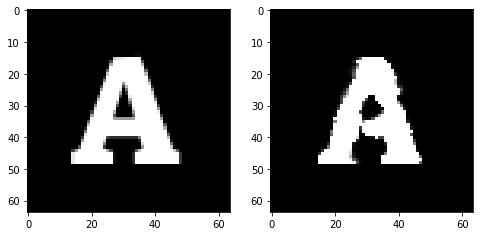

Epoch 92, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6334619633853436, Loss SSIM 2.2184314131736755, Loss Local 184.57350873947144


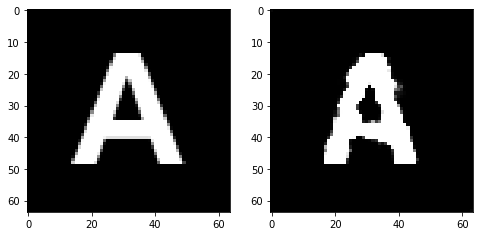

Epoch 92, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6445419192314148, Loss SSIM 2.2594125866889954, Loss Local 187.59659147262573


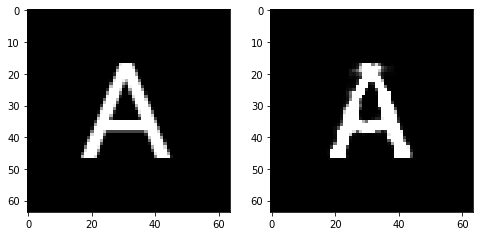

Epoch 93, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06540850549936295, Loss SSIM 0.0873720645904541, Loss Local 7.240999221801758


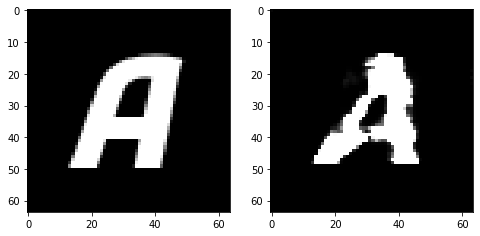

Epoch 93, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6898744702339172, Loss SSIM 2.332742393016815, Loss Local 200.61274576187134


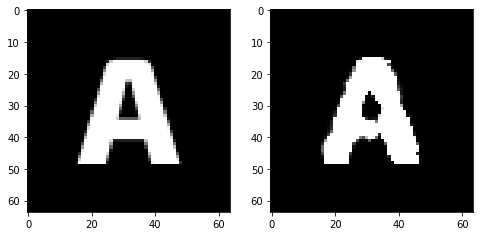

Epoch 93, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6830857396125793, Loss SSIM 2.3492162823677063, Loss Local 190.62538623809814


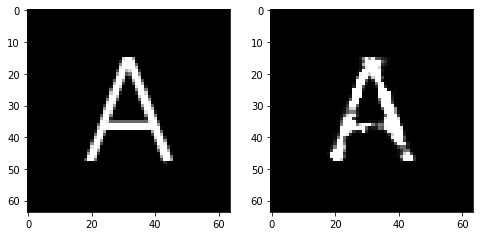

Epoch 93, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6643814444541931, Loss SSIM 2.224015533924103, Loss Local 187.44042205810547


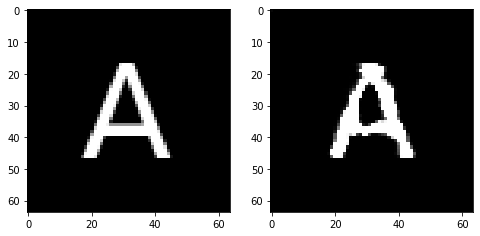

Epoch 93, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.685031395405531, Loss SSIM 2.241764485836029, Loss Local 182.69485235214233


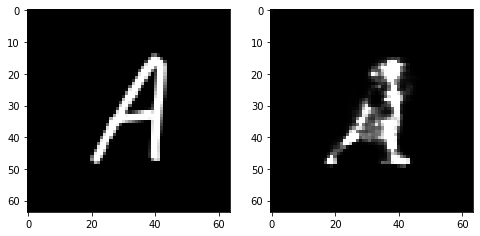

Epoch 93, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.686873335391283, Loss SSIM 2.3716768622398376, Loss Local 191.64257335662842


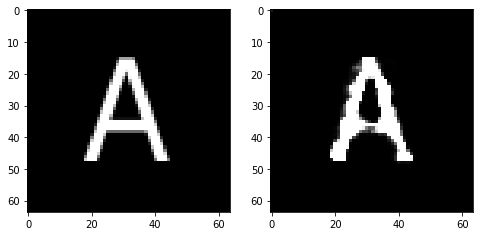

Epoch 93, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.669871810823679, Loss SSIM 2.26224023103714, Loss Local 187.72580766677856


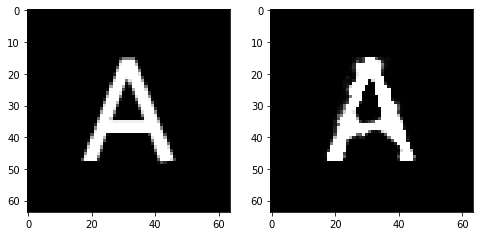

Epoch 93, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6105350442230701, Loss SSIM 2.199491024017334, Loss Local 189.39373540878296


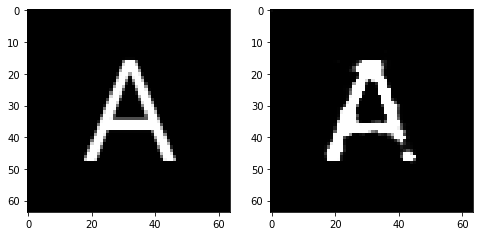

Epoch 94, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0607299767434597, Loss SSIM 0.07241588830947876, Loss Local 6.192841529846191


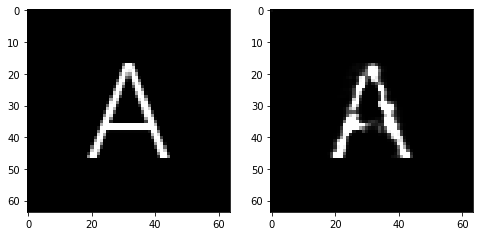

Epoch 94, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6513238474726677, Loss SSIM 2.3152379393577576, Loss Local 183.42922735214233


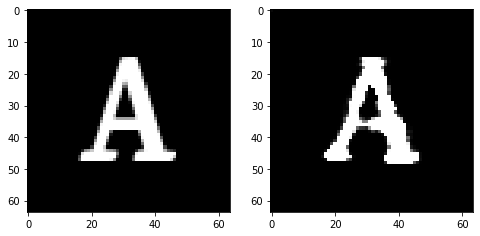

Epoch 94, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6637447662651539, Loss SSIM 2.2578160166740417, Loss Local 190.2147741317749


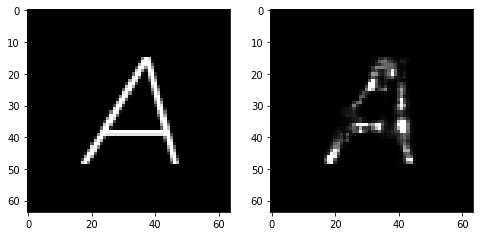

Epoch 94, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6316564157605171, Loss SSIM 2.1927568316459656, Loss Local 178.975115776062


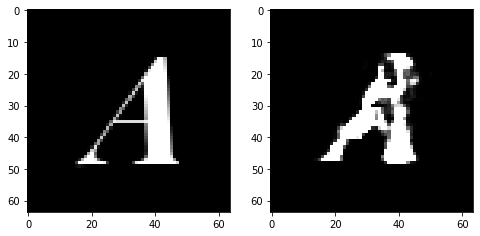

Epoch 94, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6857113428413868, Loss SSIM 2.248994827270508, Loss Local 185.68477725982666


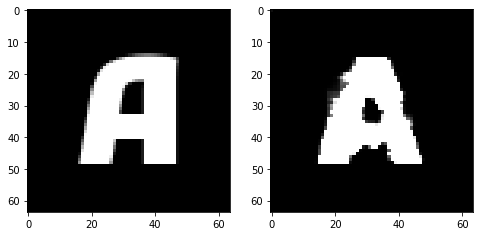

Epoch 94, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6860371008515358, Loss SSIM 2.3082916140556335, Loss Local 198.45481491088867


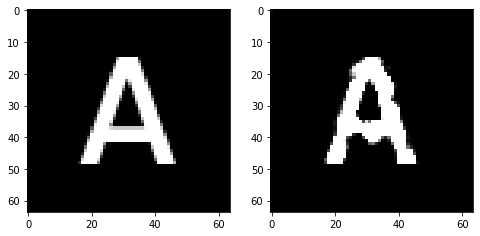

Epoch 94, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.664261307567358, Loss SSIM 2.2507641315460205, Loss Local 191.99526643753052


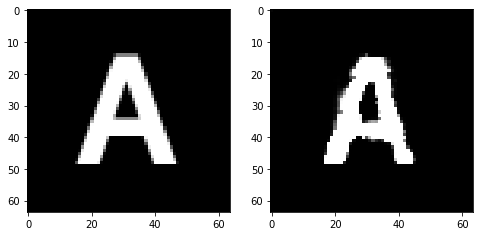

Epoch 94, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7185666412115097, Loss SSIM 2.4103405475616455, Loss Local 195.09176778793335


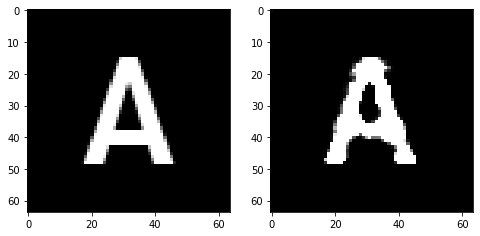

Epoch 95, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06676755100488663, Loss SSIM 0.08402144908905029, Loss Local 8.109475135803223


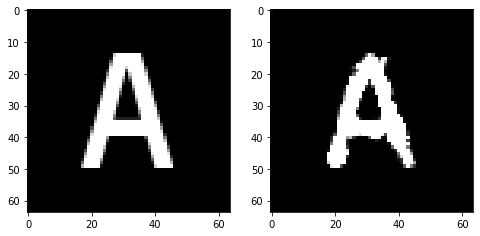

Epoch 95, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6612253710627556, Loss SSIM 2.298369348049164, Loss Local 192.2308864593506


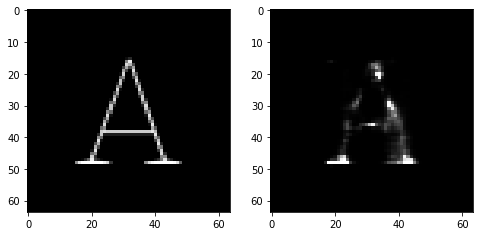

Epoch 95, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.65208413079381, Loss SSIM 2.280415713787079, Loss Local 176.68212461471558


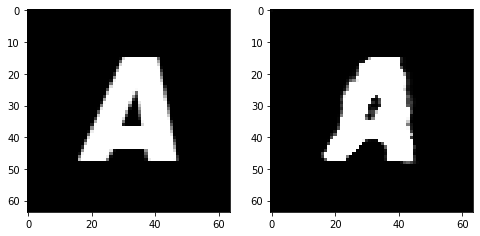

Epoch 95, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7316714636981487, Loss SSIM 2.373595952987671, Loss Local 191.68665075302124


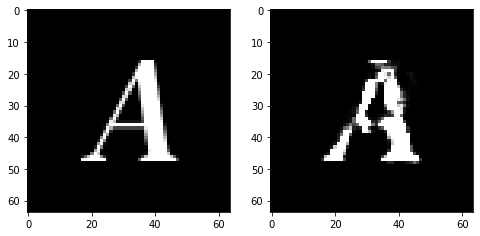

Epoch 95, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.66966225579381, Loss SSIM 2.2289037704467773, Loss Local 191.2681655883789


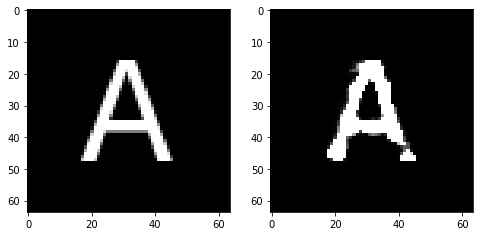

Epoch 95, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6403851434588432, Loss SSIM 2.216548502445221, Loss Local 190.84735584259033


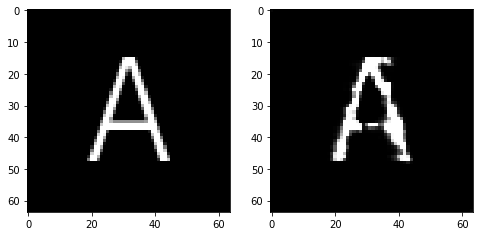

Epoch 95, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6832190304994583, Loss SSIM 2.2730857729911804, Loss Local 191.5149040222168


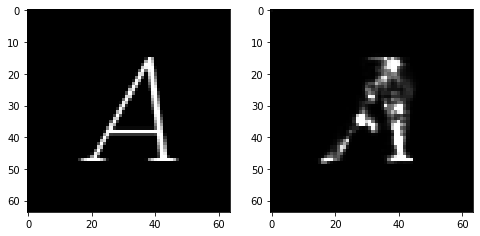

Epoch 95, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.670346587896347, Loss SSIM 2.2476961612701416, Loss Local 196.268883228302


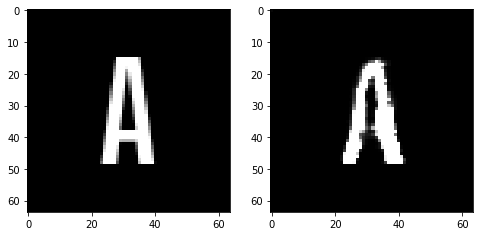

Epoch 96, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07848303765058517, Loss SSIM 0.11598438024520874, Loss Local 8.02425479888916


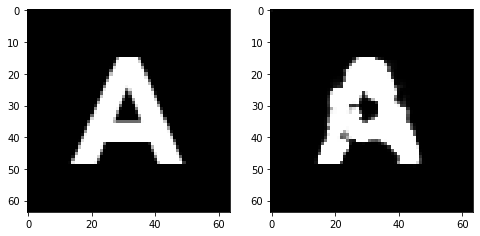

Epoch 96, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7271705642342567, Loss SSIM 2.3627026081085205, Loss Local 186.5049729347229


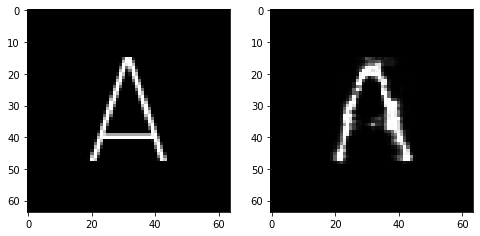

Epoch 96, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6634982787072659, Loss SSIM 2.3169625401496887, Loss Local 185.74178791046143


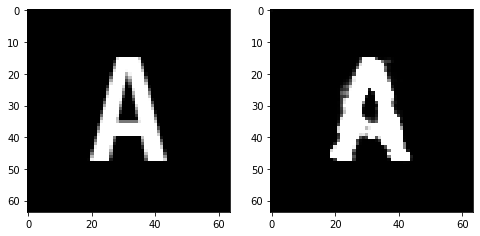

Epoch 96, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6316665410995483, Loss SSIM 2.2152435779571533, Loss Local 178.12198781967163


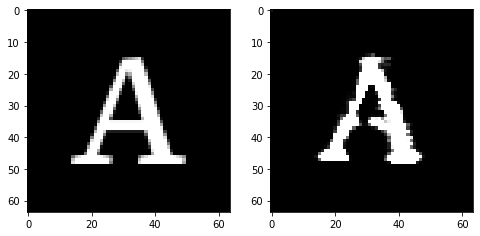

Epoch 96, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6846107207238674, Loss SSIM 2.36876779794693, Loss Local 187.82232189178467


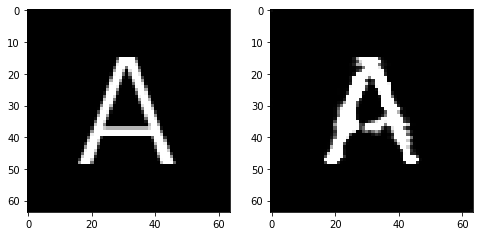

Epoch 96, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6629443019628525, Loss SSIM 2.214486598968506, Loss Local 184.3491849899292


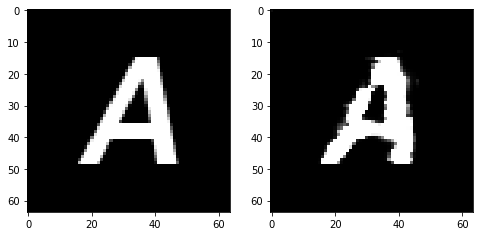

Epoch 96, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.660017129033804, Loss SSIM 2.226180076599121, Loss Local 182.7357063293457


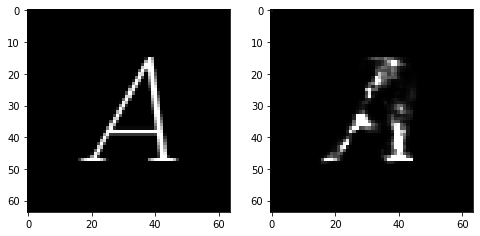

Epoch 96, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6728371046483517, Loss SSIM 2.259143114089966, Loss Local 184.43506526947021


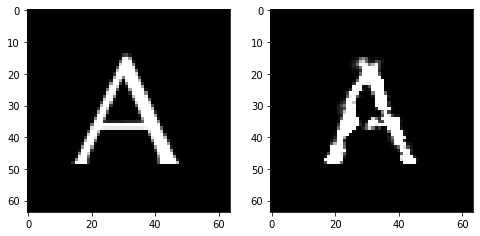

Epoch 97, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06289346516132355, Loss SSIM 0.08320194482803345, Loss Local 5.029201030731201


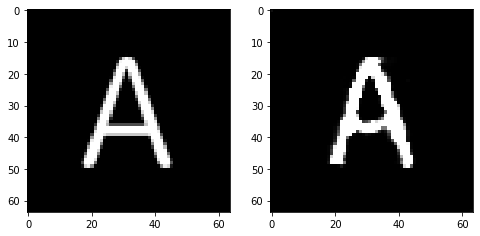

Epoch 97, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7240671515464783, Loss SSIM 2.3368855118751526, Loss Local 193.2117943763733


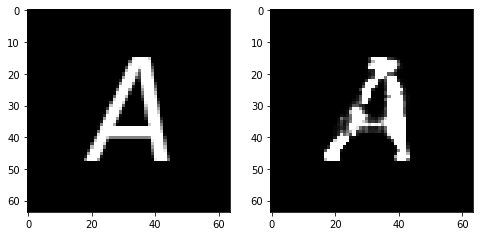

Epoch 97, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6783581525087357, Loss SSIM 2.272911489009857, Loss Local 178.23039436340332


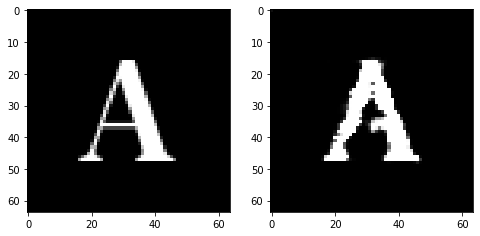

Epoch 97, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6974204815924168, Loss SSIM 2.3119351267814636, Loss Local 192.64046955108643


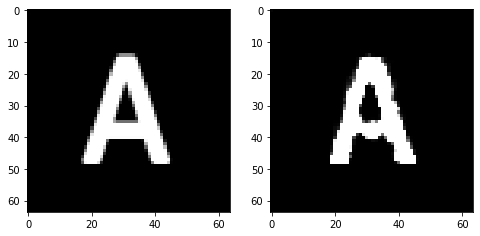

Epoch 97, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6567445695400238, Loss SSIM 2.233525037765503, Loss Local 182.862446308136


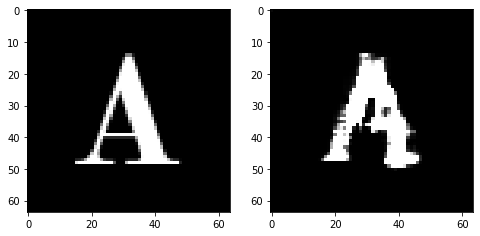

Epoch 97, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5816372893750668, Loss SSIM 2.1287161707878113, Loss Local 173.13625812530518


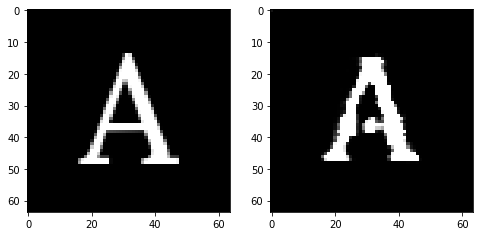

Epoch 97, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6918251253664494, Loss SSIM 2.338434934616089, Loss Local 193.49787998199463


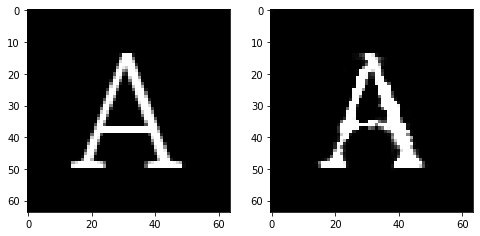

Epoch 97, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.696203250437975, Loss SSIM 2.3470855951309204, Loss Local 191.50950527191162


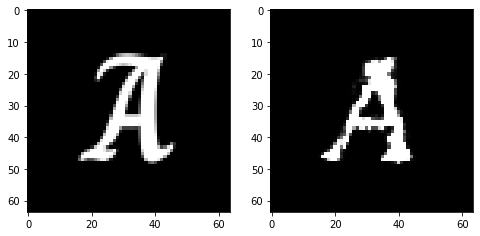

Epoch 98, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06730907410383224, Loss SSIM 0.08715188503265381, Loss Local 5.6203999519348145


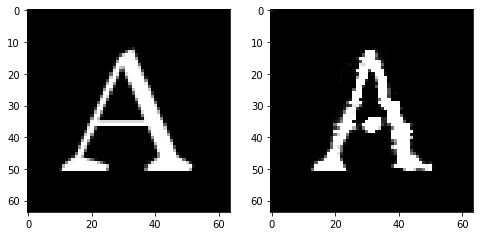

Epoch 98, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.640935804694891, Loss SSIM 2.2133606672286987, Loss Local 181.26702308654785


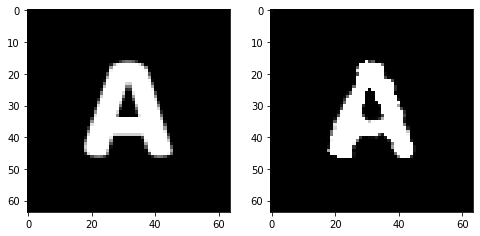

Epoch 98, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6834952533245087, Loss SSIM 2.2540626525878906, Loss Local 193.21554708480835


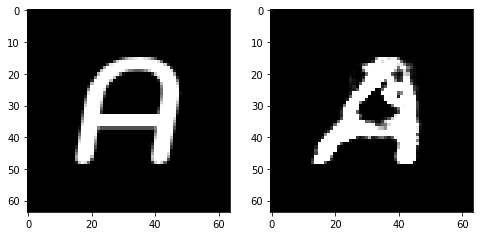

Epoch 98, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6105108000338078, Loss SSIM 2.218279242515564, Loss Local 170.39457941055298


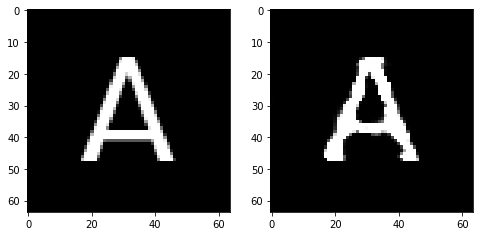

Epoch 98, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6904620416462421, Loss SSIM 2.308809995651245, Loss Local 191.53082036972046


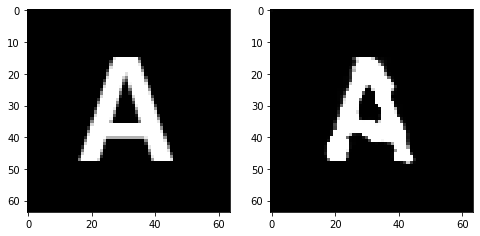

Epoch 98, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6241256445646286, Loss SSIM 2.18758761882782, Loss Local 183.23777437210083


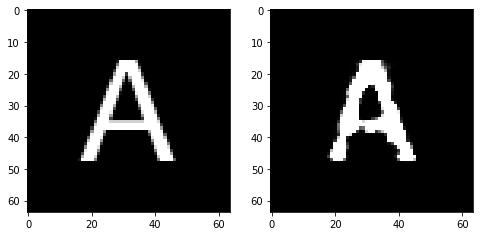

Epoch 98, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.681373592466116, Loss SSIM 2.3180918097496033, Loss Local 180.29407024383545


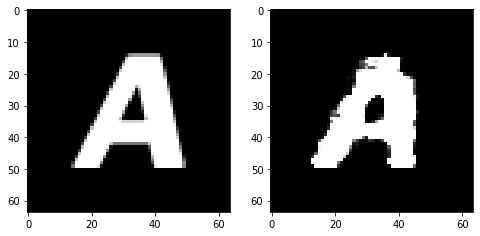

Epoch 98, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.730657134205103, Loss SSIM 2.3811904191970825, Loss Local 194.8983826637268


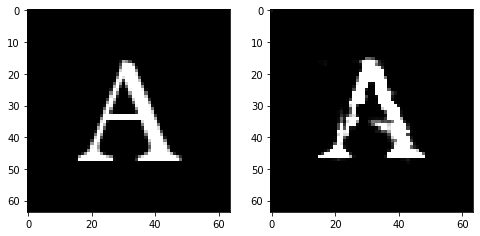

Epoch 99, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06941648572683334, Loss SSIM 0.09538984298706055, Loss Local 8.591495513916016


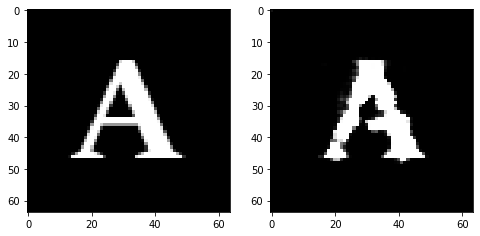

Epoch 99, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.706273052841425, Loss SSIM 2.3090171813964844, Loss Local 190.9140920639038


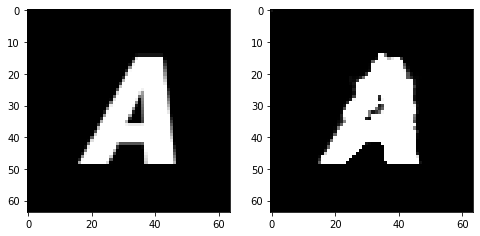

Epoch 99, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6848023161292076, Loss SSIM 2.3442097306251526, Loss Local 192.58283758163452


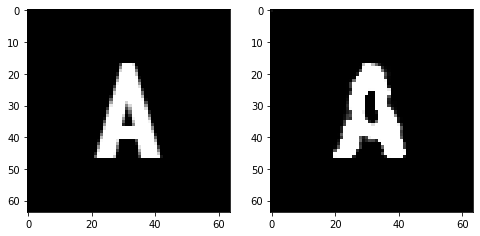

Epoch 99, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.634008951485157, Loss SSIM 2.140788435935974, Loss Local 183.39879727363586


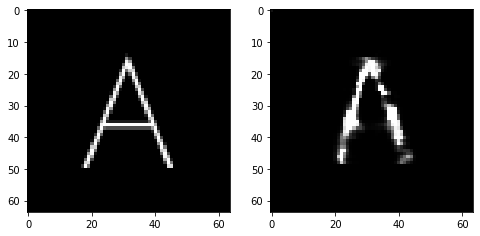

Epoch 99, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7151734083890915, Loss SSIM 2.4169798493385315, Loss Local 186.57077932357788


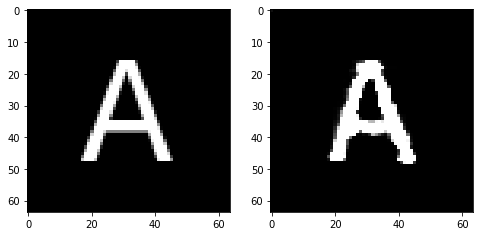

Epoch 99, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6205953732132912, Loss SSIM 2.166845202445984, Loss Local 177.592426776886


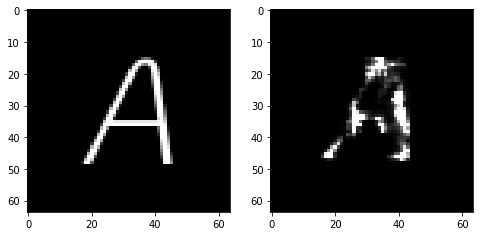

Epoch 99, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6584285870194435, Loss SSIM 2.2755693793296814, Loss Local 197.65591669082642


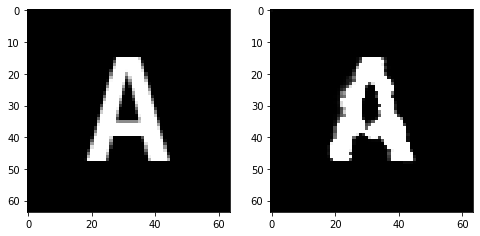

Epoch 99, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6891484074294567, Loss SSIM 2.3052905201911926, Loss Local 189.43699502944946


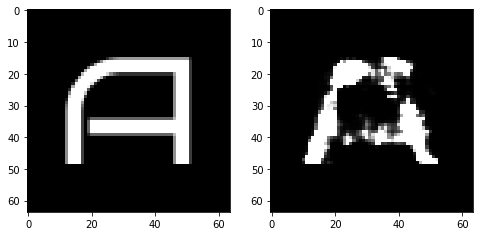

Epoch 100, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06976399570703506, Loss SSIM 0.0906304121017456, Loss Local 8.240525245666504


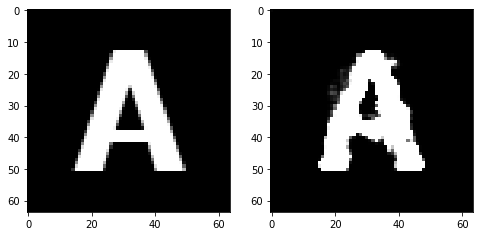

Epoch 100, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6649219542741776, Loss SSIM 2.2637277245521545, Loss Local 188.10175943374634


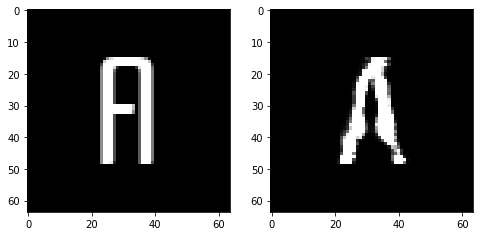

Epoch 100, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.654598593711853, Loss SSIM 2.2704309821128845, Loss Local 186.34329271316528


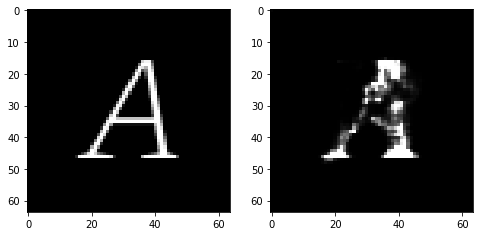

Epoch 100, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6852463521063328, Loss SSIM 2.360207498073578, Loss Local 185.08899545669556


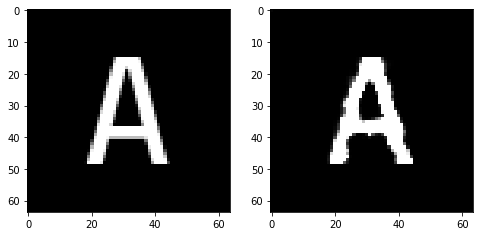

Epoch 100, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6881153360009193, Loss SSIM 2.276447296142578, Loss Local 184.4593539237976


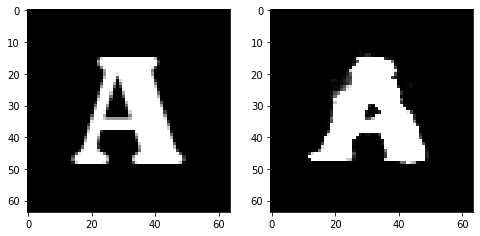

Epoch 100, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6561516895890236, Loss SSIM 2.214051306247711, Loss Local 179.05428838729858


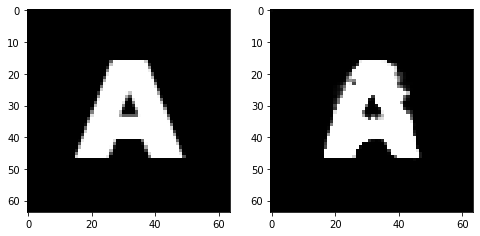

Epoch 100, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.72031045332551, Loss SSIM 2.400303363800049, Loss Local 192.87286901474


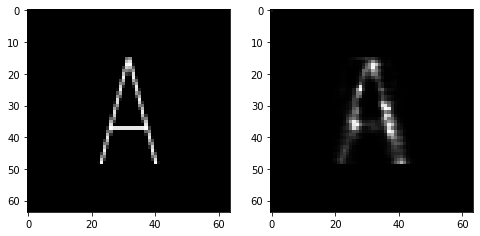

Epoch 100, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6646412797272205, Loss SSIM 2.256954848766327, Loss Local 183.38498783111572


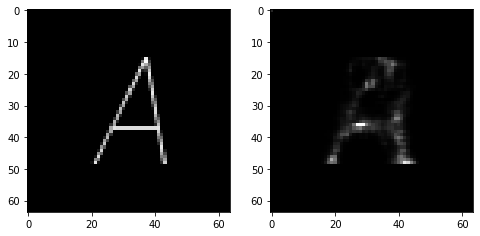

Epoch 101, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06975137442350388, Loss SSIM 0.09820801019668579, Loss Local 8.458307266235352


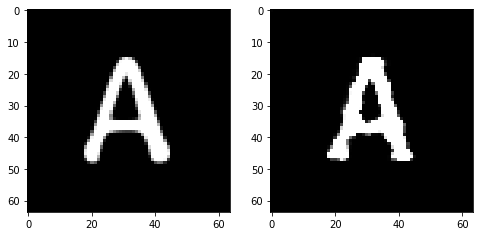

Epoch 101, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6828483417630196, Loss SSIM 2.246740758419037, Loss Local 188.66210889816284


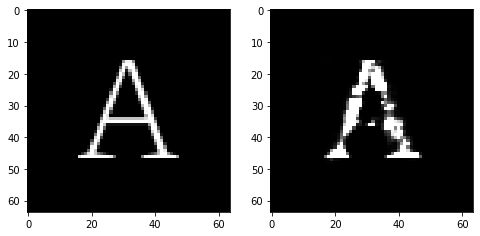

Epoch 101, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.68515694886446, Loss SSIM 2.3525338172912598, Loss Local 194.00781726837158


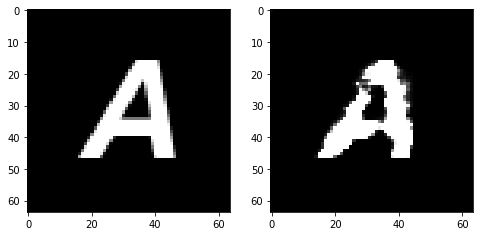

Epoch 101, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6339978761970997, Loss SSIM 2.198917031288147, Loss Local 182.5094051361084


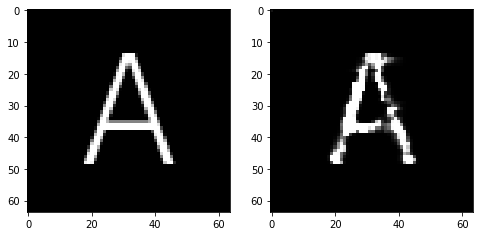

Epoch 101, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6349287070333958, Loss SSIM 2.228389024734497, Loss Local 176.4407320022583


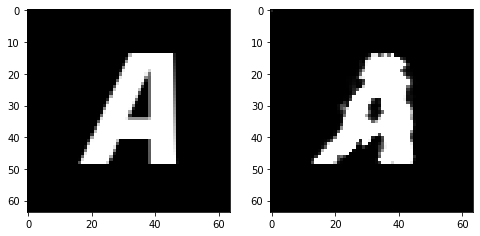

Epoch 101, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.648361723870039, Loss SSIM 2.2322922348976135, Loss Local 175.64558744430542


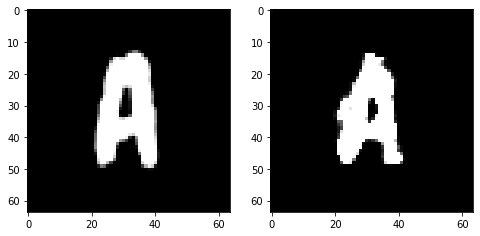

Epoch 101, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7361958734691143, Loss SSIM 2.4184146523475647, Loss Local 199.84643697738647


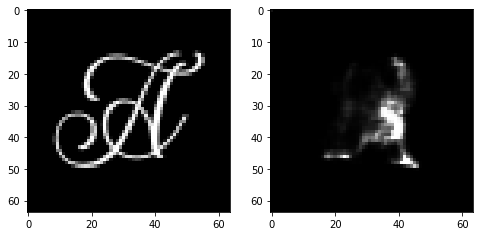

Epoch 101, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6760129481554031, Loss SSIM 2.2536932826042175, Loss Local 177.37464380264282


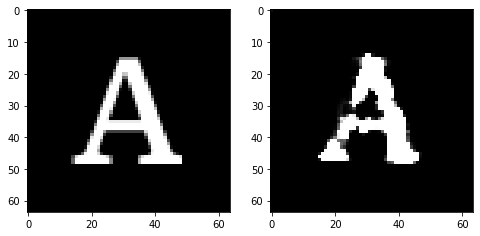

Epoch 102, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0798359289765358, Loss SSIM 0.11722540855407715, Loss Local 7.777726650238037


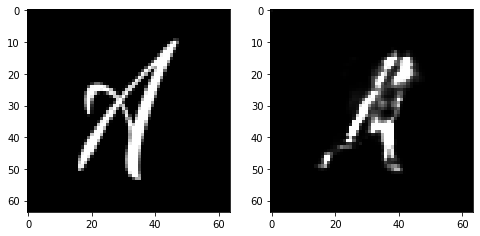

Epoch 102, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.770716093480587, Loss SSIM 2.4221184849739075, Loss Local 191.62294101715088


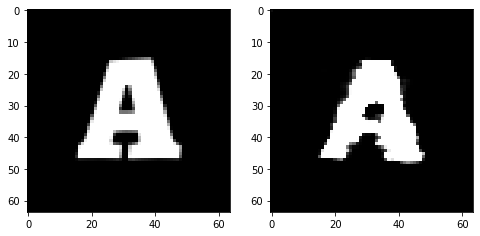

Epoch 102, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6645596325397491, Loss SSIM 2.2147300839424133, Loss Local 189.67610597610474


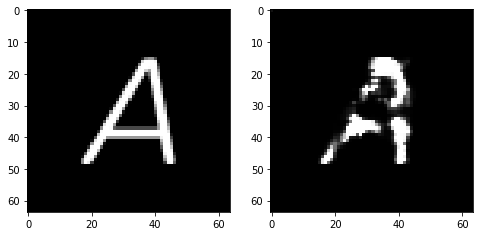

Epoch 102, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6229322031140327, Loss SSIM 2.220865249633789, Loss Local 181.019127368927


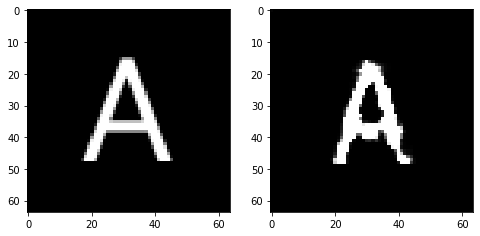

Epoch 102, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6073459908366203, Loss SSIM 2.1669148802757263, Loss Local 177.5146632194519


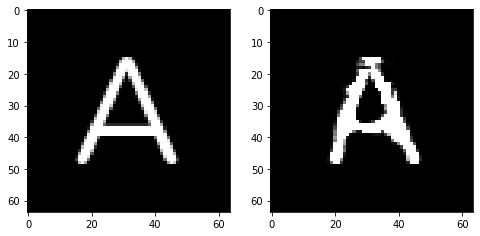

Epoch 102, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6550975516438484, Loss SSIM 2.2914708256721497, Loss Local 181.92807054519653


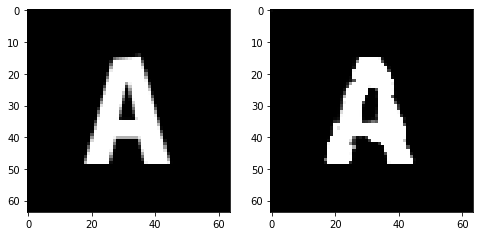

Epoch 102, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6583015397191048, Loss SSIM 2.24899423122406, Loss Local 197.21786832809448


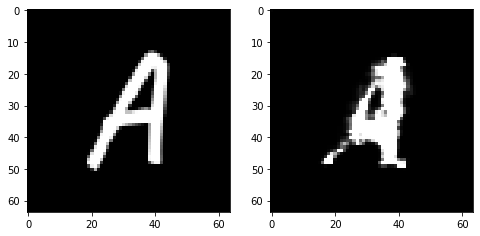

Epoch 102, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7117685973644257, Loss SSIM 2.334341824054718, Loss Local 183.6064648628235


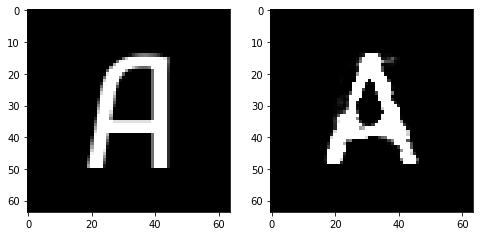

Epoch 103, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0751594603061676, Loss SSIM 0.10832387208938599, Loss Local 7.521249771118164


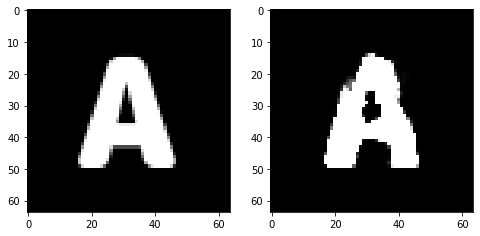

Epoch 103, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6720051802694798, Loss SSIM 2.3126426339149475, Loss Local 180.53602695465088


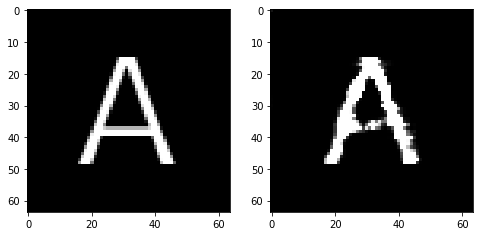

Epoch 103, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6731125637888908, Loss SSIM 2.2657065391540527, Loss Local 189.29933404922485


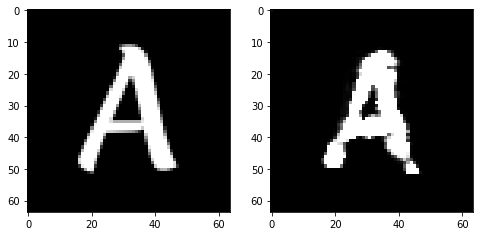

Epoch 103, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6995985582470894, Loss SSIM 2.3047871589660645, Loss Local 190.94174814224243


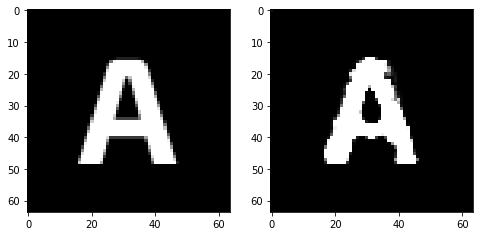

Epoch 103, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.643981959670782, Loss SSIM 2.229438006877899, Loss Local 186.62479066848755


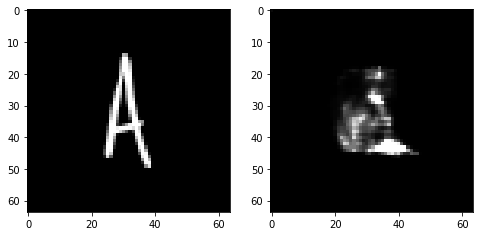

Epoch 103, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7019626572728157, Loss SSIM 2.3390899300575256, Loss Local 183.8918719291687


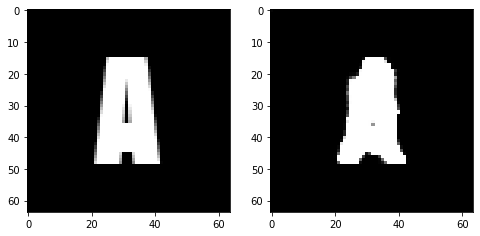

Epoch 103, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6388026252388954, Loss SSIM 2.2062721252441406, Loss Local 183.9475269317627


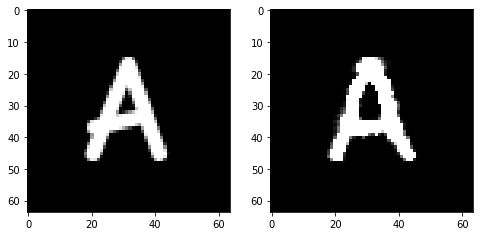

Epoch 103, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6754589714109898, Loss SSIM 2.2788115739822388, Loss Local 180.2124423980713


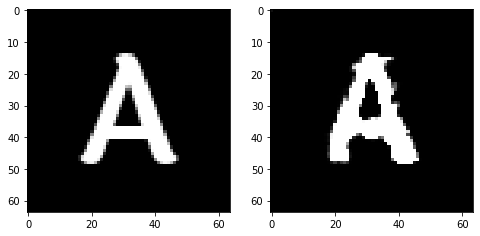

Epoch 104, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.061936233192682266, Loss SSIM 0.08310168981552124, Loss Local 8.177400588989258


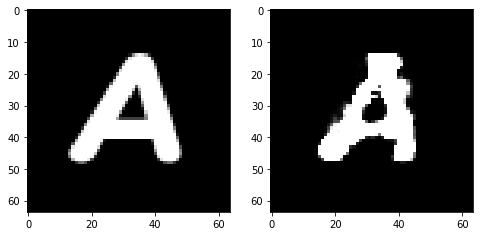

Epoch 104, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6373046711087227, Loss SSIM 2.246007204055786, Loss Local 179.58189916610718


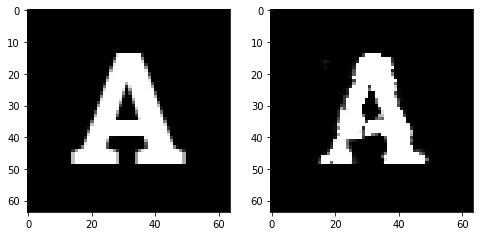

Epoch 104, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6814066842198372, Loss SSIM 2.298197627067566, Loss Local 192.16806364059448


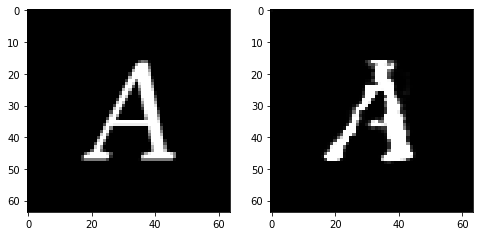

Epoch 104, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6515261083841324, Loss SSIM 2.1908534169197083, Loss Local 186.85986328125


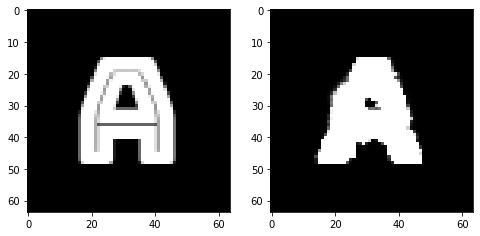

Epoch 104, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7018240541219711, Loss SSIM 2.3842225074768066, Loss Local 189.9820728302002


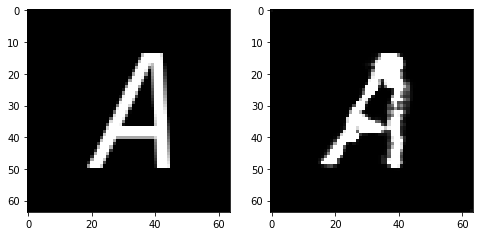

Epoch 104, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6780660822987556, Loss SSIM 2.2566037774086, Loss Local 190.1731879711151


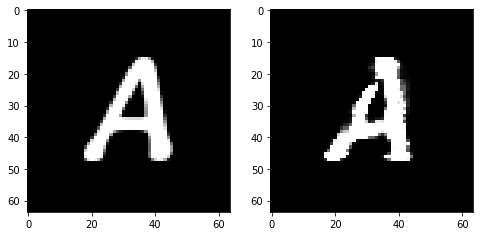

Epoch 104, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7169745974242687, Loss SSIM 2.3307721614837646, Loss Local 187.5449709892273


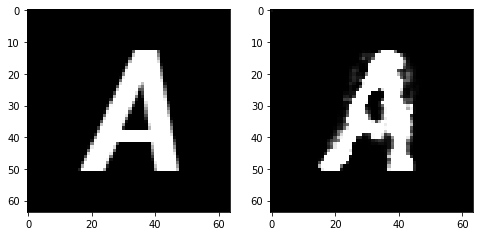

Epoch 104, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.656266376376152, Loss SSIM 2.2493305802345276, Loss Local 193.57289505004883


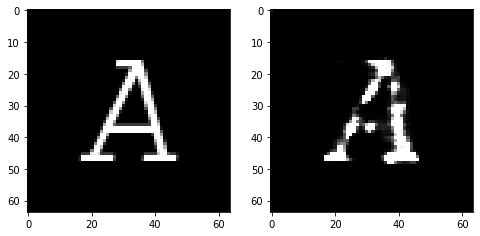

Epoch 105, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07112198323011398, Loss SSIM 0.10069447755813599, Loss Local 6.491183280944824


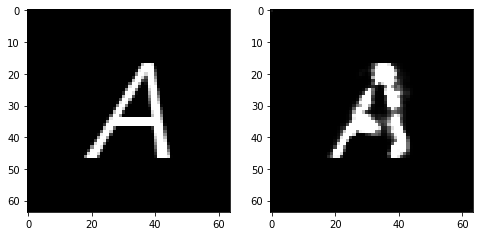

Epoch 105, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6293959617614746, Loss SSIM 2.1790757179260254, Loss Local 194.10452604293823


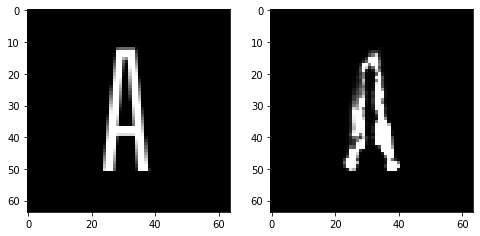

Epoch 105, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6266911774873734, Loss SSIM 2.2038885354995728, Loss Local 184.55005598068237


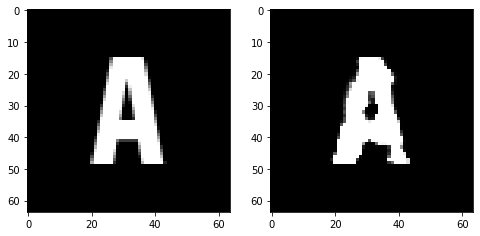

Epoch 105, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6480765417218208, Loss SSIM 2.259441912174225, Loss Local 190.66920375823975


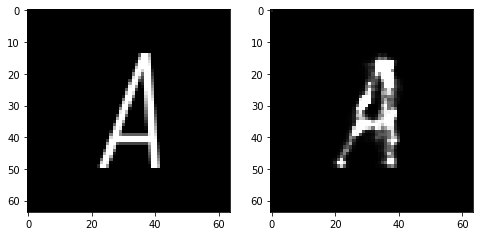

Epoch 105, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7059930823743343, Loss SSIM 2.28919780254364, Loss Local 190.10722589492798


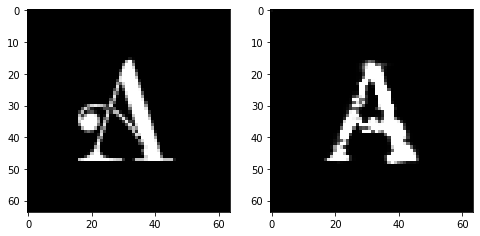

Epoch 105, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6956601105630398, Loss SSIM 2.3030182123184204, Loss Local 191.08025312423706


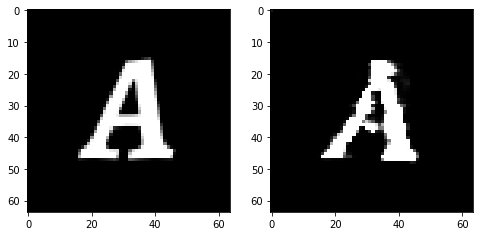

Epoch 105, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6951172687113285, Loss SSIM 2.3569512963294983, Loss Local 182.40805625915527


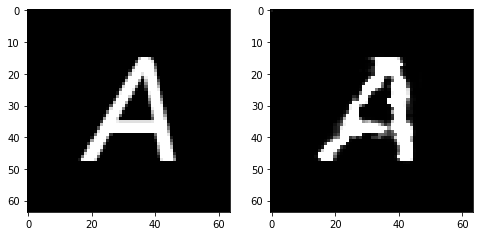

Epoch 105, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7175136394798756, Loss SSIM 2.3578880429267883, Loss Local 191.9357304573059


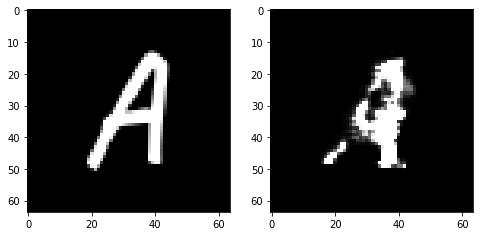

Epoch 106, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07480080425739288, Loss SSIM 0.09862655401229858, Loss Local 6.258063793182373


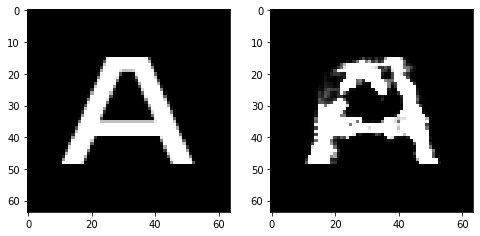

Epoch 106, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.663046944886446, Loss SSIM 2.2965729236602783, Loss Local 187.00964546203613


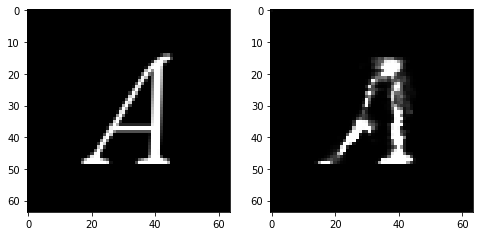

Epoch 106, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6560689210891724, Loss SSIM 2.287068545818329, Loss Local 193.93000841140747


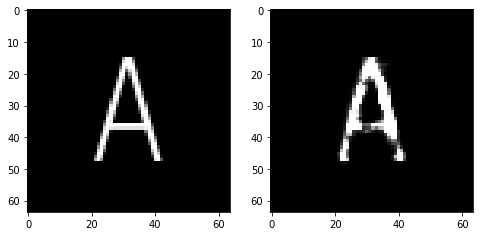

Epoch 106, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.659949216991663, Loss SSIM 2.237815022468567, Loss Local 191.670241355896


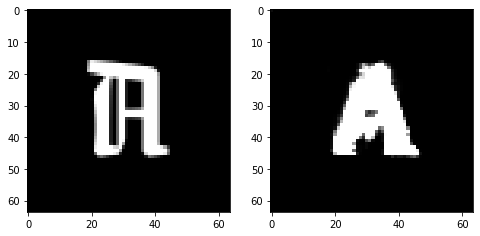

Epoch 106, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6803609803318977, Loss SSIM 2.2674348950386047, Loss Local 197.02126789093018


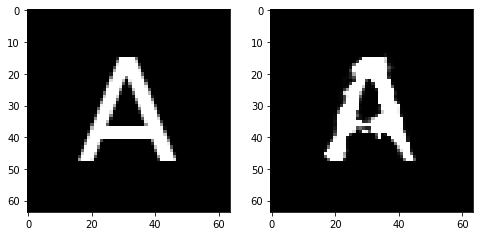

Epoch 106, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6750274747610092, Loss SSIM 2.3375622034072876, Loss Local 183.2518768310547


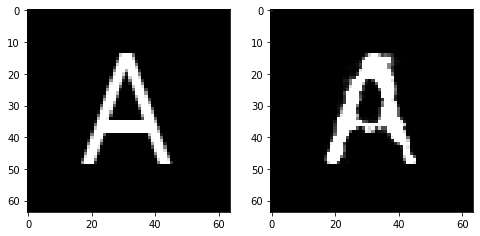

Epoch 106, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.690634597092867, Loss SSIM 2.299676299095154, Loss Local 187.20295429229736


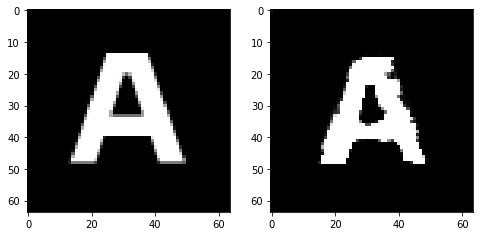

Epoch 106, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6727595254778862, Loss SSIM 2.249807596206665, Loss Local 181.09235095977783


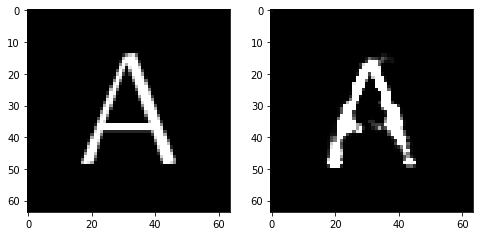

Epoch 107, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06882311403751373, Loss SSIM 0.10200774669647217, Loss Local 7.049969673156738


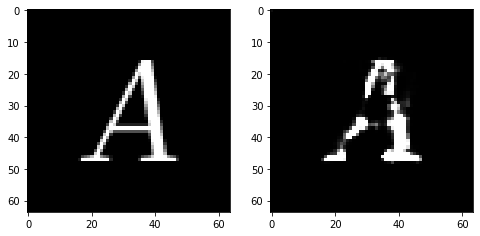

Epoch 107, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6801472939550877, Loss SSIM 2.2989413738250732, Loss Local 194.3996024131775


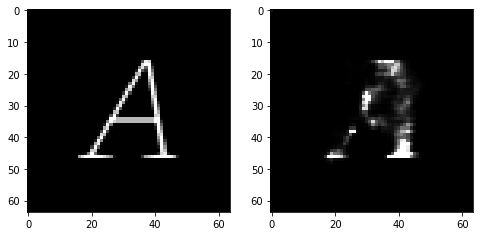

Epoch 107, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.658119797706604, Loss SSIM 2.2480289936065674, Loss Local 174.0412392616272


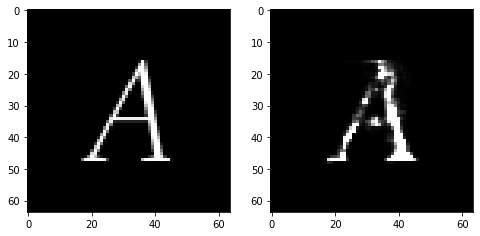

Epoch 107, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7165269181132317, Loss SSIM 2.36537504196167, Loss Local 194.78365182876587


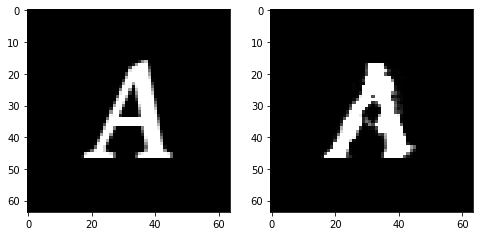

Epoch 107, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6911190152168274, Loss SSIM 2.300899386405945, Loss Local 197.57419109344482


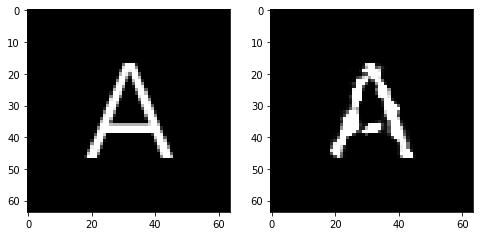

Epoch 107, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6713715121150017, Loss SSIM 2.2472391724586487, Loss Local 187.0446639060974


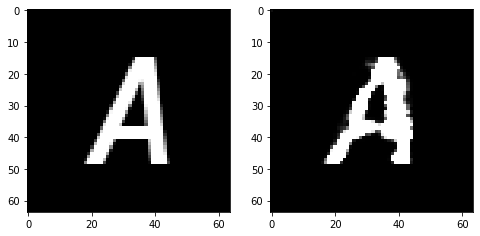

Epoch 107, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6317528188228607, Loss SSIM 2.212891161441803, Loss Local 179.6958270072937


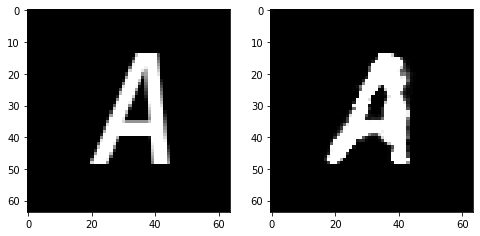

Epoch 107, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6303801946341991, Loss SSIM 2.2590883374214172, Loss Local 178.91685390472412


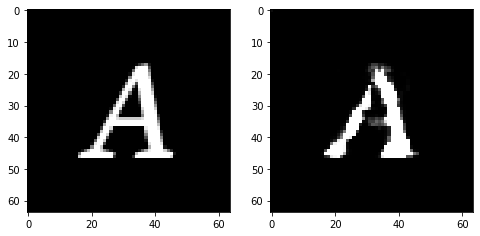

Epoch 108, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05336536839604378, Loss SSIM 0.07351517677307129, Loss Local 6.027889728546143


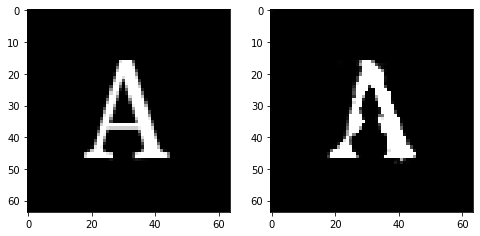

Epoch 108, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.710086900740862, Loss SSIM 2.3242746591567993, Loss Local 186.17849826812744


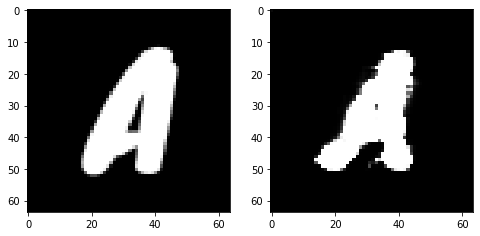

Epoch 108, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6163127645850182, Loss SSIM 2.243930399417877, Loss Local 183.8209204673767


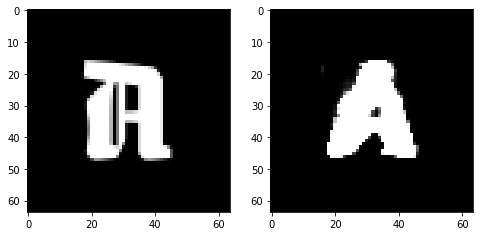

Epoch 108, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6239589378237724, Loss SSIM 2.182303309440613, Loss Local 188.0730996131897


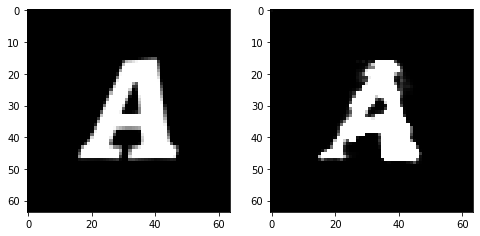

Epoch 108, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6805848851799965, Loss SSIM 2.3220857977867126, Loss Local 185.8396511077881


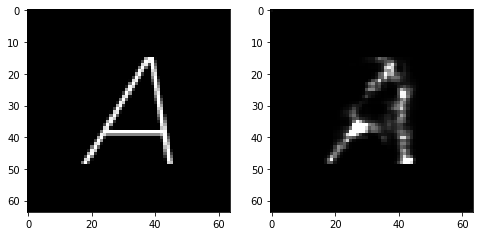

Epoch 108, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.677479486912489, Loss SSIM 2.2656978964805603, Loss Local 189.15972995758057


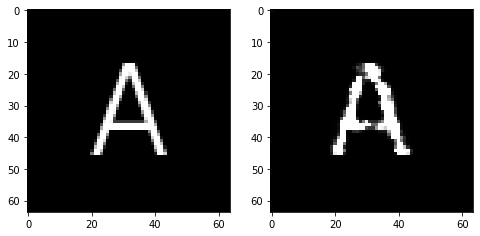

Epoch 108, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7028158865869045, Loss SSIM 2.2966822385787964, Loss Local 195.27990579605103


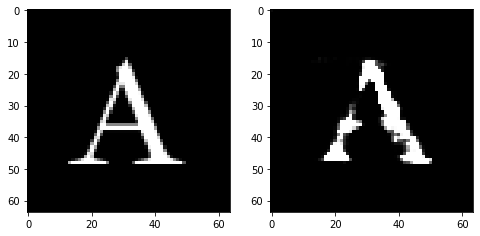

Epoch 108, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6359288692474365, Loss SSIM 2.236026406288147, Loss Local 184.10594034194946


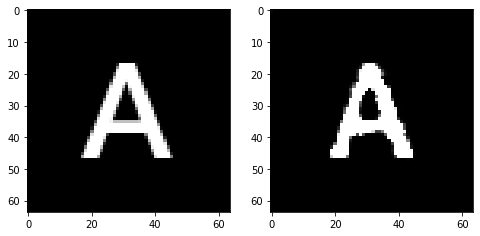

Epoch 109, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06485672295093536, Loss SSIM 0.08907842636108398, Loss Local 8.565947532653809


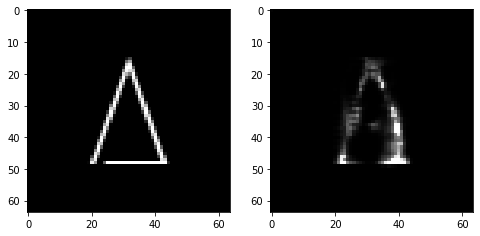

Epoch 109, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6530801840126514, Loss SSIM 2.2325176000595093, Loss Local 176.6372036933899


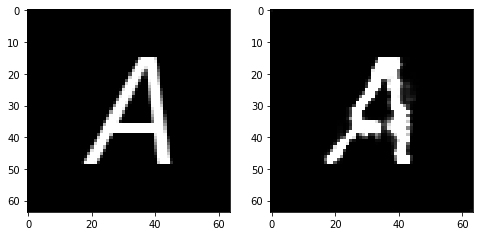

Epoch 109, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.627354171127081, Loss SSIM 2.199640452861786, Loss Local 191.29281616210938


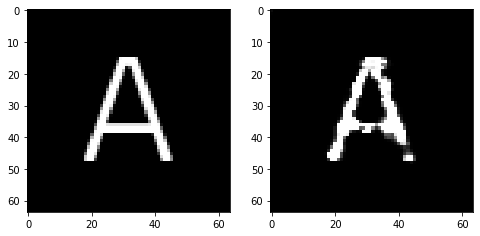

Epoch 109, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.69903065264225, Loss SSIM 2.3259092569351196, Loss Local 189.93716955184937


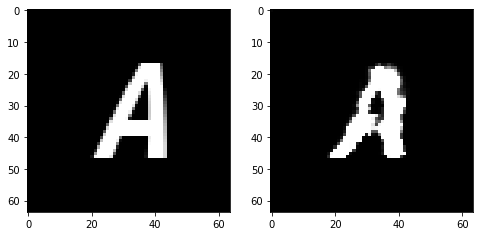

Epoch 109, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7074567005038261, Loss SSIM 2.3722174167633057, Loss Local 186.91926622390747


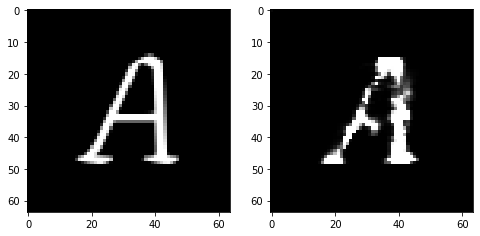

Epoch 109, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6312048137187958, Loss SSIM 2.2178195118904114, Loss Local 181.67992973327637


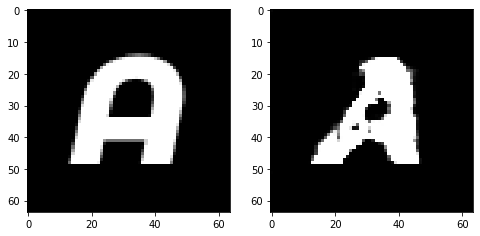

Epoch 109, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6399754546582699, Loss SSIM 2.2642595171928406, Loss Local 179.78224086761475


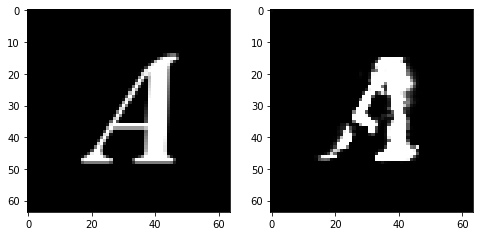

Epoch 109, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.657392118126154, Loss SSIM 2.1679546236991882, Loss Local 192.32570838928223


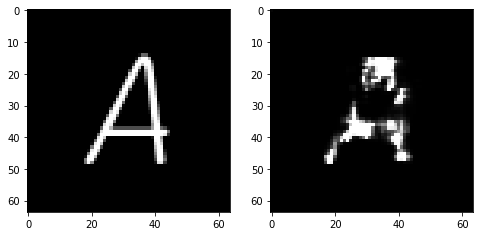

Epoch 110, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.627176396548748, Loss SSIM 2.24196857213974, Loss Local 176.64403581619263


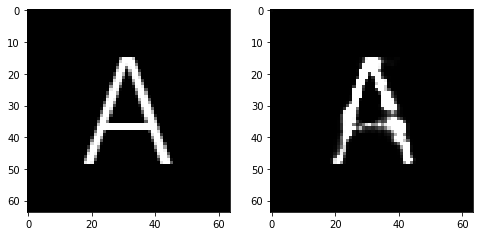

Epoch 110, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.693705078214407, Loss SSIM 2.358241319656372, Loss Local 180.71829843521118


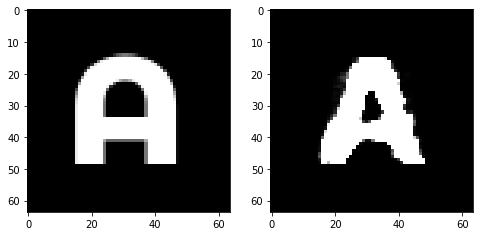

Epoch 111, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06229402869939804, Loss SSIM 0.07828634977340698, Loss Local 8.083991050720215


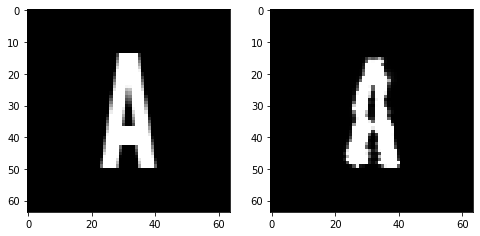

Epoch 111, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6604170016944408, Loss SSIM 2.2425761222839355, Loss Local 182.839271068573


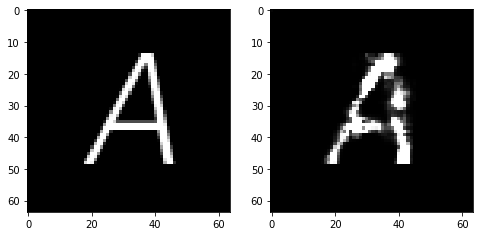

Epoch 111, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6844786889851093, Loss SSIM 2.3101913928985596, Loss Local 183.18056297302246


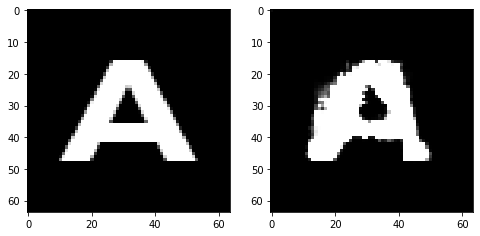

Epoch 111, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6215927302837372, Loss SSIM 2.1637651324272156, Loss Local 180.8698697090149


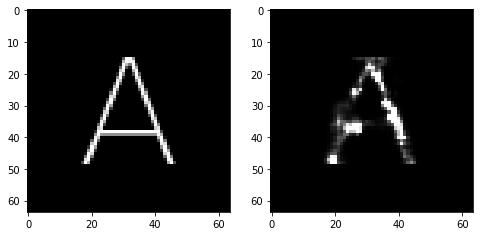

Epoch 111, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6686267219483852, Loss SSIM 2.2289692759513855, Loss Local 182.6963391304016


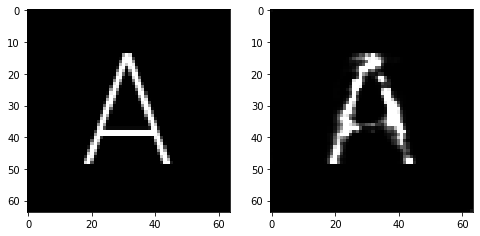

Epoch 111, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.654437329620123, Loss SSIM 2.3024468421936035, Loss Local 188.19303941726685


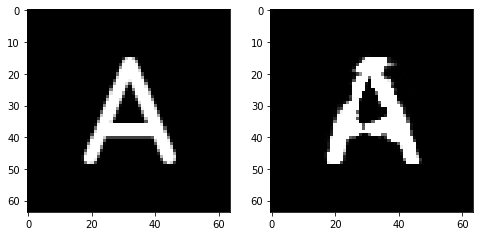

Epoch 111, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6829425059258938, Loss SSIM 2.294030547142029, Loss Local 185.58562994003296


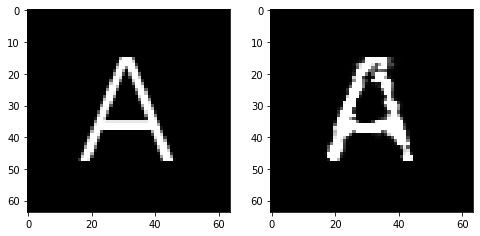

Epoch 111, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6620681025087833, Loss SSIM 2.2984325885772705, Loss Local 191.36942625045776


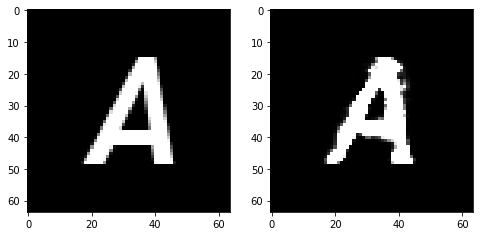

Epoch 112, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06147031858563423, Loss SSIM 0.07992929220199585, Loss Local 7.897305488586426


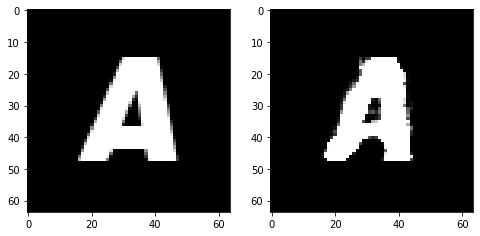

Epoch 112, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.62413964048028, Loss SSIM 2.260588526725769, Loss Local 184.6948380470276


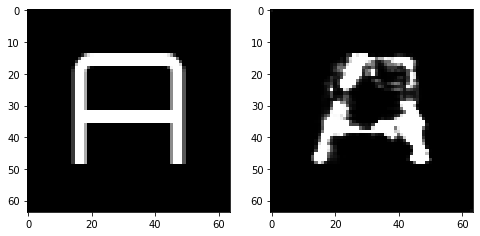

Epoch 112, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.691198106855154, Loss SSIM 2.2972453236579895, Loss Local 200.630446434021


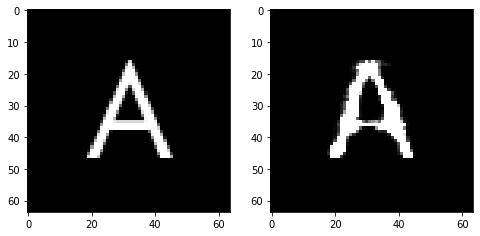

Epoch 112, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.604366134852171, Loss SSIM 2.1100475788116455, Loss Local 175.5731611251831


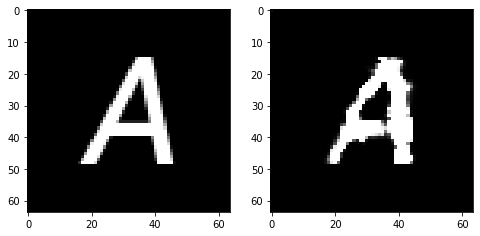

Epoch 112, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7002785615622997, Loss SSIM 2.3448460698127747, Loss Local 187.45871305465698


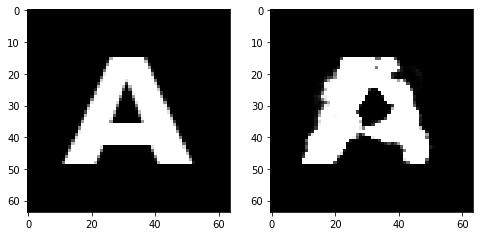

Epoch 112, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7053808756172657, Loss SSIM 2.337032973766327, Loss Local 201.39981317520142


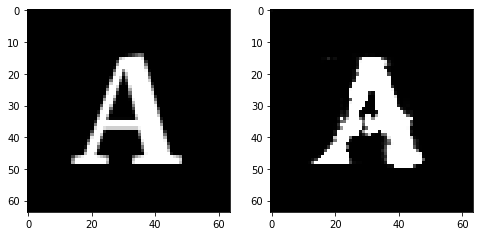

Epoch 112, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6376352533698082, Loss SSIM 2.2561817169189453, Loss Local 186.99908924102783


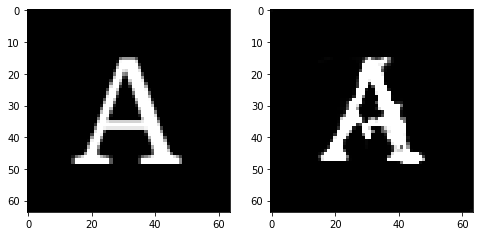

Epoch 112, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6757059916853905, Loss SSIM 2.261372447013855, Loss Local 194.21990394592285


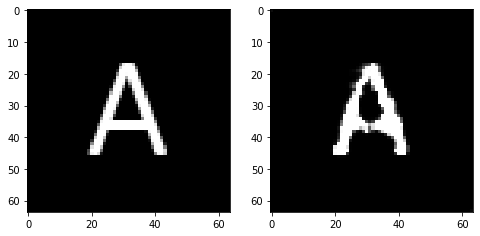

Epoch 113, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06228604167699814, Loss SSIM 0.08795821666717529, Loss Local 7.2021002769470215


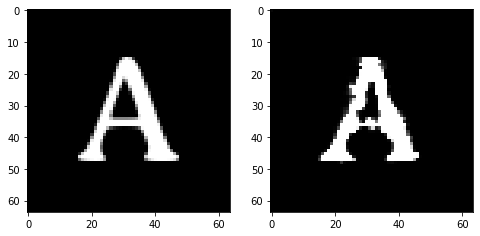

Epoch 113, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.648845225572586, Loss SSIM 2.225371837615967, Loss Local 185.1759181022644


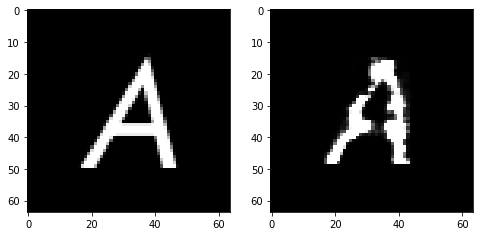

Epoch 113, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6797424219548702, Loss SSIM 2.246672570705414, Loss Local 188.22781133651733


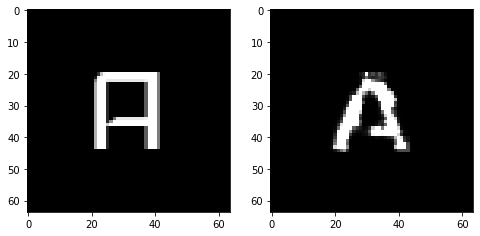

Epoch 113, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6324503384530544, Loss SSIM 2.2140398621559143, Loss Local 183.25457286834717


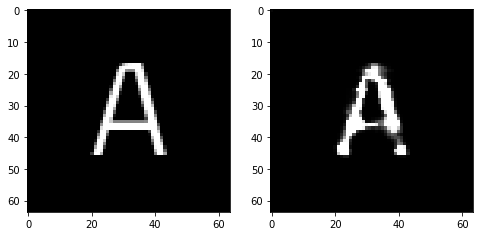

Epoch 113, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6859382390975952, Loss SSIM 2.330287754535675, Loss Local 191.11959981918335


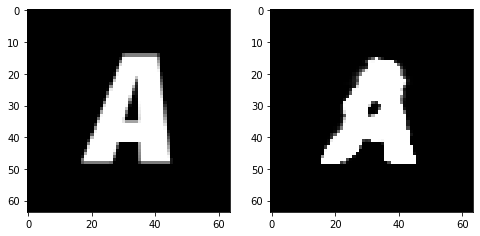

Epoch 113, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.633255235850811, Loss SSIM 2.2316386103630066, Loss Local 179.3799786567688


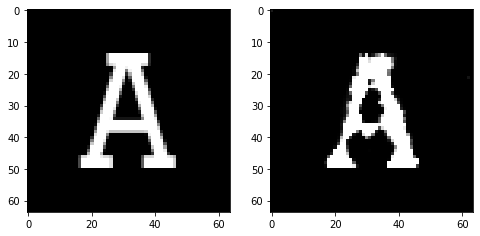

Epoch 113, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.609714962542057, Loss SSIM 2.1602516770362854, Loss Local 180.2573595046997


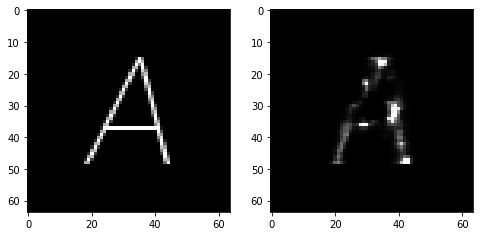

Epoch 113, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7124510519206524, Loss SSIM 2.331885278224945, Loss Local 195.20763492584229


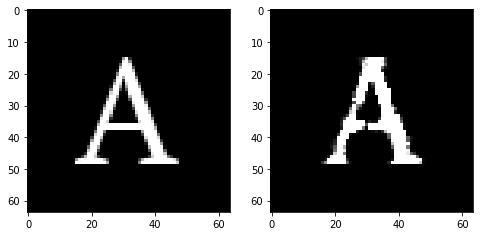

Epoch 114, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07869454473257065, Loss SSIM 0.10925817489624023, Loss Local 7.406074523925781


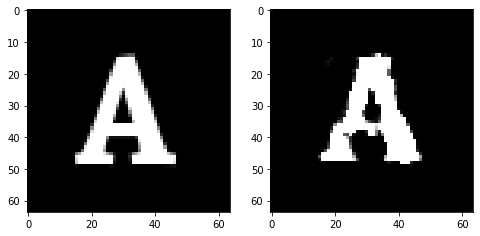

Epoch 114, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.689418189227581, Loss SSIM 2.2843567728996277, Loss Local 188.78600454330444


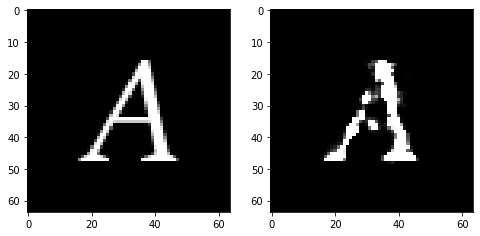

Epoch 114, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6893576756119728, Loss SSIM 2.2966915369033813, Loss Local 185.24919748306274


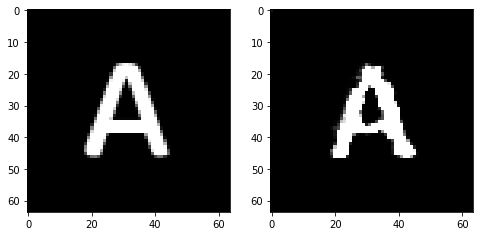

Epoch 114, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6298852637410164, Loss SSIM 2.2091087102890015, Loss Local 197.26996994018555


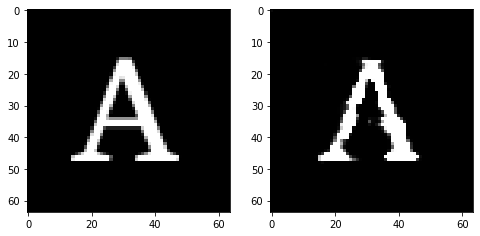

Epoch 114, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6562685184180737, Loss SSIM 2.2479556798934937, Loss Local 187.0739517211914


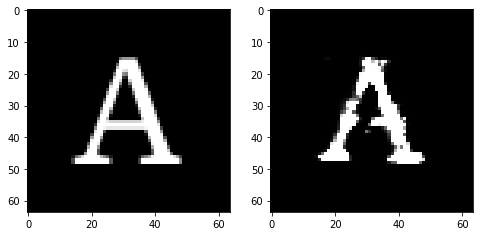

Epoch 114, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6327450349926949, Loss SSIM 2.220573604106903, Loss Local 178.61236190795898


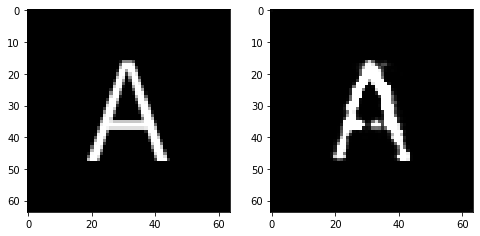

Epoch 114, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6688404567539692, Loss SSIM 2.2837905287742615, Loss Local 180.04917526245117


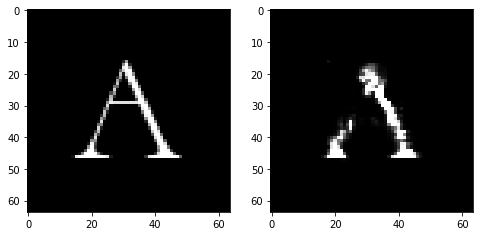

Epoch 114, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6668767109513283, Loss SSIM 2.2315319180488586, Loss Local 185.81752681732178


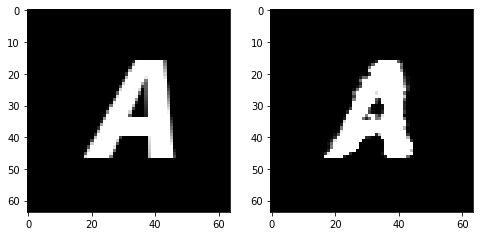

Epoch 115, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06593494862318039, Loss SSIM 0.09343880414962769, Loss Local 6.4913411140441895


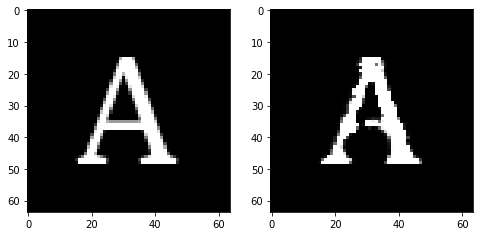

Epoch 115, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.693283099681139, Loss SSIM 2.2973127961158752, Loss Local 195.4823727607727


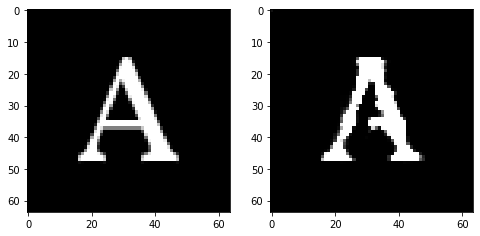

Epoch 115, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6694471463561058, Loss SSIM 2.2439040541648865, Loss Local 181.73363542556763


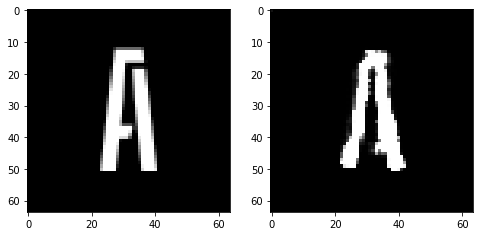

Epoch 115, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6611714139580727, Loss SSIM 2.2890655398368835, Loss Local 190.76308488845825


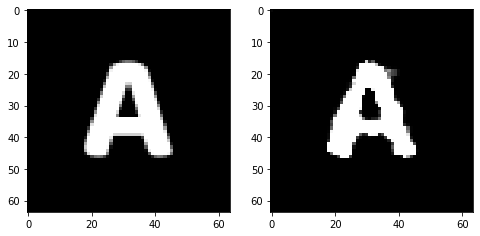

Epoch 115, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6552274376153946, Loss SSIM 2.211203157901764, Loss Local 187.34622430801392


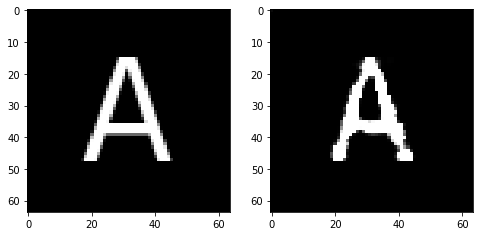

Epoch 115, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6958829835057259, Loss SSIM 2.335284948348999, Loss Local 189.87059688568115


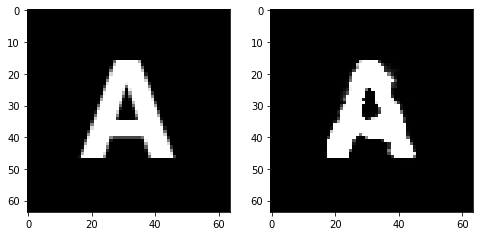

Epoch 115, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6511195562779903, Loss SSIM 2.268976628780365, Loss Local 186.6053342819214


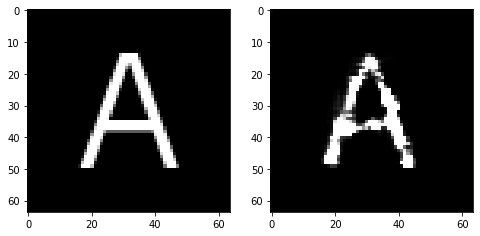

Epoch 115, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.633995946496725, Loss SSIM 2.187456727027893, Loss Local 188.3831763267517


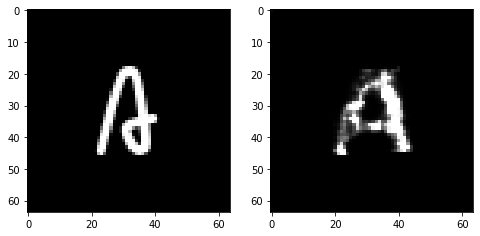

Epoch 116, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06710702180862427, Loss SSIM 0.09964567422866821, Loss Local 7.833773136138916


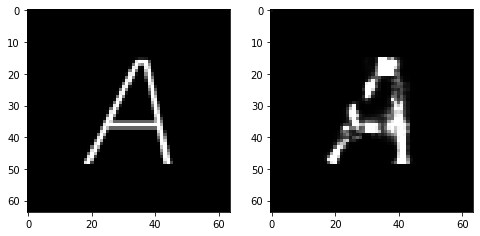

Epoch 116, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.61809441447258, Loss SSIM 2.2095903754234314, Loss Local 182.49801921844482


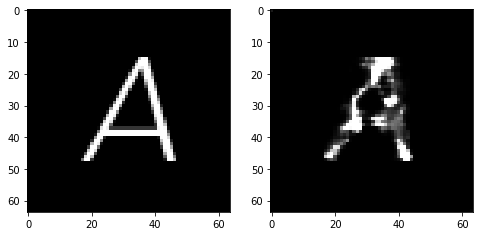

Epoch 116, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7567711509764194, Loss SSIM 2.4230290055274963, Loss Local 191.9318723678589


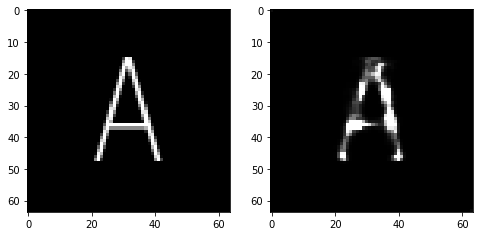

Epoch 116, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.642348937690258, Loss SSIM 2.1909597516059875, Loss Local 182.60124492645264


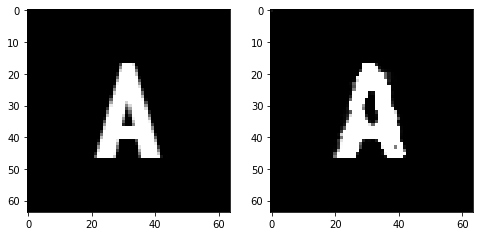

Epoch 116, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6555260866880417, Loss SSIM 2.216404616832733, Loss Local 180.08783864974976


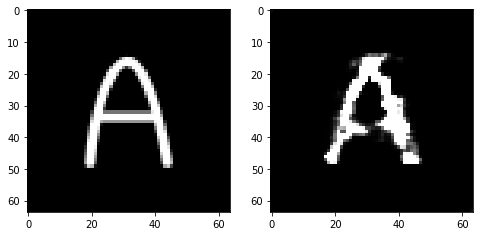

Epoch 116, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6676702797412872, Loss SSIM 2.262627065181732, Loss Local 194.51439142227173


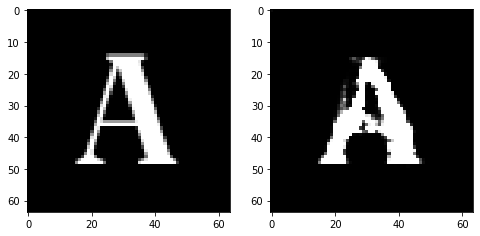

Epoch 116, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6021003238856792, Loss SSIM 2.1964211463928223, Loss Local 176.02332019805908


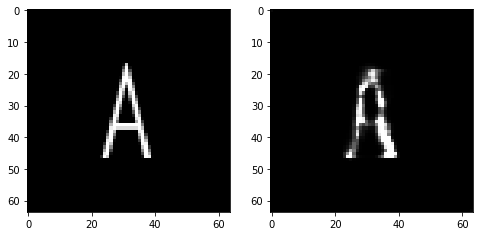

Epoch 116, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7367864176630974, Loss SSIM 2.3838623762130737, Loss Local 188.41216897964478


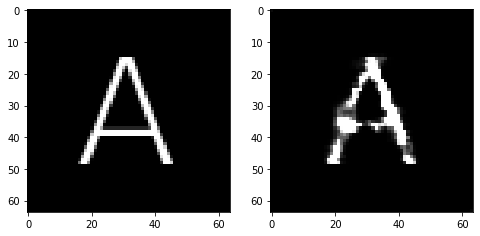

Epoch 117, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06145869195461273, Loss SSIM 0.08417785167694092, Loss Local 6.770483016967773


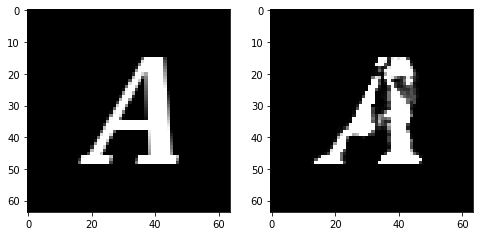

Epoch 117, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6689592227339745, Loss SSIM 2.2420902252197266, Loss Local 183.50122690200806


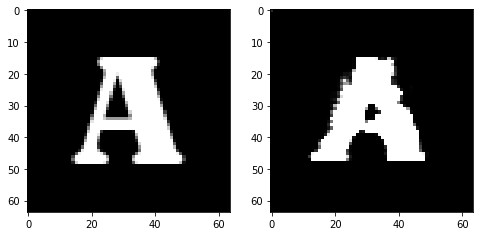

Epoch 117, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7009783312678337, Loss SSIM 2.317809522151947, Loss Local 191.087730884552


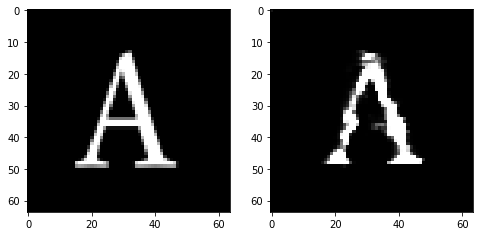

Epoch 117, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6365863345563412, Loss SSIM 2.2168168425559998, Loss Local 179.44293689727783


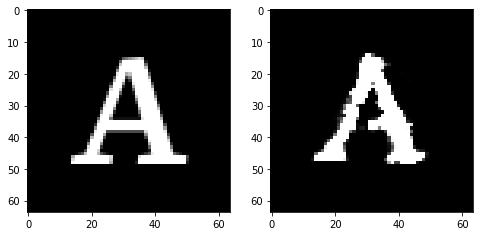

Epoch 117, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6674687303602695, Loss SSIM 2.279047667980194, Loss Local 189.03683948516846


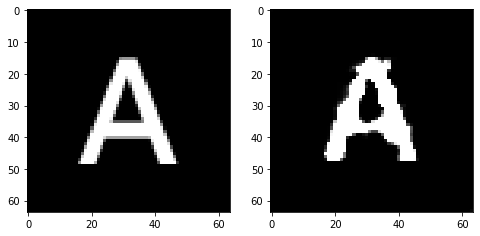

Epoch 117, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.676566444337368, Loss SSIM 2.2795926332473755, Loss Local 194.78557062149048


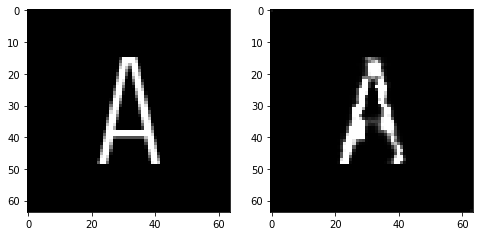

Epoch 117, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5819503404200077, Loss SSIM 2.1133642196655273, Loss Local 177.07516622543335


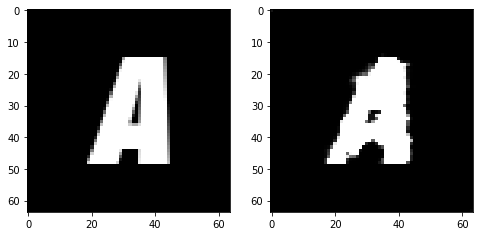

Epoch 117, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6932423487305641, Loss SSIM 2.3133004903793335, Loss Local 195.05407047271729


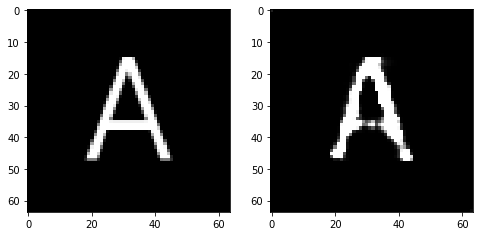

Epoch 118, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06546473503112793, Loss SSIM 0.09094822406768799, Loss Local 6.675419807434082


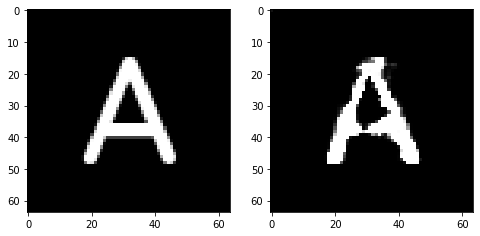

Epoch 118, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6530355773866177, Loss SSIM 2.2389185428619385, Loss Local 185.78142023086548


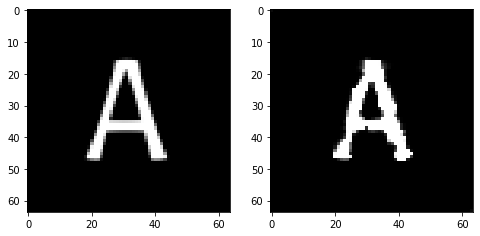

Epoch 118, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.633896131068468, Loss SSIM 2.2122212648391724, Loss Local 189.0476541519165


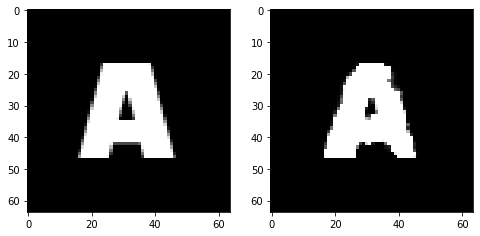

Epoch 118, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6992630176246166, Loss SSIM 2.325357973575592, Loss Local 188.23169422149658


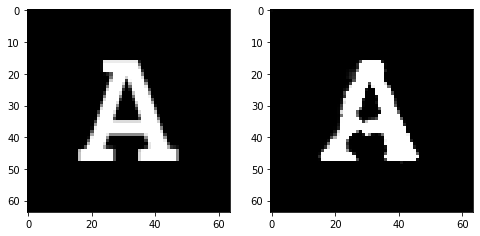

Epoch 118, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7336485013365746, Loss SSIM 2.4070282578468323, Loss Local 189.87791538238525


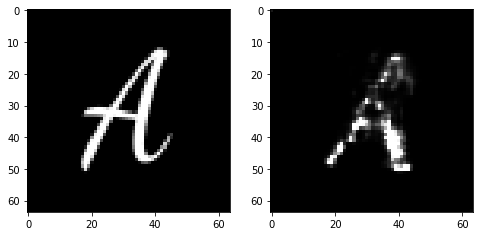

Epoch 118, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.640863686800003, Loss SSIM 2.1738452911376953, Loss Local 187.00187158584595


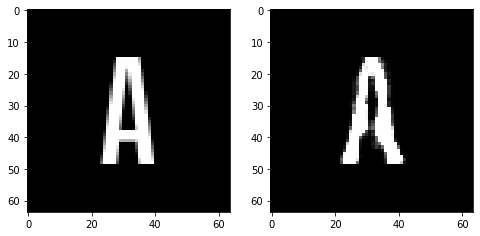

Epoch 118, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.668774213641882, Loss SSIM 2.267825126647949, Loss Local 184.11257362365723


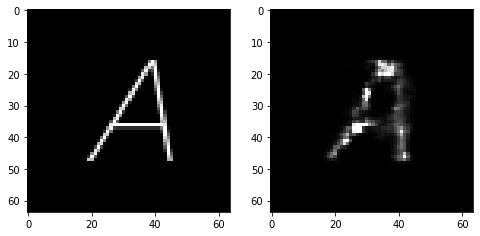

Epoch 118, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6264579817652702, Loss SSIM 2.221701502799988, Loss Local 185.91034078598022


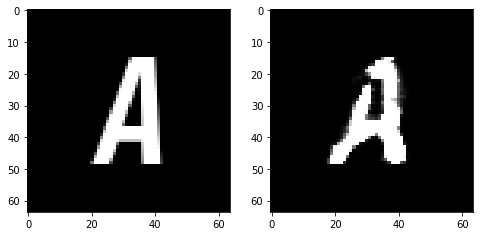

Epoch 119, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06643615663051605, Loss SSIM 0.10341536998748779, Loss Local 8.07687759399414


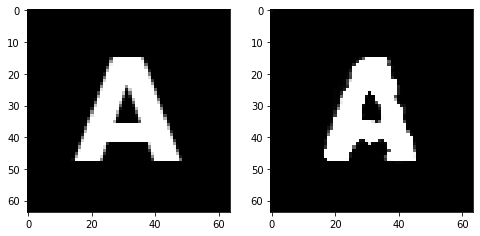

Epoch 119, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6303166151046753, Loss SSIM 2.2077894806861877, Loss Local 182.54205656051636


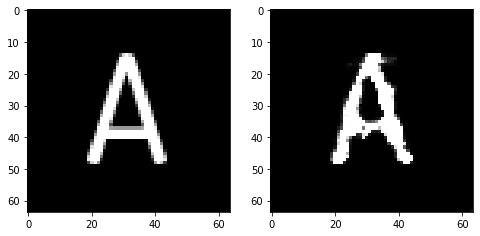

Epoch 119, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7102174572646618, Loss SSIM 2.3497418761253357, Loss Local 191.84181928634644
Epoch 121, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6681855656206608, Loss SSIM 2.2617071866989136, Loss Local 196.78225708007812


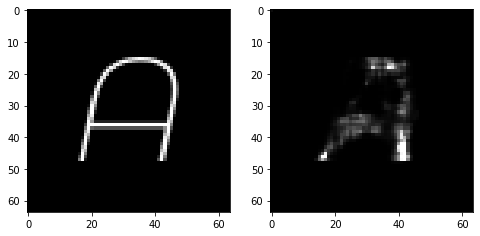

Epoch 121, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.678881824016571, Loss SSIM 2.2736185789108276, Loss Local 180.18821477890015


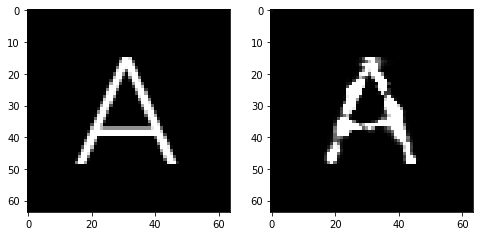

Epoch 121, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6546807438135147, Loss SSIM 2.244270145893097, Loss Local 187.09756517410278


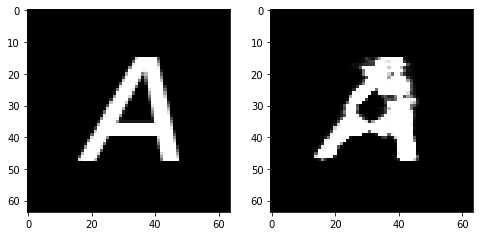

Epoch 121, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6737546399235725, Loss SSIM 2.2707250714302063, Loss Local 181.8706545829773


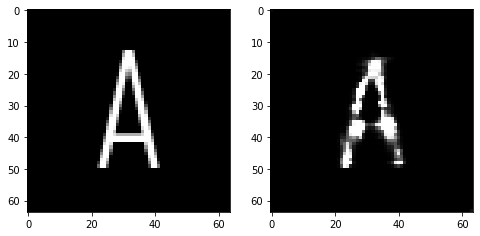

Epoch 121, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6700637266039848, Loss SSIM 2.2808069586753845, Loss Local 192.54219913482666


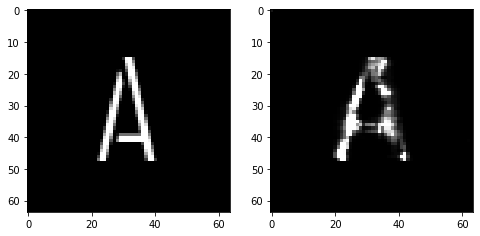

Epoch 122, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06425206363201141, Loss SSIM 0.09410923719406128, Loss Local 5.8316426277160645


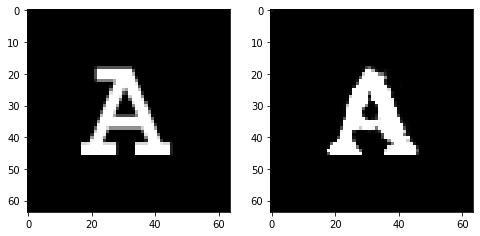

Epoch 122, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.61715816706419, Loss SSIM 2.2011412978172302, Loss Local 174.23444938659668


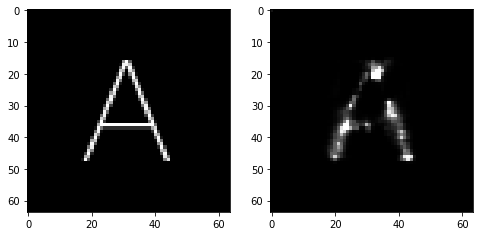

Epoch 122, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.632785338908434, Loss SSIM 2.172679841518402, Loss Local 181.31259775161743


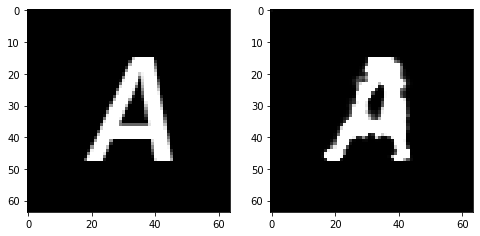

Epoch 122, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6754713542759418, Loss SSIM 2.2727996110916138, Loss Local 190.52773332595825


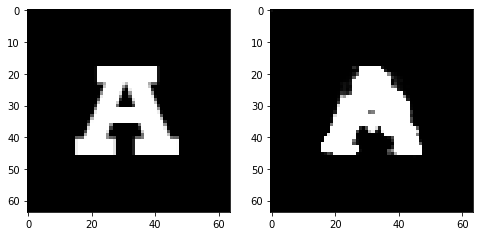

Epoch 122, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6774461828172207, Loss SSIM 2.3202924728393555, Loss Local 192.91296672821045


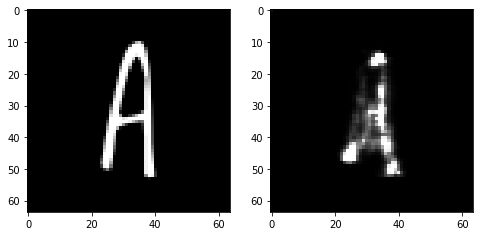

Epoch 122, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.728776291012764, Loss SSIM 2.344029188156128, Loss Local 198.17254257202148


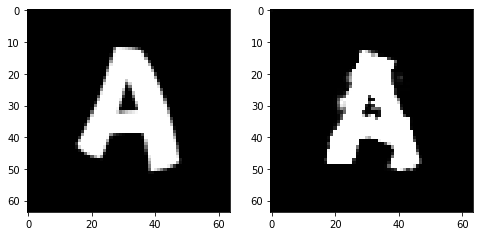

Epoch 122, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6563270911574364, Loss SSIM 2.282140552997589, Loss Local 193.63112545013428


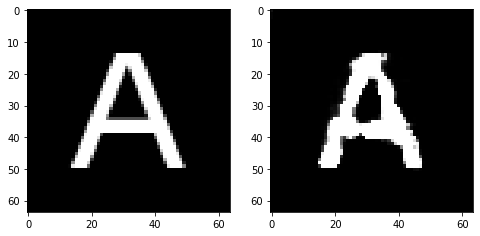

Epoch 122, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6486462727189064, Loss SSIM 2.2380163073539734, Loss Local 180.5218939781189


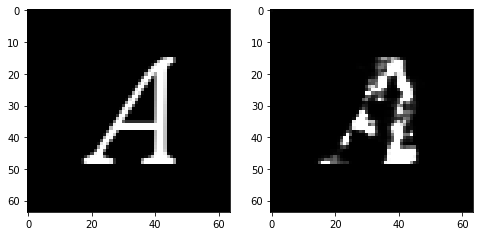

Epoch 123, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06913827359676361, Loss SSIM 0.09786766767501831, Loss Local 7.549313545227051


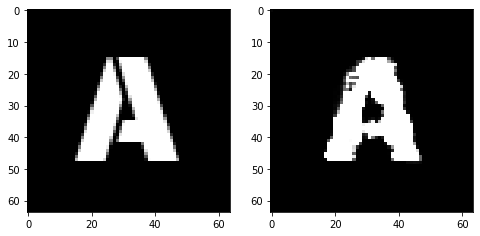

Epoch 123, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.656875405460596, Loss SSIM 2.2422845363616943, Loss Local 177.73131704330444


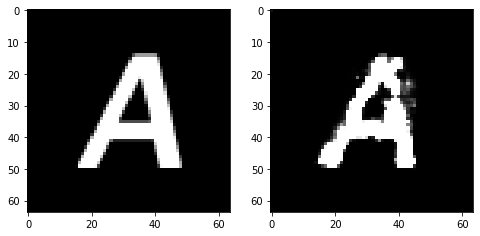

Epoch 123, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6892321966588497, Loss SSIM 2.3244621753692627, Loss Local 195.8131766319275


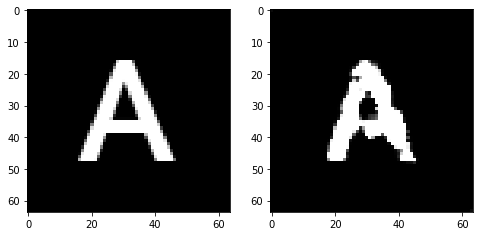

Epoch 123, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6946791224181652, Loss SSIM 2.3513736724853516, Loss Local 195.86098861694336


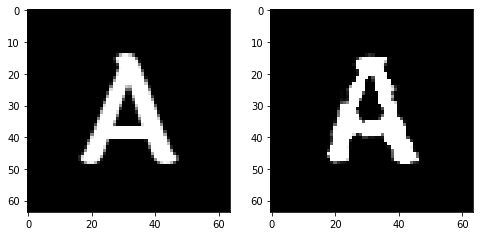

Epoch 123, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6427861861884594, Loss SSIM 2.2526509761810303, Loss Local 186.8090786933899


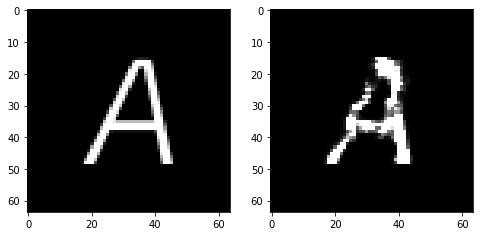

Epoch 123, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5999065600335598, Loss SSIM 2.166933596134186, Loss Local 179.8026237487793


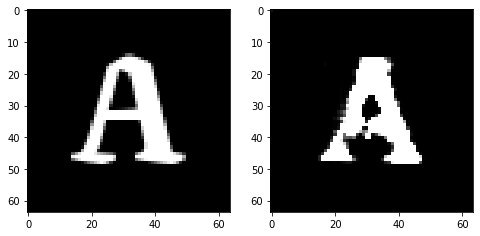

Epoch 123, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.618308674544096, Loss SSIM 2.1382782459259033, Loss Local 174.4002559185028


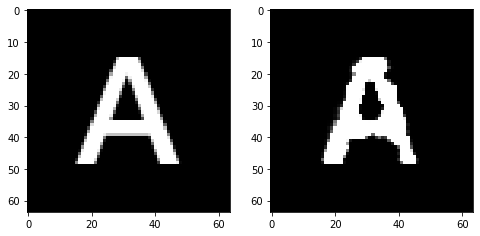

Epoch 123, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.691424872726202, Loss SSIM 2.2714205980300903, Loss Local 186.42246532440186


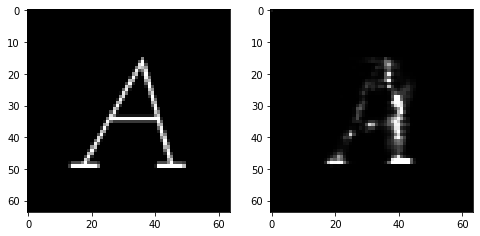

Epoch 124, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07144900411367416, Loss SSIM 0.10567164421081543, Loss Local 8.244674682617188


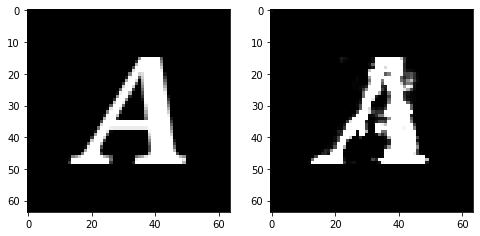

Epoch 124, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.666115403175354, Loss SSIM 2.223152816295624, Loss Local 187.4328203201294


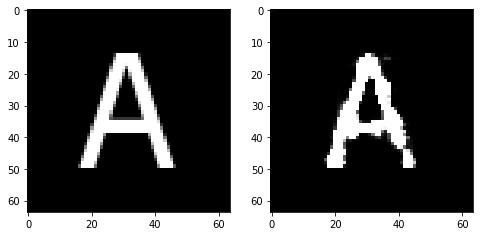

Epoch 124, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6965689286589622, Loss SSIM 2.2918190956115723, Loss Local 192.9616551399231


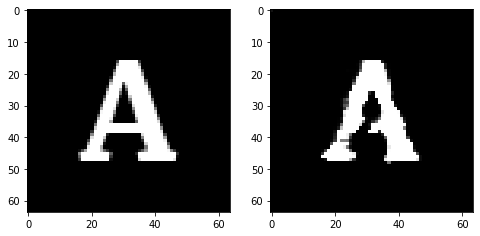

Epoch 124, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6460941135883331, Loss SSIM 2.1958060264587402, Loss Local 184.1908164024353


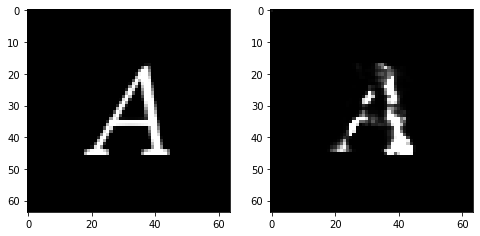

Epoch 124, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7029023207724094, Loss SSIM 2.373402953147888, Loss Local 193.07209587097168


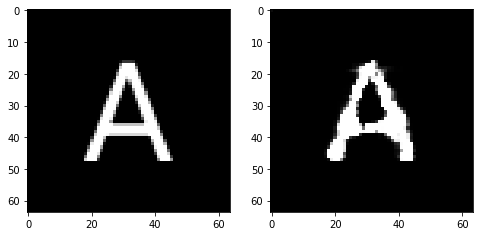

Epoch 124, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6404251120984554, Loss SSIM 2.241942882537842, Loss Local 173.36667776107788


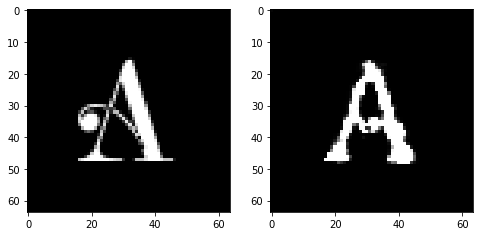

Epoch 124, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.637087695300579, Loss SSIM 2.2003015279769897, Loss Local 182.87989735603333


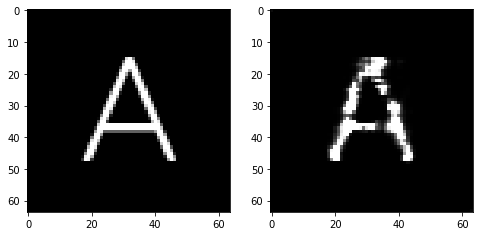

Epoch 124, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6259793676435947, Loss SSIM 2.214631199836731, Loss Local 190.51937580108643


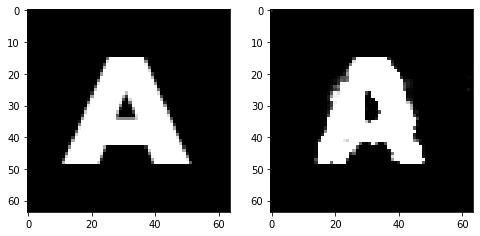

Epoch 125, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08006809651851654, Loss SSIM 0.11561024188995361, Loss Local 8.502900123596191


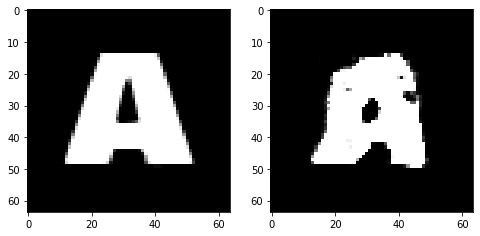

Epoch 125, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.684478059411049, Loss SSIM 2.2998493909835815, Loss Local 191.5966215133667


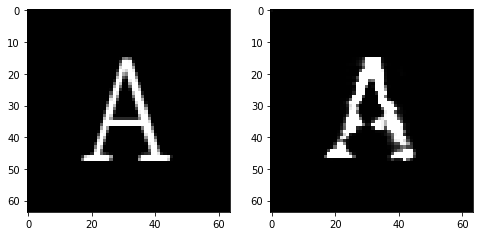

Epoch 125, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7025253176689148, Loss SSIM 2.3572880029678345, Loss Local 195.1264705657959


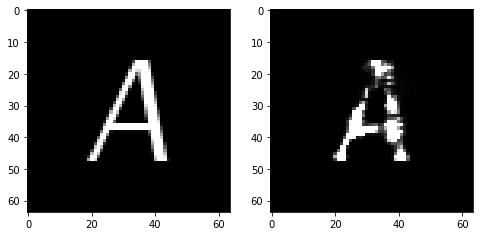

Epoch 125, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6404260769486427, Loss SSIM 2.225661337375641, Loss Local 191.09315586090088


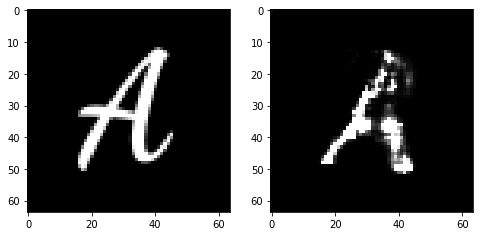

Epoch 125, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7052551209926605, Loss SSIM 2.411922037601471, Loss Local 170.40407180786133


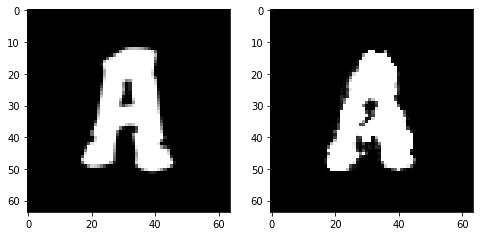

Epoch 125, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6430588774383068, Loss SSIM 2.1775298714637756, Loss Local 191.95866775512695


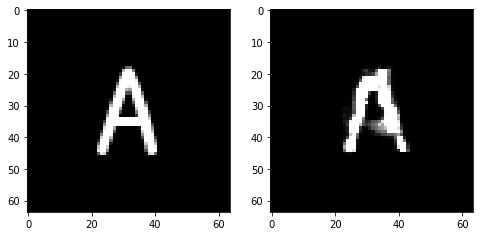

Epoch 125, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6501202769577503, Loss SSIM 2.181741416454315, Loss Local 175.39890575408936


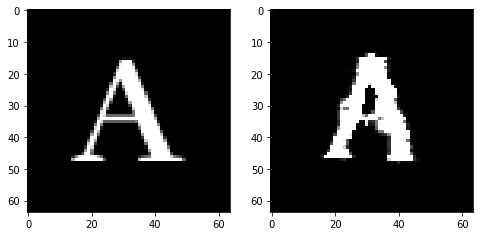

Epoch 125, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.655850112438202, Loss SSIM 2.2747182846069336, Loss Local 192.16196584701538


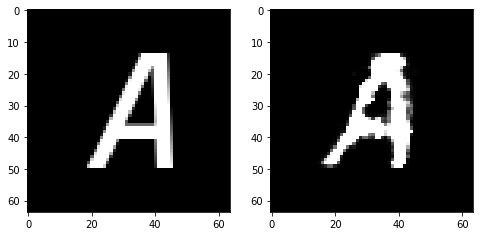

Epoch 126, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06489843130111694, Loss SSIM 0.1066548228263855, Loss Local 7.884167194366455


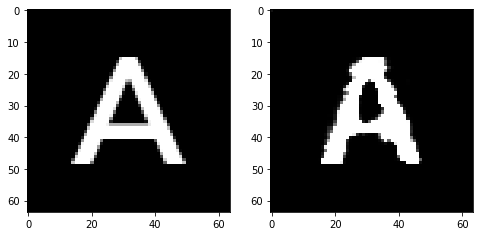

Epoch 126, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6423859857022762, Loss SSIM 2.1987245082855225, Loss Local 189.0189642906189


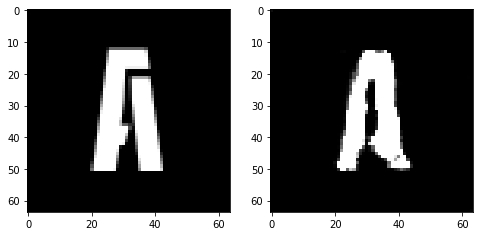

Epoch 126, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6909869834780693, Loss SSIM 2.336127758026123, Loss Local 190.72168397903442


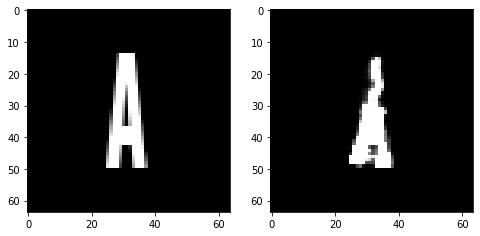

Epoch 126, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.703368827700615, Loss SSIM 2.355548083782196, Loss Local 188.42034339904785


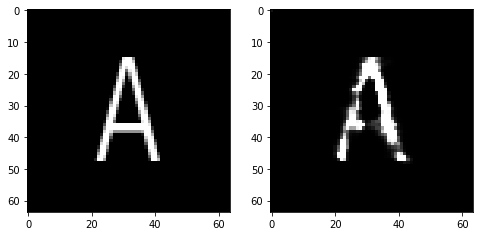

Epoch 126, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6413946449756622, Loss SSIM 2.237678289413452, Loss Local 190.1071138381958


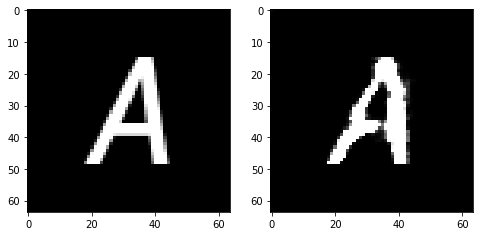

Epoch 126, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6247955076396465, Loss SSIM 2.212467670440674, Loss Local 180.51897048950195


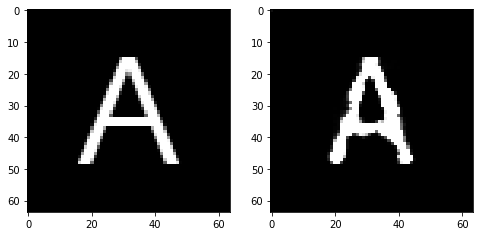

Epoch 126, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6845801211893559, Loss SSIM 2.226105272769928, Loss Local 188.53580570220947


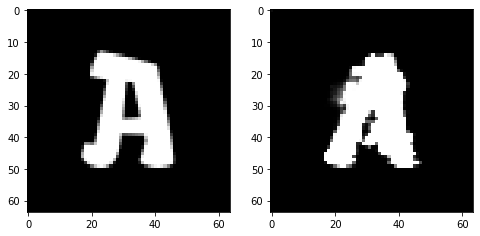

Epoch 126, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.644655879586935, Loss SSIM 2.229769766330719, Loss Local 183.97230315208435


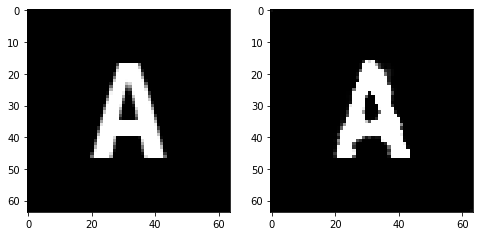

Epoch 127, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06411740183830261, Loss SSIM 0.07777255773544312, Loss Local 6.677671909332275


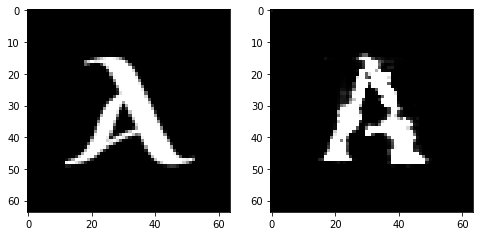

Epoch 127, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6910377256572247, Loss SSIM 2.262423872947693, Loss Local 194.9351134300232


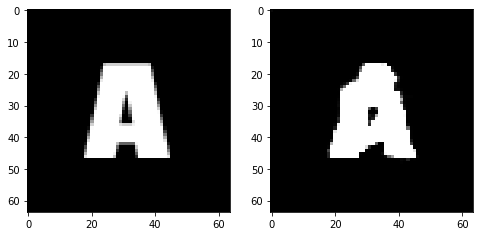

Epoch 127, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7010226137936115, Loss SSIM 2.2469807863235474, Loss Local 187.81378364562988


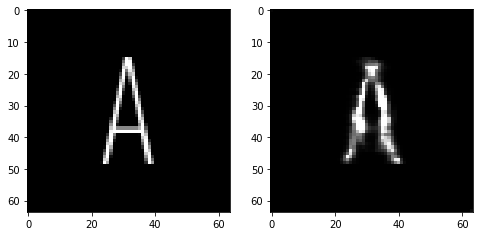

Epoch 127, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6121510341763496, Loss SSIM 2.1798049211502075, Loss Local 177.9911413192749


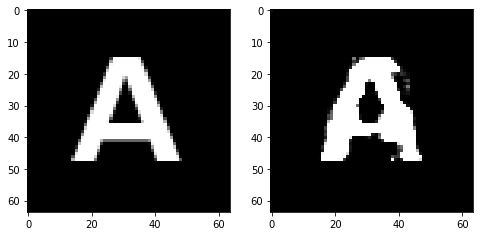

Epoch 127, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6992712654173374, Loss SSIM 2.377622067928314, Loss Local 192.30375051498413


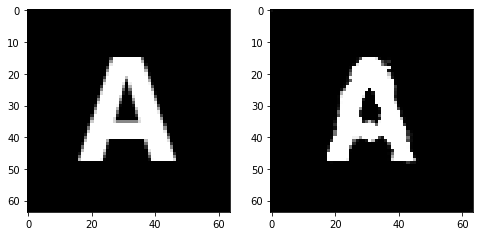

Epoch 127, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6489207111299038, Loss SSIM 2.3095534443855286, Loss Local 184.57973670959473


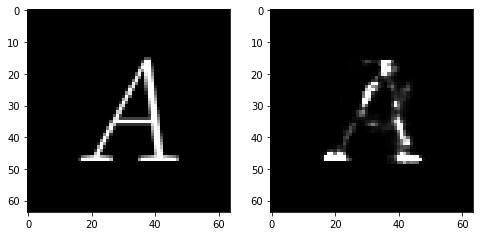

Epoch 127, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6531063579022884, Loss SSIM 2.1848214864730835, Loss Local 195.85607051849365


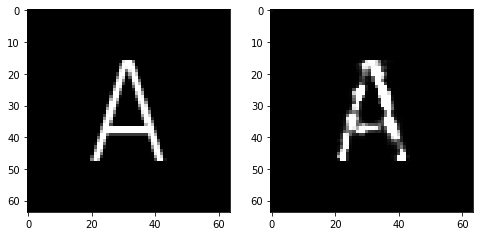

Epoch 127, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.630870208144188, Loss SSIM 2.262703061103821, Loss Local 177.51322221755981


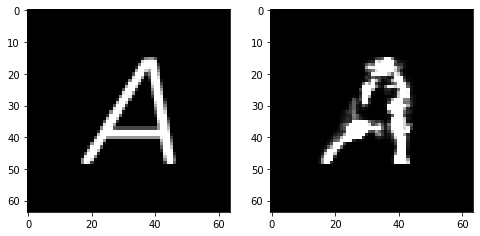

Epoch 128, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0641677975654602, Loss SSIM 0.08784759044647217, Loss Local 6.826336860656738


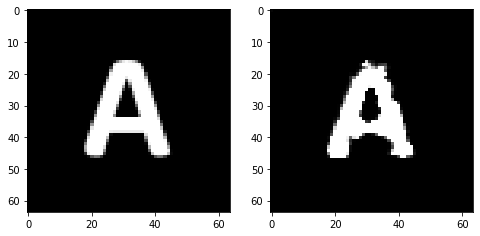

Epoch 128, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6529976949095726, Loss SSIM 2.2560155391693115, Loss Local 181.53121709823608


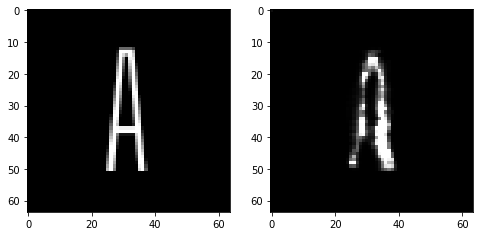

Epoch 128, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.66121356934309, Loss SSIM 2.2552592754364014, Loss Local 171.2904758453369


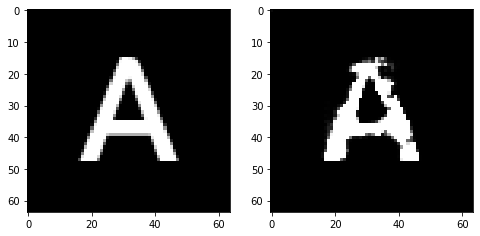

Epoch 128, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6844255588948727, Loss SSIM 2.2327054738998413, Loss Local 179.9703221321106


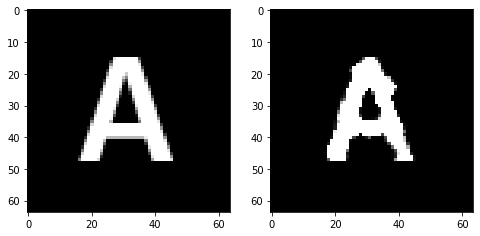

Epoch 128, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6822274215519428, Loss SSIM 2.3217230439186096, Loss Local 191.027428150177


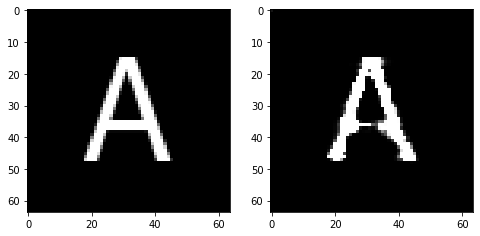

Epoch 128, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6952286511659622, Loss SSIM 2.284203052520752, Loss Local 190.39705801010132


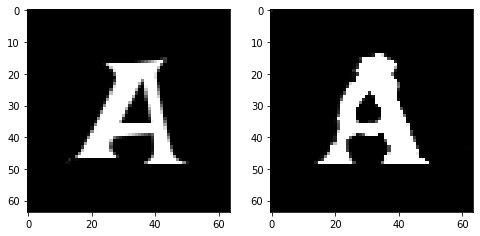

Epoch 128, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.638722363859415, Loss SSIM 2.24747234582901, Loss Local 181.28751277923584


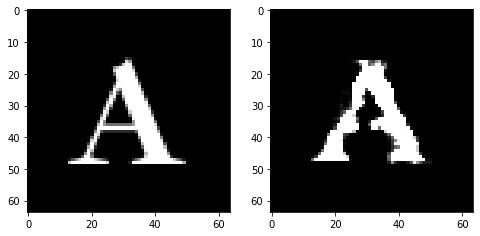

Epoch 128, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6141482926905155, Loss SSIM 2.1834384202957153, Loss Local 174.62296628952026


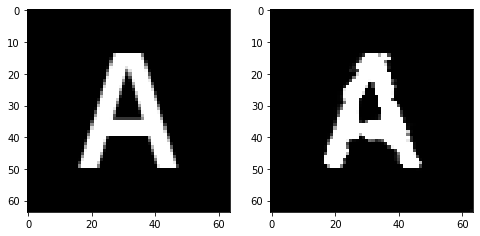

Epoch 129, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.061378009617328644, Loss SSIM 0.07658696174621582, Loss Local 7.763905048370361


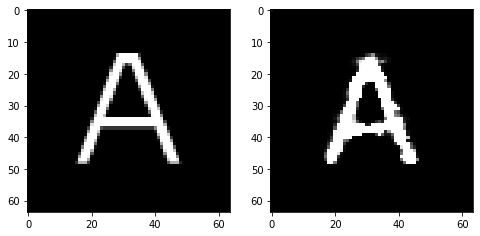

Epoch 129, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6451242305338383, Loss SSIM 2.224332809448242, Loss Local 182.9758267402649


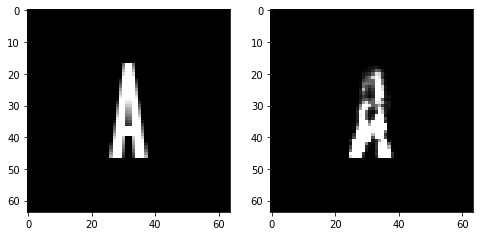

Epoch 129, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7176424115896225, Loss SSIM 2.327242910861969, Loss Local 193.00743198394775


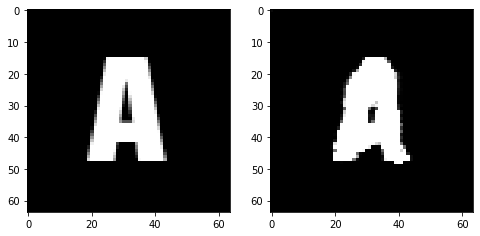

Epoch 129, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6698004864156246, Loss SSIM 2.272256314754486, Loss Local 190.08001136779785


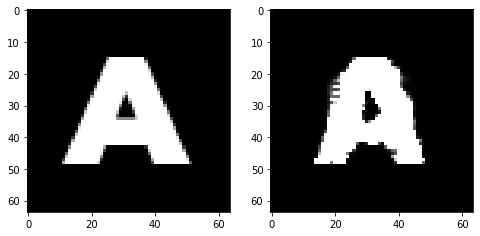

Epoch 129, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6686489842832088, Loss SSIM 2.277965724468231, Loss Local 187.1770977973938


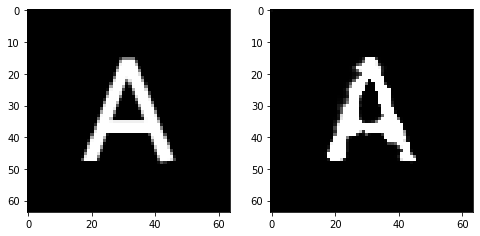

Epoch 129, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6273026429116726, Loss SSIM 2.1949305534362793, Loss Local 180.69064474105835


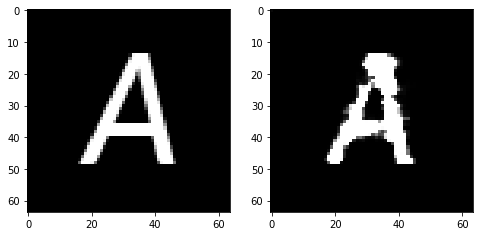

Epoch 129, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6378314979374409, Loss SSIM 2.2280161380767822, Loss Local 187.08159637451172


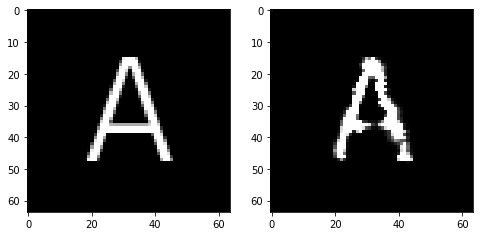

Epoch 129, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.717430293560028, Loss SSIM 2.3682251572608948, Loss Local 187.03868293762207


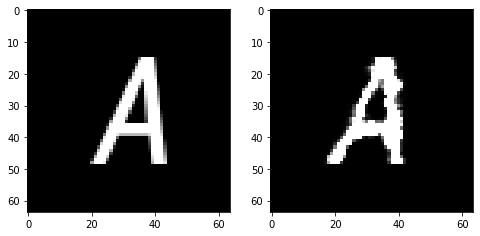

Epoch 130, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07663921266794205, Loss SSIM 0.10585421323776245, Loss Local 7.318483352661133


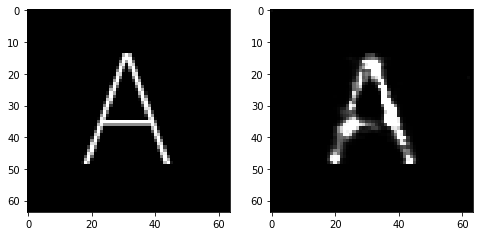

Epoch 130, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6506509594619274, Loss SSIM 2.27824604511261, Loss Local 184.843900680542


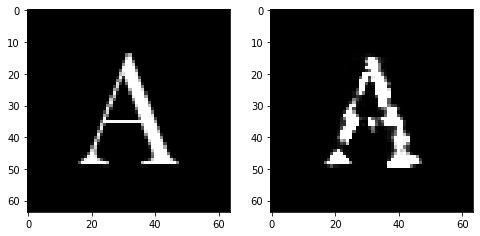

Epoch 130, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6303247809410095, Loss SSIM 2.2350544333457947, Loss Local 180.91837406158447


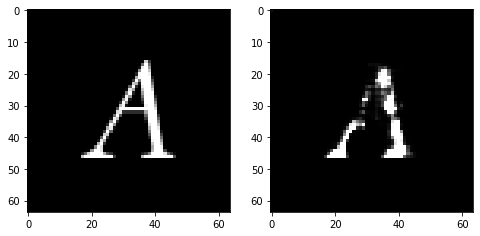

Epoch 130, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.646180186420679, Loss SSIM 2.240619957447052, Loss Local 174.58447551727295


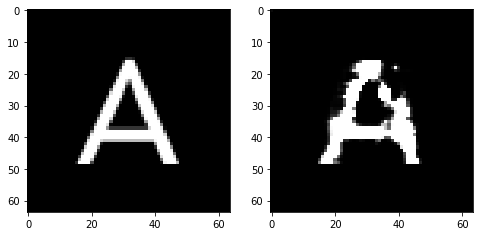

Epoch 130, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6785345152020454, Loss SSIM 2.2473426461219788, Loss Local 186.10793352127075


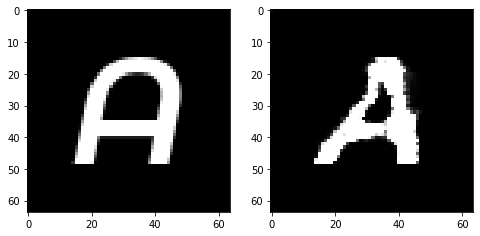

Epoch 130, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6178914979100227, Loss SSIM 2.2189269065856934, Loss Local 189.78406238555908


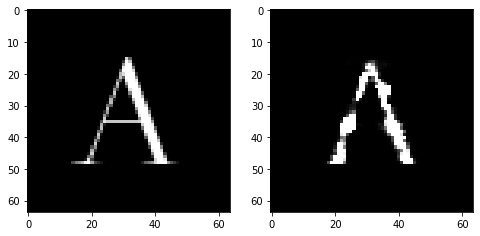

Epoch 130, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.703380860388279, Loss SSIM 2.294041872024536, Loss Local 197.1182780265808


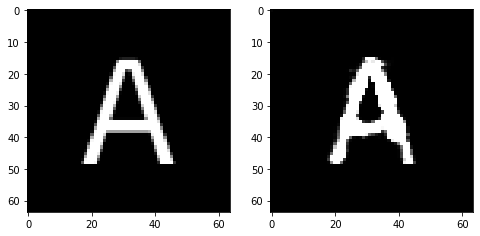

Epoch 130, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6548261642456055, Loss SSIM 2.198731303215027, Loss Local 185.97654104232788


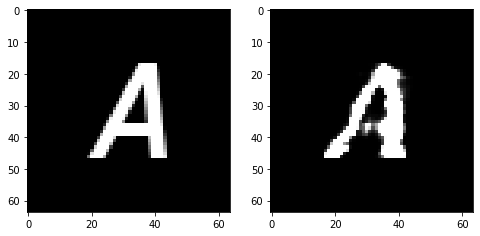

Epoch 131, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06120714172720909, Loss SSIM 0.10448533296585083, Loss Local 8.049898147583008


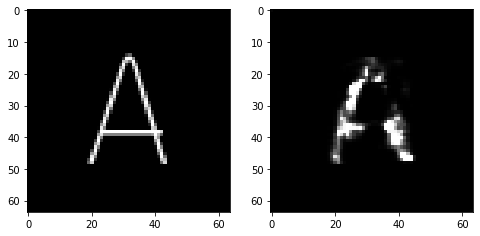

Epoch 131, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.59799724817276, Loss SSIM 2.1446016430854797, Loss Local 177.62358713150024


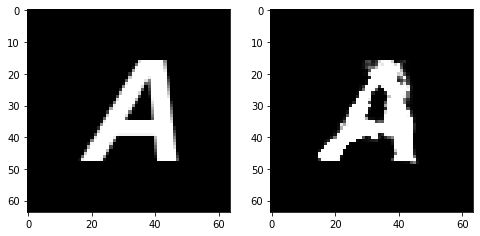

Epoch 131, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6654184125363827, Loss SSIM 2.2378244400024414, Loss Local 188.34184217453003


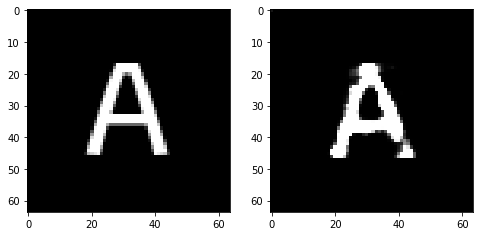

Epoch 131, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.668867077678442, Loss SSIM 2.28397798538208, Loss Local 189.12902069091797


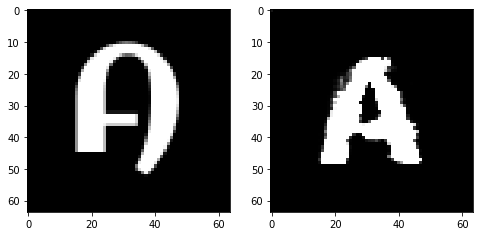

Epoch 131, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6527525819838047, Loss SSIM 2.259021759033203, Loss Local 193.35341691970825


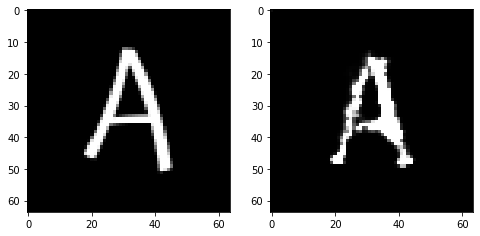

Epoch 131, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6710118912160397, Loss SSIM 2.300115168094635, Loss Local 185.21806621551514


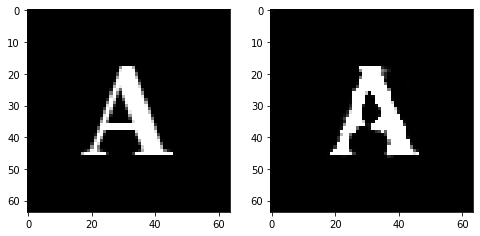

Epoch 131, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6675320155918598, Loss SSIM 2.211652934551239, Loss Local 191.4025912284851


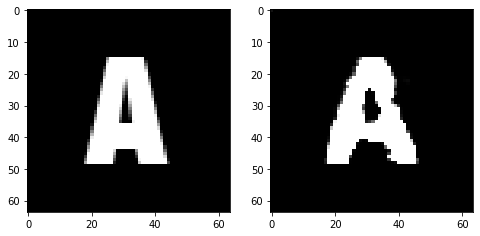

Epoch 131, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6909446232020855, Loss SSIM 2.306277096271515, Loss Local 188.84353685379028


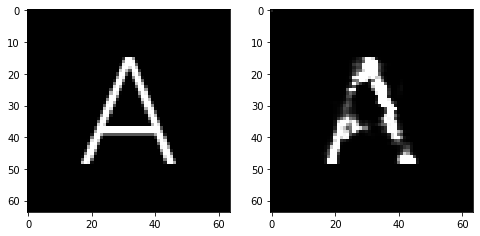

Epoch 132, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06564756482839584, Loss SSIM 0.08627480268478394, Loss Local 6.99314546585083


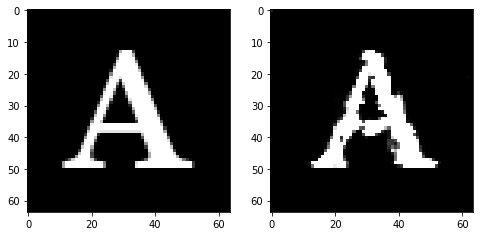

Epoch 132, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6555825360119343, Loss SSIM 2.271519362926483, Loss Local 189.83834409713745


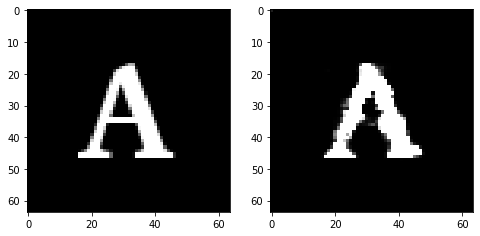

Epoch 132, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6092590317130089, Loss SSIM 2.2091116905212402, Loss Local 180.5482268333435


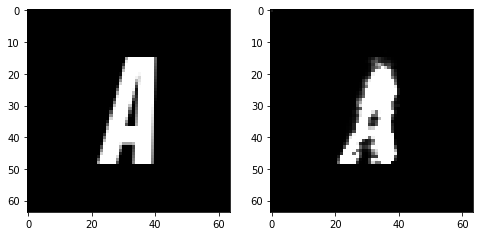

Epoch 132, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6514822356402874, Loss SSIM 2.2368996143341064, Loss Local 174.67701196670532


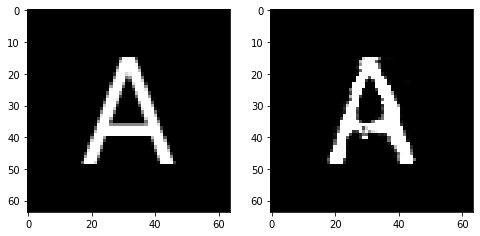

Epoch 132, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6583708338439465, Loss SSIM 2.255575716495514, Loss Local 184.8979206085205


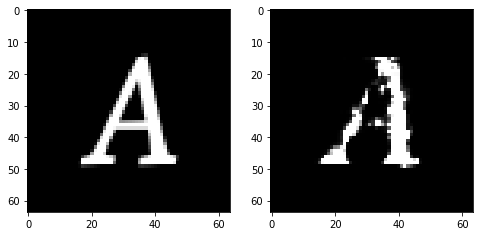

Epoch 132, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6756474375724792, Loss SSIM 2.2493743300437927, Loss Local 182.54653406143188


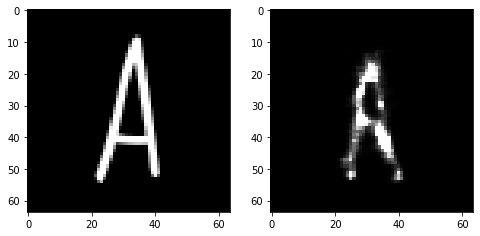

Epoch 132, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6606842689216137, Loss SSIM 2.230306923389435, Loss Local 193.68263483047485


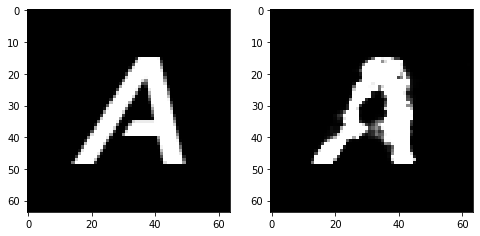

Epoch 132, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6751285009086132, Loss SSIM 2.2476927638053894, Loss Local 194.36798906326294


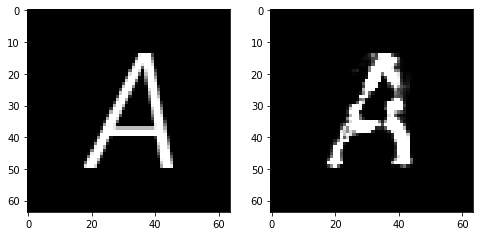

Epoch 133, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06967584043741226, Loss SSIM 0.08831286430358887, Loss Local 9.365625381469727


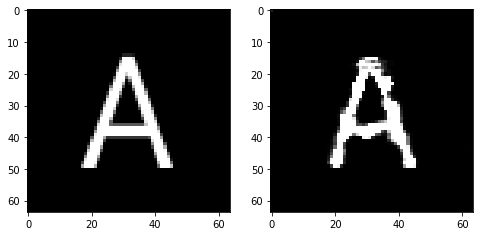

Epoch 133, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6479880139231682, Loss SSIM 2.256327211856842, Loss Local 173.55167531967163


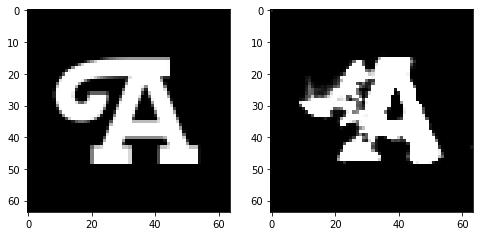

Epoch 133, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6054414324462414, Loss SSIM 2.1337169408798218, Loss Local 178.7060990333557


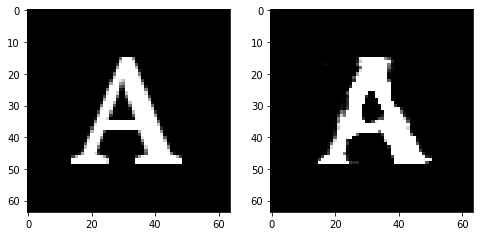

Epoch 133, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5976320691406727, Loss SSIM 2.1588823795318604, Loss Local 169.93892431259155


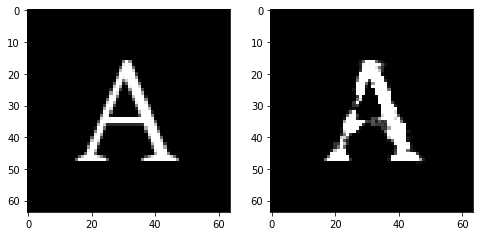

Epoch 133, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6997618861496449, Loss SSIM 2.299150824546814, Loss Local 198.39380550384521


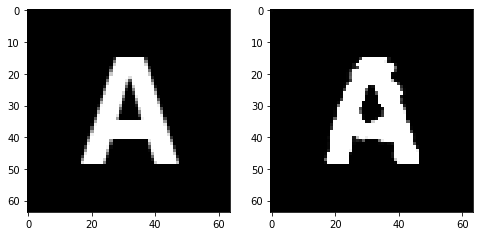

Epoch 133, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6549296416342258, Loss SSIM 2.2823482155799866, Loss Local 186.48730325698853


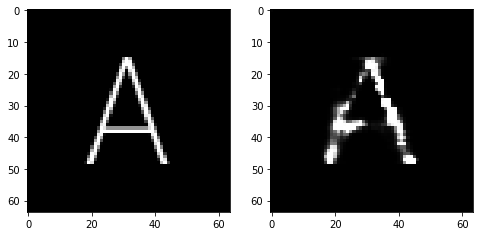

Epoch 133, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.695784255862236, Loss SSIM 2.326582372188568, Loss Local 187.16932153701782


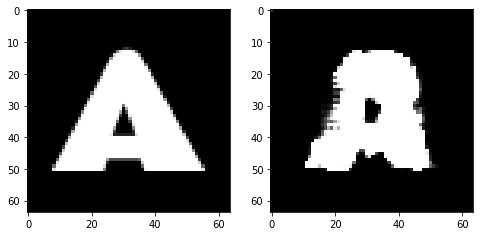

Epoch 133, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7134262323379517, Loss SSIM 2.3298391699790955, Loss Local 187.15852737426758


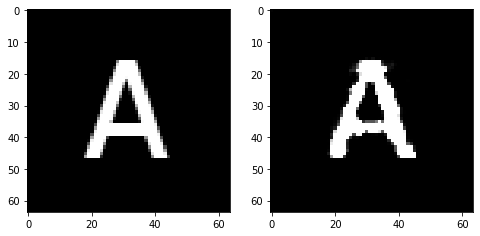

Epoch 134, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06438985466957092, Loss SSIM 0.08406871557235718, Loss Local 5.297836780548096


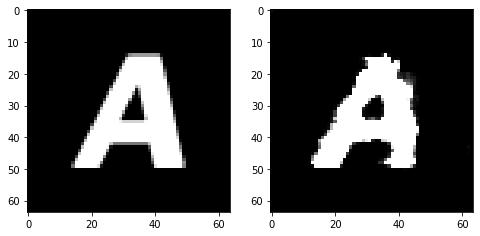

Epoch 134, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6642745919525623, Loss SSIM 2.206113874912262, Loss Local 186.99539184570312


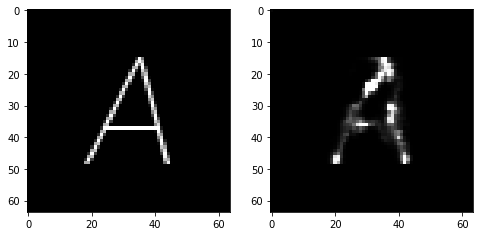

Epoch 134, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6536350883543491, Loss SSIM 2.2288686633110046, Loss Local 184.27505683898926


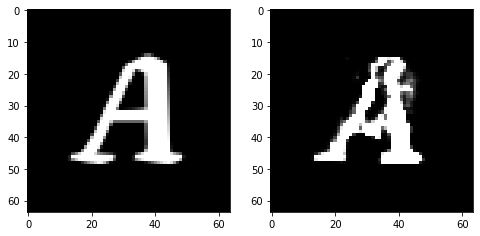

Epoch 134, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.648193120956421, Loss SSIM 2.299932599067688, Loss Local 193.48385190963745


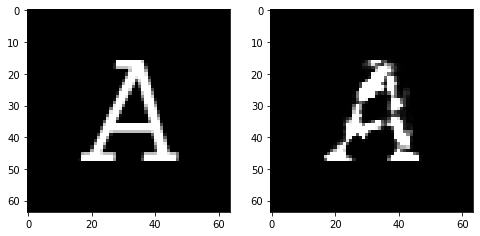

Epoch 134, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6805781982839108, Loss SSIM 2.3055975437164307, Loss Local 190.88642644882202


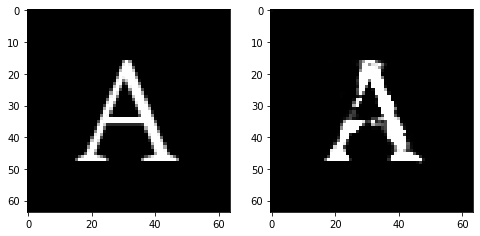

Epoch 134, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6823570281267166, Loss SSIM 2.3327518105506897, Loss Local 178.30317068099976


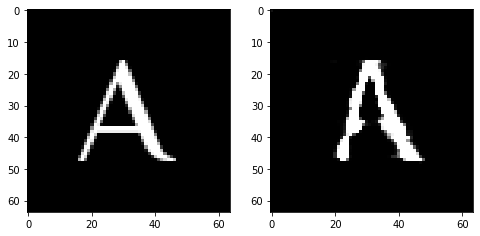

Epoch 134, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6349996626377106, Loss SSIM 2.2062439918518066, Loss Local 182.55517387390137


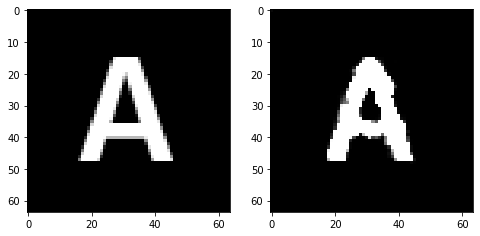

Epoch 134, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.622131373733282, Loss SSIM 2.1667017340660095, Loss Local 185.09752082824707


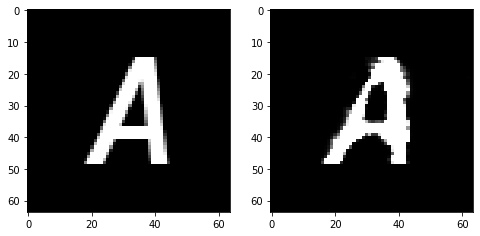

Epoch 135, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06663350015878677, Loss SSIM 0.08907133340835571, Loss Local 8.260110855102539


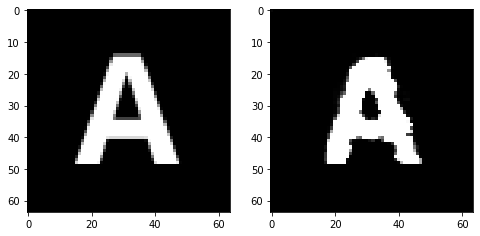

Epoch 135, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6992764472961426, Loss SSIM 2.308824896812439, Loss Local 184.1219220161438


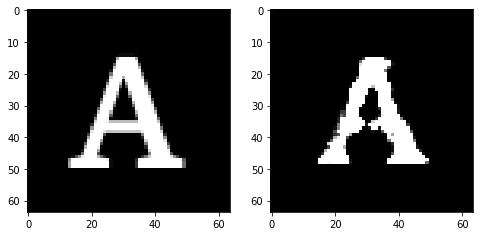

Epoch 135, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6366564221680164, Loss SSIM 2.203962504863739, Loss Local 187.04516696929932


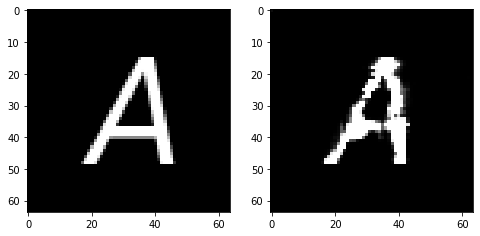

Epoch 135, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6504955254495144, Loss SSIM 2.2315505146980286, Loss Local 180.55678701400757


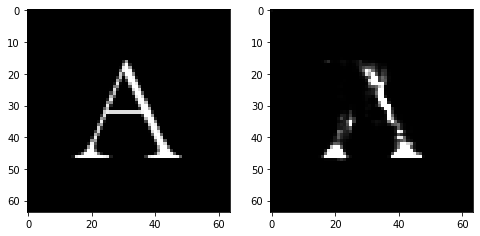

Epoch 135, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6514334678649902, Loss SSIM 2.2165711522102356, Loss Local 180.54610586166382


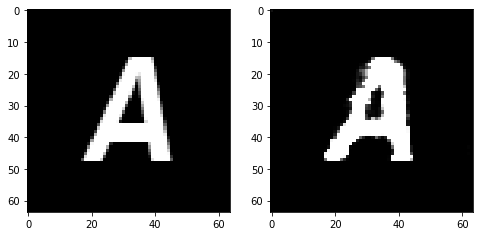

Epoch 135, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.645397674292326, Loss SSIM 2.231169581413269, Loss Local 186.9849591255188


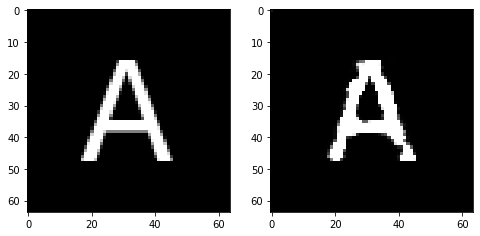

Epoch 135, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.623609121888876, Loss SSIM 2.20659476518631, Loss Local 184.83071184158325


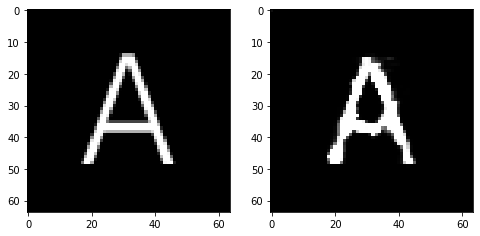

Epoch 135, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6696533001959324, Loss SSIM 2.3078516125679016, Loss Local 184.48684072494507


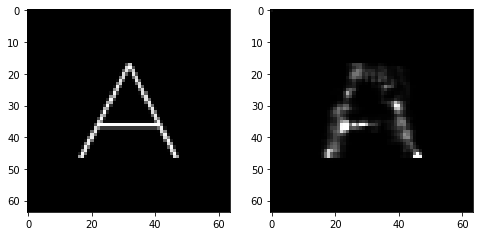

Epoch 136, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.057031650096178055, Loss SSIM 0.06733083724975586, Loss Local 5.960517406463623


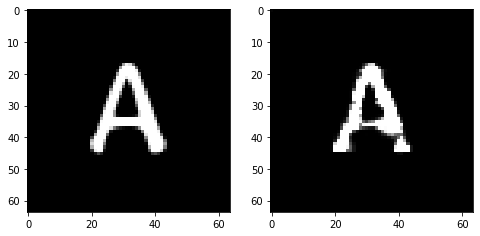

Epoch 136, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.658725343644619, Loss SSIM 2.233431339263916, Loss Local 187.4309902191162


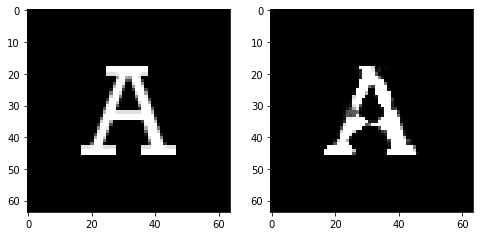

Epoch 136, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6521821320056915, Loss SSIM 2.2757957577705383, Loss Local 187.98448657989502


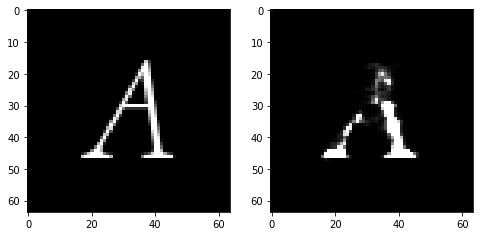

Epoch 136, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6777321510016918, Loss SSIM 2.2286673188209534, Loss Local 187.5661129951477


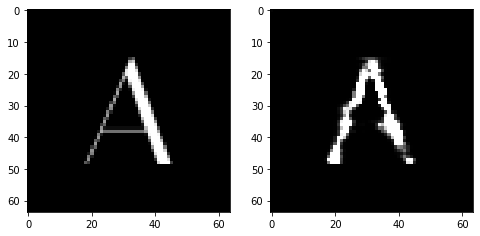

Epoch 136, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6228784173727036, Loss SSIM 2.186750829219818, Loss Local 177.19592809677124


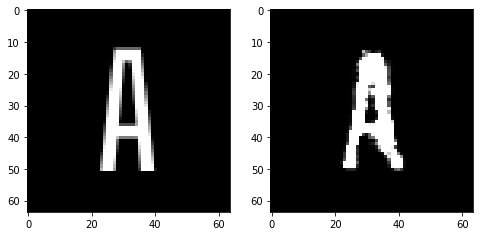

Epoch 136, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.682034607976675, Loss SSIM 2.287261128425598, Loss Local 183.5811095237732


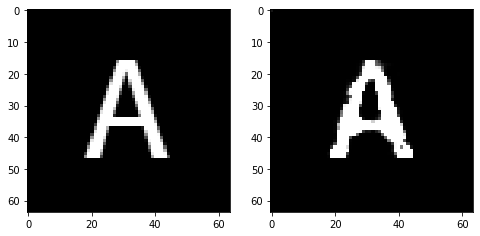

Epoch 136, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6100575625896454, Loss SSIM 2.195114314556122, Loss Local 186.06664896011353


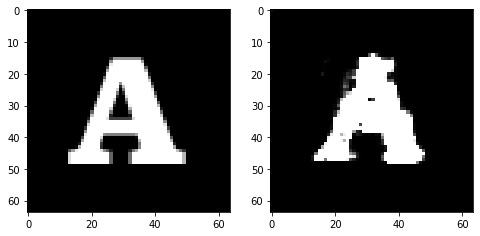

Epoch 136, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6723569445312023, Loss SSIM 2.2703306078910828, Loss Local 186.87779808044434


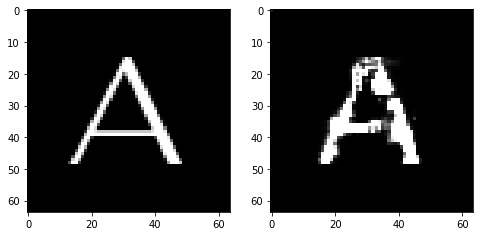

Epoch 137, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.055613692849874496, Loss SSIM 0.06844162940979004, Loss Local 6.666319370269775


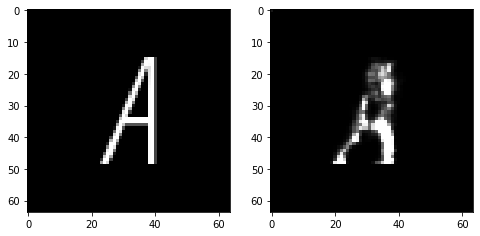

Epoch 137, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6918627321720123, Loss SSIM 2.3177061676979065, Loss Local 181.16053295135498


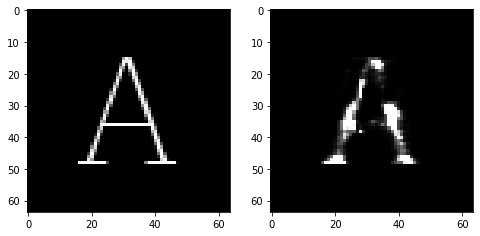

Epoch 137, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6552906781435013, Loss SSIM 2.240892469882965, Loss Local 190.45196390151978


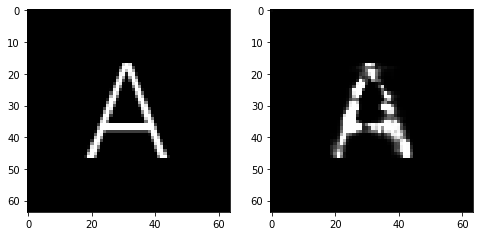

Epoch 137, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.640103805810213, Loss SSIM 2.2419814467430115, Loss Local 179.8334674835205


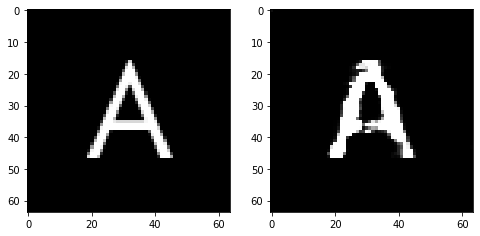

Epoch 137, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6802412532269955, Loss SSIM 2.3307175636291504, Loss Local 189.57008266448975


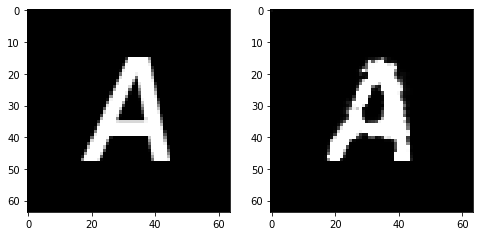

Epoch 137, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6333040669560432, Loss SSIM 2.171135127544403, Loss Local 173.1869773864746


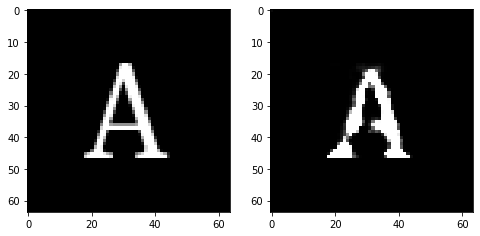

Epoch 137, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7039311528205872, Loss SSIM 2.2759878039360046, Loss Local 193.52201175689697


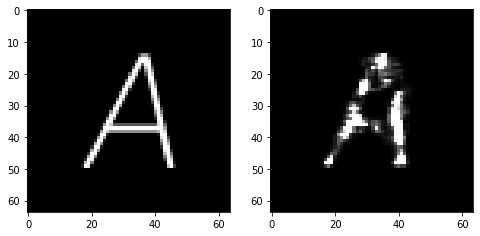

Epoch 137, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6064496226608753, Loss SSIM 2.1812163591384888, Loss Local 185.78888750076294


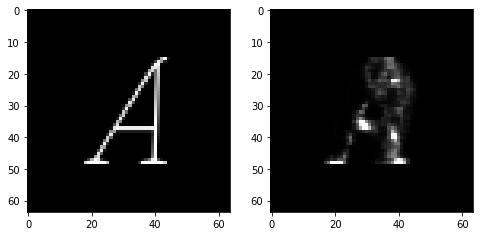

Epoch 138, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06834294646978378, Loss SSIM 0.09360778331756592, Loss Local 8.350001335144043


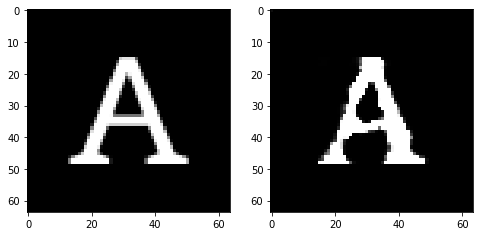

Epoch 138, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6969260722398758, Loss SSIM 2.282841444015503, Loss Local 194.5357584953308


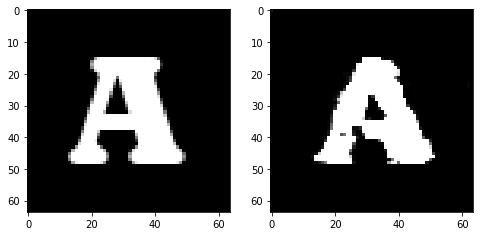

Epoch 138, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6684625931084156, Loss SSIM 2.2983384132385254, Loss Local 183.61929988861084


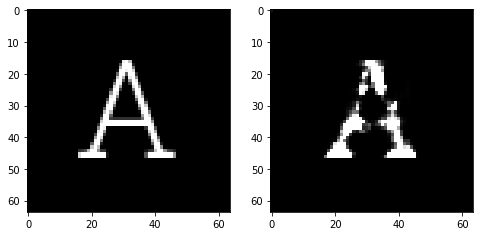

Epoch 138, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.647352583706379, Loss SSIM 2.2617095708847046, Loss Local 182.2466540336609


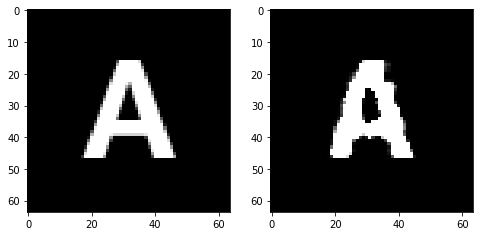

Epoch 138, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.675021667033434, Loss SSIM 2.2798728346824646, Loss Local 175.7325403690338


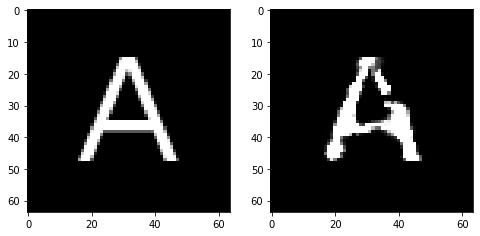

Epoch 138, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6419832780957222, Loss SSIM 2.224799633026123, Loss Local 188.13424730300903


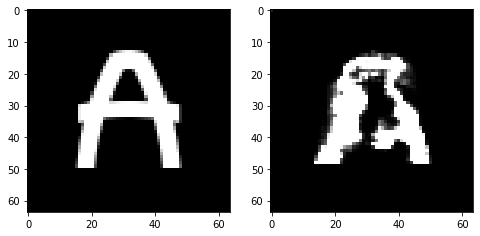

Epoch 138, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.67611837759614, Loss SSIM 2.249498963356018, Loss Local 186.41814422607422


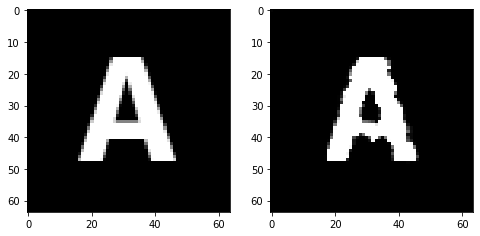

Epoch 138, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5763502977788448, Loss SSIM 2.1076666712760925, Loss Local 168.1807656288147


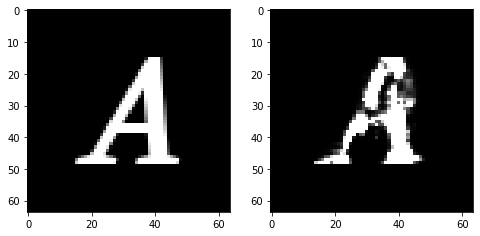

Epoch 139, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07739964127540588, Loss SSIM 0.11198270320892334, Loss Local 8.6780366897583


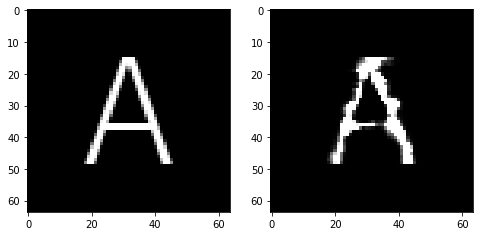

Epoch 139, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.625896293669939, Loss SSIM 2.1883485913276672, Loss Local 181.49739980697632


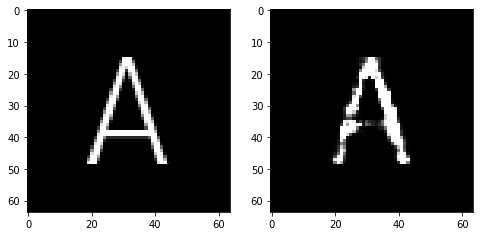

Epoch 139, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6113573983311653, Loss SSIM 2.121847927570343, Loss Local 176.34001445770264


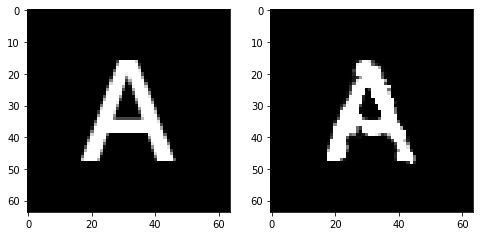

Epoch 139, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6787872947752476, Loss SSIM 2.28703236579895, Loss Local 189.43705368041992


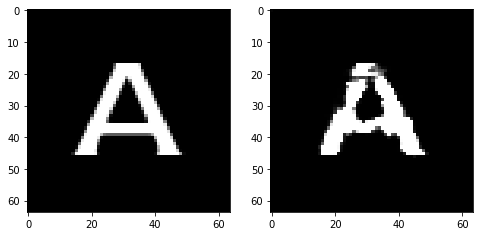

Epoch 139, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6657299548387527, Loss SSIM 2.238312304019928, Loss Local 188.181143283844


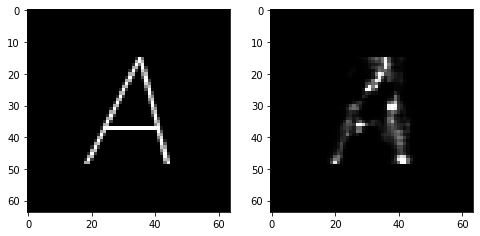

Epoch 139, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651654552668333, Loss SSIM 2.267963230609894, Loss Local 185.32607889175415


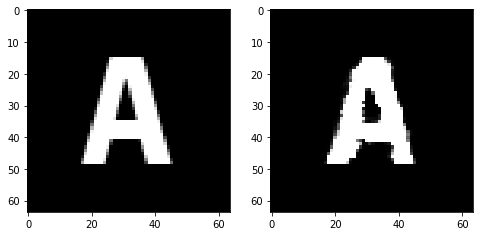

Epoch 139, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6398147158324718, Loss SSIM 2.247459888458252, Loss Local 182.14217472076416


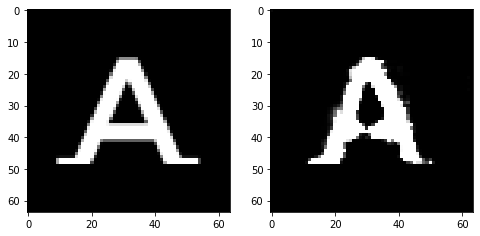

Epoch 139, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7012568414211273, Loss SSIM 2.266425848007202, Loss Local 187.39077615737915


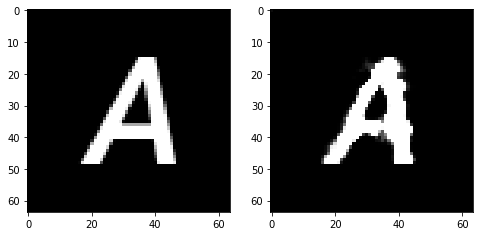

Epoch 140, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07052285969257355, Loss SSIM 0.09448248147964478, Loss Local 8.174613952636719


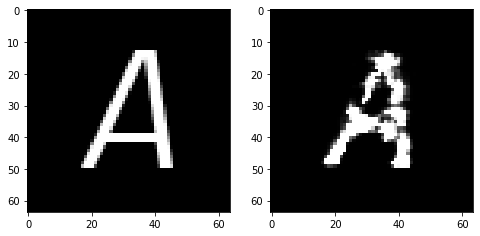

Epoch 140, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6557498537003994, Loss SSIM 2.2283109426498413, Loss Local 177.75176239013672


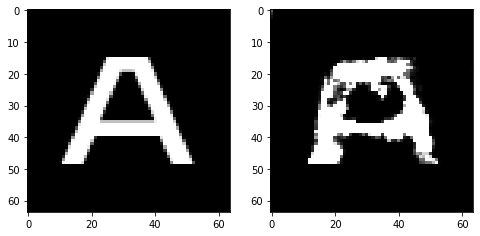

Epoch 140, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7006648778915405, Loss SSIM 2.2968176007270813, Loss Local 189.12957000732422


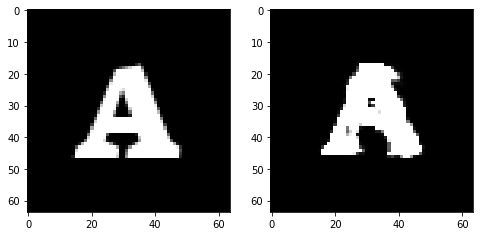

Epoch 140, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6580323427915573, Loss SSIM 2.1979880332946777, Loss Local 190.30980491638184


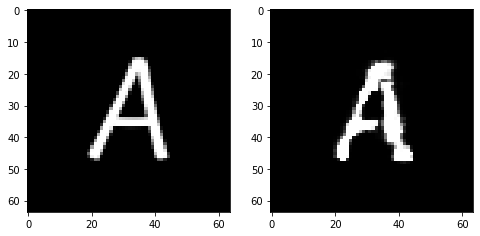

Epoch 140, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6292397752404213, Loss SSIM 2.2653616070747375, Loss Local 191.0962038040161


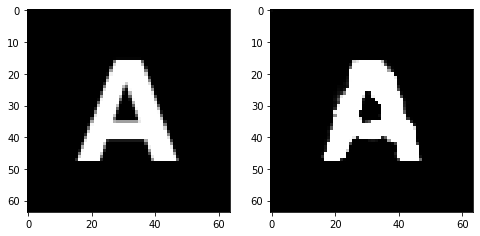

Epoch 140, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.65842617303133, Loss SSIM 2.2897645831108093, Loss Local 183.97424364089966


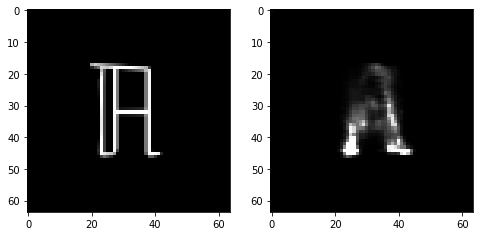

Epoch 140, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6545276753604412, Loss SSIM 2.285129487514496, Loss Local 187.53402662277222


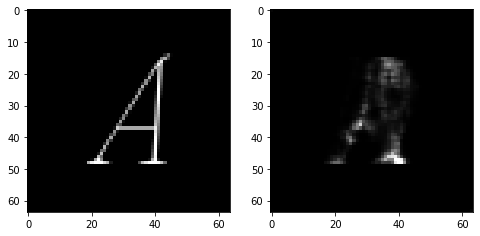

Epoch 140, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.663047432899475, Loss SSIM 2.2150723934173584, Loss Local 182.24827814102173


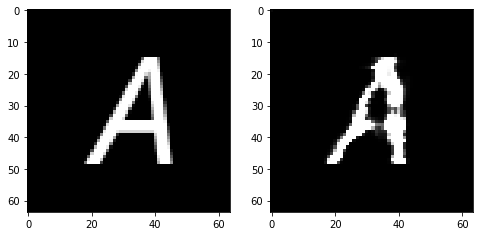

Epoch 141, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07120165973901749, Loss SSIM 0.10223525762557983, Loss Local 6.377521991729736


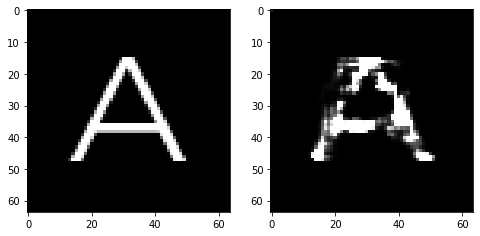

Epoch 141, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6462609469890594, Loss SSIM 2.27749240398407, Loss Local 177.77041149139404


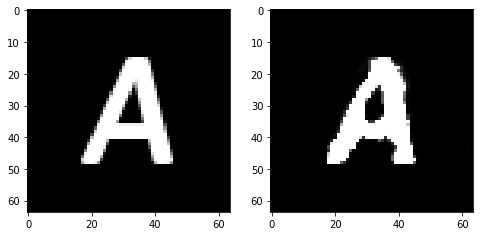

Epoch 141, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6243176721036434, Loss SSIM 2.1368613243103027, Loss Local 178.0288381576538


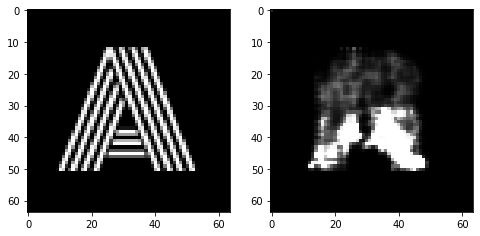

Epoch 141, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6300492361187935, Loss SSIM 2.2227113842964172, Loss Local 184.1161813735962


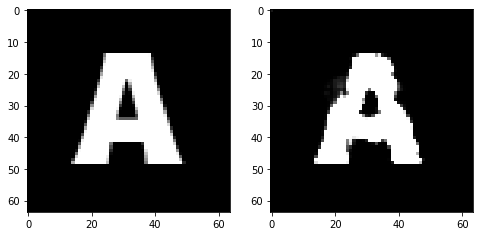

Epoch 141, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6773368045687675, Loss SSIM 2.252726674079895, Loss Local 189.1398549079895


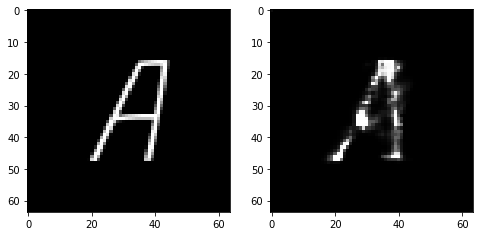

Epoch 141, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.63923554494977, Loss SSIM 2.1791009306907654, Loss Local 182.676691532135


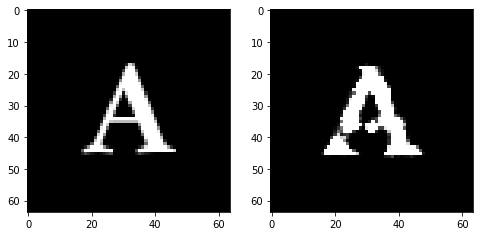

Epoch 141, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7135583236813545, Loss SSIM 2.3580929040908813, Loss Local 190.29938554763794


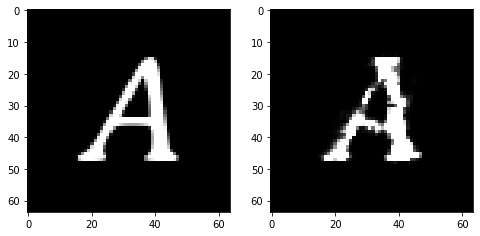

Epoch 141, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6599765196442604, Loss SSIM 2.2918487191200256, Loss Local 191.3674201965332


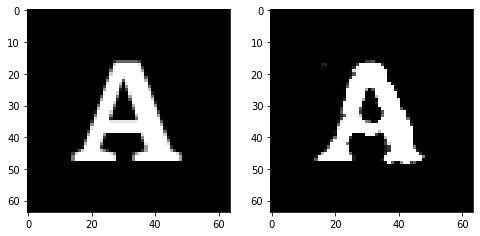

Epoch 142, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06349124014377594, Loss SSIM 0.08413845300674438, Loss Local 6.834786891937256


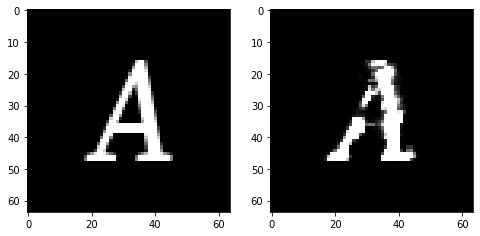

Epoch 142, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6544636078178883, Loss SSIM 2.3098087906837463, Loss Local 190.6777787208557


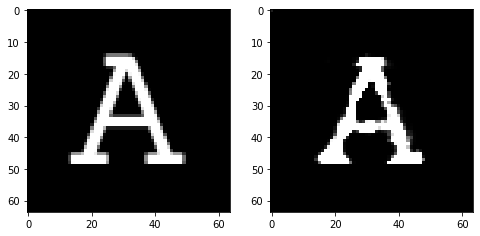

Epoch 142, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6561583131551743, Loss SSIM 2.217267632484436, Loss Local 181.5275764465332


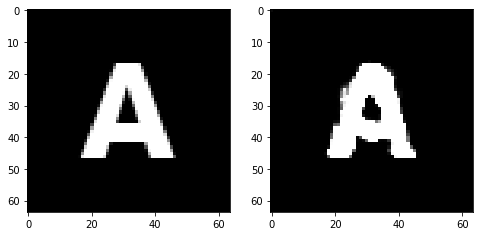

Epoch 142, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6096202097833157, Loss SSIM 2.20482474565506, Loss Local 184.39856243133545


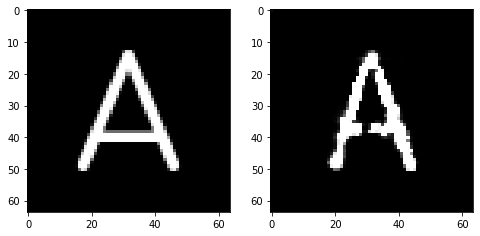

Epoch 142, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6548824161291122, Loss SSIM 2.2299699187278748, Loss Local 187.27906894683838


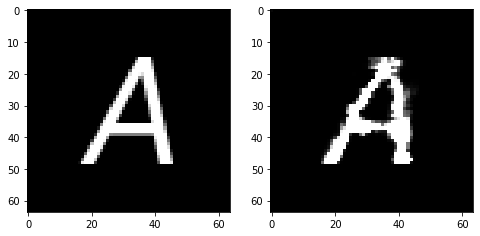

Epoch 142, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6701118722558022, Loss SSIM 2.264788329601288, Loss Local 186.48739337921143


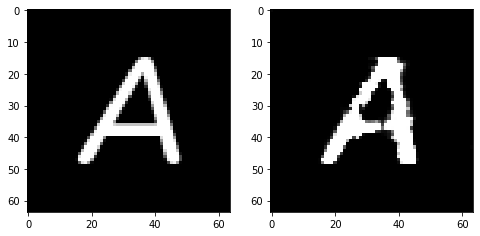

Epoch 142, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7021628431975842, Loss SSIM 2.338438332080841, Loss Local 183.06079769134521


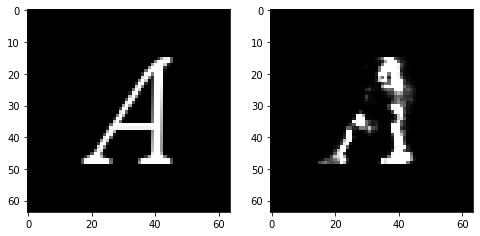

Epoch 142, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6442298665642738, Loss SSIM 2.154581665992737, Loss Local 177.68030166625977


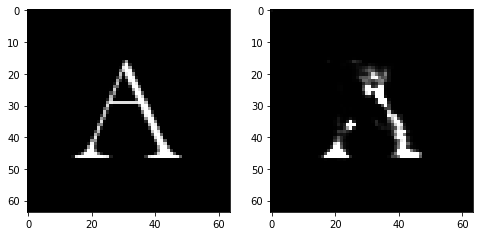

Epoch 143, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06156149506568909, Loss SSIM 0.08629453182220459, Loss Local 6.091726779937744


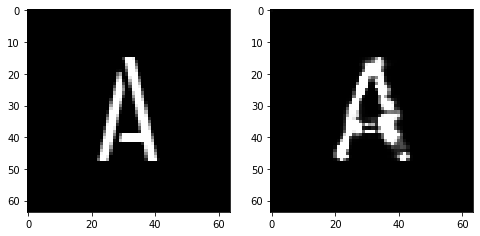

Epoch 143, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6435527876019478, Loss SSIM 2.237155795097351, Loss Local 175.30389213562012


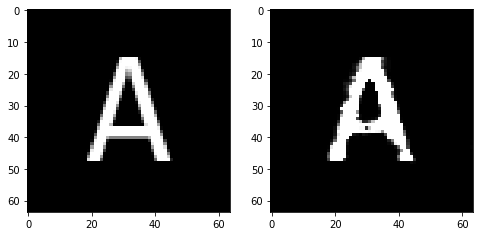

Epoch 143, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6899647861719131, Loss SSIM 2.315101742744446, Loss Local 186.67607593536377


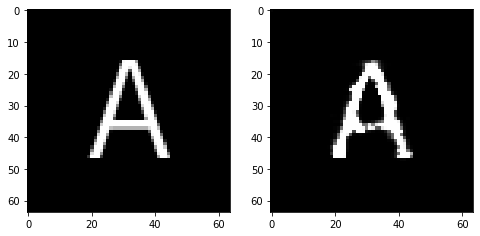

Epoch 143, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6547702364623547, Loss SSIM 2.2463989853858948, Loss Local 186.70306777954102


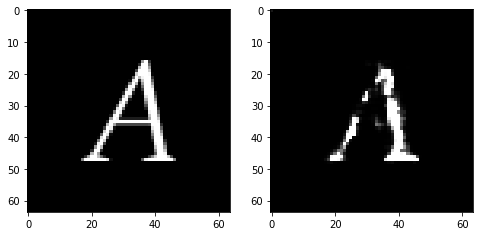

Epoch 143, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6624091751873493, Loss SSIM 2.2354195713996887, Loss Local 180.43981885910034


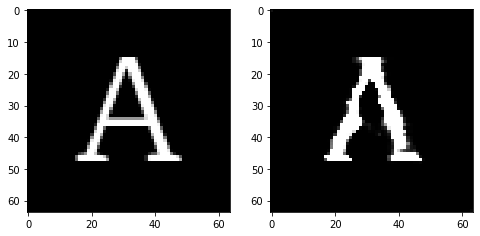

Epoch 143, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.666175004094839, Loss SSIM 2.2230381965637207, Loss Local 192.4332399368286


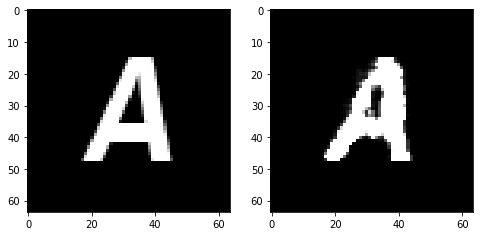

Epoch 143, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6427114754915237, Loss SSIM 2.2395557165145874, Loss Local 184.31731271743774


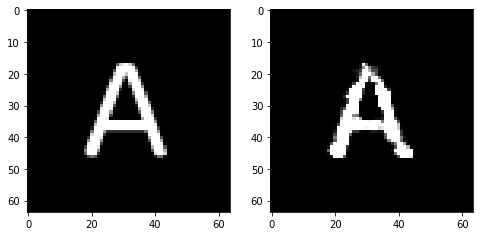

Epoch 143, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6275500692427158, Loss SSIM 2.1765216588974, Loss Local 182.55658674240112


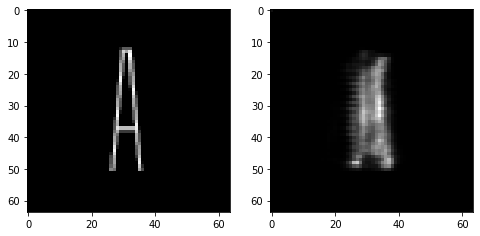

Epoch 144, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06238748878240585, Loss SSIM 0.0821804404258728, Loss Local 6.601505279541016


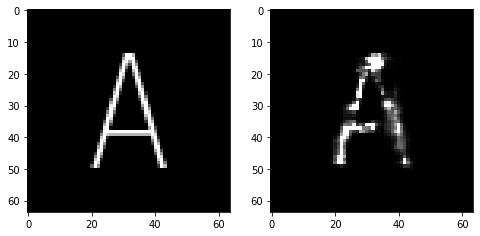

Epoch 144, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6686098016798496, Loss SSIM 2.273268163204193, Loss Local 187.0116000175476


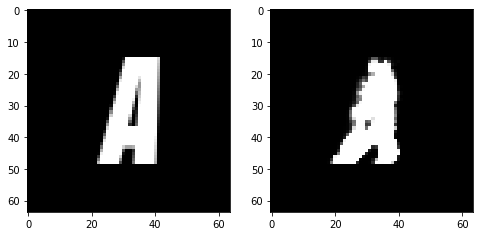

Epoch 144, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6027217395603657, Loss SSIM 2.1077707409858704, Loss Local 176.18365097045898


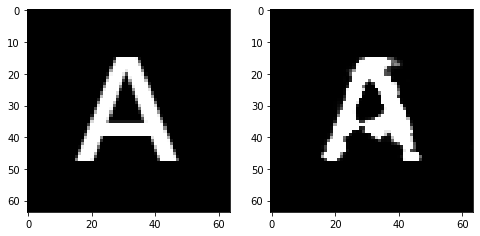

Epoch 144, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6782090738415718, Loss SSIM 2.3402870893478394, Loss Local 187.64556217193604


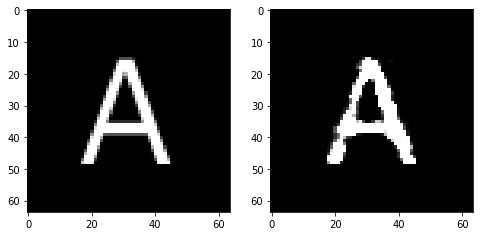

Epoch 144, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6708603724837303, Loss SSIM 2.2983113527297974, Loss Local 191.72800636291504


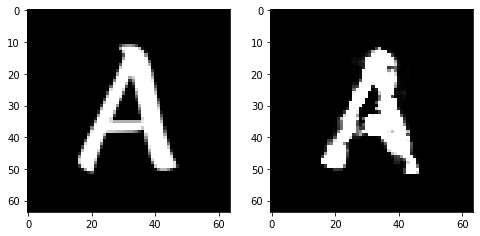

Epoch 144, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6435224302113056, Loss SSIM 2.238747715950012, Loss Local 180.7353687286377


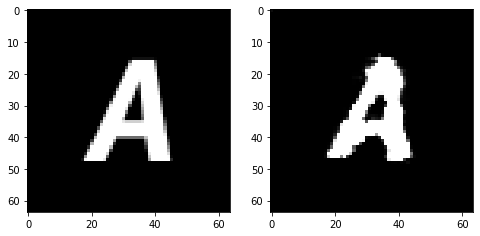

Epoch 144, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6422029733657837, Loss SSIM 2.2208816409111023, Loss Local 185.73167991638184


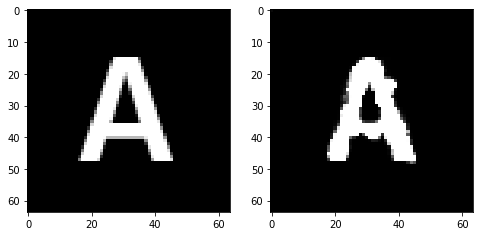

Epoch 144, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651349727064371, Loss SSIM 2.166386902332306, Loss Local 186.64914226531982


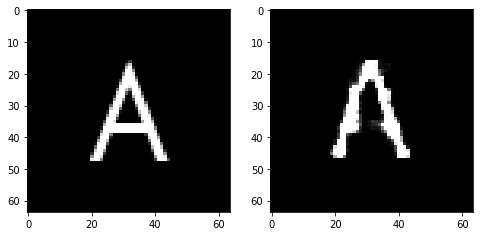

Epoch 145, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0728355199098587, Loss SSIM 0.11617070436477661, Loss Local 7.751133441925049


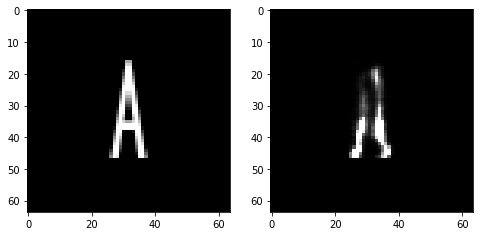

Epoch 145, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.66890599578619, Loss SSIM 2.2602450847625732, Loss Local 186.73559474945068


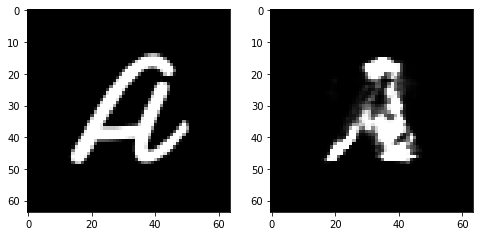

Epoch 145, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6633426919579506, Loss SSIM 2.2993847727775574, Loss Local 205.0678563117981


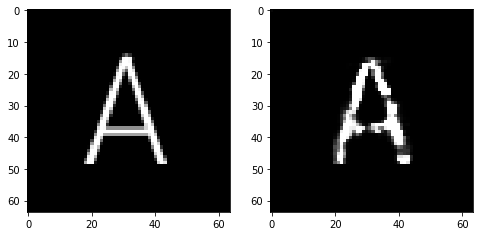

Epoch 145, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6835186779499054, Loss SSIM 2.2946330308914185, Loss Local 184.00311851501465


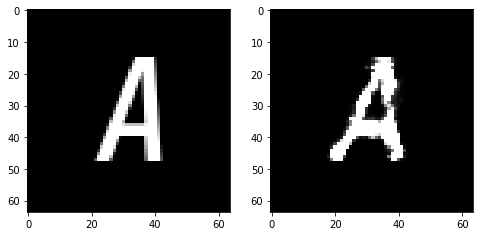

Epoch 145, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6617864109575748, Loss SSIM 2.263028562068939, Loss Local 186.29910898208618


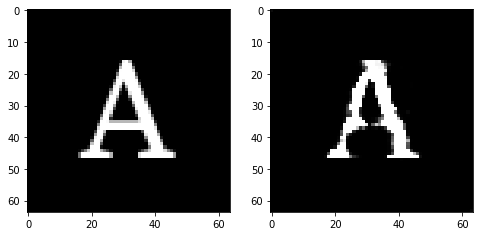

Epoch 145, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6594881750643253, Loss SSIM 2.188705563545227, Loss Local 174.93479251861572


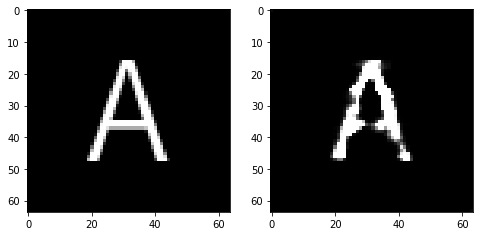

Epoch 145, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6514911502599716, Loss SSIM 2.222893476486206, Loss Local 188.45925331115723


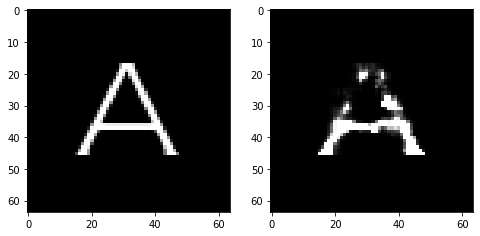

Epoch 145, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5942461267113686, Loss SSIM 2.1756184101104736, Loss Local 175.24222707748413


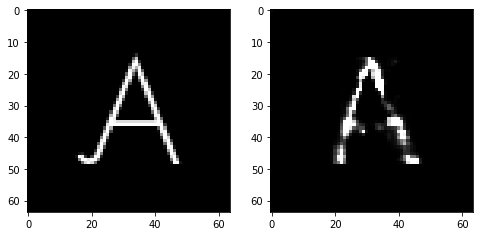

Epoch 146, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0639725849032402, Loss SSIM 0.09385281801223755, Loss Local 7.142253875732422


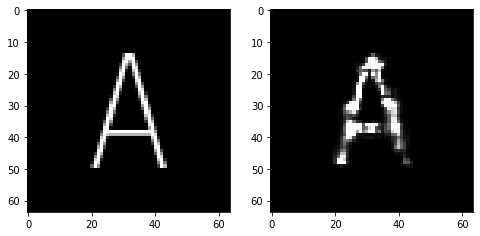

Epoch 146, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6392435356974602, Loss SSIM 2.2029388546943665, Loss Local 187.2740979194641


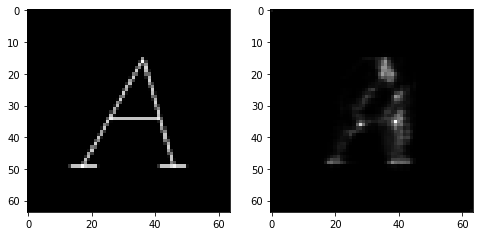

Epoch 146, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.62831000238657, Loss SSIM 2.2436771988868713, Loss Local 191.08532762527466


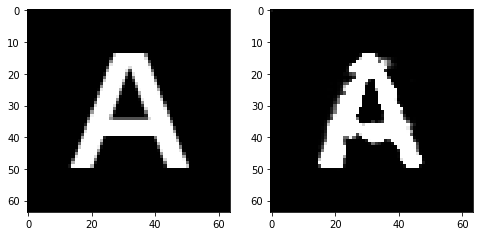

Epoch 146, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6425568796694279, Loss SSIM 2.2035213708877563, Loss Local 179.98676466941833


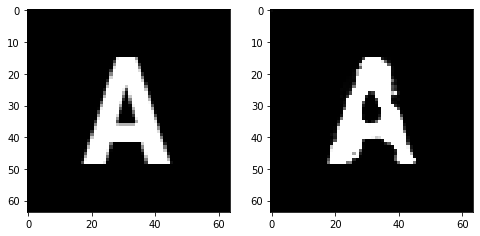

Epoch 146, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7183298282325268, Loss SSIM 2.372531473636627, Loss Local 201.00247764587402


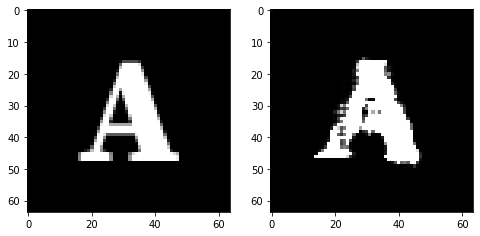

Epoch 146, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.65205018222332, Loss SSIM 2.2028642892837524, Loss Local 185.00439739227295


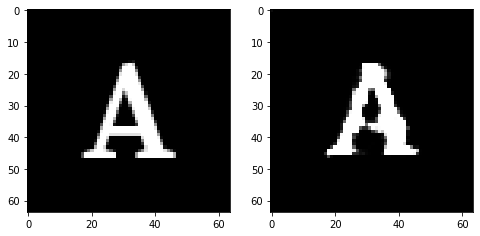

Epoch 146, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6833085417747498, Loss SSIM 2.2653353214263916, Loss Local 185.9970898628235


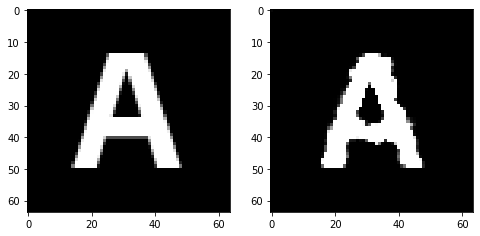

Epoch 146, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6632622256875038, Loss SSIM 2.2508655786514282, Loss Local 191.0306601524353


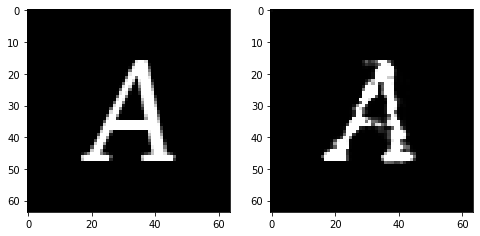

Epoch 147, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06774123758077621, Loss SSIM 0.08493030071258545, Loss Local 6.856457233428955


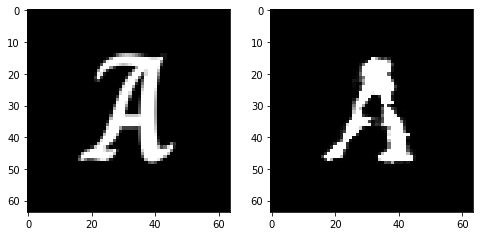

Epoch 147, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5899309925734997, Loss SSIM 2.1017054319381714, Loss Local 180.19113159179688


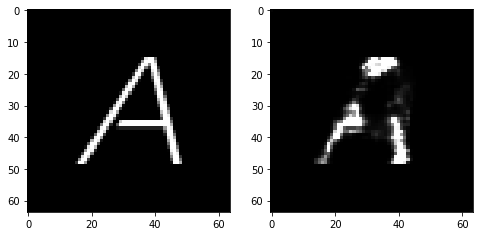

Epoch 147, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6565631665289402, Loss SSIM 2.2455206513404846, Loss Local 183.3541865348816


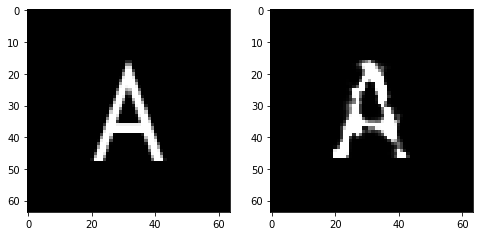

Epoch 147, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6641359329223633, Loss SSIM 2.302136480808258, Loss Local 193.92561435699463


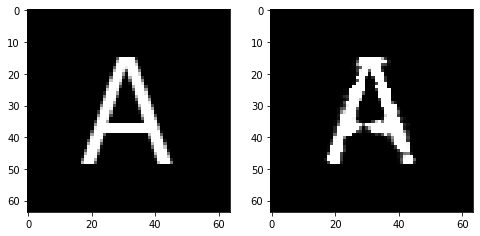

Epoch 147, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6416047289967537, Loss SSIM 2.202136754989624, Loss Local 187.33426570892334


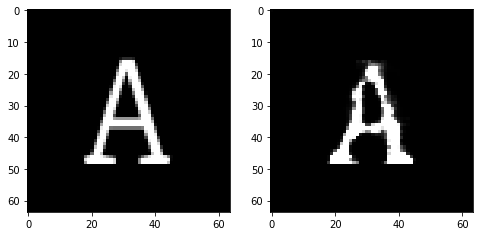

Epoch 147, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6564509756863117, Loss SSIM 2.214682638645172, Loss Local 188.48306322097778


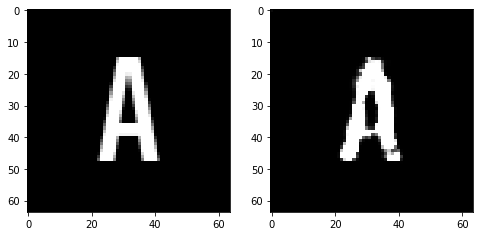

Epoch 147, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.636843778192997, Loss SSIM 2.1848044395446777, Loss Local 192.8822422027588


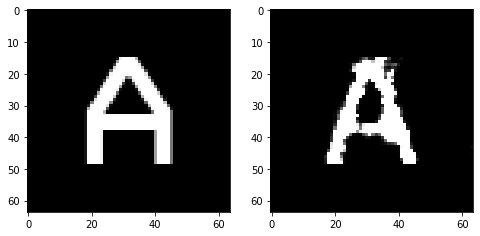

Epoch 147, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7202480845153332, Loss SSIM 2.3921151757240295, Loss Local 196.40056991577148


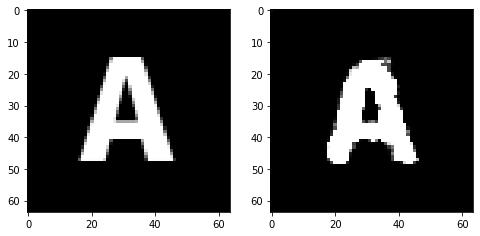

Epoch 148, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07397408038377762, Loss SSIM 0.09409928321838379, Loss Local 9.155364990234375


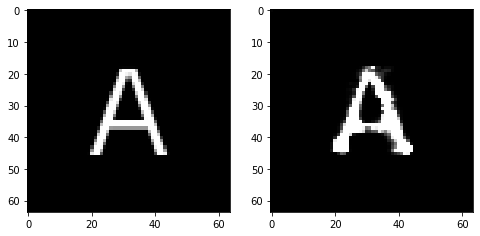

Epoch 148, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6285523362457752, Loss SSIM 2.2574310898780823, Loss Local 176.35487842559814


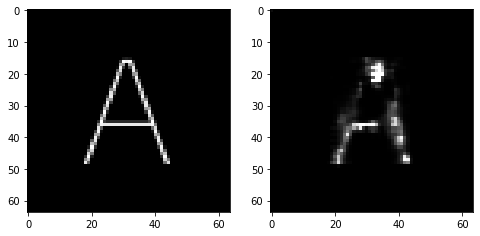

Epoch 148, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6735808216035366, Loss SSIM 2.224603593349457, Loss Local 188.87355375289917


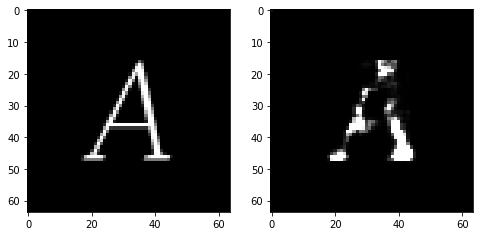

Epoch 148, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.679488092660904, Loss SSIM 2.285228669643402, Loss Local 185.12189626693726


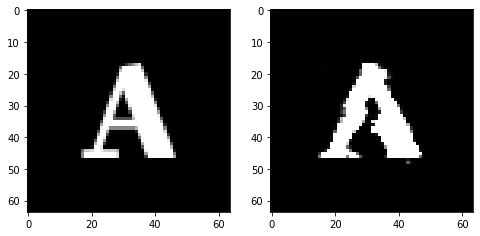

Epoch 148, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.671012356877327, Loss SSIM 2.2831984162330627, Loss Local 196.63416147232056


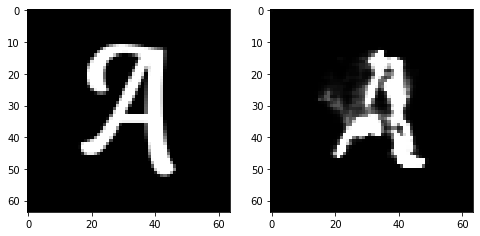

Epoch 148, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6319307386875153, Loss SSIM 2.2450181245803833, Loss Local 183.57085275650024


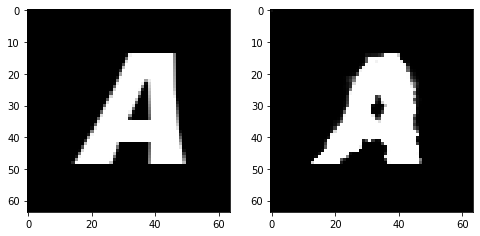

Epoch 148, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6589039862155914, Loss SSIM 2.252022445201874, Loss Local 174.6834201812744


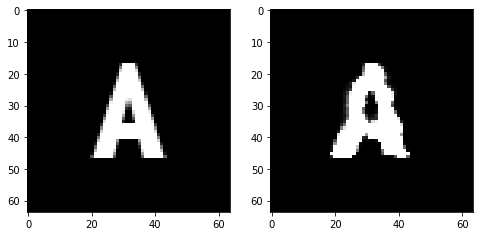

Epoch 148, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.656001027673483, Loss SSIM 2.2225430607795715, Loss Local 189.64225912094116


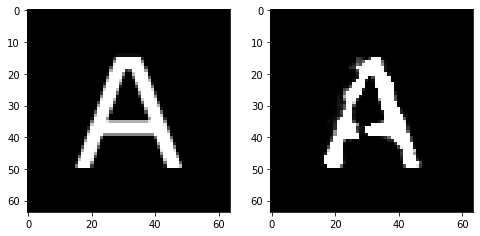

Epoch 149, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0709729939699173, Loss SSIM 0.09803193807601929, Loss Local 8.872931480407715


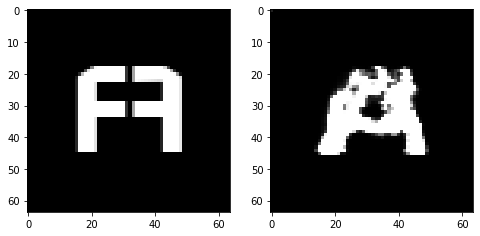

Epoch 149, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6931680291891098, Loss SSIM 2.262176811695099, Loss Local 183.95684719085693


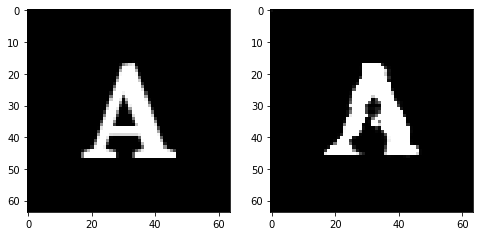

Epoch 149, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5896046943962574, Loss SSIM 2.1932671666145325, Loss Local 177.39964723587036


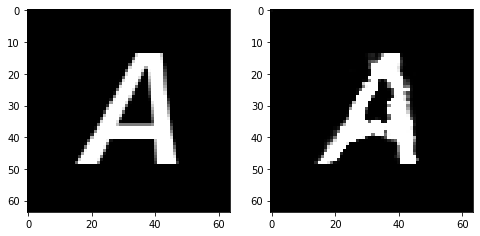

Epoch 149, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6699363850057125, Loss SSIM 2.2460474967956543, Loss Local 190.78651523590088


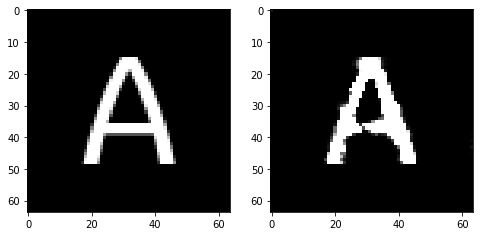

Epoch 149, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6323792785406113, Loss SSIM 2.1942442059516907, Loss Local 188.7773084640503


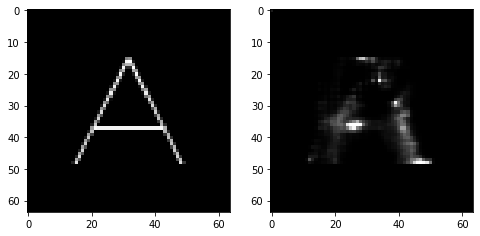

Epoch 149, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6188126392662525, Loss SSIM 2.1692153811454773, Loss Local 180.18652248382568


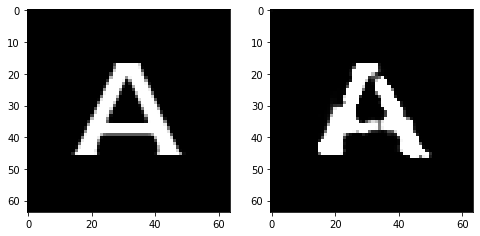

Epoch 149, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.685947272926569, Loss SSIM 2.2824472784996033, Loss Local 187.5391330718994


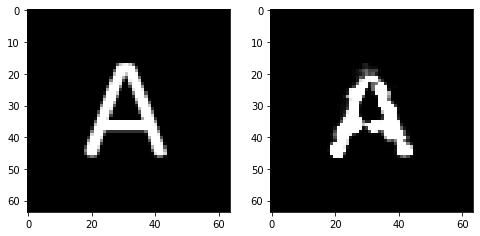

Epoch 149, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6552373357117176, Loss SSIM 2.2518218755722046, Loss Local 182.55710172653198


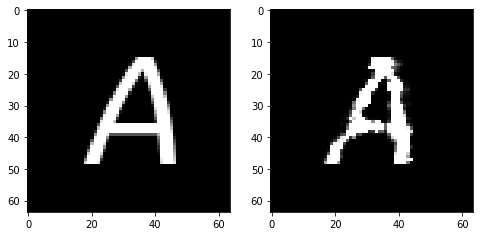

Epoch 150, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.061886221170425415, Loss SSIM 0.07707333564758301, Loss Local 6.433065414428711


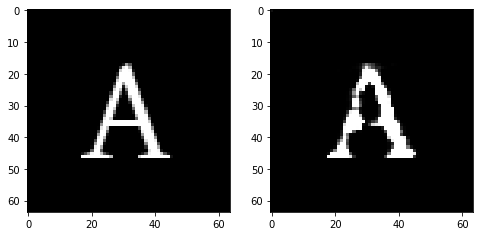

Epoch 150, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6554662846028805, Loss SSIM 2.221222460269928, Loss Local 184.72706747055054


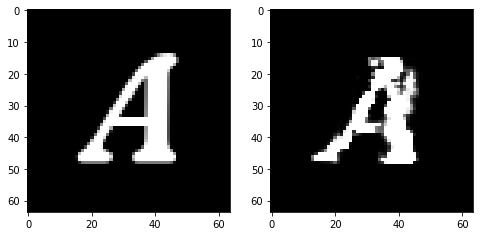

Epoch 150, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651920311152935, Loss SSIM 2.229162096977234, Loss Local 182.09935331344604


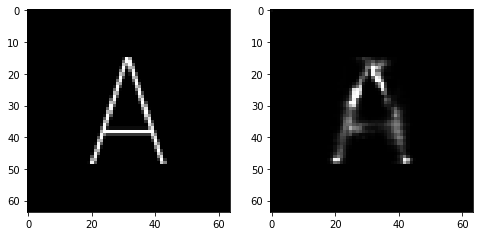

Epoch 150, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6883666478097439, Loss SSIM 2.299104154109955, Loss Local 177.91545820236206


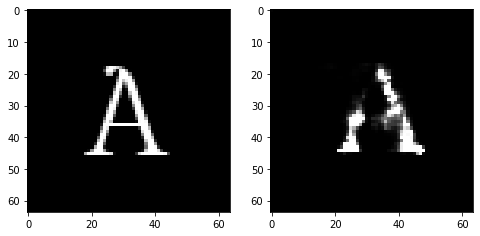

Epoch 150, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6026600487530231, Loss SSIM 2.179289758205414, Loss Local 173.37756156921387


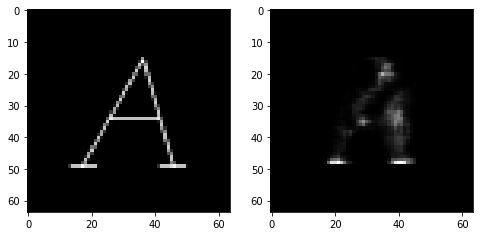

Epoch 150, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.67048654332757, Loss SSIM 2.222291886806488, Loss Local 189.6038694381714


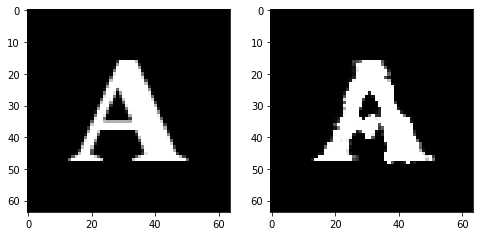

Epoch 150, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6373570710420609, Loss SSIM 2.1957257986068726, Loss Local 187.82261896133423


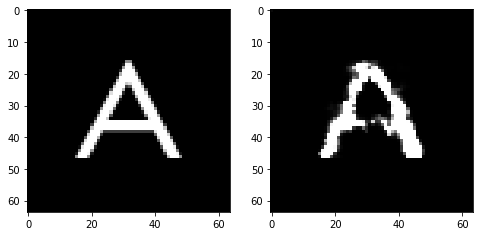

Epoch 150, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6649215556681156, Loss SSIM 2.2947320342063904, Loss Local 194.5374240875244


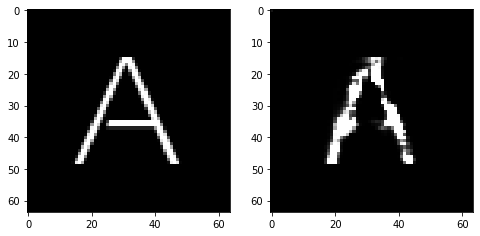

Epoch 151, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06004742160439491, Loss SSIM 0.07294702529907227, Loss Local 6.20632791519165


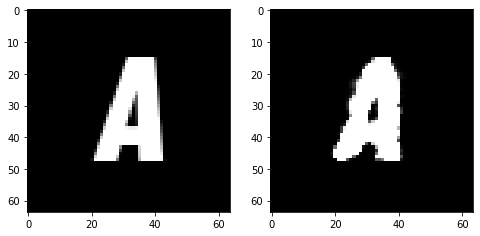

Epoch 151, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6829217113554478, Loss SSIM 2.2957056760787964, Loss Local 191.78404474258423


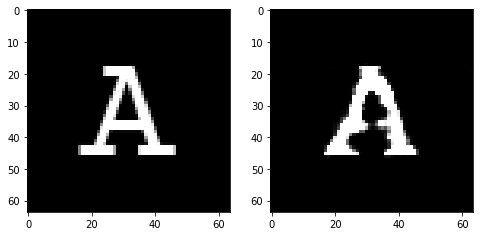

Epoch 151, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.649260487407446, Loss SSIM 2.2425408959388733, Loss Local 185.75733470916748


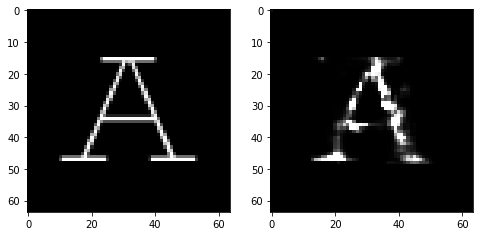

Epoch 151, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6012673862278461, Loss SSIM 2.1668401956558228, Loss Local 182.5209240913391


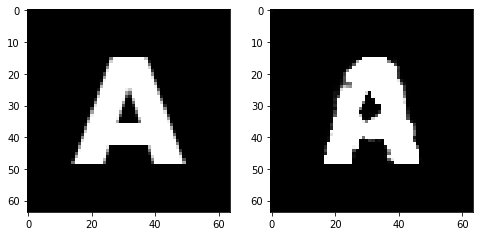

Epoch 151, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.62582640722394, Loss SSIM 2.170523941516876, Loss Local 179.67513799667358


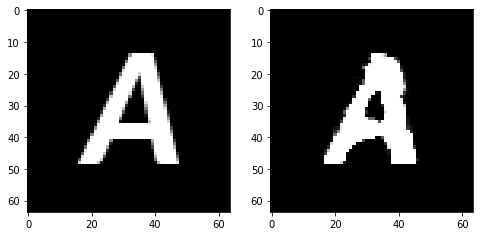

Epoch 151, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6583799682557583, Loss SSIM 2.201343297958374, Loss Local 179.98193359375


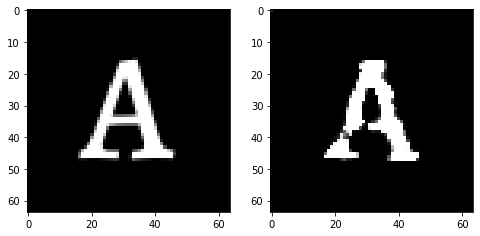

Epoch 151, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6992026381194592, Loss SSIM 2.3478235006332397, Loss Local 190.12981033325195


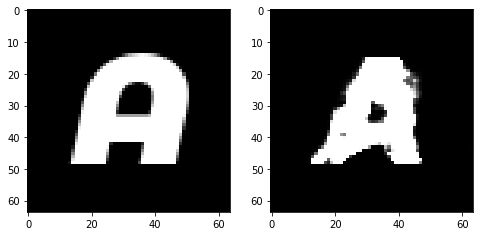

Epoch 151, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6397432908415794, Loss SSIM 2.2419994473457336, Loss Local 185.95702838897705


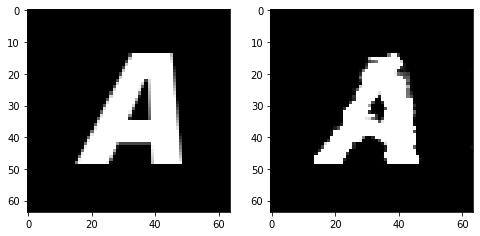

Epoch 152, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06729061901569366, Loss SSIM 0.08809155225753784, Loss Local 8.984317779541016


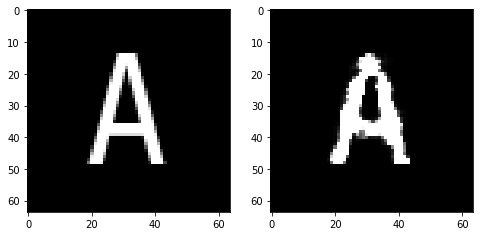

Epoch 152, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6324516497552395, Loss SSIM 2.177094280719757, Loss Local 182.93685865402222


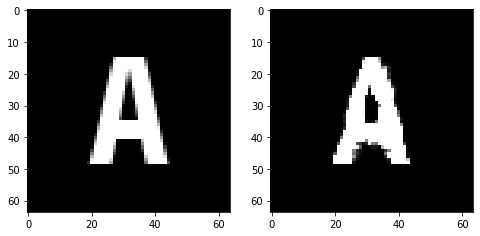

Epoch 152, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.675253301858902, Loss SSIM 2.237342655658722, Loss Local 189.53485202789307


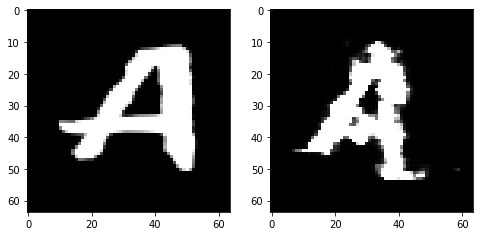

Epoch 152, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6120044030249119, Loss SSIM 2.1836297512054443, Loss Local 180.3109221458435


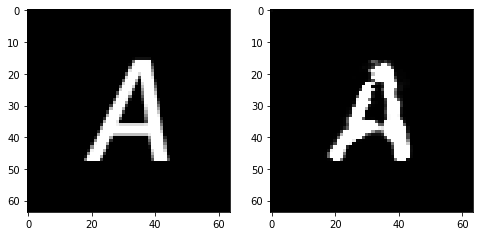

Epoch 152, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7376242317259312, Loss SSIM 2.3988051414489746, Loss Local 203.3716721534729


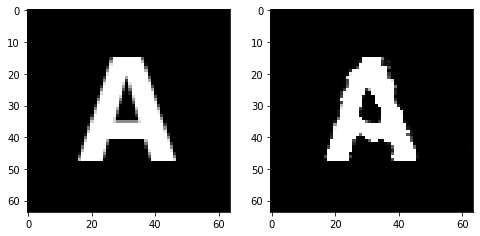

Epoch 152, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6205707341432571, Loss SSIM 2.1599475741386414, Loss Local 174.17446994781494


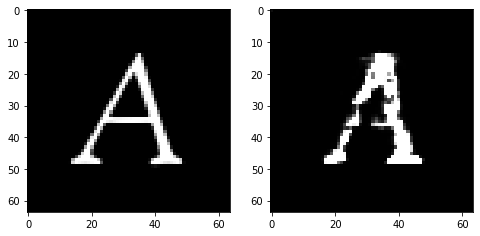

Epoch 152, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.64320620149374, Loss SSIM 2.2486669421195984, Loss Local 186.71321392059326


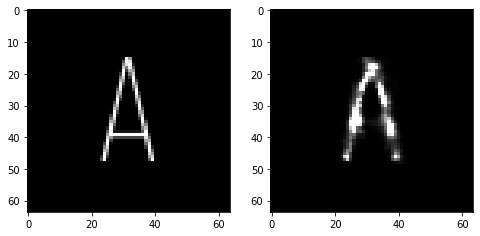

Epoch 152, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6999809071421623, Loss SSIM 2.349296271800995, Loss Local 186.14008808135986


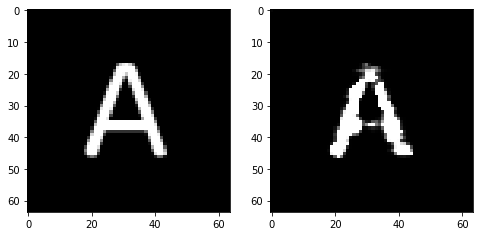

Epoch 153, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0645536482334137, Loss SSIM 0.08675086498260498, Loss Local 6.8219075202941895


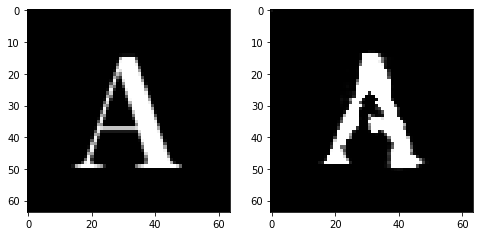

Epoch 153, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.670883648097515, Loss SSIM 2.2322115898132324, Loss Local 187.54203414916992


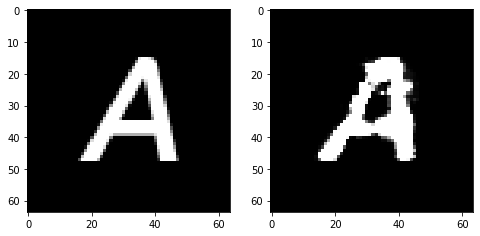

Epoch 153, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6758411526679993, Loss SSIM 2.3202837705612183, Loss Local 185.51047801971436


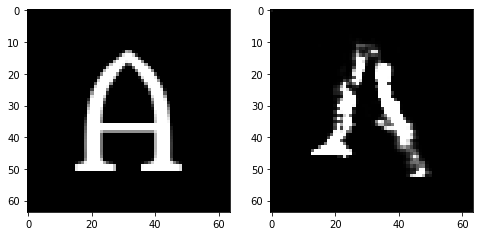

Epoch 153, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6963883936405182, Loss SSIM 2.353610038757324, Loss Local 188.16026782989502


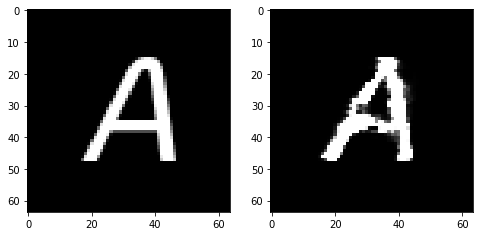

Epoch 153, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6492337025702, Loss SSIM 2.232300102710724, Loss Local 179.33029651641846


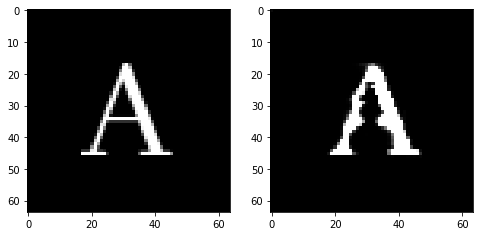

Epoch 153, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6202145852148533, Loss SSIM 2.188148081302643, Loss Local 169.66728353500366


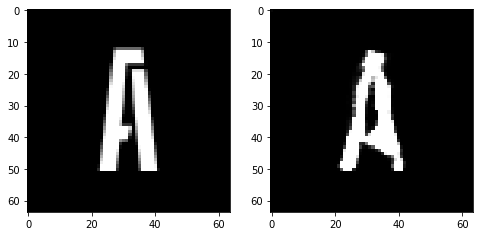

Epoch 153, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5983951948583126, Loss SSIM 2.109415829181671, Loss Local 179.18435907363892


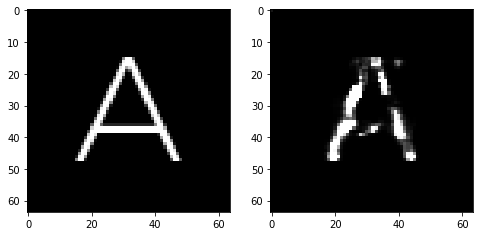

Epoch 153, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.649476546794176, Loss SSIM 2.21188884973526, Loss Local 189.03197479248047


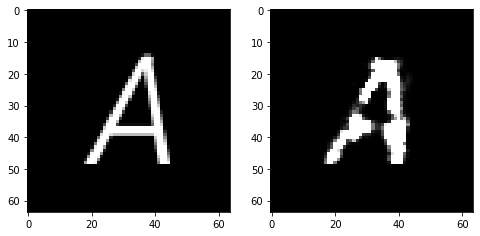

Epoch 154, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06713473051786423, Loss SSIM 0.0887749195098877, Loss Local 7.3695807456970215


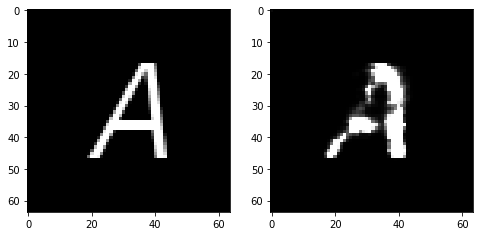

Epoch 154, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6859739795327187, Loss SSIM 2.303440511226654, Loss Local 185.27476835250854


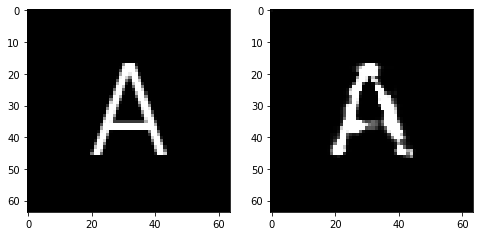

Epoch 154, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6248221881687641, Loss SSIM 2.16942435503006, Loss Local 174.8577480316162


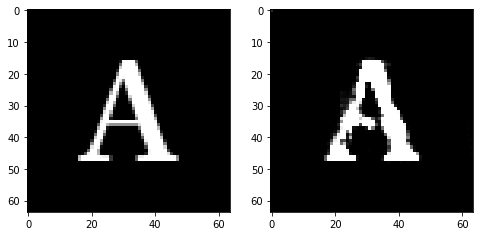

Epoch 154, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6456339322030544, Loss SSIM 2.186205804347992, Loss Local 187.00906372070312


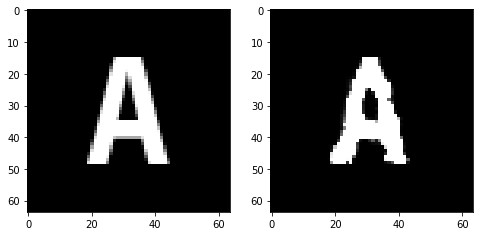

Epoch 154, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6743106581270695, Loss SSIM 2.253392279148102, Loss Local 174.99231386184692


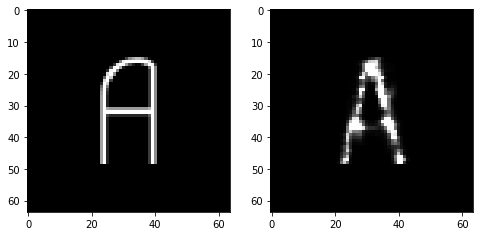

Epoch 154, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6186170876026154, Loss SSIM 2.22654265165329, Loss Local 190.09944343566895


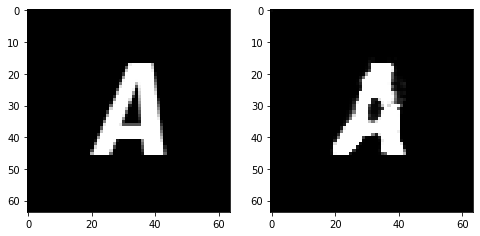

Epoch 154, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.656653631478548, Loss SSIM 2.261865735054016, Loss Local 174.2095284461975


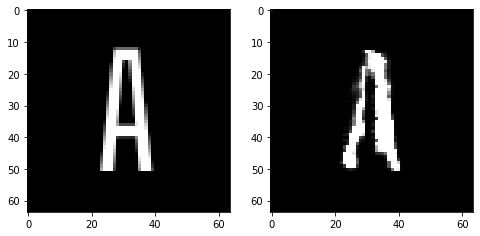

Epoch 154, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.649117473512888, Loss SSIM 2.21983802318573, Loss Local 179.57219409942627


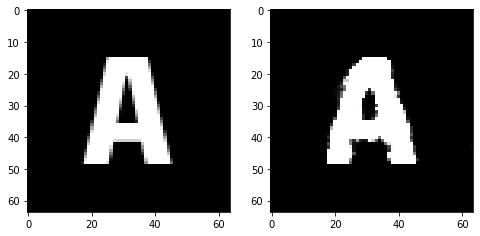

Epoch 155, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05998440086841583, Loss SSIM 0.0789870023727417, Loss Local 5.9140543937683105


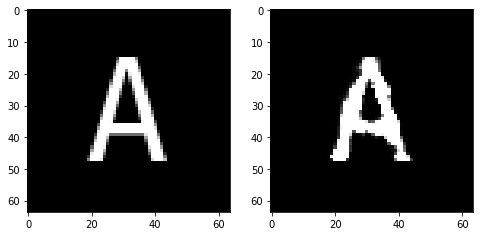

Epoch 155, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6411894969642162, Loss SSIM 2.182253360748291, Loss Local 177.7288179397583


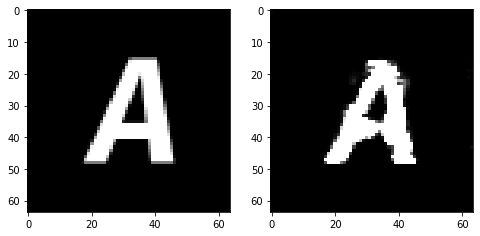

Epoch 155, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6895047463476658, Loss SSIM 2.275970160961151, Loss Local 195.53808069229126


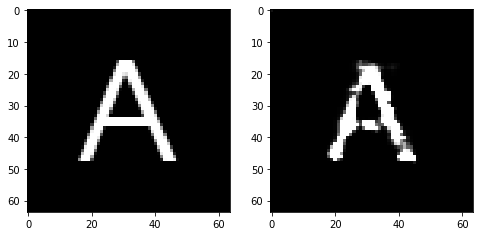

Epoch 155, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6228713393211365, Loss SSIM 2.2086158990859985, Loss Local 177.25131845474243


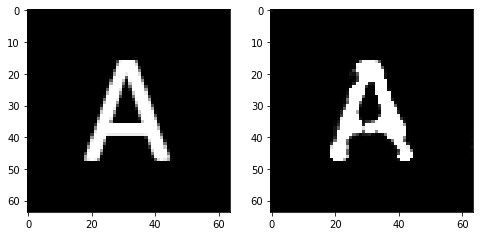

Epoch 155, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6889298893511295, Loss SSIM 2.332702100276947, Loss Local 194.71785640716553


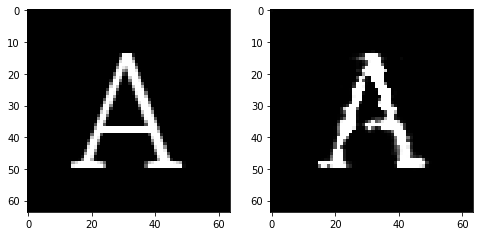

Epoch 155, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6779587008059025, Loss SSIM 2.269302189350128, Loss Local 196.20131492614746


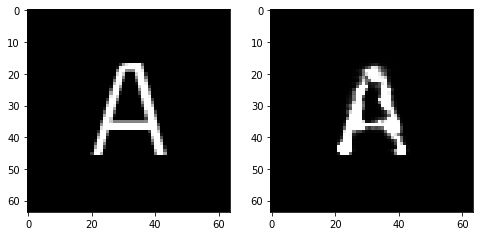

Epoch 155, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.641728576272726, Loss SSIM 2.263968348503113, Loss Local 179.7973027229309


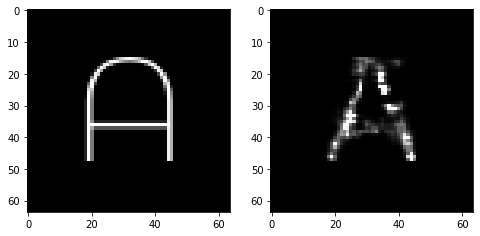

Epoch 155, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6012173555791378, Loss SSIM 2.1609737873077393, Loss Local 184.14162921905518


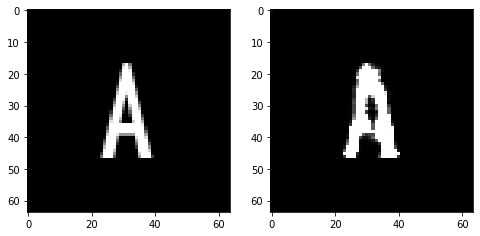

Epoch 156, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06054406240582466, Loss SSIM 0.07977813482284546, Loss Local 6.5690388679504395


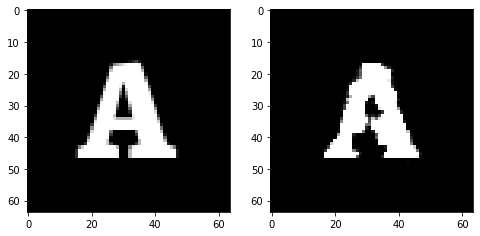

Epoch 156, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651798129081726, Loss SSIM 2.2412649393081665, Loss Local 185.16580533981323


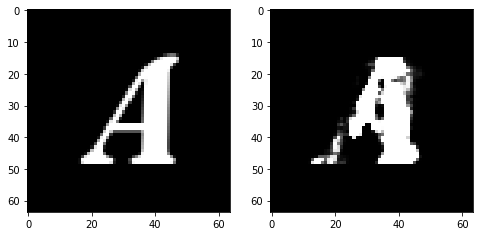

Epoch 156, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6855385266244411, Loss SSIM 2.269940733909607, Loss Local 186.1339988708496


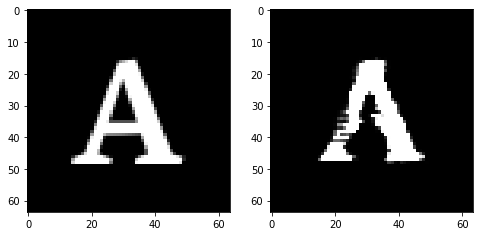

Epoch 156, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6303395591676235, Loss SSIM 2.164176106452942, Loss Local 181.04749298095703


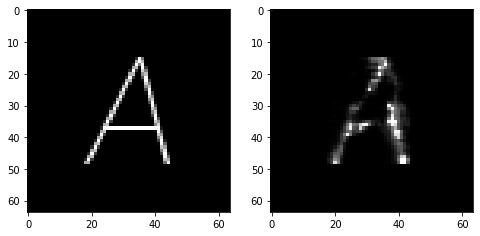

Epoch 156, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6268149875104427, Loss SSIM 2.215955674648285, Loss Local 182.030620098114


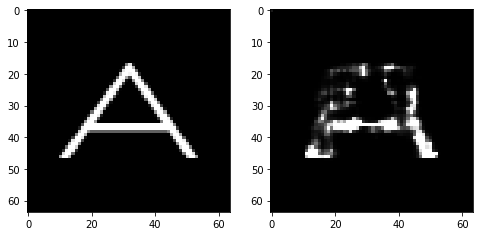

Epoch 156, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.620430313050747, Loss SSIM 2.169665813446045, Loss Local 189.0671901702881


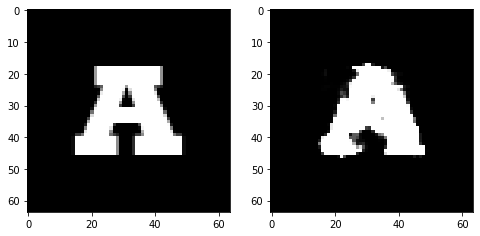

Epoch 156, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.630123596638441, Loss SSIM 2.2909058332443237, Loss Local 192.79660511016846


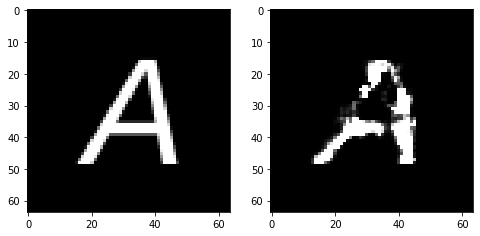

Epoch 156, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6944043934345245, Loss SSIM 2.2878613471984863, Loss Local 190.23807907104492


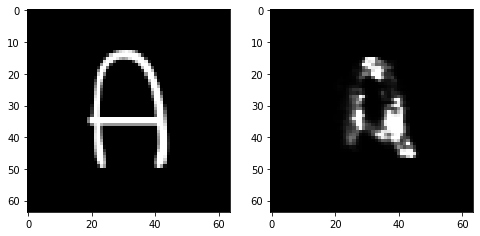

Epoch 157, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06904131919145584, Loss SSIM 0.10736346244812012, Loss Local 5.292895317077637


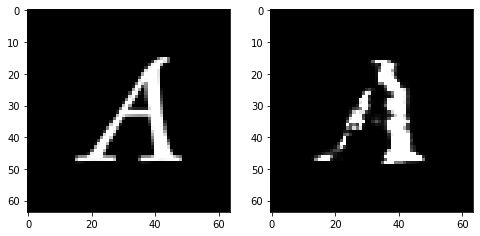

Epoch 157, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6516690142452717, Loss SSIM 2.257984459400177, Loss Local 182.74468326568604


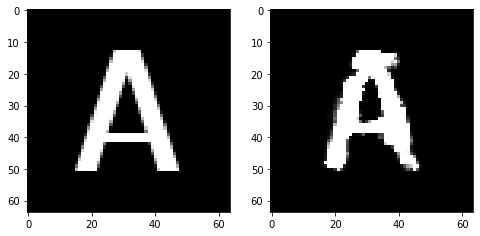

Epoch 157, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6771832183003426, Loss SSIM 2.265145182609558, Loss Local 183.59659147262573


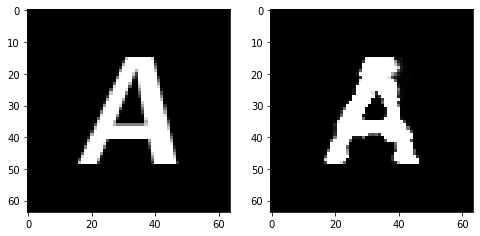

Epoch 157, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6360539309680462, Loss SSIM 2.2400380969047546, Loss Local 188.87017393112183


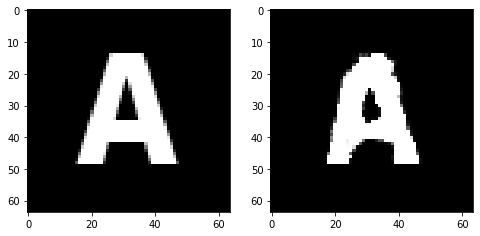

Epoch 157, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6885424368083477, Loss SSIM 2.3117992877960205, Loss Local 192.00529956817627


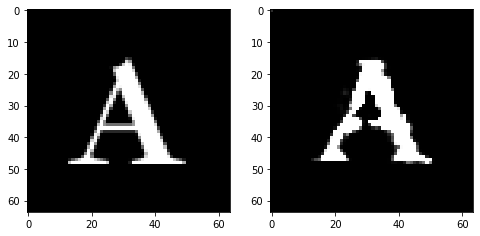

Epoch 157, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6508453004062176, Loss SSIM 2.2445165514945984, Loss Local 183.01735639572144


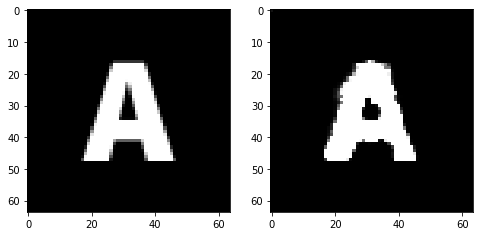

Epoch 157, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.621656734496355, Loss SSIM 2.1784974932670593, Loss Local 179.64275121688843


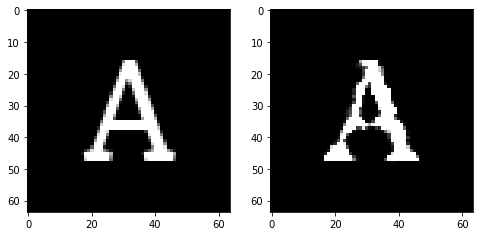

Epoch 157, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6888850815594196, Loss SSIM 2.254549741744995, Loss Local 195.0655345916748


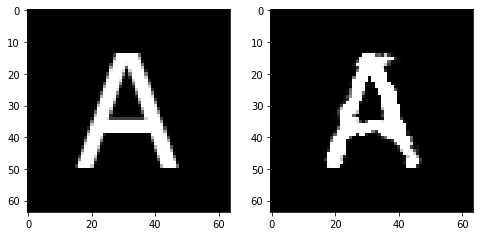

Epoch 158, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0742175281047821, Loss SSIM 0.09695065021514893, Loss Local 5.344810485839844


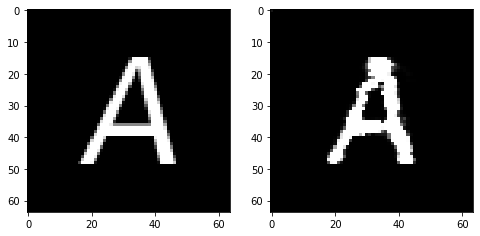

Epoch 158, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6698550805449486, Loss SSIM 2.27480548620224, Loss Local 186.9290747642517


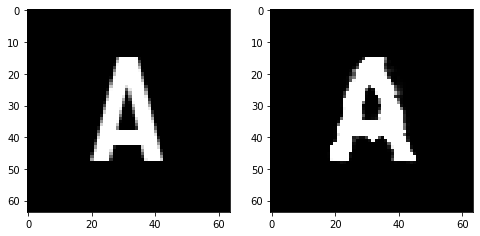

Epoch 158, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6508894674479961, Loss SSIM 2.2280821204185486, Loss Local 172.03714513778687


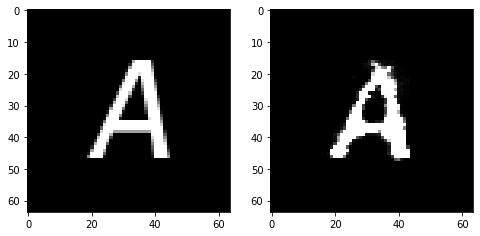

Epoch 158, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5973969586193562, Loss SSIM 2.101993501186371, Loss Local 178.76511573791504


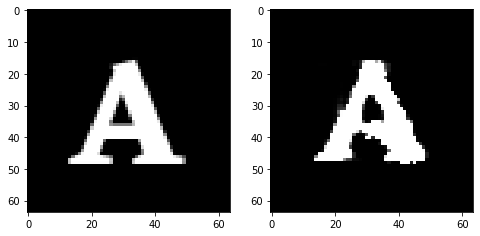

Epoch 158, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6476752310991287, Loss SSIM 2.2705451250076294, Loss Local 181.14408349990845


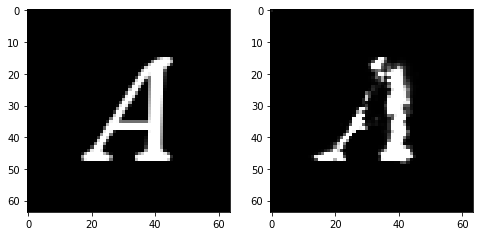

Epoch 158, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6952482163906097, Loss SSIM 2.301344633102417, Loss Local 195.35037326812744


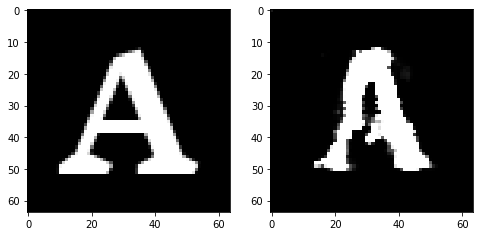

Epoch 158, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6481028608977795, Loss SSIM 2.2371124625205994, Loss Local 187.63418292999268


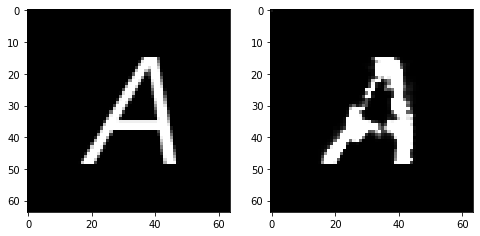

Epoch 158, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6402092799544334, Loss SSIM 2.183865189552307, Loss Local 177.09733486175537


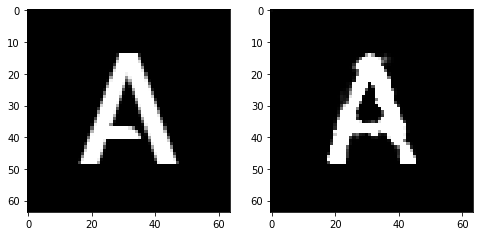

Epoch 159, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06191243976354599, Loss SSIM 0.07926470041275024, Loss Local 4.504334926605225


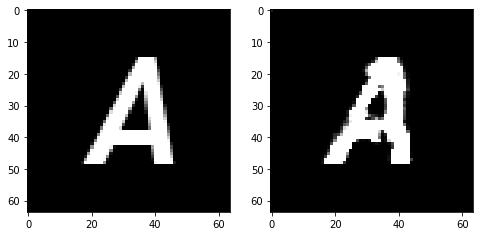

Epoch 159, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6358741745352745, Loss SSIM 2.2183642387390137, Loss Local 183.3690915107727


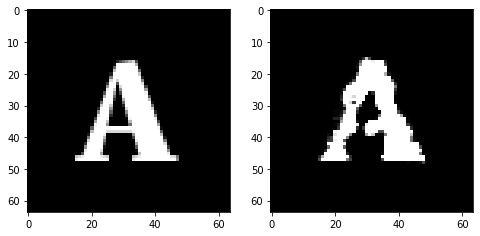

Epoch 159, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6695094294846058, Loss SSIM 2.2172282934188843, Loss Local 184.4348955154419


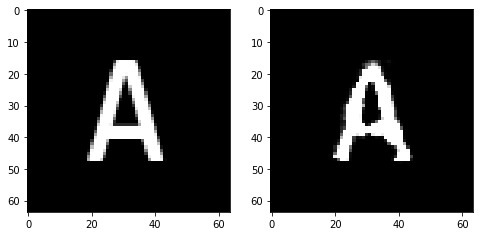

Epoch 159, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.672178264707327, Loss SSIM 2.2732518315315247, Loss Local 181.90585660934448


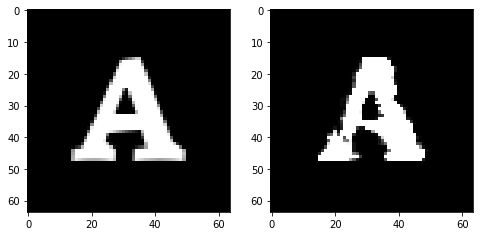

Epoch 159, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6017827689647675, Loss SSIM 2.113424301147461, Loss Local 189.29817008972168


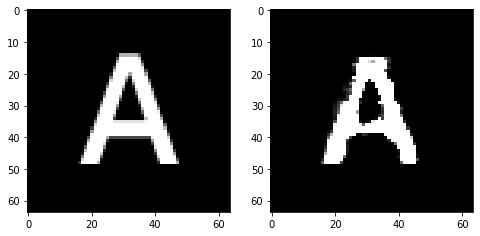

Epoch 159, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6631508842110634, Loss SSIM 2.3263978362083435, Loss Local 185.941876411438


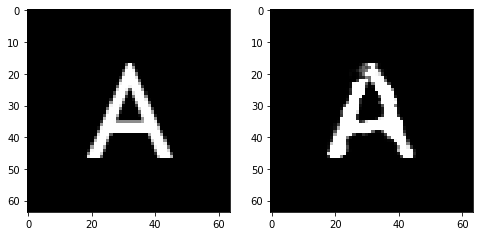

Epoch 159, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6800522319972515, Loss SSIM 2.294714391231537, Loss Local 184.3363161087036


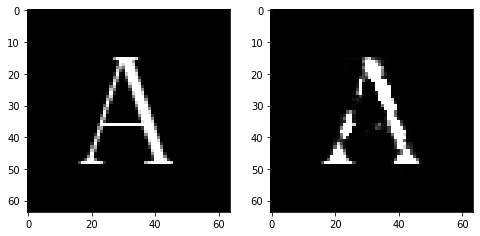

Epoch 159, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6717495284974575, Loss SSIM 2.260777771472931, Loss Local 184.57284212112427


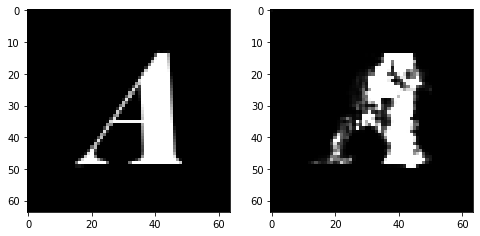

Epoch 160, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06685859709978104, Loss SSIM 0.08914381265640259, Loss Local 7.999847888946533


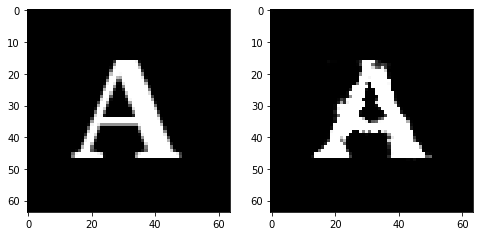

Epoch 160, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6165355928242207, Loss SSIM 2.1428688168525696, Loss Local 195.20765256881714


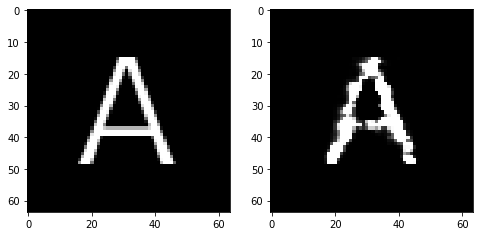

Epoch 160, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.669262871146202, Loss SSIM 2.2729496359825134, Loss Local 178.17647886276245


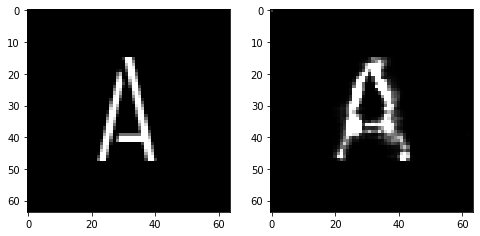

Epoch 160, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.646301332861185, Loss SSIM 2.2829297184944153, Loss Local 177.55225443840027


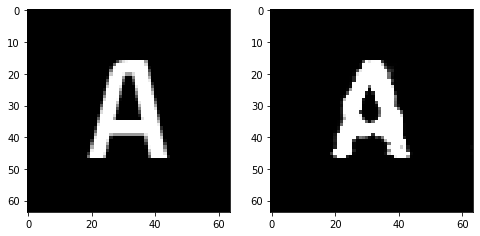

Epoch 160, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7080581672489643, Loss SSIM 2.3063475489616394, Loss Local 198.31439399719238


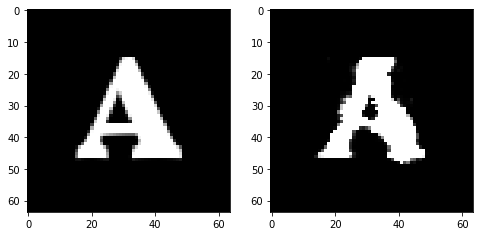

Epoch 160, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6366848573088646, Loss SSIM 2.22110378742218, Loss Local 188.3420867919922


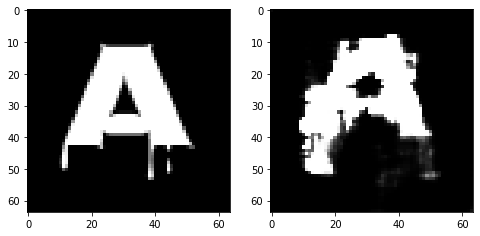

Epoch 160, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6243749670684338, Loss SSIM 2.1874083876609802, Loss Local 186.7490029335022


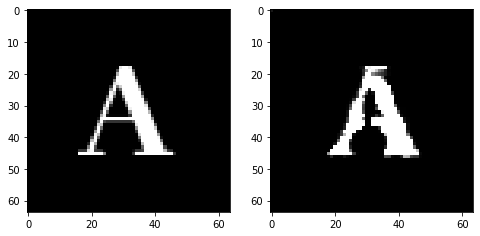

Epoch 160, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6637552864849567, Loss SSIM 2.243037700653076, Loss Local 192.53443717956543


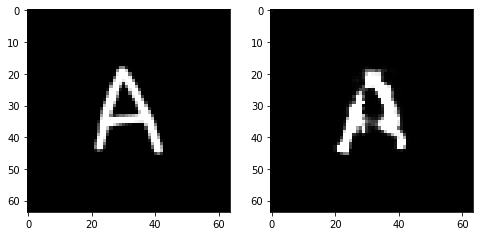

Epoch 161, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06162888556718826, Loss SSIM 0.08374106884002686, Loss Local 8.092168807983398


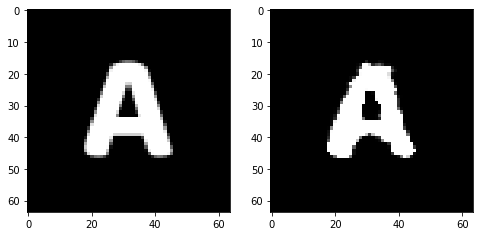

Epoch 161, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6671775542199612, Loss SSIM 2.2223114371299744, Loss Local 187.9604082107544


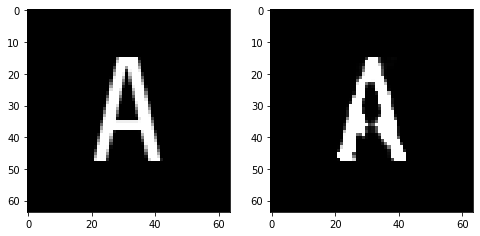

Epoch 161, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6754380948841572, Loss SSIM 2.2994673252105713, Loss Local 193.41260147094727


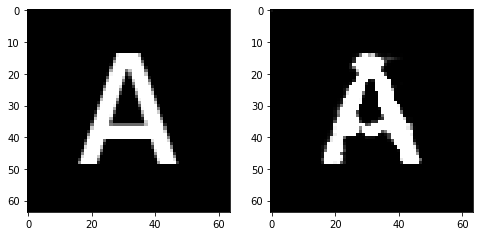

Epoch 161, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6437289267778397, Loss SSIM 2.2637320160865784, Loss Local 191.95094108581543


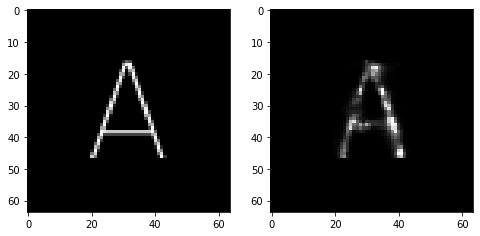

Epoch 161, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.659952413290739, Loss SSIM 2.2286882996559143, Loss Local 187.56767320632935


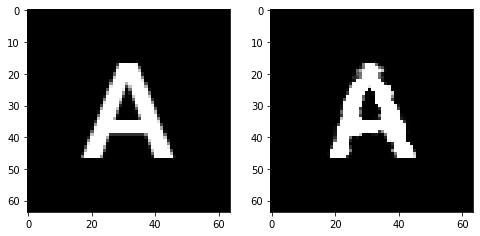

Epoch 161, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.685488410294056, Loss SSIM 2.3160200715065002, Loss Local 186.33935356140137


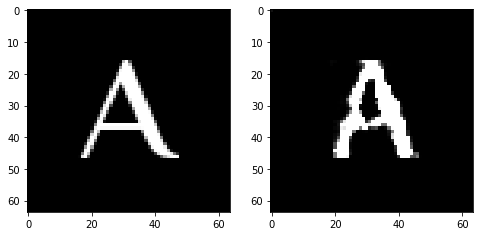

Epoch 161, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5850807018578053, Loss SSIM 2.124493956565857, Loss Local 177.15433502197266


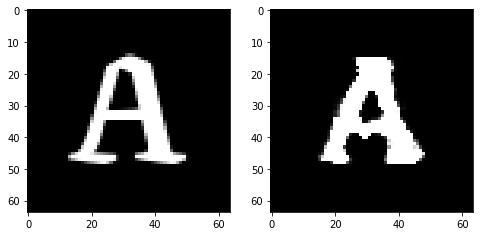

Epoch 161, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6621491760015488, Loss SSIM 2.286691129207611, Loss Local 183.1220622062683


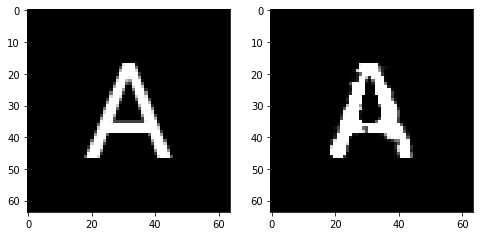

Epoch 162, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0669647827744484, Loss SSIM 0.08921021223068237, Loss Local 5.985597133636475


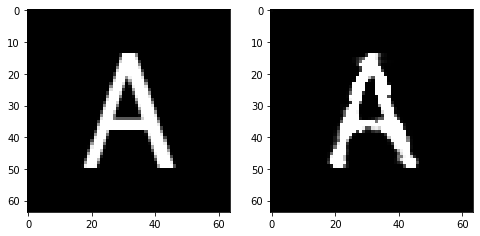

Epoch 162, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6477169170975685, Loss SSIM 2.2467628717422485, Loss Local 183.6203112602234


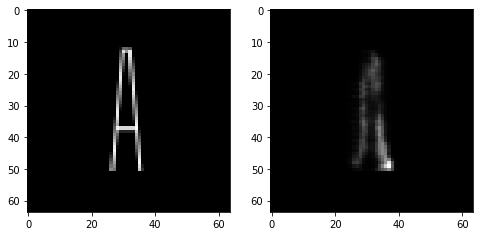

Epoch 162, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.688093714416027, Loss SSIM 2.306702673435211, Loss Local 188.39913988113403


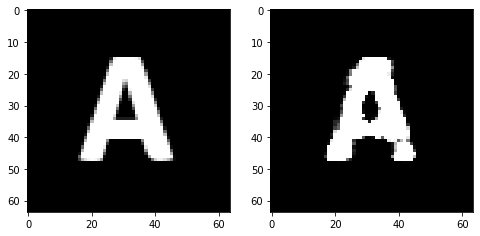

Epoch 162, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6554289497435093, Loss SSIM 2.2366790771484375, Loss Local 186.1202220916748


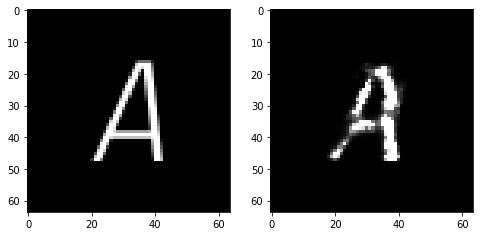

Epoch 162, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.603180207312107, Loss SSIM 2.0904451608657837, Loss Local 188.2349534034729


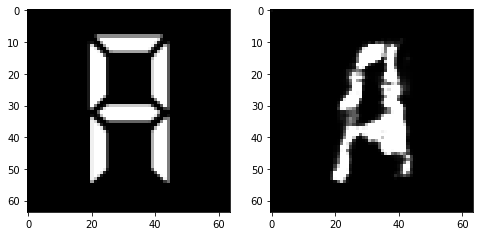

Epoch 162, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6166917346417904, Loss SSIM 2.1967076659202576, Loss Local 186.52361392974854


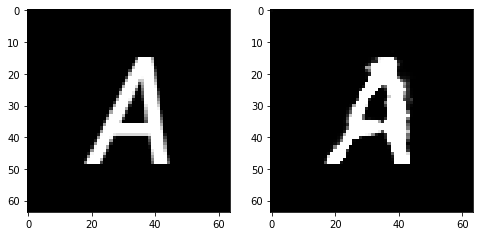

Epoch 162, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6913585290312767, Loss SSIM 2.3436502814292908, Loss Local 186.40778160095215


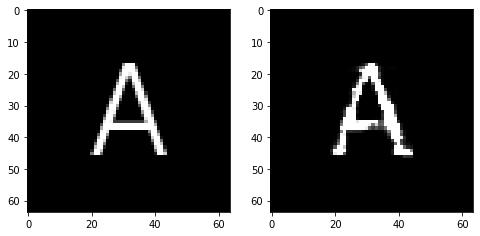

Epoch 162, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6564958915114403, Loss SSIM 2.2231404185295105, Loss Local 182.9719386100769


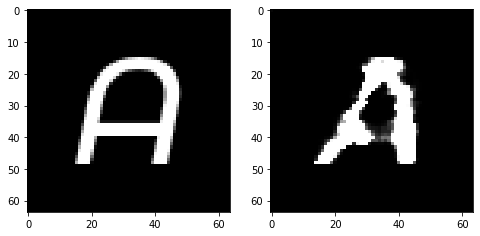

Epoch 163, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06340733915567398, Loss SSIM 0.08033937215805054, Loss Local 6.710692405700684


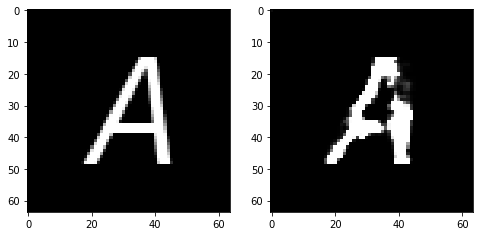

Epoch 163, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6568488664925098, Loss SSIM 2.2263712882995605, Loss Local 195.31343126296997


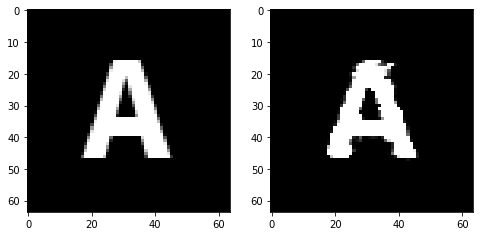

Epoch 163, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6709221415221691, Loss SSIM 2.3107075691223145, Loss Local 182.83558750152588


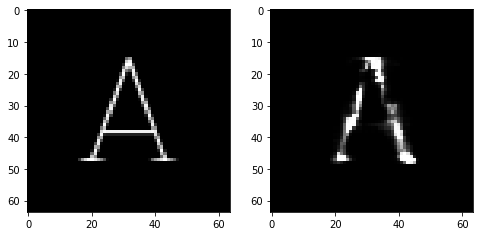

Epoch 163, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.672476477921009, Loss SSIM 2.2642139196395874, Loss Local 177.97562265396118


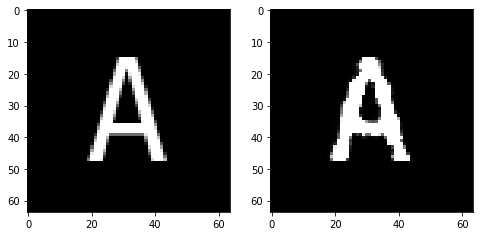

Epoch 163, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6330920308828354, Loss SSIM 2.165877342224121, Loss Local 187.12945795059204


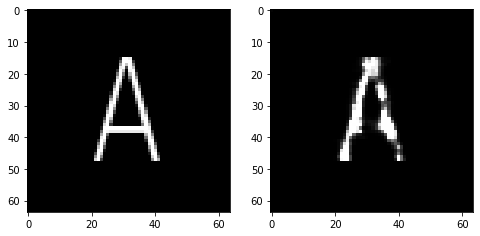

Epoch 163, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6580920852720737, Loss SSIM 2.301844894886017, Loss Local 189.15586471557617


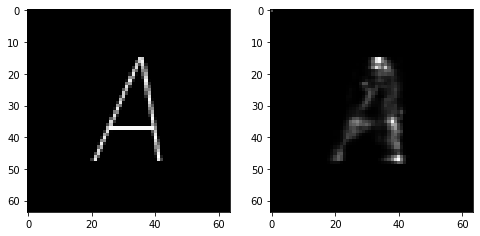

Epoch 163, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5916787907481194, Loss SSIM 2.1086132526397705, Loss Local 177.36225080490112


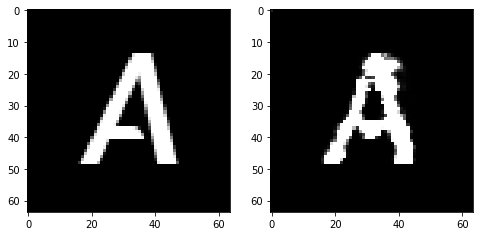

Epoch 163, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6640338972210884, Loss SSIM 2.2451906204223633, Loss Local 179.00488901138306


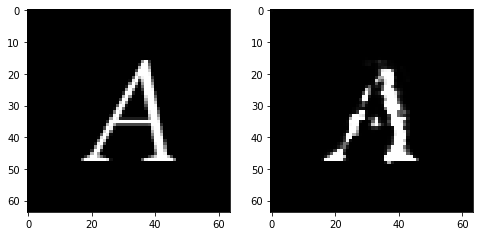

Epoch 164, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06415051966905594, Loss SSIM 0.09027993679046631, Loss Local 7.356739044189453


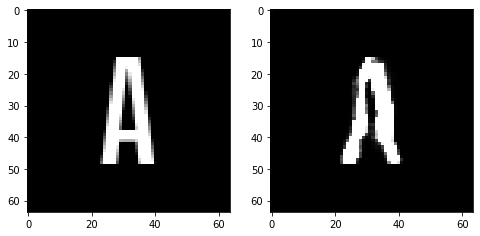

Epoch 164, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5656364746391773, Loss SSIM 2.12166166305542, Loss Local 176.608069896698


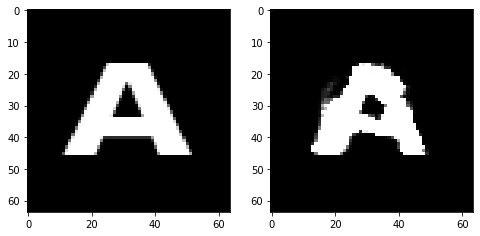

Epoch 164, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6878453306853771, Loss SSIM 2.2621055841445923, Loss Local 183.1183271408081


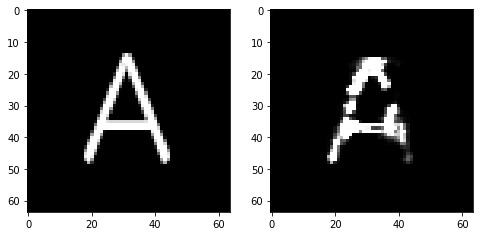

Epoch 164, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.641844317317009, Loss SSIM 2.201285421848297, Loss Local 184.63690042495728


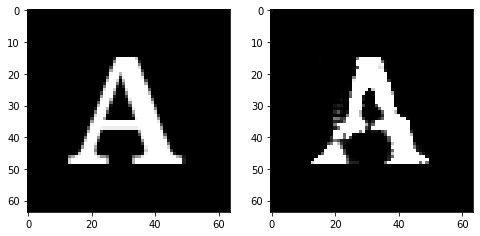

Epoch 164, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6479267068207264, Loss SSIM 2.2212451100349426, Loss Local 190.60620737075806


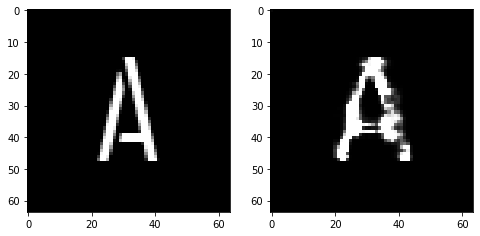

Epoch 164, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.704109814018011, Loss SSIM 2.3208741545677185, Loss Local 193.69677734375


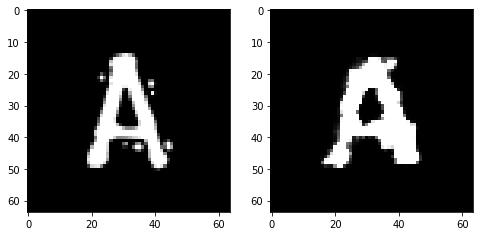

Epoch 164, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.624199040234089, Loss SSIM 2.1860122084617615, Loss Local 187.18306398391724


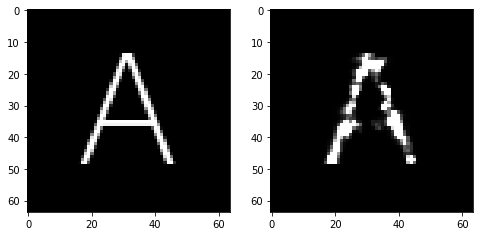

Epoch 164, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6526091061532497, Loss SSIM 2.260192573070526, Loss Local 188.1847062110901


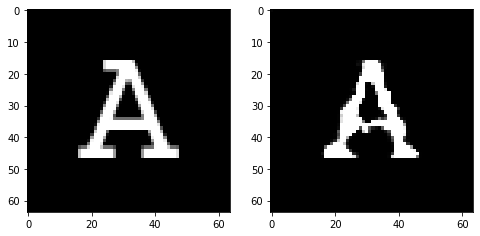

Epoch 165, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.061331264674663544, Loss SSIM 0.09691566228866577, Loss Local 8.30640983581543


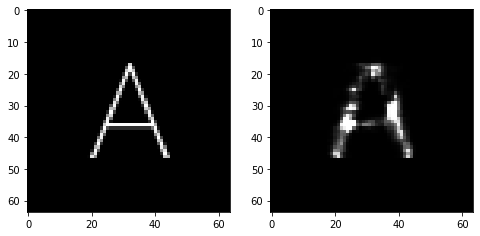

Epoch 165, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6798435971140862, Loss SSIM 2.2403454780578613, Loss Local 188.4043836593628


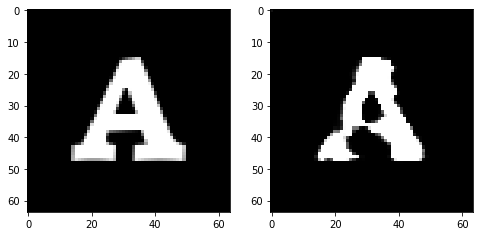

Epoch 165, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.643453512340784, Loss SSIM 2.2495436668395996, Loss Local 185.8038148880005


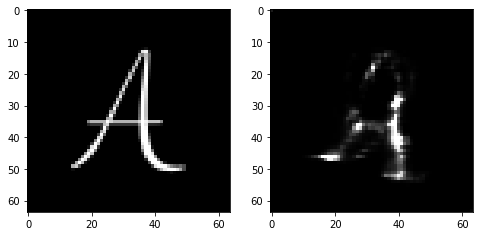

Epoch 165, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6467169113457203, Loss SSIM 2.2244810461997986, Loss Local 181.79245710372925


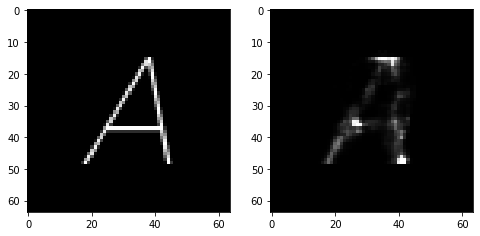

Epoch 165, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.711079191416502, Loss SSIM 2.304969847202301, Loss Local 173.36377382278442


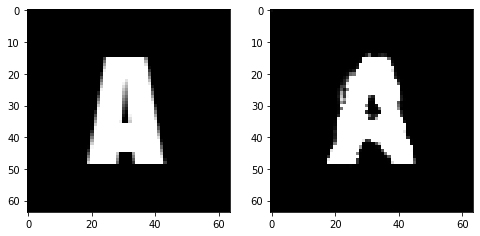

Epoch 165, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6457687243819237, Loss SSIM 2.2380114793777466, Loss Local 181.18124628067017


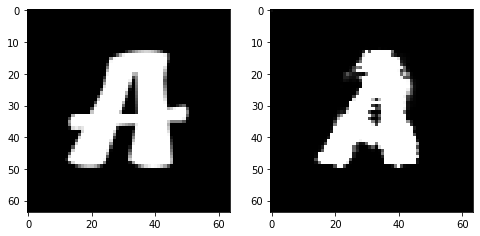

Epoch 165, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5996325239539146, Loss SSIM 2.1759838461875916, Loss Local 179.92917823791504


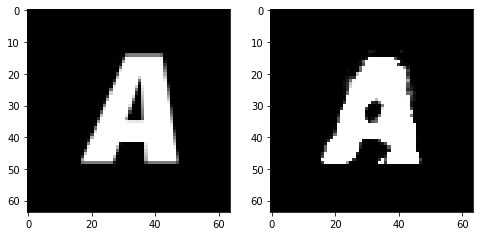

Epoch 165, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6635477468371391, Loss SSIM 2.2897189259529114, Loss Local 188.2955265045166


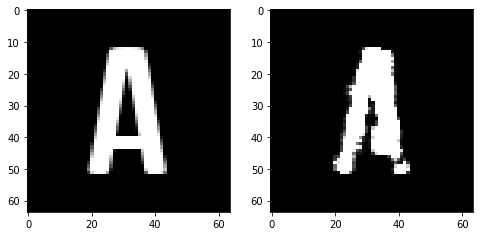

Epoch 166, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06285396963357925, Loss SSIM 0.10164749622344971, Loss Local 6.3096723556518555


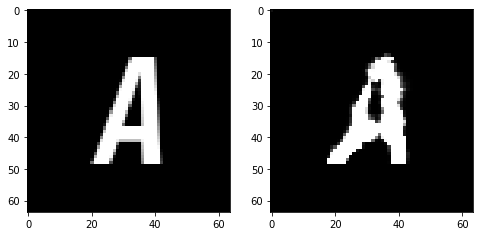

Epoch 166, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.617949228733778, Loss SSIM 2.1853185296058655, Loss Local 188.92477893829346


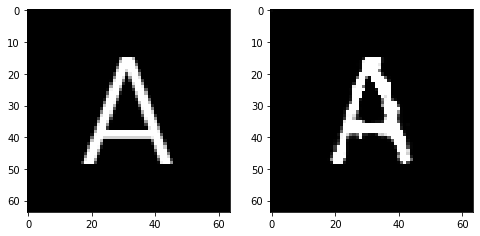

Epoch 166, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6670459173619747, Loss SSIM 2.251774251461029, Loss Local 176.39976978302002


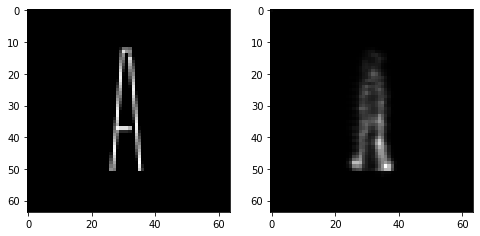

Epoch 166, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6394321657717228, Loss SSIM 2.243912100791931, Loss Local 187.53788661956787


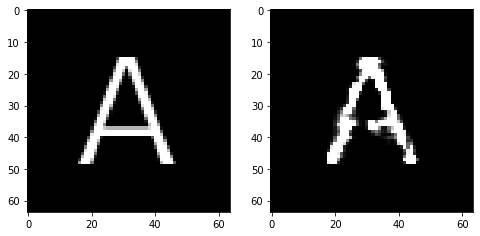

Epoch 166, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6689085252583027, Loss SSIM 2.2202277183532715, Loss Local 199.39323091506958


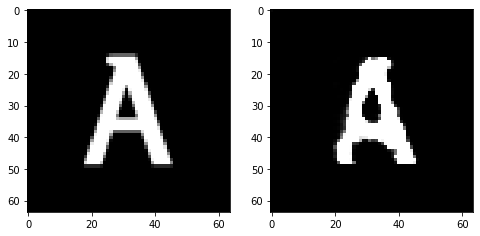

Epoch 166, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651752296835184, Loss SSIM 2.2928466796875, Loss Local 185.49058628082275


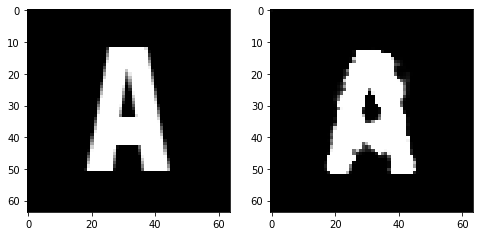

Epoch 166, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6414088197052479, Loss SSIM 2.216421604156494, Loss Local 184.63620281219482


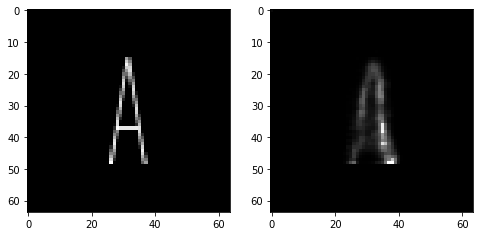

Epoch 166, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.626891616731882, Loss SSIM 2.1708127856254578, Loss Local 181.2825150489807


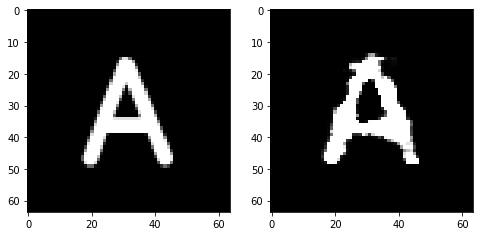

Epoch 167, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05829065665602684, Loss SSIM 0.07377457618713379, Loss Local 8.91557788848877


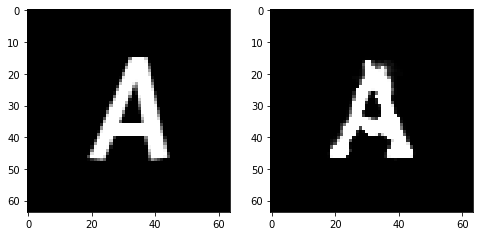

Epoch 167, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5662610866129398, Loss SSIM 2.1237359046936035, Loss Local 182.22007083892822


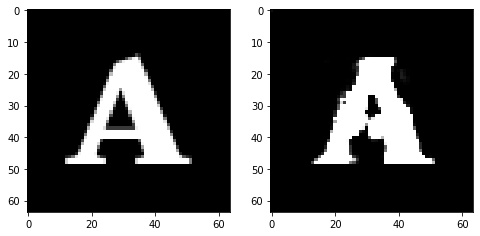

Epoch 167, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5874908827245235, Loss SSIM 2.120156705379486, Loss Local 170.4321804046631


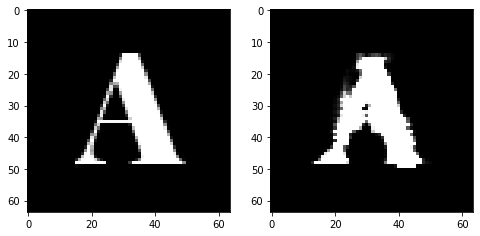

Epoch 167, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6322631277143955, Loss SSIM 2.2164918780326843, Loss Local 184.99021911621094


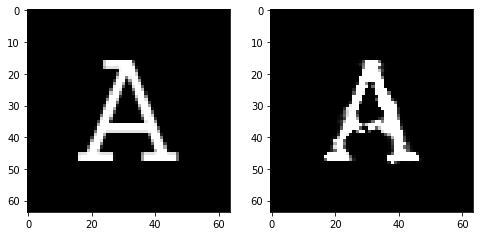

Epoch 167, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.694733303040266, Loss SSIM 2.23589950799942, Loss Local 194.39273929595947


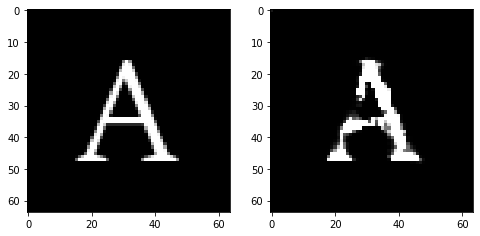

Epoch 167, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6697391793131828, Loss SSIM 2.261326253414154, Loss Local 192.35802745819092


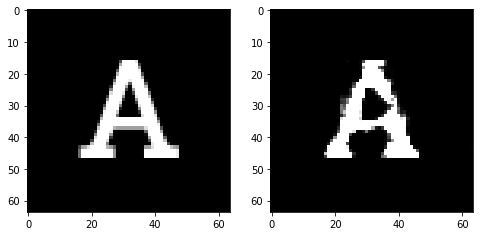

Epoch 167, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6863637641072273, Loss SSIM 2.2369332909584045, Loss Local 184.5758867263794


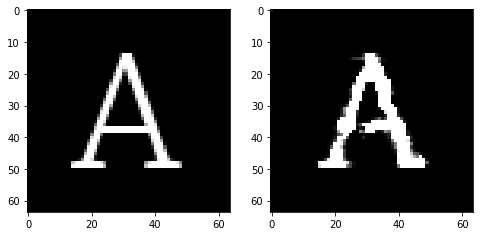

Epoch 167, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.699199553579092, Loss SSIM 2.3267306685447693, Loss Local 188.89122867584229


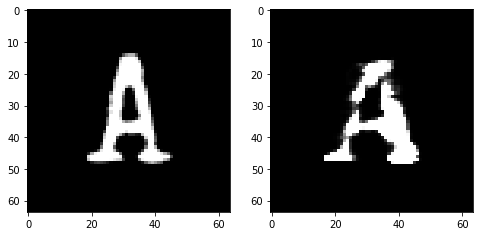

Epoch 168, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06623205542564392, Loss SSIM 0.09597992897033691, Loss Local 7.990110397338867


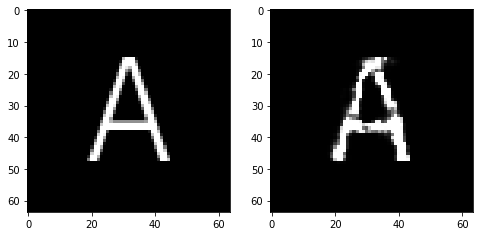

Epoch 168, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6934237256646156, Loss SSIM 2.2890031933784485, Loss Local 189.57571744918823


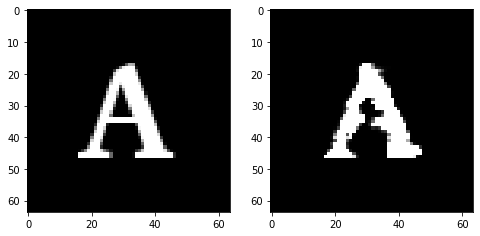

Epoch 168, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.587978821247816, Loss SSIM 2.122168481349945, Loss Local 189.20048189163208


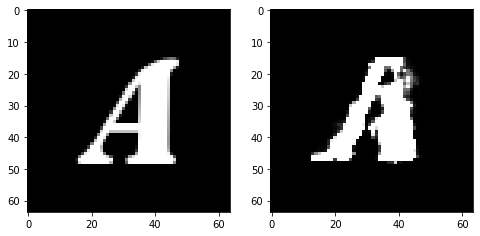

Epoch 168, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6552089639008045, Loss SSIM 2.238411247730255, Loss Local 188.33005666732788


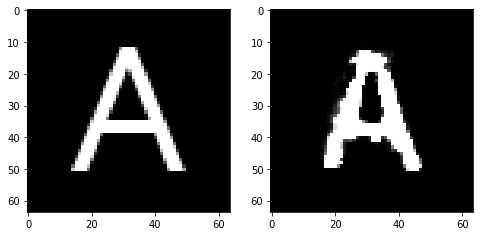

Epoch 168, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6281274147331715, Loss SSIM 2.174486994743347, Loss Local 180.39205598831177


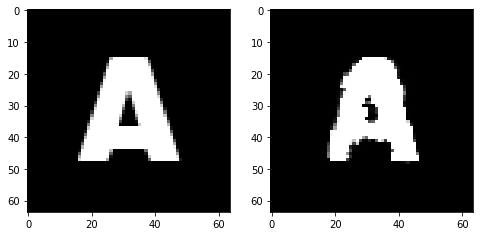

Epoch 168, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.651322402060032, Loss SSIM 2.2902289628982544, Loss Local 192.76088666915894


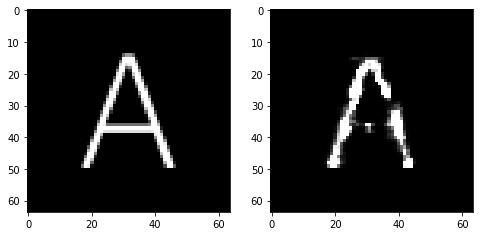

Epoch 168, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7009629607200623, Loss SSIM 2.324093282222748, Loss Local 189.26138591766357


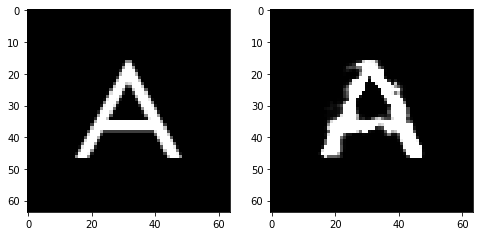

Epoch 168, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6556906327605247, Loss SSIM 2.2518950700759888, Loss Local 188.96425342559814


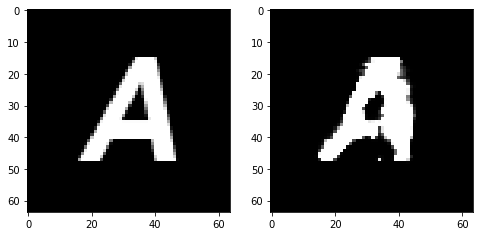

Epoch 169, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07084248214960098, Loss SSIM 0.09706860780715942, Loss Local 6.844851016998291


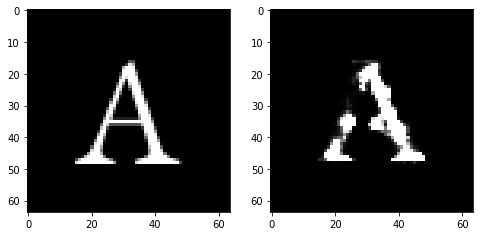

Epoch 169, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6543033942580223, Loss SSIM 2.273702323436737, Loss Local 182.1419596672058


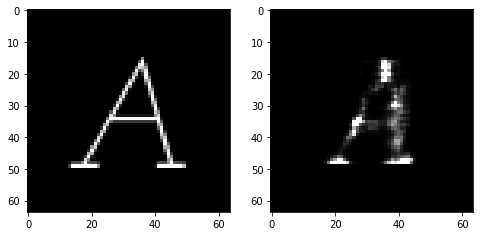

Epoch 169, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6858246847987175, Loss SSIM 2.2621545791625977, Loss Local 190.44008541107178


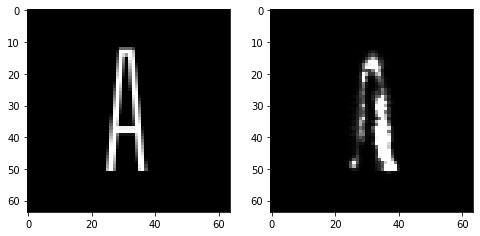

Epoch 169, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6610363386571407, Loss SSIM 2.2570104598999023, Loss Local 177.43469429016113


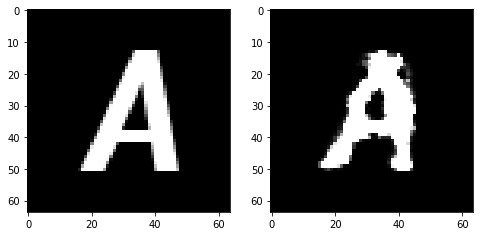

Epoch 169, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6184284798800945, Loss SSIM 2.2136751413345337, Loss Local 186.52535724639893


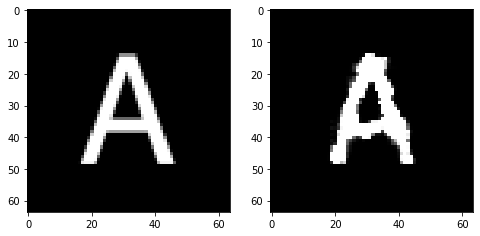

Epoch 169, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6524084508419037, Loss SSIM 2.24169260263443, Loss Local 182.4268078804016


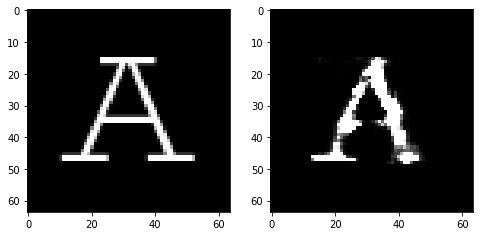

Epoch 169, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6319446489214897, Loss SSIM 2.18282949924469, Loss Local 189.43989992141724


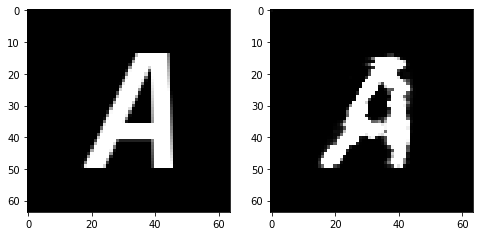

Epoch 169, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6893573701381683, Loss SSIM 2.2804137468338013, Loss Local 187.75103569030762


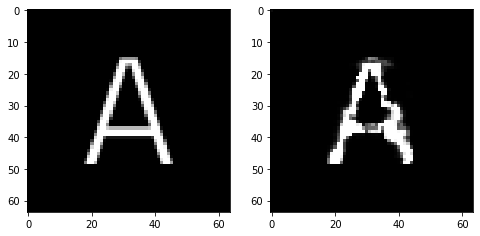

Epoch 170, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.055070824921131134, Loss SSIM 0.06204855442047119, Loss Local 7.138360023498535


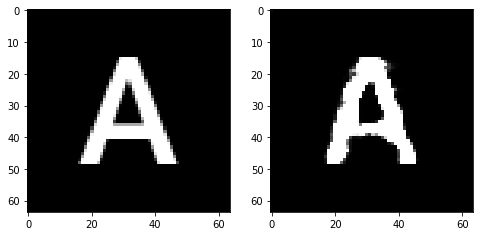

Epoch 170, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6381567753851414, Loss SSIM 2.2435719966888428, Loss Local 174.68884134292603


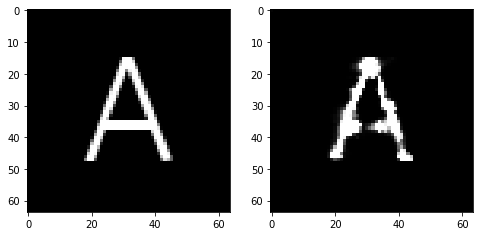

Epoch 170, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6216351576149464, Loss SSIM 2.174458920955658, Loss Local 187.957905292511


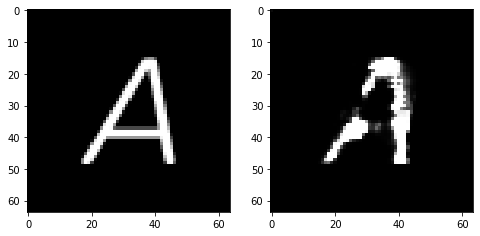

Epoch 170, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7201537378132343, Loss SSIM 2.411531388759613, Loss Local 202.10687446594238


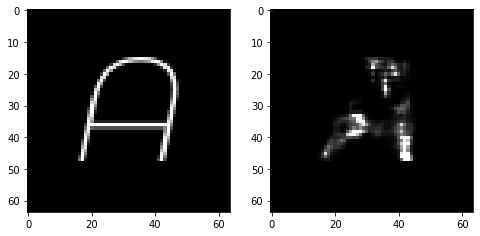

Epoch 170, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6679515205323696, Loss SSIM 2.2432756423950195, Loss Local 180.57571506500244


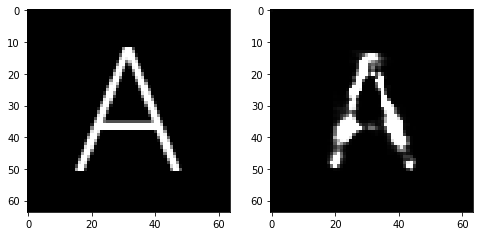

Epoch 170, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5874335691332817, Loss SSIM 2.1371458172798157, Loss Local 184.75955820083618


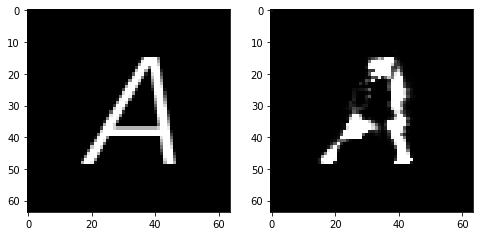

Epoch 170, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6404423229396343, Loss SSIM 2.1360283493995667, Loss Local 187.55821657180786


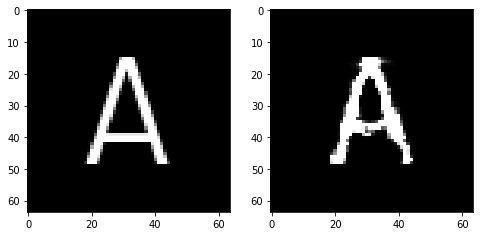

Epoch 170, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6593792289495468, Loss SSIM 2.298710584640503, Loss Local 186.163339138031


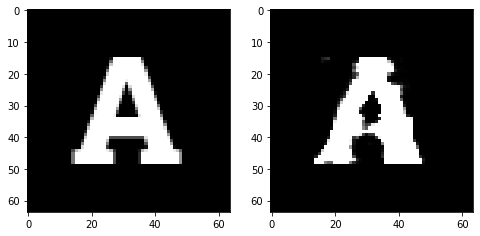

Epoch 171, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06875083595514297, Loss SSIM 0.10019916296005249, Loss Local 6.800719261169434


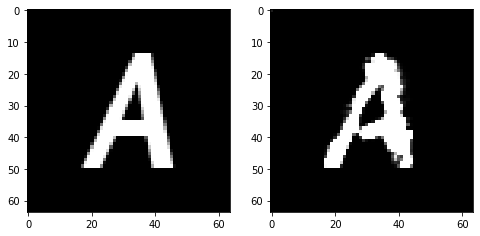

Epoch 171, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6080241054296494, Loss SSIM 2.183821141719818, Loss Local 194.57714700698853


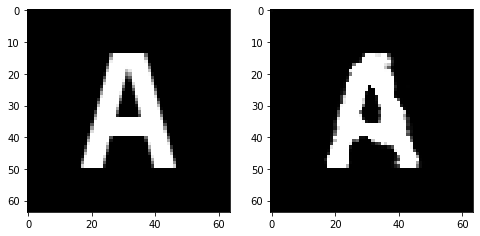

Epoch 171, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6236290074884892, Loss SSIM 2.184908092021942, Loss Local 190.7815761566162


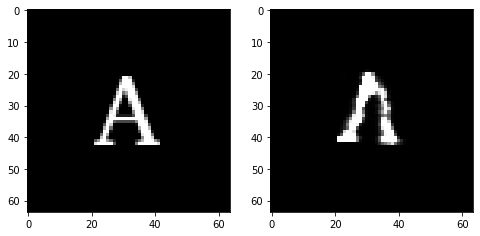

Epoch 171, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6332429908216, Loss SSIM 2.1903195977211, Loss Local 185.29449319839478


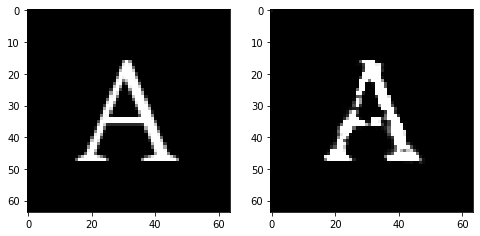

Epoch 171, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6236425824463367, Loss SSIM 2.1394683122634888, Loss Local 184.40473461151123


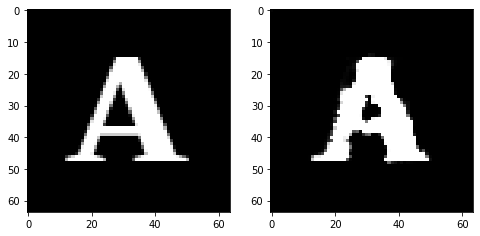

Epoch 171, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.675954818725586, Loss SSIM 2.279918074607849, Loss Local 182.32019662857056


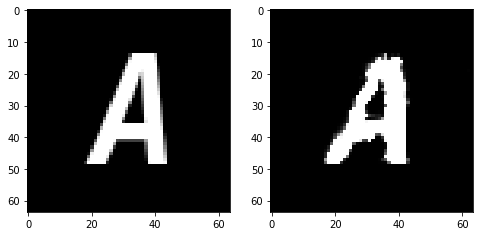

Epoch 171, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.644508931785822, Loss SSIM 2.2146795988082886, Loss Local 185.02133178710938


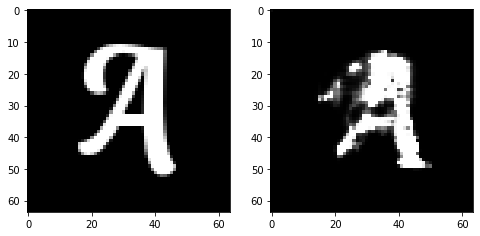

Epoch 171, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7173035144805908, Loss SSIM 2.3893258571624756, Loss Local 192.2646608352661


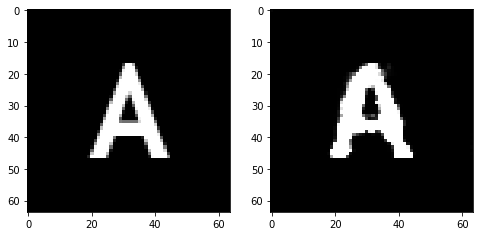

Epoch 172, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07020070403814316, Loss SSIM 0.09207898378372192, Loss Local 10.029714584350586


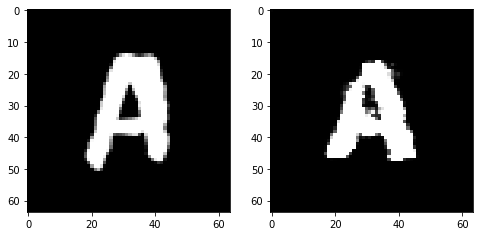

Epoch 172, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6498232670128345, Loss SSIM 2.237354099750519, Loss Local 185.59211921691895


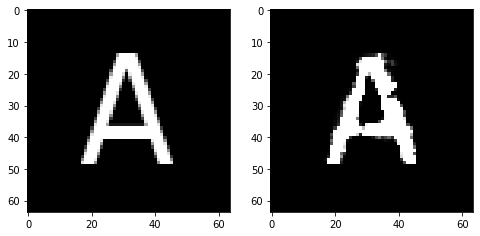

Epoch 172, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6786921136081219, Loss SSIM 2.325659930706024, Loss Local 187.90138721466064


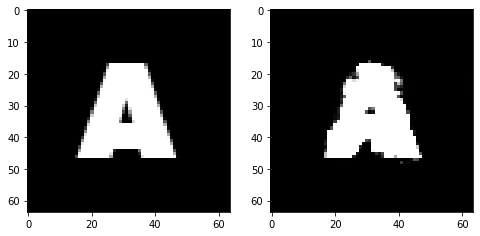

Epoch 172, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.678940188139677, Loss SSIM 2.3214985728263855, Loss Local 188.24319887161255


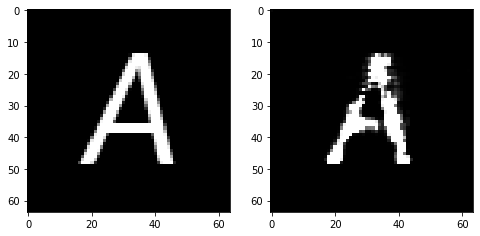

Epoch 172, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6535022780299187, Loss SSIM 2.1868075132369995, Loss Local 180.34920692443848


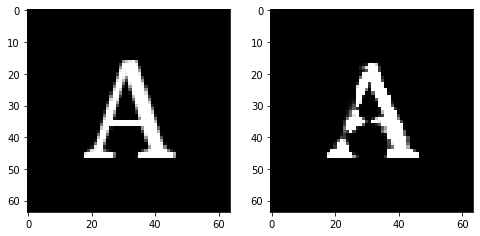

Epoch 172, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6119299083948135, Loss SSIM 2.1114169359207153, Loss Local 187.2826099395752


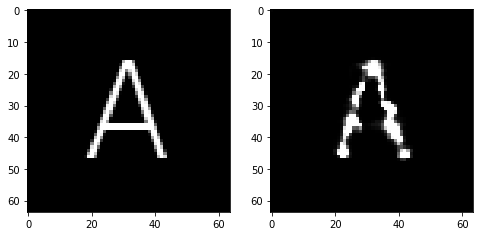

Epoch 172, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6532546617090702, Loss SSIM 2.2389597296714783, Loss Local 186.0853304862976


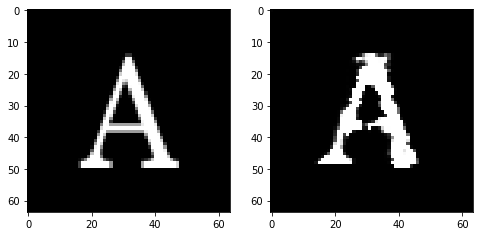

Epoch 172, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.653213456273079, Loss SSIM 2.264180600643158, Loss Local 195.3325538635254


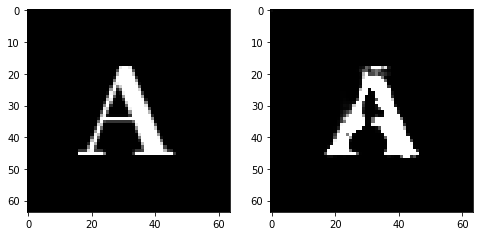

Epoch 173, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06025185436010361, Loss SSIM 0.09379327297210693, Loss Local 6.998347282409668


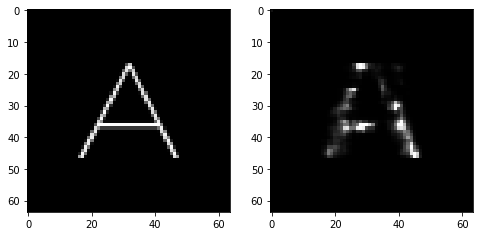

Epoch 173, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.624419927597046, Loss SSIM 2.2228907346725464, Loss Local 183.99032354354858


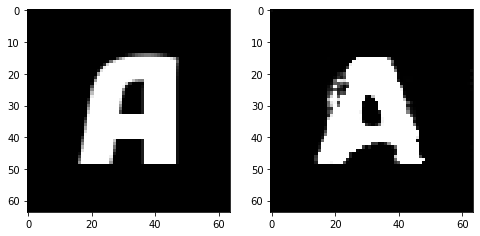

Epoch 173, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.621151439845562, Loss SSIM 2.2157976031303406, Loss Local 180.80210828781128


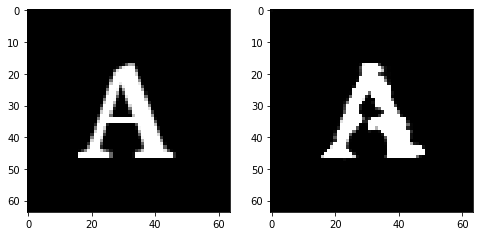

Epoch 173, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6336472257971764, Loss SSIM 2.1948350071907043, Loss Local 173.09797525405884


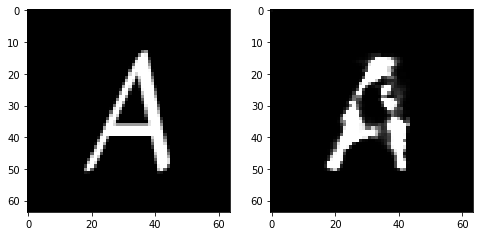

Epoch 173, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6118842139840126, Loss SSIM 2.1147956252098083, Loss Local 186.70720434188843


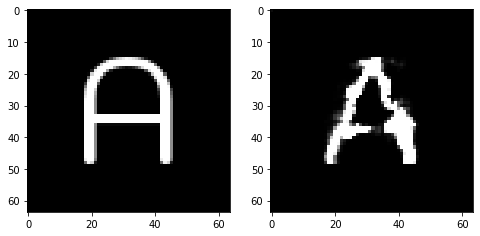

Epoch 173, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.682323582470417, Loss SSIM 2.2769412994384766, Loss Local 191.2236566543579


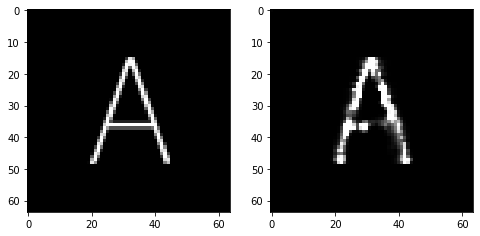

Epoch 173, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6717620342969894, Loss SSIM 2.1956191062927246, Loss Local 178.08471965789795


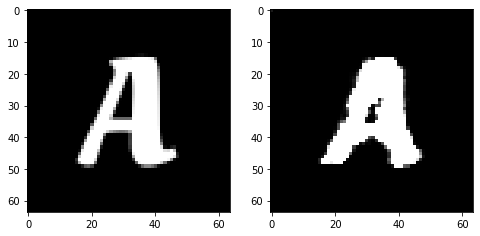

Epoch 173, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6709652952849865, Loss SSIM 2.263868570327759, Loss Local 180.0446343421936


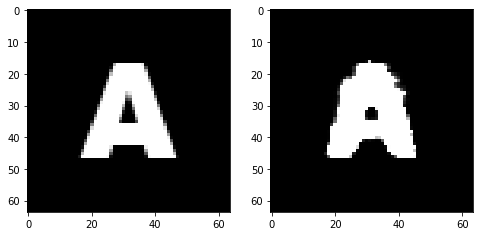

Epoch 174, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06891882419586182, Loss SSIM 0.10887068510055542, Loss Local 6.98582649230957


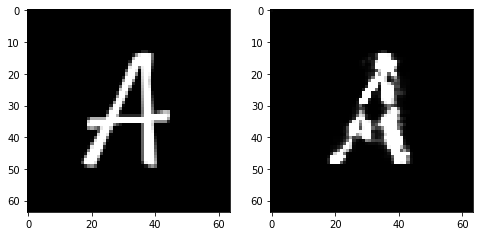

Epoch 174, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6640026196837425, Loss SSIM 2.2341054677963257, Loss Local 189.44275426864624


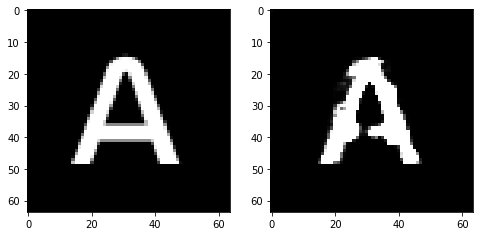

Epoch 174, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6129742003977299, Loss SSIM 2.132822036743164, Loss Local 185.1918501853943


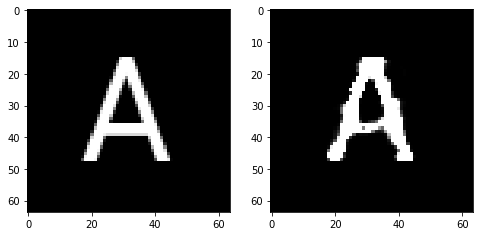

Epoch 174, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6634752824902534, Loss SSIM 2.2909539937973022, Loss Local 187.256196975708


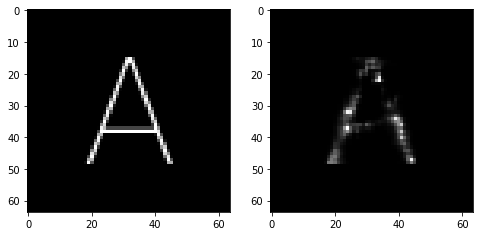

Epoch 174, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6626092791557312, Loss SSIM 2.2348145246505737, Loss Local 172.9580979347229


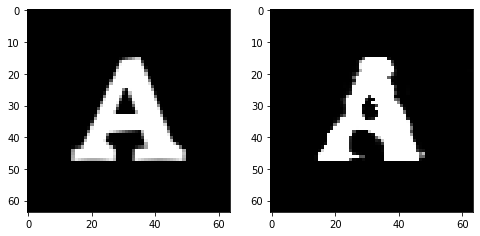

Epoch 174, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6223853565752506, Loss SSIM 2.2292221784591675, Loss Local 174.87546396255493


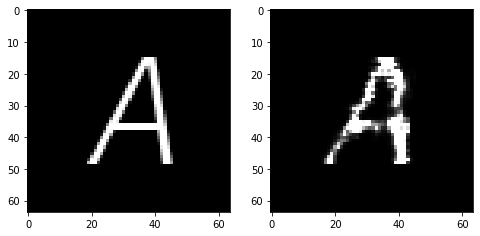

Epoch 174, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6590904295444489, Loss SSIM 2.209957540035248, Loss Local 188.95992612838745


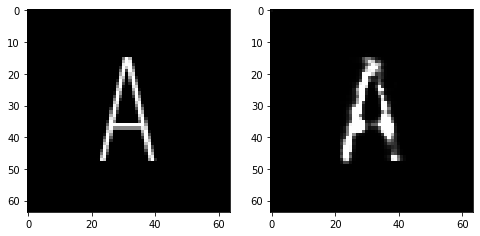

Epoch 174, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.676992479711771, Loss SSIM 2.3493335843086243, Loss Local 196.44540119171143


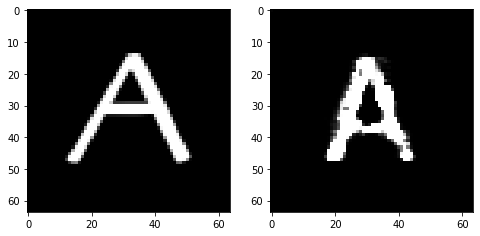

Epoch 175, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06570803374052048, Loss SSIM 0.07893228530883789, Loss Local 9.484712600708008


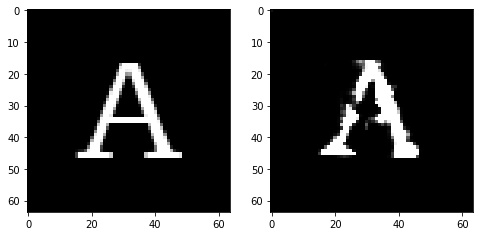

Epoch 175, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6838297210633755, Loss SSIM 2.231695294380188, Loss Local 182.91796445846558


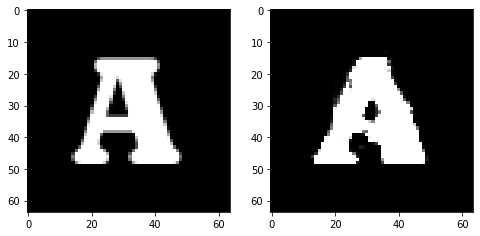

Epoch 175, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.705113910138607, Loss SSIM 2.409912407398224, Loss Local 192.33137130737305


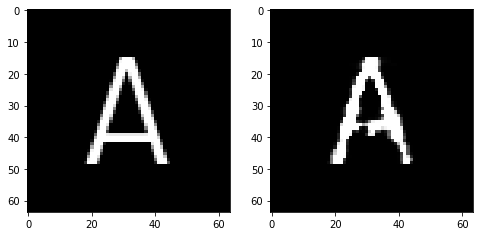

Epoch 175, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6463768370449543, Loss SSIM 2.1559759974479675, Loss Local 186.79880142211914


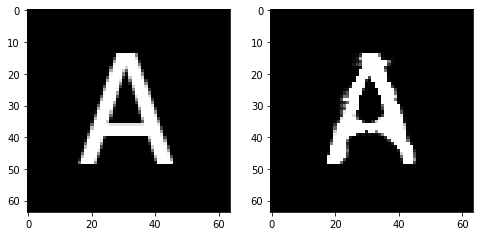

Epoch 175, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.676787231117487, Loss SSIM 2.287852466106415, Loss Local 189.4327630996704


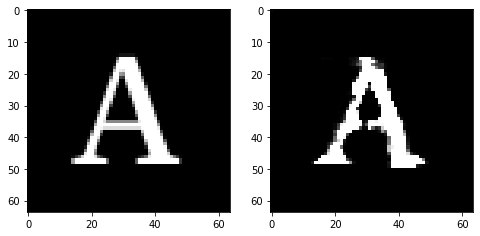

Epoch 175, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6463111154735088, Loss SSIM 2.2435166239738464, Loss Local 194.25710916519165


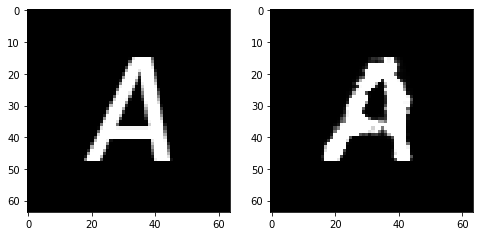

Epoch 175, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6357321068644524, Loss SSIM 2.1901700496673584, Loss Local 182.94672536849976


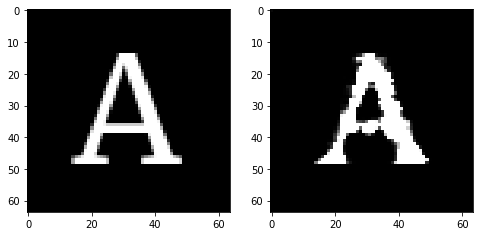

Epoch 175, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6145273968577385, Loss SSIM 2.1771937012672424, Loss Local 185.53531551361084


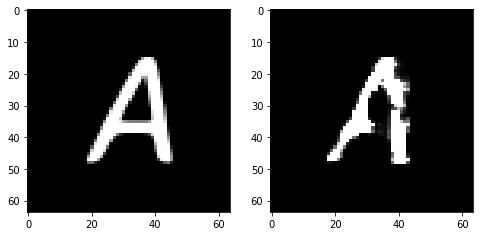

Epoch 176, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07592930644750595, Loss SSIM 0.10865926742553711, Loss Local 8.114691734313965


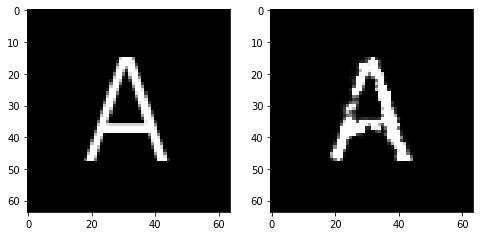

Epoch 176, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6739099435508251, Loss SSIM 2.245906174182892, Loss Local 192.69279050827026


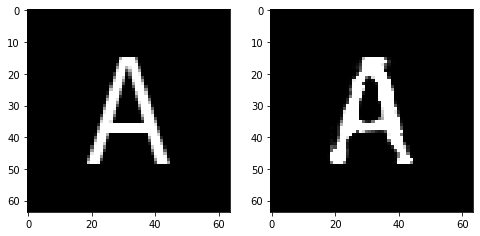

Epoch 176, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6059677340090275, Loss SSIM 2.117428958415985, Loss Local 179.68097162246704


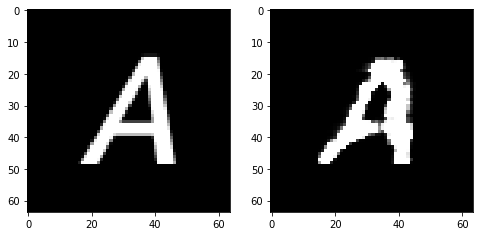

Epoch 176, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6304243057966232, Loss SSIM 2.223852515220642, Loss Local 182.8106861114502


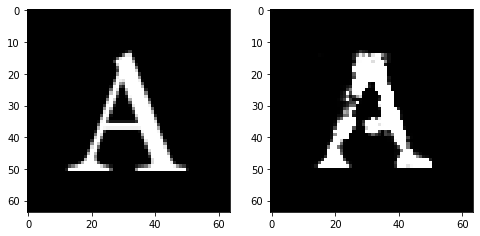

Epoch 176, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.671711552888155, Loss SSIM 2.277737319469452, Loss Local 190.8018560409546


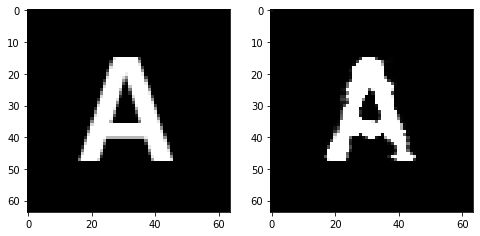

Epoch 176, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6240027956664562, Loss SSIM 2.1696741580963135, Loss Local 184.10508966445923


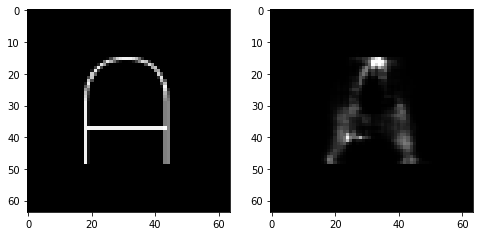

Epoch 176, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6363277547061443, Loss SSIM 2.2393177151679993, Loss Local 192.36967039108276


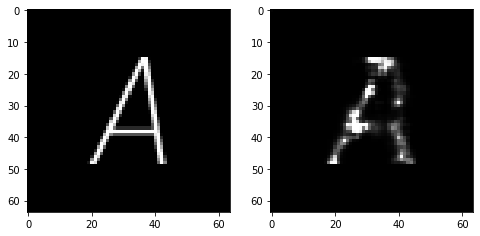

Epoch 176, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6846985332667828, Loss SSIM 2.2961061000823975, Loss Local 195.05641269683838


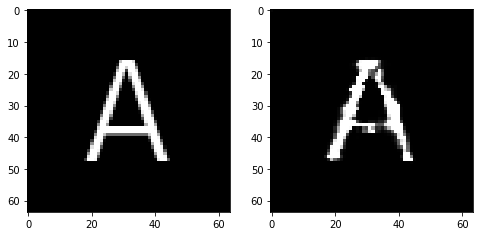

Epoch 177, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06239183247089386, Loss SSIM 0.08570748567581177, Loss Local 8.452911376953125


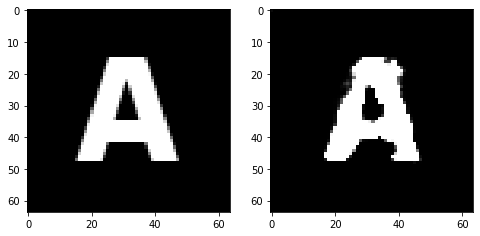

Epoch 177, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6317994818091393, Loss SSIM 2.231640338897705, Loss Local 186.57589960098267


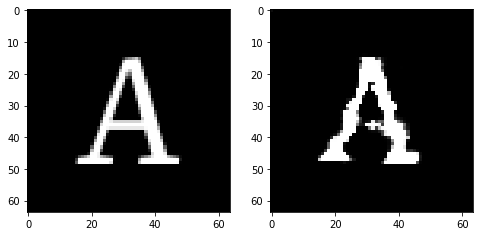

Epoch 177, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6457734666764736, Loss SSIM 2.2485538125038147, Loss Local 180.65914821624756


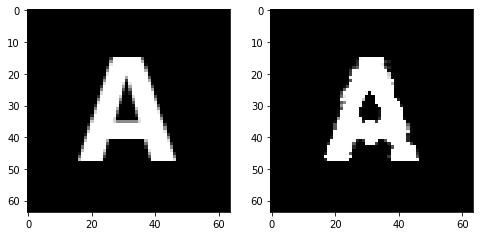

Epoch 177, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6195354834198952, Loss SSIM 2.1292781233787537, Loss Local 180.49997997283936


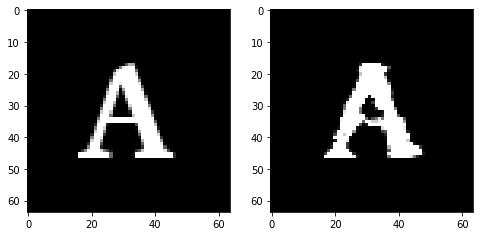

Epoch 177, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6350445821881294, Loss SSIM 2.236099362373352, Loss Local 179.39807844161987


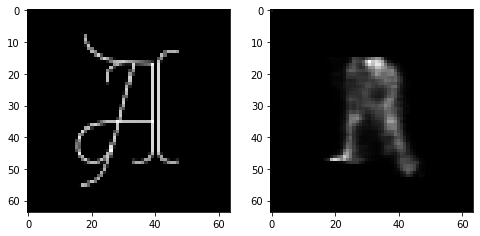

Epoch 177, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6403839103877544, Loss SSIM 2.222121000289917, Loss Local 197.9474925994873


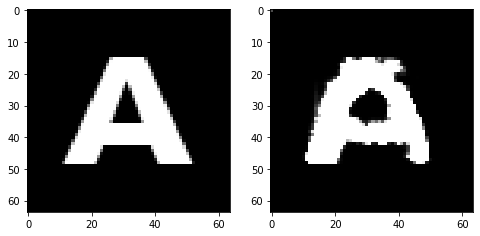

Epoch 177, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.663295391947031, Loss SSIM 2.272557556629181, Loss Local 186.16574382781982


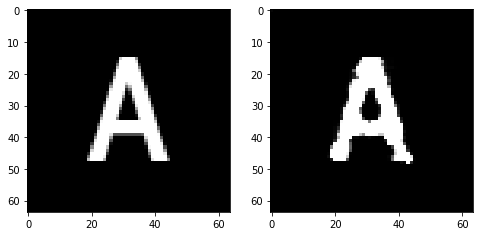

Epoch 177, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.699383195489645, Loss SSIM 2.3198603987693787, Loss Local 193.22479438781738


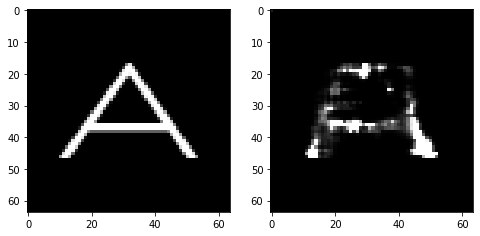

Epoch 178, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06909119337797165, Loss SSIM 0.08709138631820679, Loss Local 8.808463096618652


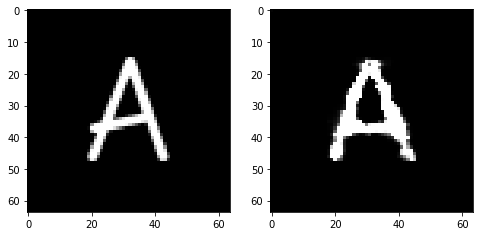

Epoch 178, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7068214863538742, Loss SSIM 2.2825775742530823, Loss Local 194.53001737594604


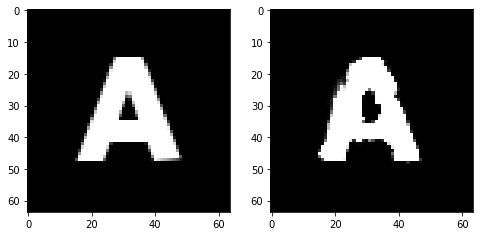

Epoch 178, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6025030314922333, Loss SSIM 2.1140708327293396, Loss Local 180.28678464889526


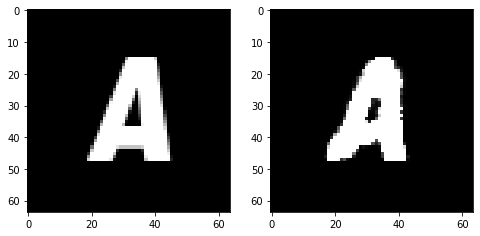

Epoch 178, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.606506198644638, Loss SSIM 2.1427579522132874, Loss Local 179.5076560974121


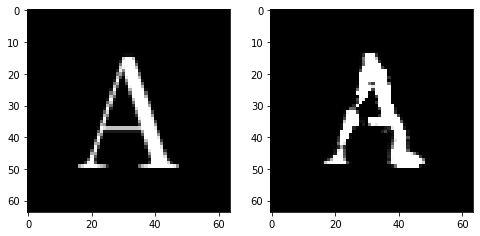

Epoch 178, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6213308051228523, Loss SSIM 2.164000988006592, Loss Local 183.401695728302


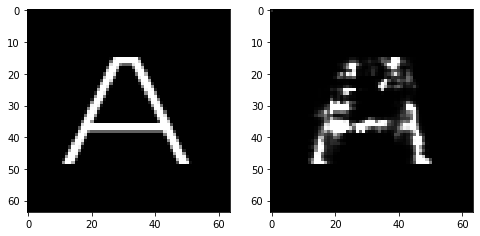

Epoch 178, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6266066581010818, Loss SSIM 2.2178890109062195, Loss Local 182.36690378189087


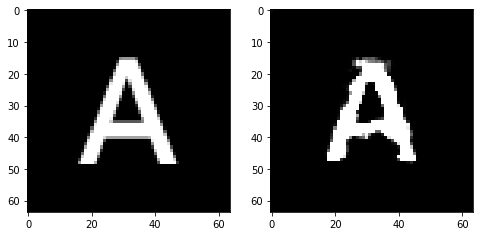

Epoch 178, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.670630156993866, Loss SSIM 2.3028029799461365, Loss Local 186.60090351104736


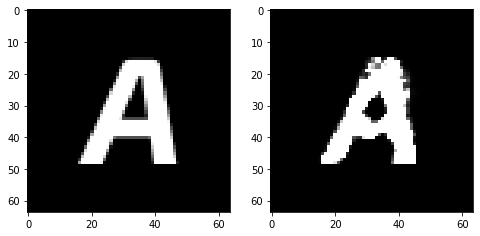

Epoch 178, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6713117882609367, Loss SSIM 2.3065770864486694, Loss Local 184.73165655136108


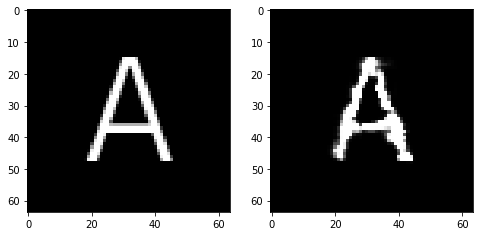

Epoch 179, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07018746435642242, Loss SSIM 0.09048092365264893, Loss Local 8.567055702209473


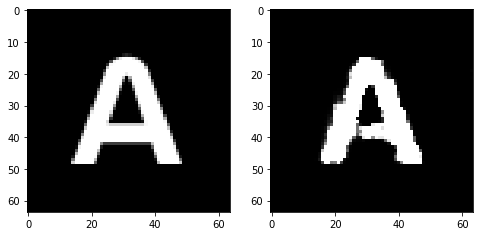

Epoch 179, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.62654734775424, Loss SSIM 2.1496301889419556, Loss Local 183.93720245361328


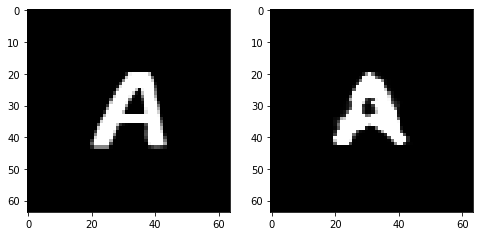

Epoch 179, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6333880200982094, Loss SSIM 2.1936379075050354, Loss Local 171.6635718345642


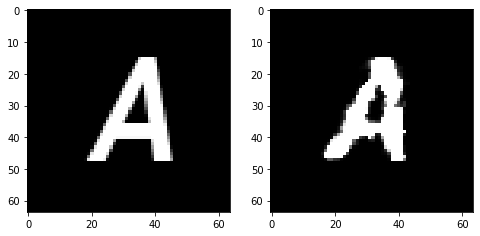

Epoch 179, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6071863137185574, Loss SSIM 2.182314157485962, Loss Local 179.032377243042


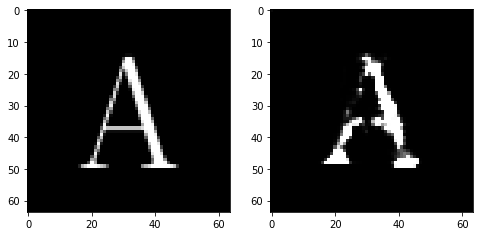

Epoch 179, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5694744437932968, Loss SSIM 2.1352855563163757, Loss Local 172.08664989471436


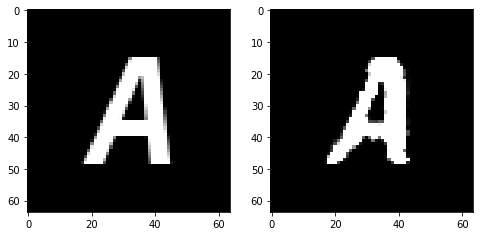

Epoch 179, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6693482026457787, Loss SSIM 2.24522465467453, Loss Local 201.02950429916382


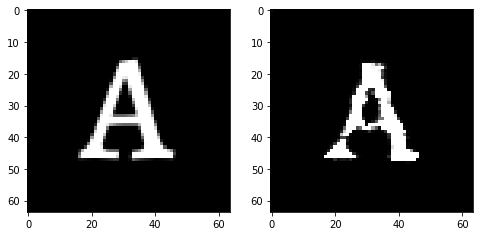

Epoch 179, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.712312687188387, Loss SSIM 2.3624632954597473, Loss Local 198.62338256835938


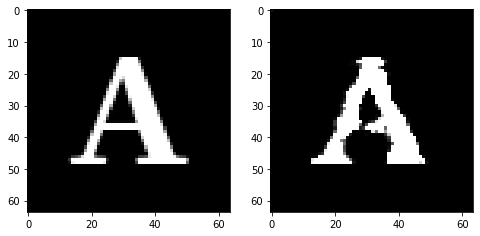

Epoch 179, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.665089227259159, Loss SSIM 2.286504030227661, Loss Local 200.75947284698486


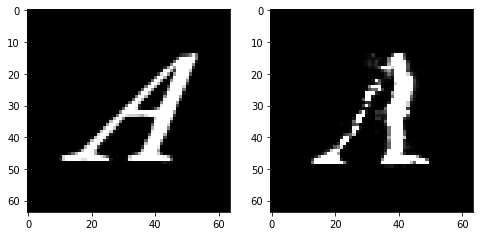

Epoch 180, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06434962898492813, Loss SSIM 0.0830228328704834, Loss Local 7.839564800262451


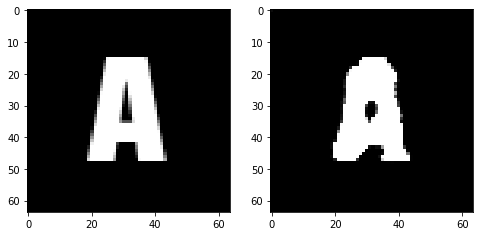

Epoch 180, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6880506239831448, Loss SSIM 2.3086153864860535, Loss Local 202.9937620162964


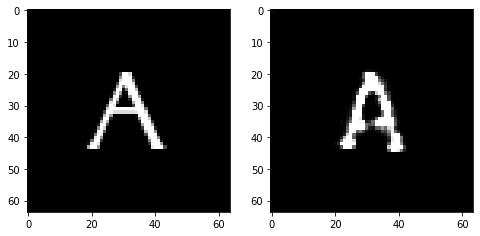

Epoch 180, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.634438507258892, Loss SSIM 2.1962708234786987, Loss Local 176.8493857383728


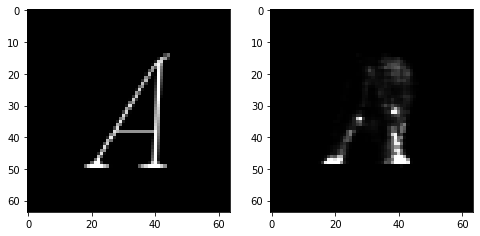

Epoch 180, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.630842186510563, Loss SSIM 2.2221673727035522, Loss Local 177.83580589294434


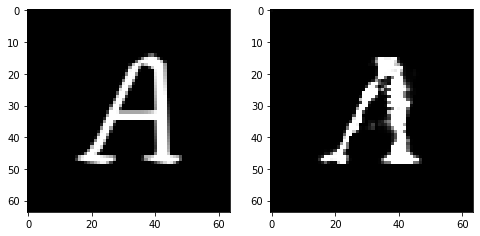

Epoch 180, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6815036348998547, Loss SSIM 2.2926647663116455, Loss Local 184.7807240486145


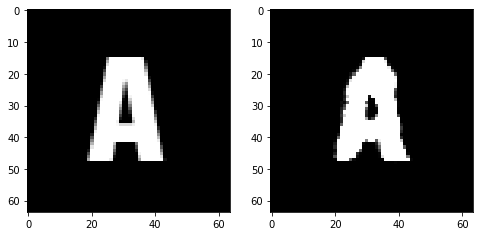

Epoch 180, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6281593479216099, Loss SSIM 2.1441396474838257, Loss Local 186.14024353027344


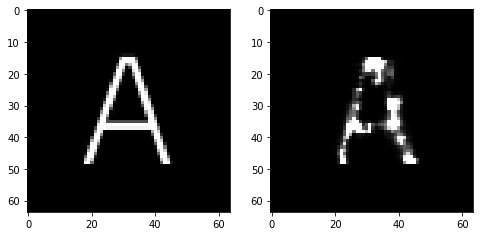

Epoch 180, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6434778235852718, Loss SSIM 2.1989903450012207, Loss Local 188.36986637115479


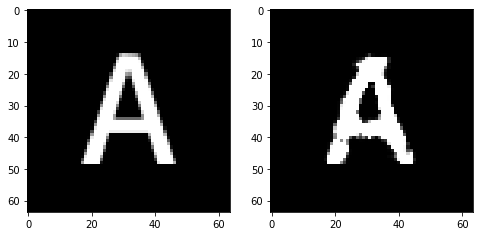

Epoch 180, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6490906327962875, Loss SSIM 2.2789032459259033, Loss Local 178.49249267578125


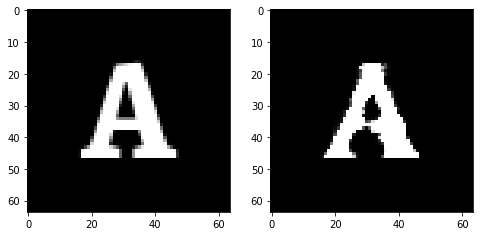

Epoch 181, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.09185711294412613, Loss SSIM 0.12502950429916382, Loss Local 9.462239265441895


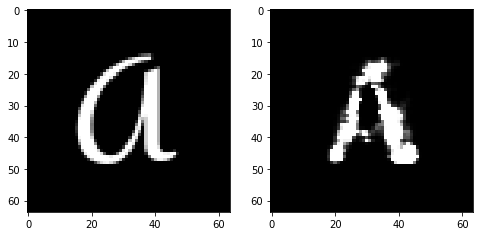

Epoch 181, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6449256986379623, Loss SSIM 2.245928466320038, Loss Local 180.8953137397766


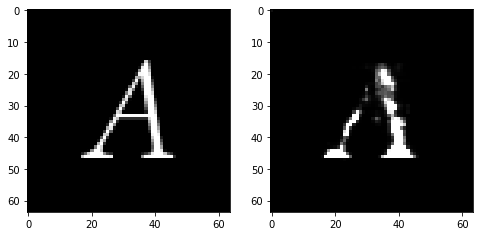

Epoch 181, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6983983218669891, Loss SSIM 2.305871307849884, Loss Local 199.57036209106445


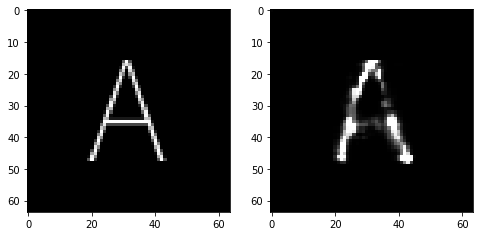

Epoch 181, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6943927221000195, Loss SSIM 2.292803406715393, Loss Local 185.55519437789917


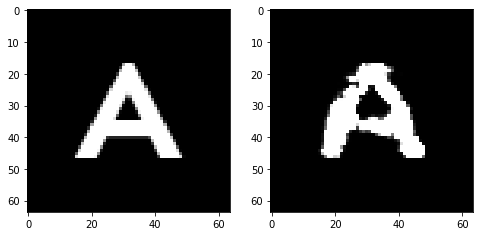

Epoch 181, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6178750284016132, Loss SSIM 2.1975859999656677, Loss Local 183.53336763381958


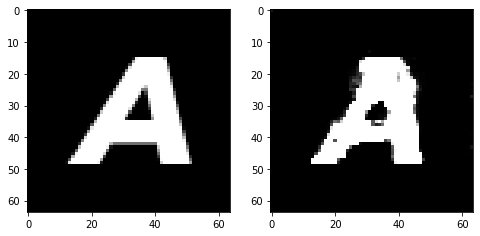

Epoch 181, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5721904337406158, Loss SSIM 2.0794063210487366, Loss Local 166.67408323287964


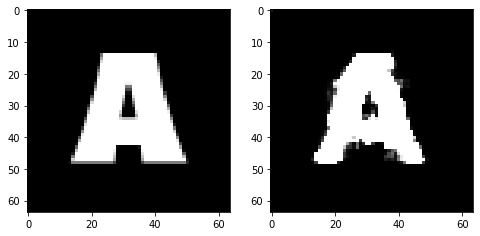

Epoch 181, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6760360933840275, Loss SSIM 2.2296104431152344, Loss Local 181.73005151748657


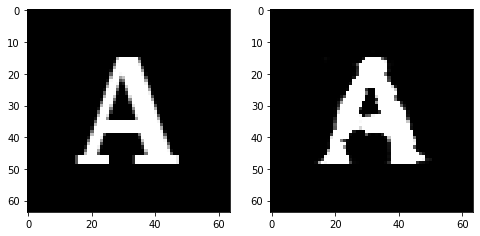

Epoch 181, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.642751395702362, Loss SSIM 2.261615037918091, Loss Local 189.11253595352173


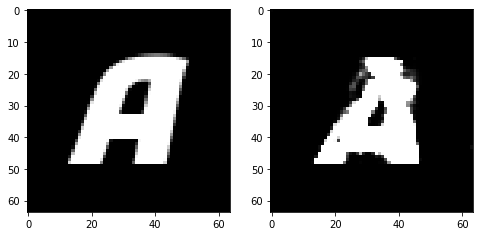

Epoch 182, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06786350160837173, Loss SSIM 0.08771276473999023, Loss Local 9.86497688293457


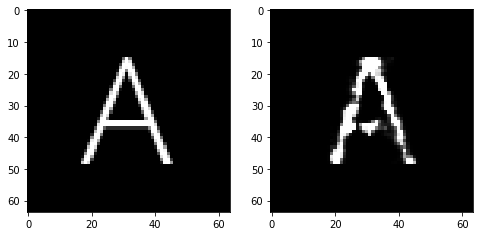

Epoch 182, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6716941930353642, Loss SSIM 2.267679810523987, Loss Local 185.20724248886108


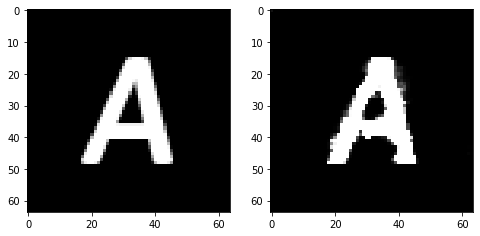

Epoch 182, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6358959414064884, Loss SSIM 2.1625943779945374, Loss Local 183.54250526428223


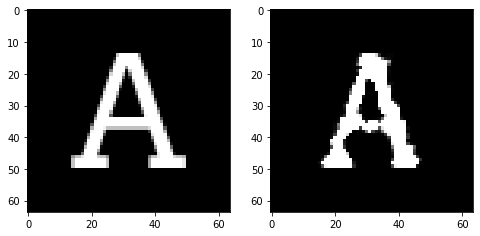

Epoch 182, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6292637214064598, Loss SSIM 2.207154154777527, Loss Local 191.68994188308716


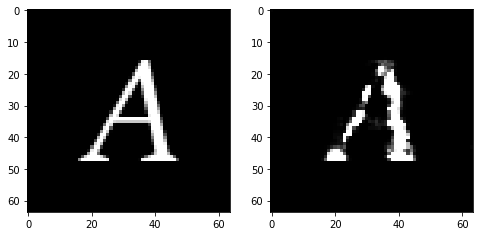

Epoch 182, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6747579015791416, Loss SSIM 2.3217814564704895, Loss Local 193.06078386306763


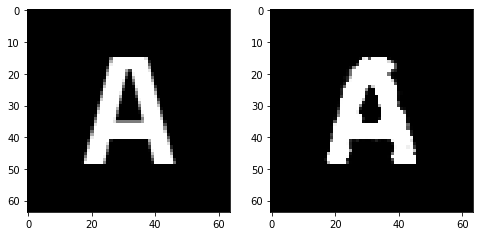

Epoch 182, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.647799078375101, Loss SSIM 2.2322094440460205, Loss Local 177.6643557548523


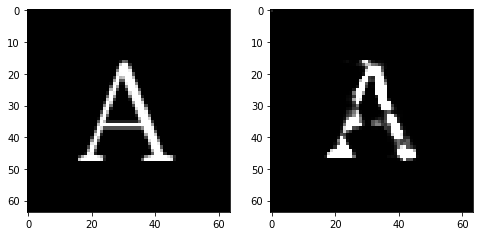

Epoch 182, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6144751235842705, Loss SSIM 2.1574636101722717, Loss Local 187.70562171936035


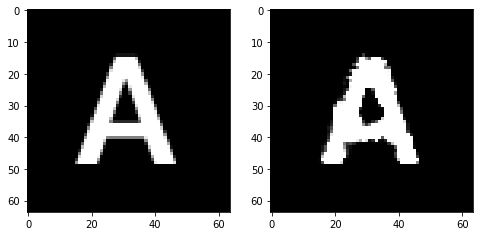

Epoch 182, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6520049571990967, Loss SSIM 2.2548349499702454, Loss Local 185.26284551620483


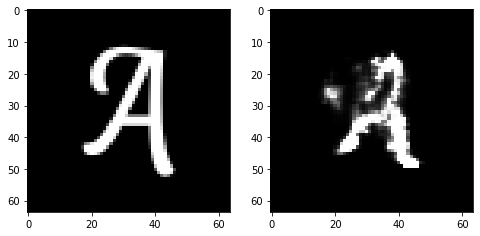

Epoch 183, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0726986974477768, Loss SSIM 0.094363272190094, Loss Local 9.180933952331543


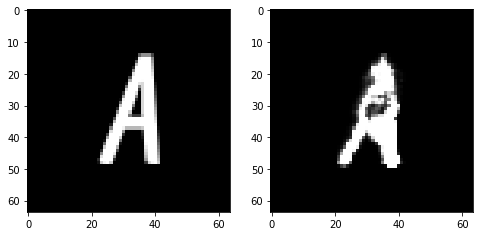

Epoch 183, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6671659648418427, Loss SSIM 2.271023750305176, Loss Local 184.11597156524658


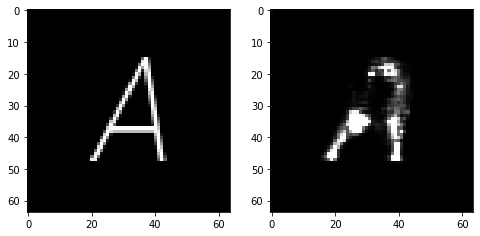

Epoch 183, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6719280369579792, Loss SSIM 2.2841243147850037, Loss Local 191.21530055999756


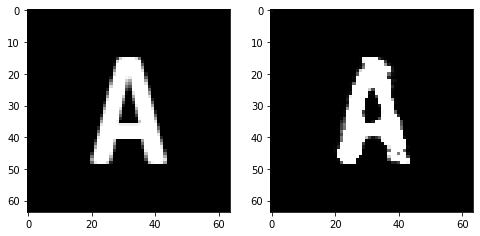

Epoch 183, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6274418197572231, Loss SSIM 2.202646493911743, Loss Local 184.3888783454895


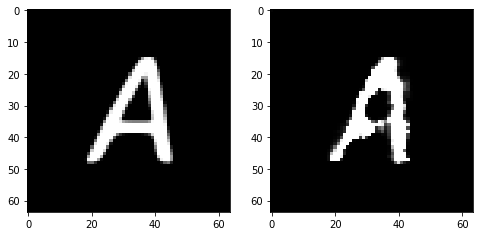

Epoch 183, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6372985653579235, Loss SSIM 2.200231671333313, Loss Local 186.25927257537842


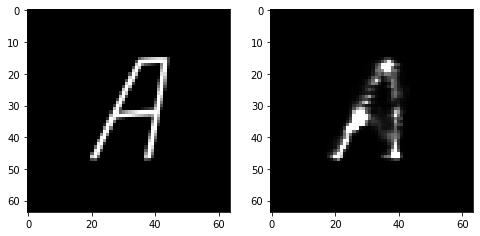

Epoch 183, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6609471589326859, Loss SSIM 2.241684675216675, Loss Local 187.69865942001343


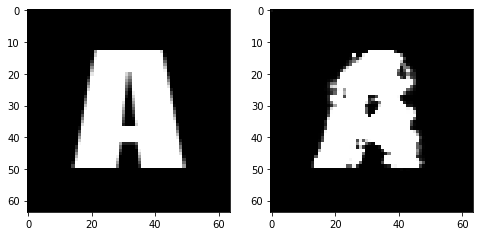

Epoch 183, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6107956245541573, Loss SSIM 2.1927466988563538, Loss Local 182.44597482681274


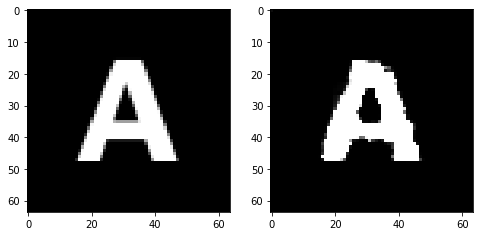

Epoch 183, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6514733247458935, Loss SSIM 2.218768060207367, Loss Local 184.13697576522827


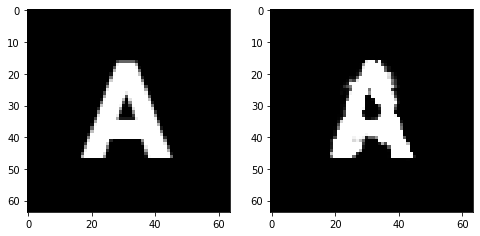

Epoch 184, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05970969423651695, Loss SSIM 0.07964760065078735, Loss Local 7.032871723175049


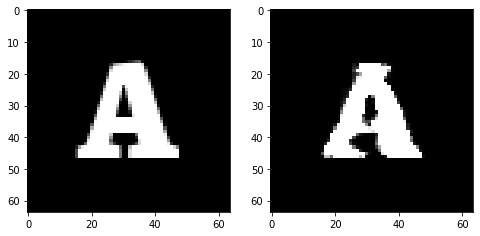

Epoch 184, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6004475876688957, Loss SSIM 2.1301190853118896, Loss Local 179.28121829032898


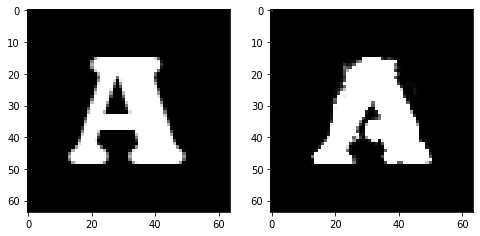

Epoch 184, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.705712627619505, Loss SSIM 2.297623038291931, Loss Local 182.8693561553955


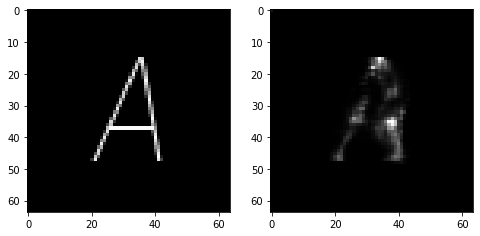

Epoch 184, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6282387971878052, Loss SSIM 2.2003427147865295, Loss Local 179.24431657791138


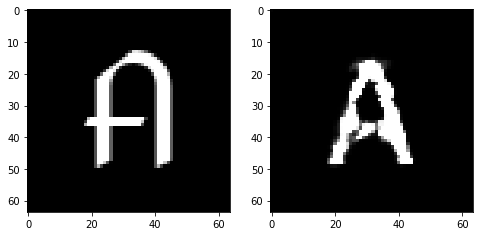

Epoch 184, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6533158905804157, Loss SSIM 2.288256824016571, Loss Local 177.883131980896


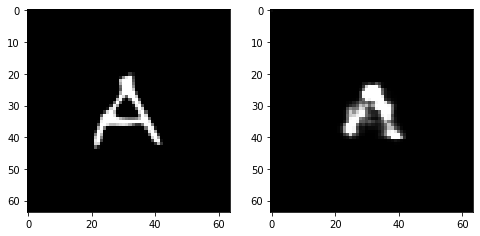

Epoch 184, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6726516745984554, Loss SSIM 2.226762890815735, Loss Local 168.65209817886353


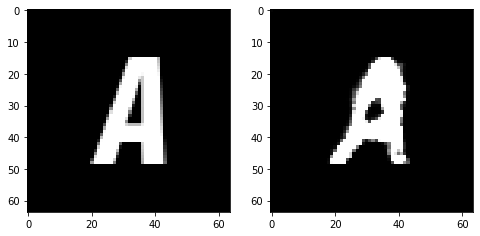

Epoch 184, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6758987195789814, Loss SSIM 2.3080881237983704, Loss Local 185.44944381713867


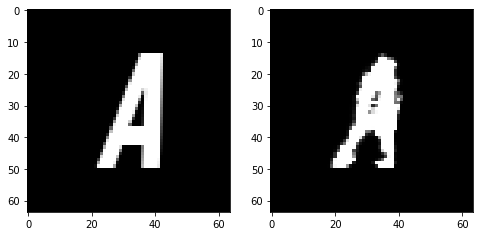

Epoch 184, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.585838008671999, Loss SSIM 2.126475155353546, Loss Local 179.78831100463867


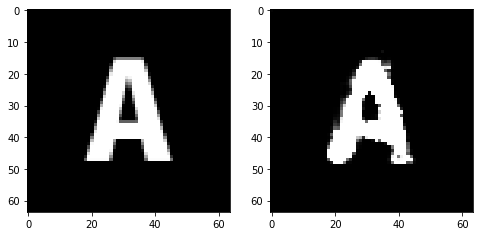

Epoch 185, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06696545332670212, Loss SSIM 0.08287400007247925, Loss Local 6.431164741516113


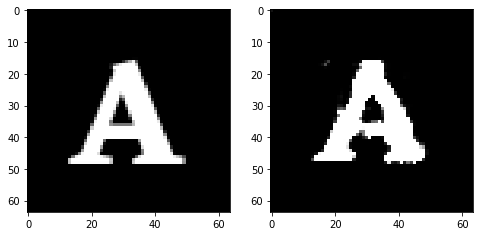

Epoch 185, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6329688876867294, Loss SSIM 2.186792492866516, Loss Local 175.97545766830444


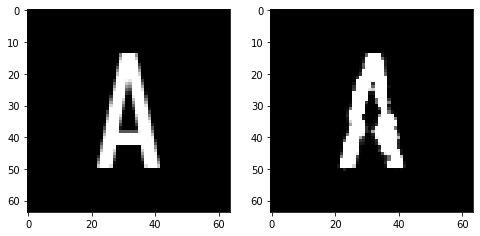

Epoch 185, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6645117737352848, Loss SSIM 2.1995933651924133, Loss Local 175.71568727493286


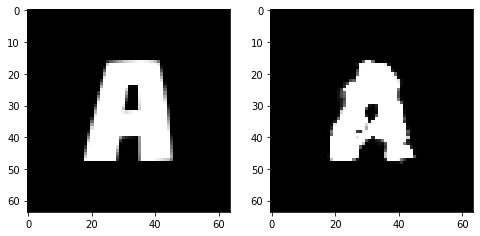

Epoch 185, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7132583186030388, Loss SSIM 2.377178907394409, Loss Local 199.0618052482605


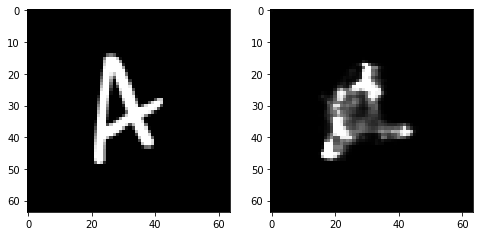

Epoch 185, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.607681941241026, Loss SSIM 2.144356667995453, Loss Local 182.49385786056519


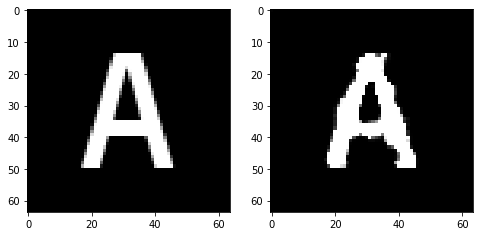

Epoch 185, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5990573093295097, Loss SSIM 2.1818279027938843, Loss Local 174.53778648376465


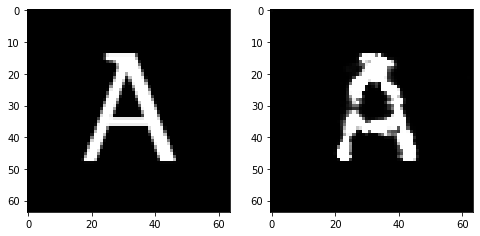

Epoch 185, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6103753708302975, Loss SSIM 2.1282931566238403, Loss Local 181.85031604766846


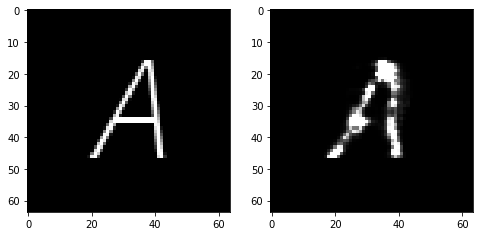

Epoch 185, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7104603163897991, Loss SSIM 2.368195116519928, Loss Local 191.94791316986084


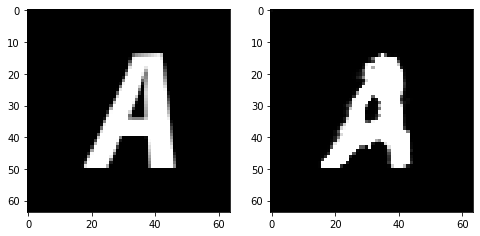

Epoch 186, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06305444240570068, Loss SSIM 0.0819544792175293, Loss Local 7.861466884613037


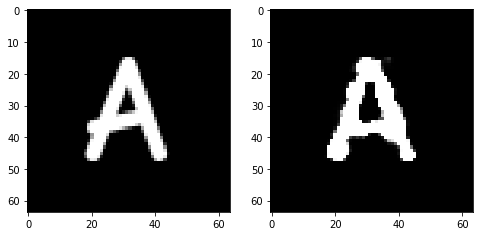

Epoch 186, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6239080503582954, Loss SSIM 2.150225043296814, Loss Local 179.81166744232178


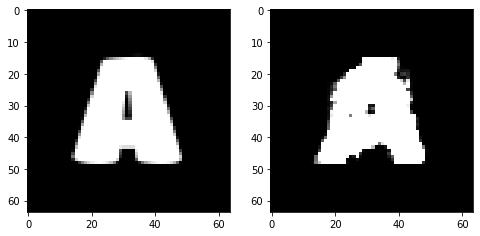

Epoch 186, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7058009020984173, Loss SSIM 2.335405647754669, Loss Local 182.2812738418579


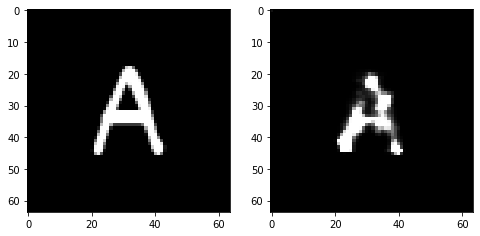

Epoch 186, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6673625484108925, Loss SSIM 2.313135027885437, Loss Local 188.65118598937988


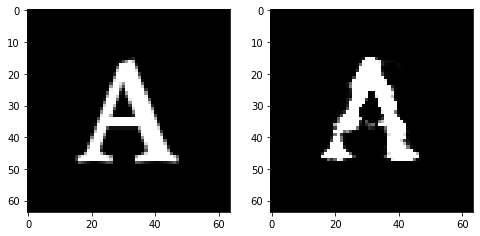

Epoch 186, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6542643867433071, Loss SSIM 2.227331280708313, Loss Local 186.18429517745972


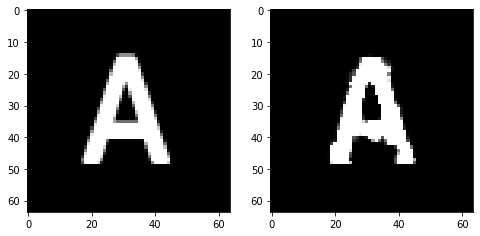

Epoch 186, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.627401765435934, Loss SSIM 2.1870232224464417, Loss Local 180.8400058746338


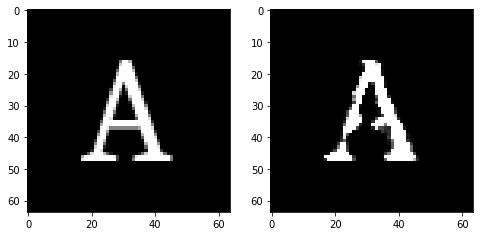

Epoch 186, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.650355912744999, Loss SSIM 2.223138988018036, Loss Local 187.85127067565918


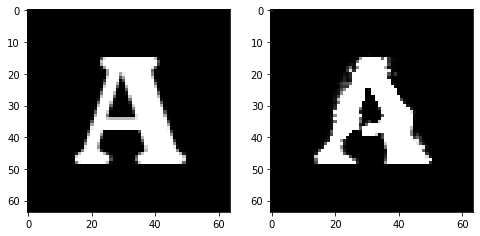

Epoch 186, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5978805795311928, Loss SSIM 2.1481683254241943, Loss Local 177.98892879486084


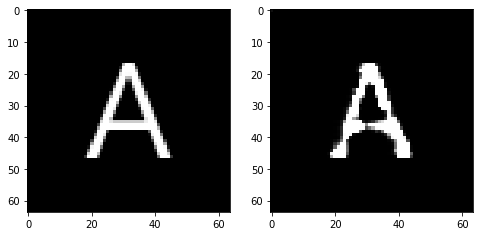

Epoch 187, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0676560252904892, Loss SSIM 0.09823715686798096, Loss Local 7.063911437988281


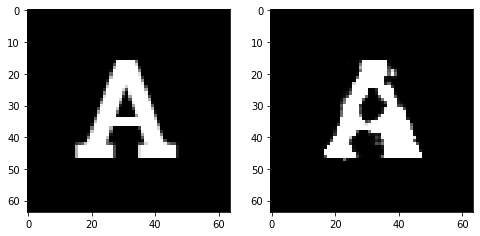

Epoch 187, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.657855961471796, Loss SSIM 2.228332281112671, Loss Local 184.45246505737305


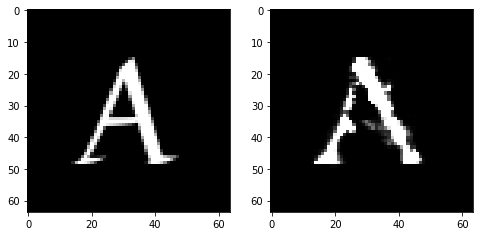

Epoch 187, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6527399085462093, Loss SSIM 2.2816967964172363, Loss Local 195.35587787628174


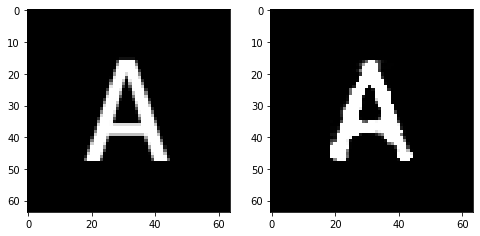

Epoch 187, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6562991477549076, Loss SSIM 2.218011200428009, Loss Local 186.2752914428711


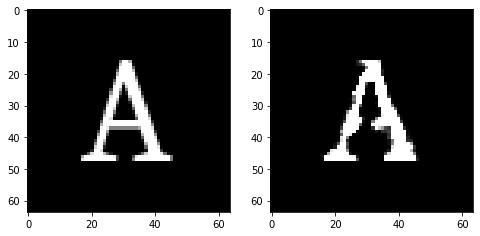

Epoch 187, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6371008716523647, Loss SSIM 2.172086000442505, Loss Local 172.30332040786743


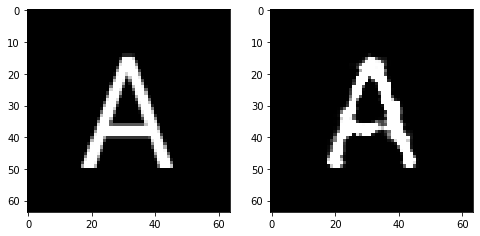

Epoch 187, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6123832017183304, Loss SSIM 2.178849697113037, Loss Local 180.7184066772461


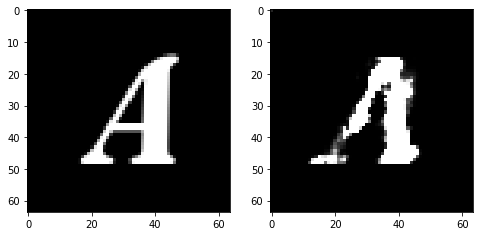

Epoch 187, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6524479053914547, Loss SSIM 2.185029685497284, Loss Local 190.71501350402832


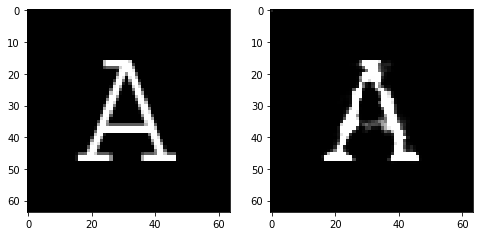

Epoch 187, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6562875881791115, Loss SSIM 2.296462655067444, Loss Local 192.9544219970703


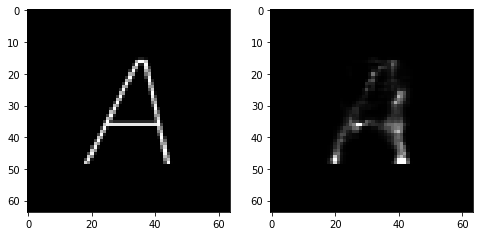

Epoch 188, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06778300553560257, Loss SSIM 0.0912020206451416, Loss Local 6.662402629852295


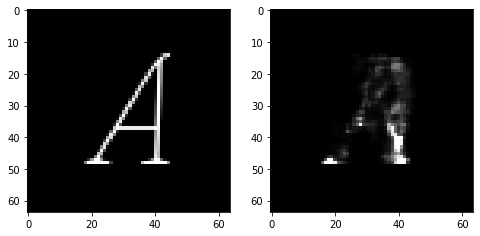

Epoch 188, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6225782074034214, Loss SSIM 2.230912923812866, Loss Local 186.60549783706665


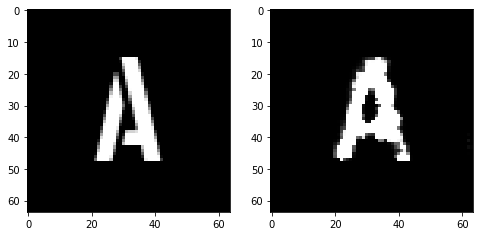

Epoch 188, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.696430116891861, Loss SSIM 2.335924744606018, Loss Local 197.4274754524231


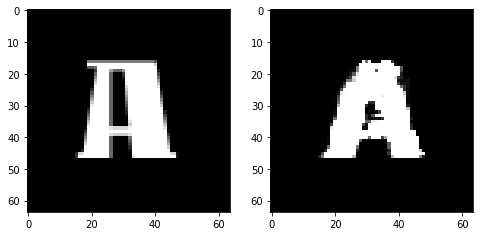

Epoch 188, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6427766755223274, Loss SSIM 2.1927995681762695, Loss Local 197.38515520095825


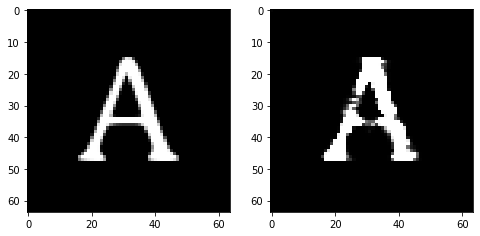

Epoch 188, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6228485330939293, Loss SSIM 2.1484844088554382, Loss Local 175.02521467208862


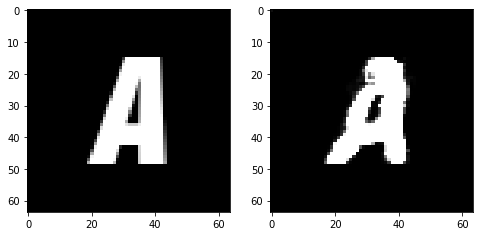

Epoch 188, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6583509556949139, Loss SSIM 2.240643620491028, Loss Local 172.33062171936035


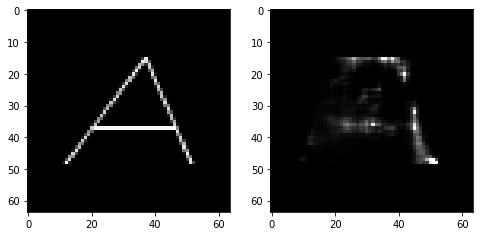

Epoch 188, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6682417802512646, Loss SSIM 2.267633616924286, Loss Local 182.80747985839844


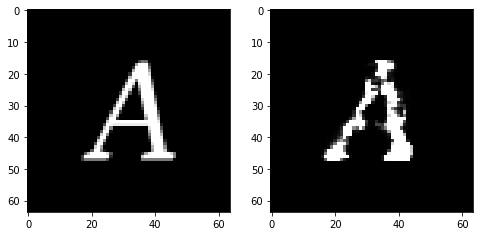

Epoch 188, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.626823328435421, Loss SSIM 2.1874639987945557, Loss Local 183.42149925231934


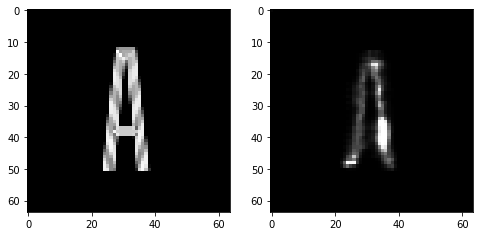

Epoch 189, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05987329035997391, Loss SSIM 0.08383595943450928, Loss Local 8.20167350769043


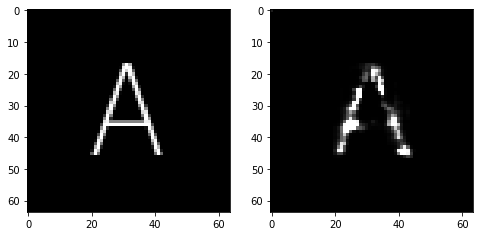

Epoch 189, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6453100629150867, Loss SSIM 2.246497869491577, Loss Local 180.39109659194946


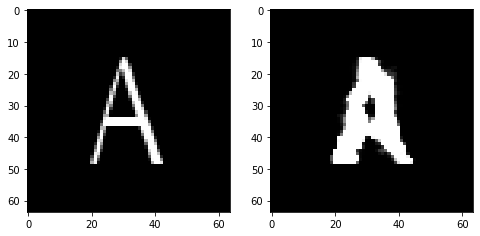

Epoch 189, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6375371031463146, Loss SSIM 2.219155788421631, Loss Local 179.3331913948059


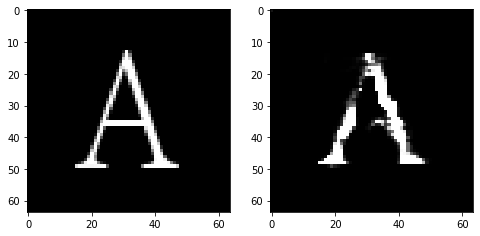

Epoch 189, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6056949831545353, Loss SSIM 2.1310816407203674, Loss Local 174.2515459060669


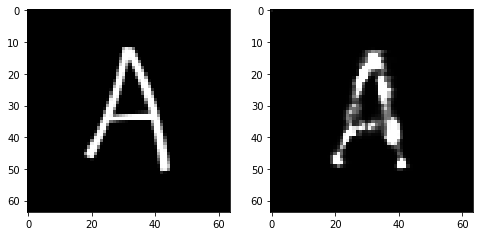

Epoch 189, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6102094165980816, Loss SSIM 2.1772090196609497, Loss Local 193.1405210494995


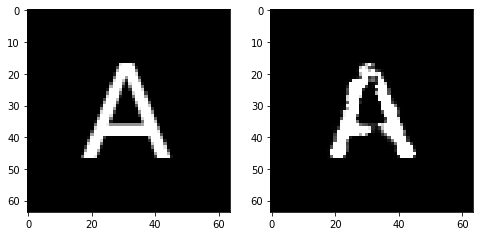

Epoch 189, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6266784705221653, Loss SSIM 2.167931616306305, Loss Local 178.2099404335022


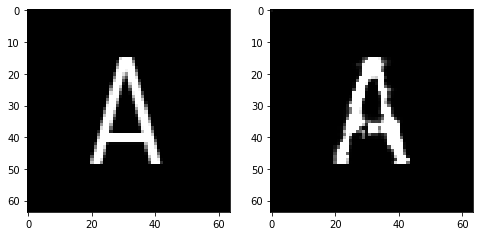

Epoch 189, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6375116035342216, Loss SSIM 2.1805962324142456, Loss Local 184.18143558502197


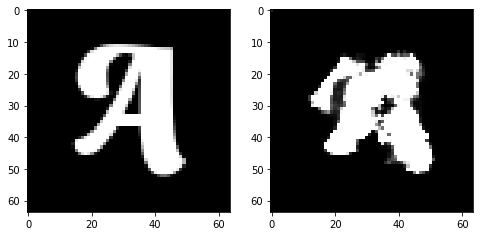

Epoch 189, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7355497106909752, Loss SSIM 2.4500202536582947, Loss Local 193.56681632995605


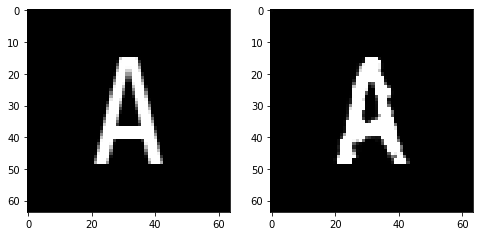

Epoch 190, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05565333738923073, Loss SSIM 0.07632708549499512, Loss Local 7.990098476409912


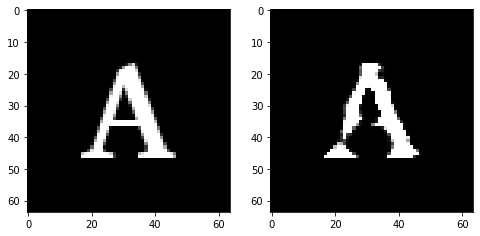

Epoch 190, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6160656996071339, Loss SSIM 2.178555130958557, Loss Local 184.74864625930786


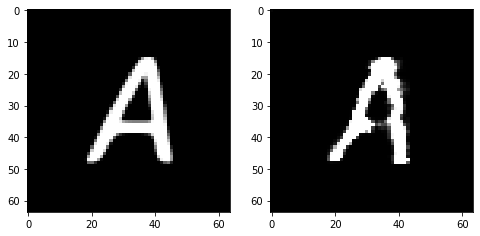

Epoch 190, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6669195778667927, Loss SSIM 2.2372316122055054, Loss Local 189.2005877494812


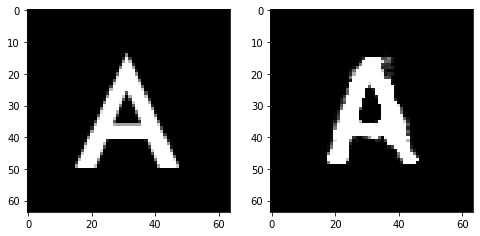

Epoch 190, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6301120296120644, Loss SSIM 2.2033903002738953, Loss Local 182.3355188369751


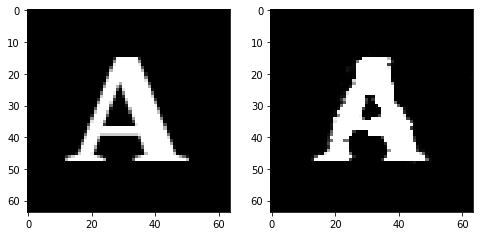

Epoch 190, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6497644744813442, Loss SSIM 2.161474049091339, Loss Local 177.2399296760559


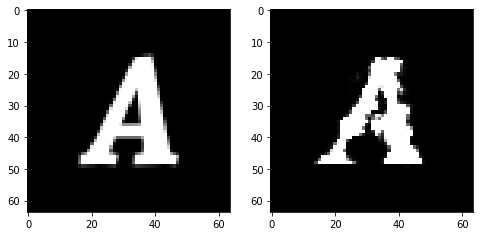

Epoch 190, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6740776672959328, Loss SSIM 2.30101478099823, Loss Local 187.91800785064697


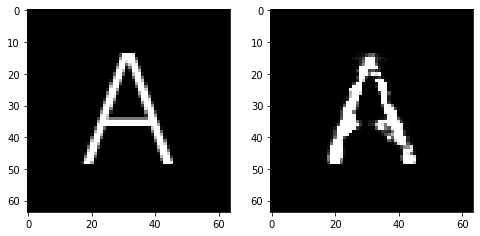

Epoch 190, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6323378570377827, Loss SSIM 2.2305386066436768, Loss Local 180.1876735687256


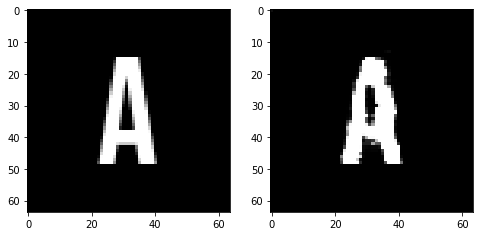

Epoch 190, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.679338552057743, Loss SSIM 2.292463719844818, Loss Local 195.18150424957275


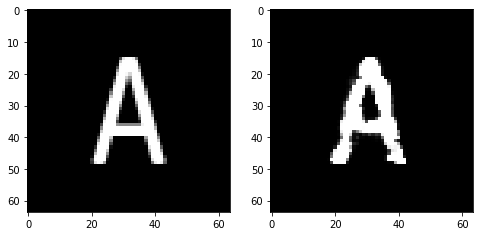

Epoch 191, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06301870197057724, Loss SSIM 0.08763617277145386, Loss Local 9.033071517944336


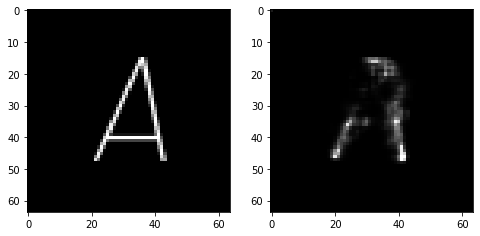

Epoch 191, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.706264704465866, Loss SSIM 2.3749112486839294, Loss Local 198.67025232315063


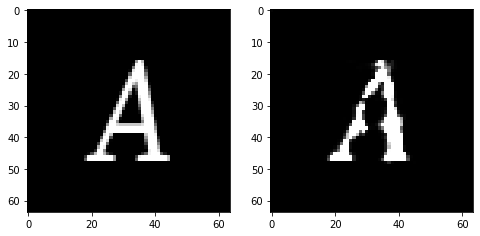

Epoch 191, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6770834363996983, Loss SSIM 2.2444061636924744, Loss Local 186.90152788162231


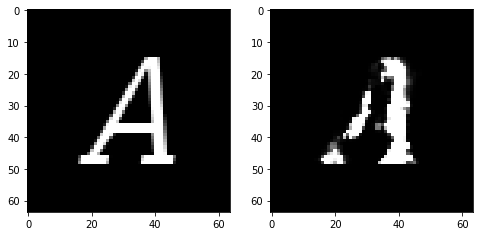

Epoch 191, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.604809656739235, Loss SSIM 2.114299714565277, Loss Local 191.19676876068115


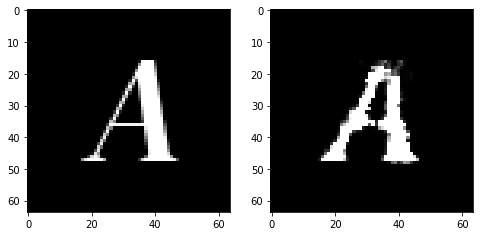

Epoch 191, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.661779172718525, Loss SSIM 2.2360199093818665, Loss Local 188.63109159469604


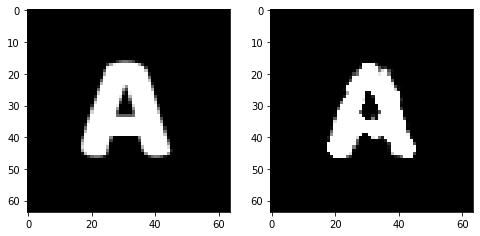

Epoch 191, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6157475411891937, Loss SSIM 2.2440311312675476, Loss Local 179.18707370758057


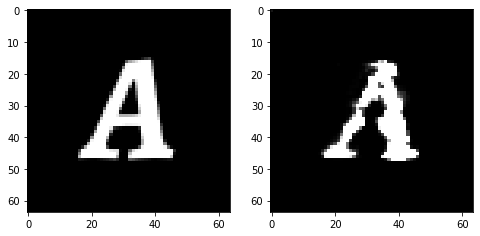

Epoch 191, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6559440083801746, Loss SSIM 2.245828628540039, Loss Local 183.33014917373657


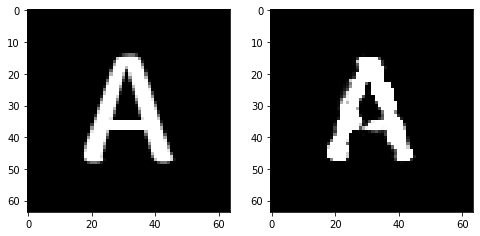

Epoch 191, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6192736327648163, Loss SSIM 2.1547710299491882, Loss Local 182.72373914718628


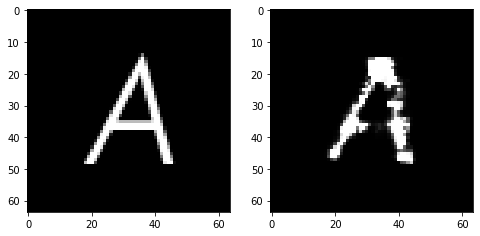

Epoch 192, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05977015197277069, Loss SSIM 0.07413887977600098, Loss Local 6.0098185539245605


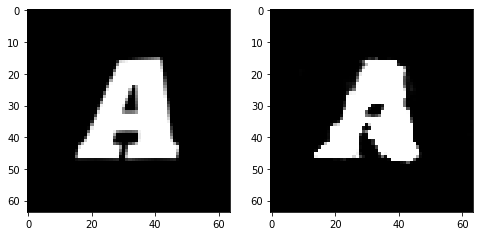

Epoch 192, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6730782762169838, Loss SSIM 2.216094195842743, Loss Local 184.99344205856323


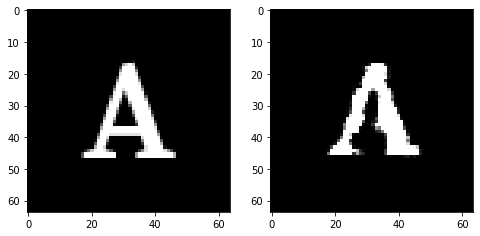

Epoch 192, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6453332267701626, Loss SSIM 2.2534735798835754, Loss Local 185.9035940170288


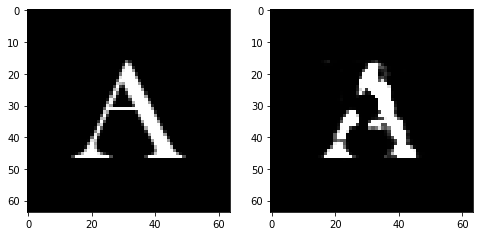

Epoch 192, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6287989243865013, Loss SSIM 2.2143943905830383, Loss Local 175.46920585632324


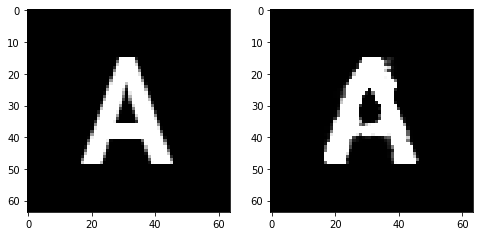

Epoch 192, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6374818496406078, Loss SSIM 2.1744036078453064, Loss Local 190.53311967849731


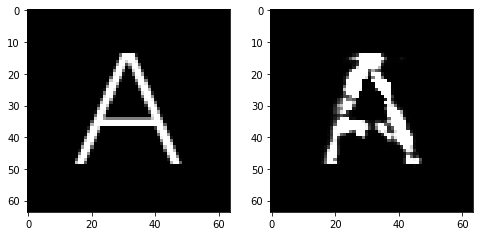

Epoch 192, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6692043729126453, Loss SSIM 2.285451352596283, Loss Local 174.5103349685669


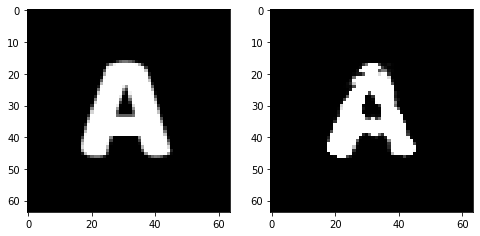

Epoch 192, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5823835581541061, Loss SSIM 2.1404188871383667, Loss Local 174.7852931022644


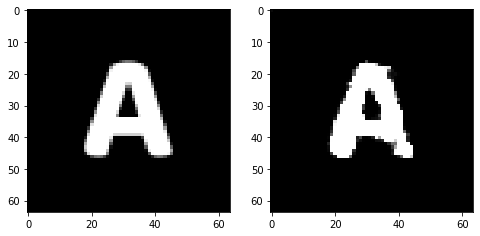

Epoch 192, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6639909334480762, Loss SSIM 2.2472751140594482, Loss Local 187.41323137283325


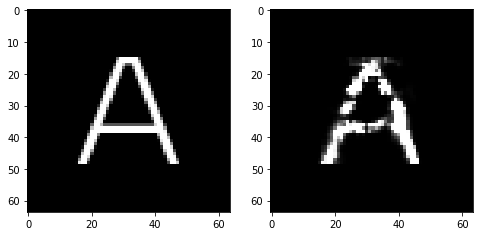

Epoch 193, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.057250015437603, Loss SSIM 0.07856202125549316, Loss Local 8.246685028076172


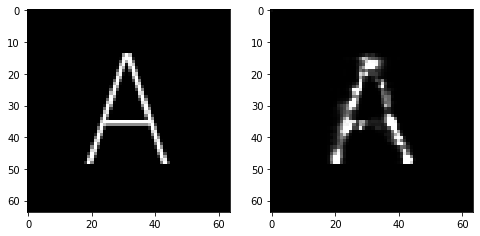

Epoch 193, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6766791455447674, Loss SSIM 2.3143852949142456, Loss Local 182.46605730056763


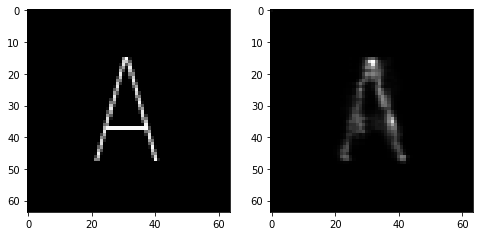

Epoch 193, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6601055562496185, Loss SSIM 2.2760425209999084, Loss Local 196.1333589553833


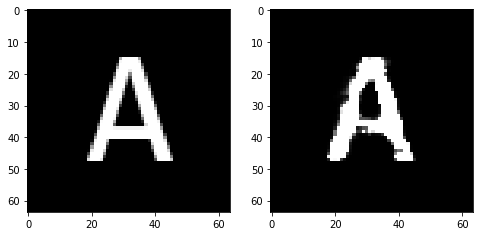

Epoch 193, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5977072268724442, Loss SSIM 2.145086646080017, Loss Local 177.07990741729736


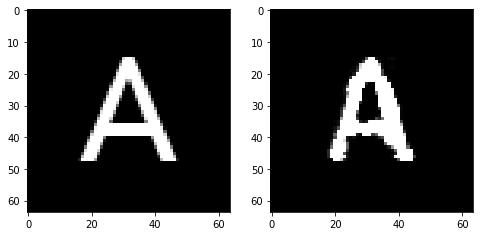

Epoch 193, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6627069190144539, Loss SSIM 2.204216480255127, Loss Local 185.1889886856079


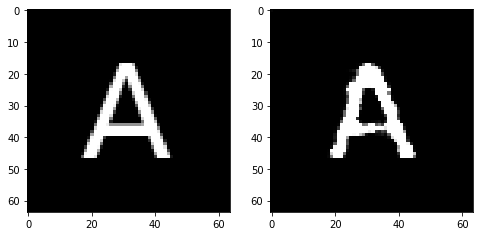

Epoch 193, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6524097546935081, Loss SSIM 2.204947054386139, Loss Local 193.45325088500977


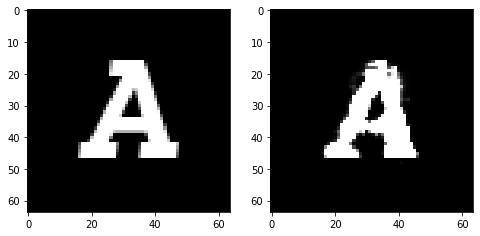

Epoch 193, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.657703261822462, Loss SSIM 2.2520949244499207, Loss Local 193.22939276695251


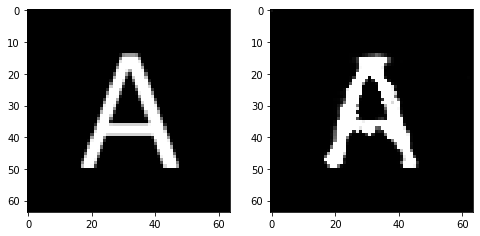

Epoch 193, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6139976270496845, Loss SSIM 2.191421627998352, Loss Local 179.60604286193848


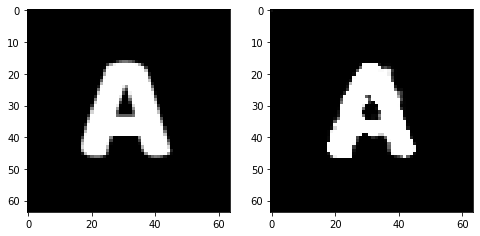

Epoch 194, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06887761503458023, Loss SSIM 0.09957337379455566, Loss Local 7.066318511962891


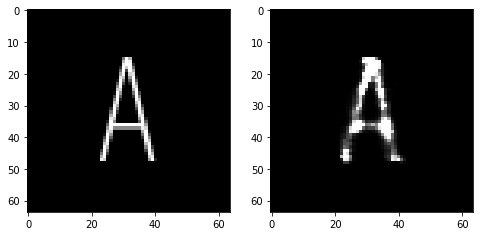

Epoch 194, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6309246942400932, Loss SSIM 2.1814789175987244, Loss Local 192.0734076499939


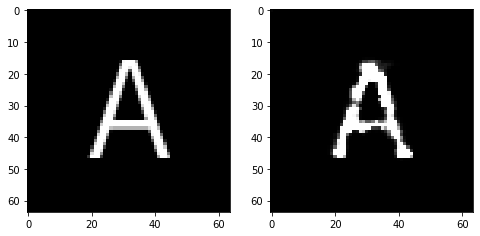

Epoch 194, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5990305058658123, Loss SSIM 2.1506216526031494, Loss Local 184.47343015670776


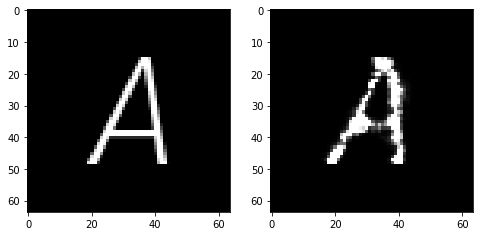

Epoch 194, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6647564582526684, Loss SSIM 2.238463580608368, Loss Local 186.2217402458191


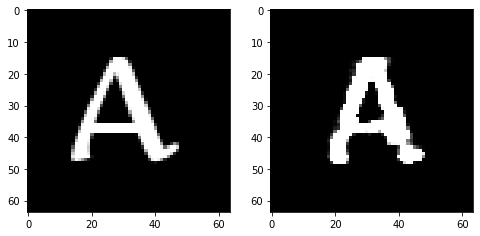

Epoch 194, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.8073897659778595, Loss SSIM 2.587943196296692, Loss Local 200.72187566757202


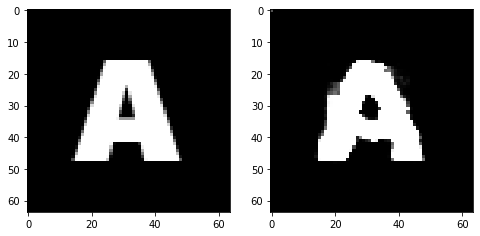

Epoch 194, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6980404257774353, Loss SSIM 2.3033342361450195, Loss Local 190.48883819580078


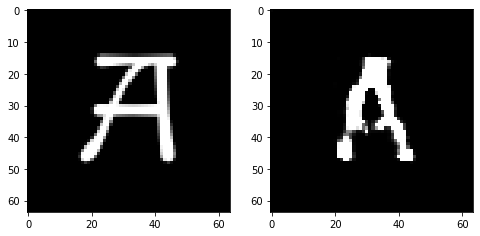

Epoch 194, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.691114615648985, Loss SSIM 2.247166097164154, Loss Local 190.00492811203003


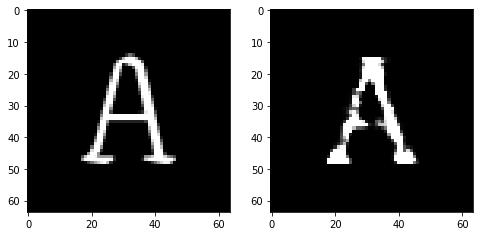

Epoch 194, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.612850435078144, Loss SSIM 2.2459664344787598, Loss Local 187.38716459274292


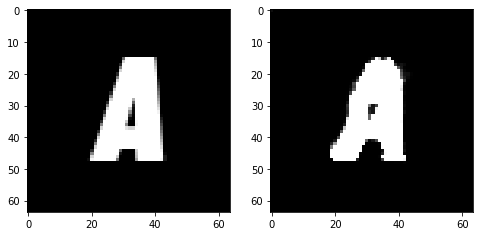

Epoch 195, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06303189694881439, Loss SSIM 0.0822376012802124, Loss Local 8.928483009338379


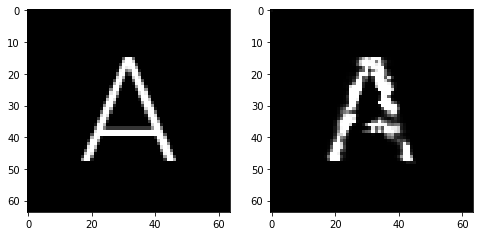

Epoch 195, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6198769882321358, Loss SSIM 2.176872491836548, Loss Local 185.21762609481812


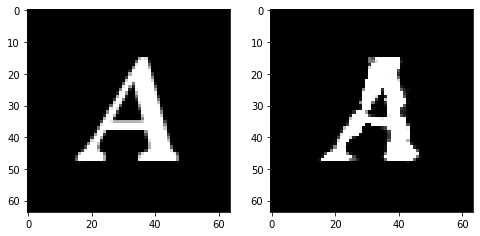

Epoch 195, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6589032039046288, Loss SSIM 2.225629508495331, Loss Local 186.50041913986206


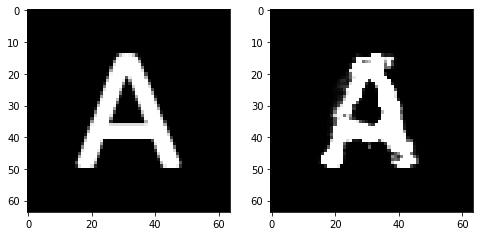

Epoch 195, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6648990325629711, Loss SSIM 2.283917248249054, Loss Local 189.78789281845093


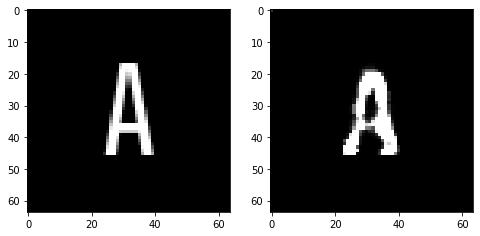

Epoch 195, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5943008176982403, Loss SSIM 2.119523763656616, Loss Local 183.60255336761475


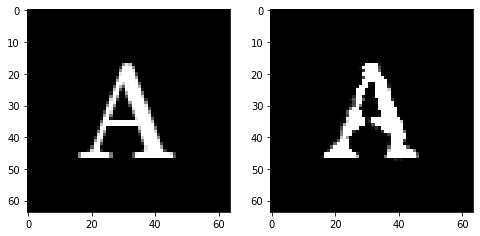

Epoch 195, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6720907390117645, Loss SSIM 2.299691915512085, Loss Local 191.39117765426636


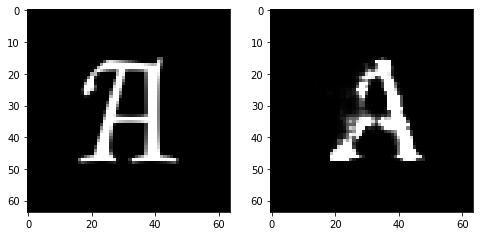

Epoch 195, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6273169293999672, Loss SSIM 2.2177268266677856, Loss Local 185.25163912773132


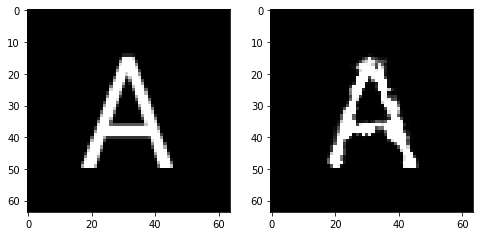

Epoch 195, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6598659418523312, Loss SSIM 2.253839373588562, Loss Local 184.0071620941162


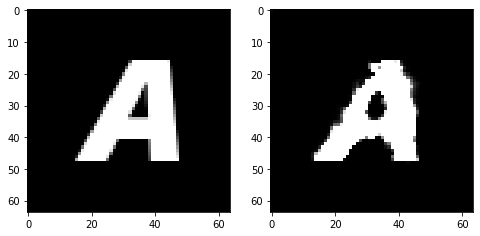

Epoch 196, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06118149310350418, Loss SSIM 0.09452110528945923, Loss Local 8.038850784301758


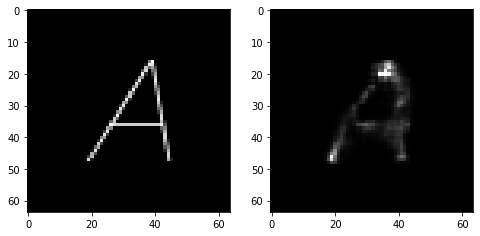

Epoch 196, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.595975872129202, Loss SSIM 2.125947117805481, Loss Local 182.7845606803894


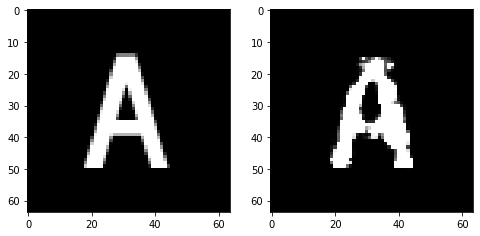

Epoch 196, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6814947314560413, Loss SSIM 2.312221944332123, Loss Local 188.0444393157959


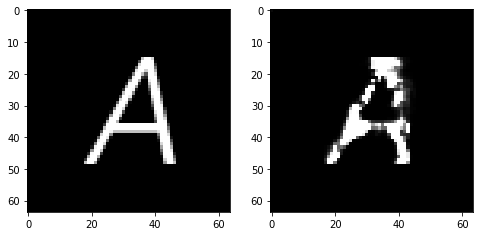

Epoch 196, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6067432053387165, Loss SSIM 2.1539013981819153, Loss Local 176.7162356376648


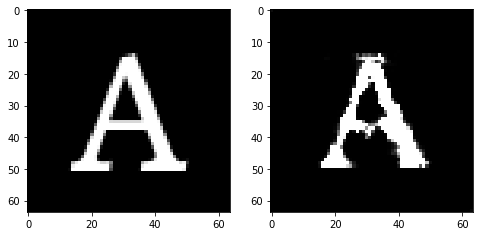

Epoch 196, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6674804203212261, Loss SSIM 2.2552038431167603, Loss Local 183.52182340621948


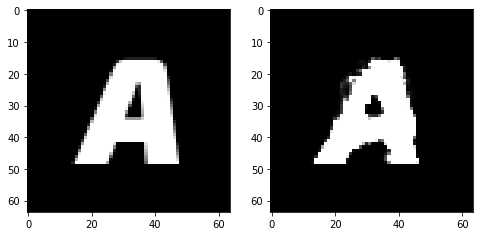

Epoch 196, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6607399582862854, Loss SSIM 2.2644724249839783, Loss Local 181.13690567016602


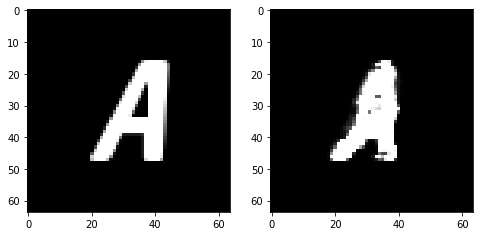

Epoch 196, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.626199223101139, Loss SSIM 2.221033811569214, Loss Local 179.47371435165405


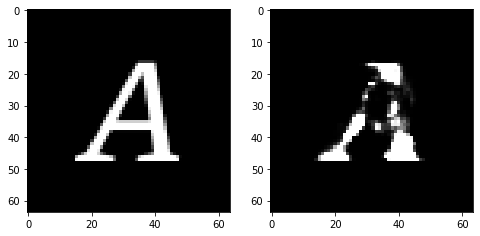

Epoch 196, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.648912724107504, Loss SSIM 2.174345374107361, Loss Local 187.4228596687317


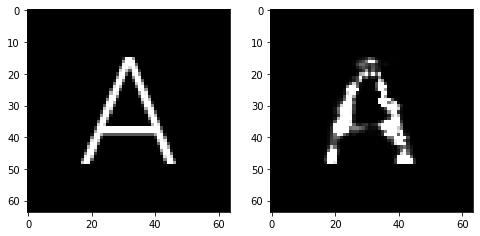

Epoch 197, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.08088542520999908, Loss SSIM 0.12195420265197754, Loss Local 7.960628032684326


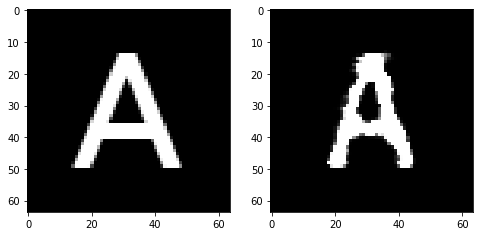

Epoch 197, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.635042279958725, Loss SSIM 2.2187103629112244, Loss Local 181.5192265510559


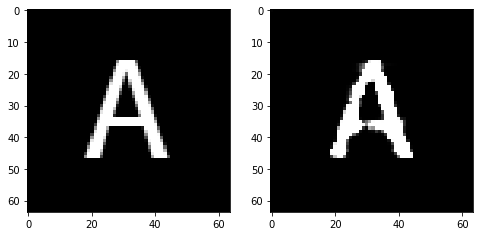

Epoch 197, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5900146923959255, Loss SSIM 2.168036937713623, Loss Local 190.58048582077026


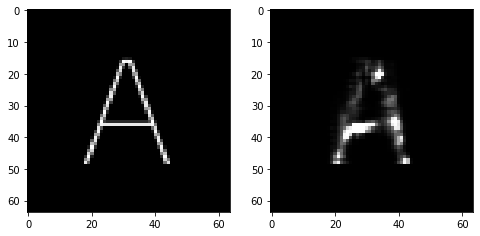

Epoch 197, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6598463244736195, Loss SSIM 2.2251946330070496, Loss Local 193.92713069915771


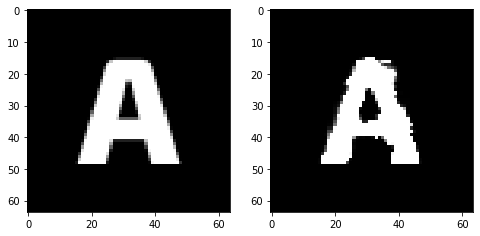

Epoch 197, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6922257542610168, Loss SSIM 2.3220561146736145, Loss Local 190.4522590637207


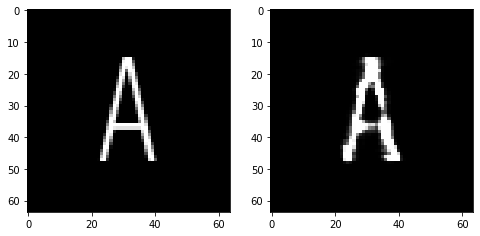

Epoch 197, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6656424812972546, Loss SSIM 2.239093065261841, Loss Local 186.0684938430786


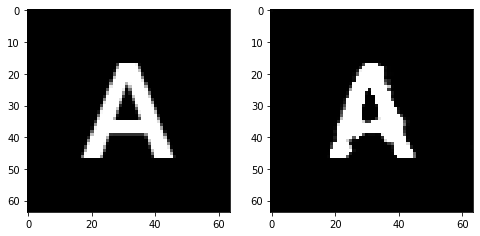

Epoch 197, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6445027068257332, Loss SSIM 2.2112276554107666, Loss Local 187.14017581939697


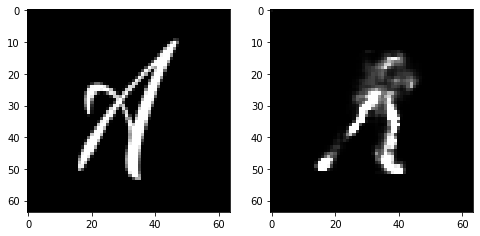

Epoch 197, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6304573565721512, Loss SSIM 2.1829641461372375, Loss Local 179.41897249221802


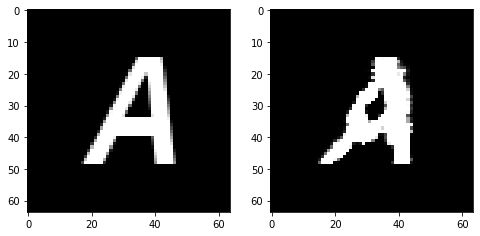

Epoch 198, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.0627460926771164, Loss SSIM 0.09235358238220215, Loss Local 8.227343559265137


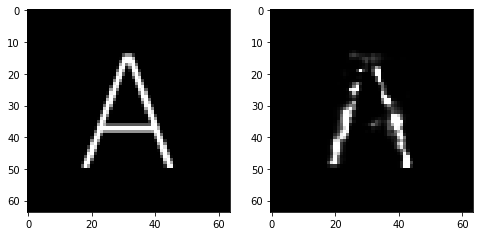

Epoch 198, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.660249501466751, Loss SSIM 2.270803451538086, Loss Local 186.40096187591553


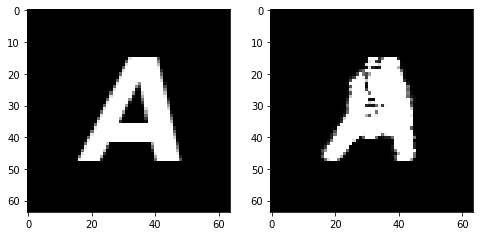

Epoch 198, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6602717861533165, Loss SSIM 2.2392815947532654, Loss Local 184.03942728042603


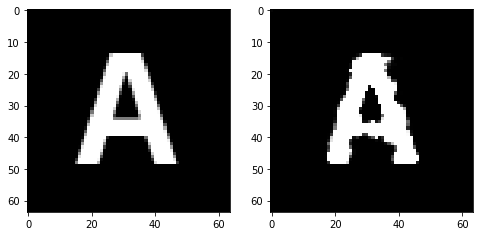

Epoch 198, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.7078283466398716, Loss SSIM 2.3341245651245117, Loss Local 202.7707142829895


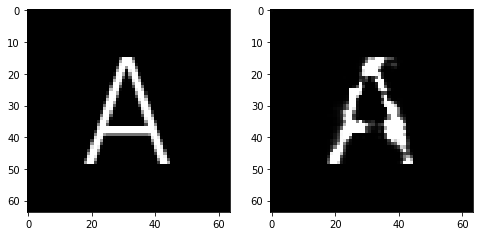

Epoch 198, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.620203711092472, Loss SSIM 2.176962435245514, Loss Local 174.10962581634521


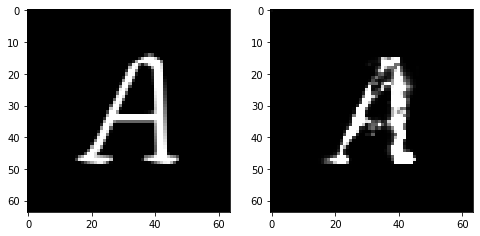

Epoch 198, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.63131258264184, Loss SSIM 2.1807138919830322, Loss Local 188.29712009429932


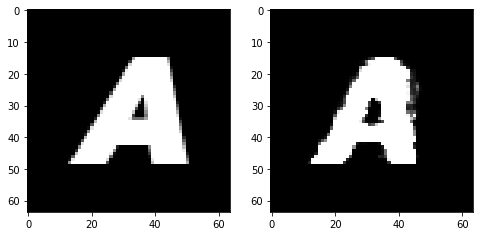

Epoch 198, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6444151178002357, Loss SSIM 2.2052177786827087, Loss Local 189.14941358566284


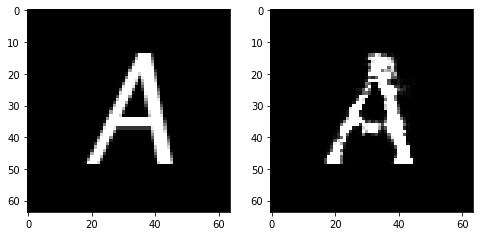

Epoch 198, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6256169565021992, Loss SSIM 2.2006697058677673, Loss Local 187.78728485107422


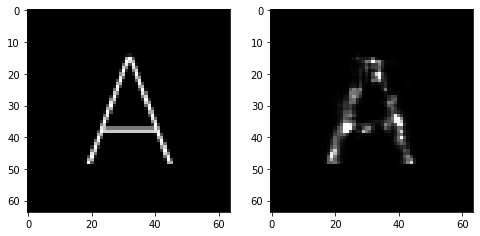

Epoch 199, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.05489205941557884, Loss SSIM 0.06753844022750854, Loss Local 5.798357963562012


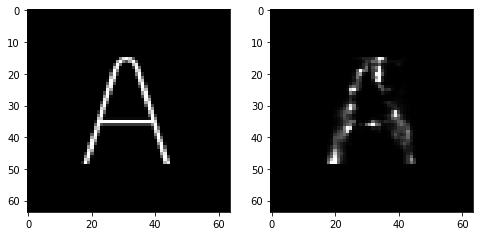

Epoch 199, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6681708320975304, Loss SSIM 2.2971296906471252, Loss Local 186.22908067703247


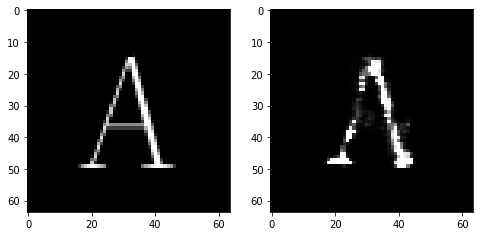

Epoch 199, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6230556517839432, Loss SSIM 2.223408281803131, Loss Local 183.71935558319092


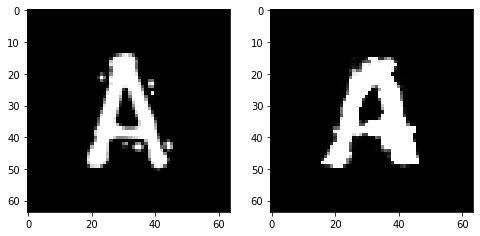

Epoch 199, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6952741220593452, Loss SSIM 2.2236214876174927, Loss Local 186.1714334487915


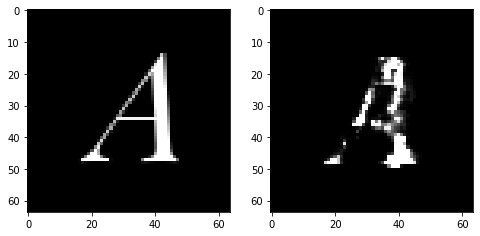

Epoch 199, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.622239038348198, Loss SSIM 2.2161874771118164, Loss Local 184.86659574508667


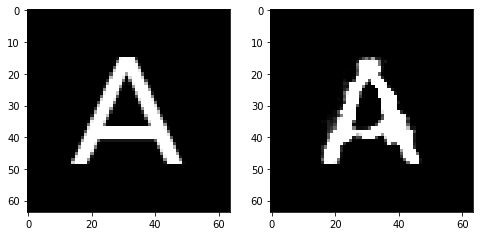

Epoch 199, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6521607674658298, Loss SSIM 2.1830106377601624, Loss Local 185.18931770324707


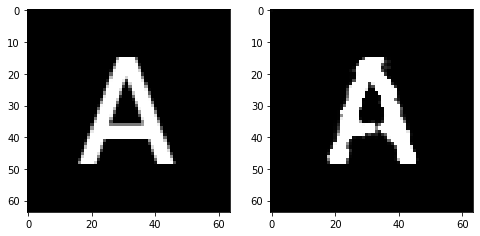

Epoch 199, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6171930879354477, Loss SSIM 2.1841694712638855, Loss Local 184.6123332977295


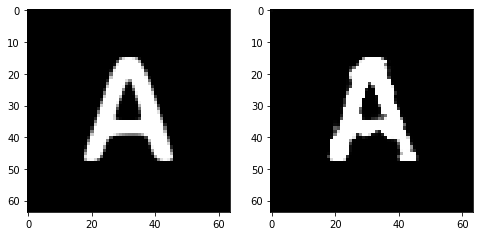

Epoch 199, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.662881787866354, Loss SSIM 2.2907649874687195, Loss Local 187.51008415222168


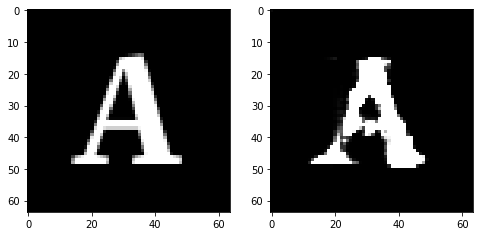

Epoch 200, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.07346685230731964, Loss SSIM 0.09843671321868896, Loss Local 7.204647064208984


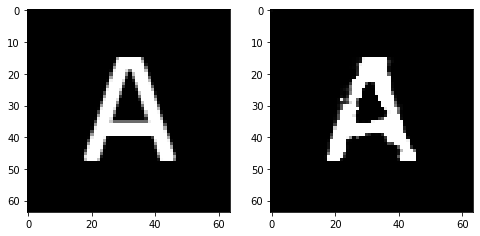

Epoch 200, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6296457834541798, Loss SSIM 2.2147629261016846, Loss Local 191.3527193069458


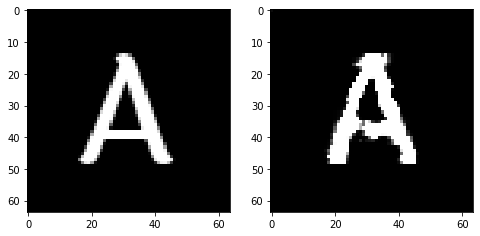

Epoch 200, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.686861913651228, Loss SSIM 2.3139848709106445, Loss Local 185.60173797607422


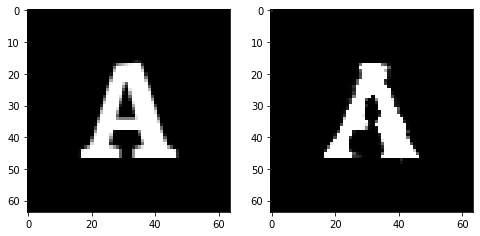

Epoch 200, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.618291962891817, Loss SSIM 2.1299288868904114, Loss Local 173.79134798049927


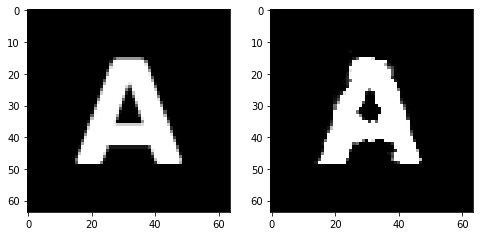

Epoch 200, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6484857201576233, Loss SSIM 2.220510423183441, Loss Local 182.40172481536865


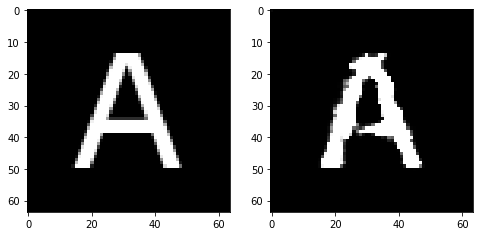

Epoch 200, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6292268820106983, Loss SSIM 2.174418032169342, Loss Local 184.6516819000244


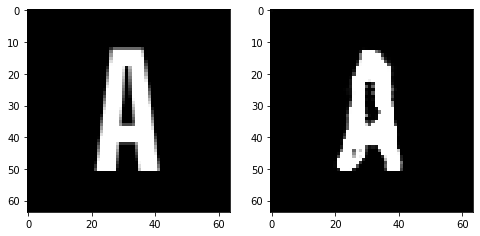

Epoch 200, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6146304197609425, Loss SSIM 2.164509892463684, Loss Local 177.92952156066895


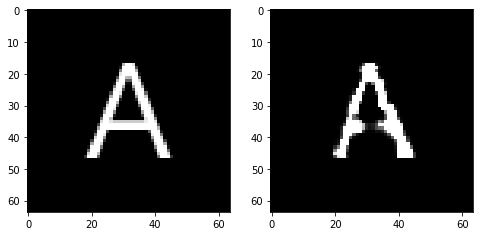

Epoch 200, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.615501306951046, Loss SSIM 2.17859023809433, Loss Local 185.17684650421143


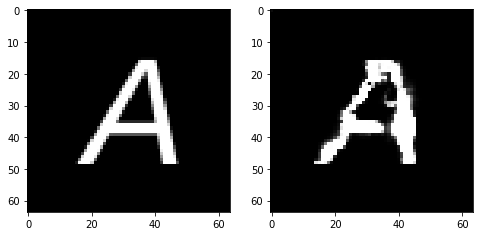

Epoch 201, Iteration 1, Loss D 1.3862944841384888, Loss Disc 0.6931472420692444, Loss L1 0.06146420165896416, Loss SSIM 0.08758425712585449, Loss Local 6.571613311767578


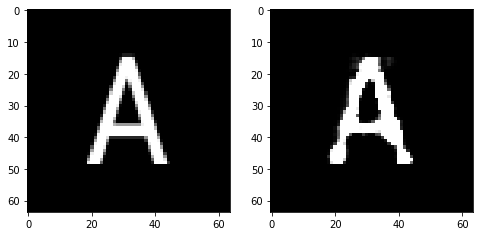

Epoch 201, Iteration 26, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.639190100133419, Loss SSIM 2.1716495156288147, Loss Local 179.01110315322876


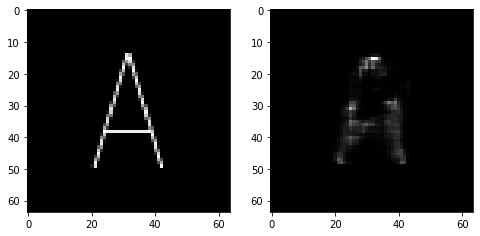

Epoch 201, Iteration 51, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.5750913210213184, Loss SSIM 2.0961171984672546, Loss Local 175.86548519134521


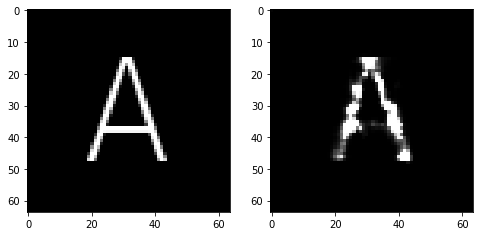

Epoch 201, Iteration 76, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6775971576571465, Loss SSIM 2.280574321746826, Loss Local 188.13315987586975


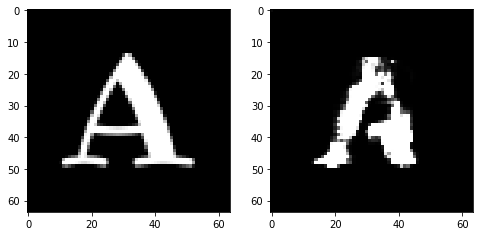

Epoch 201, Iteration 101, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6282056868076324, Loss SSIM 2.2025399208068848, Loss Local 185.6288766860962


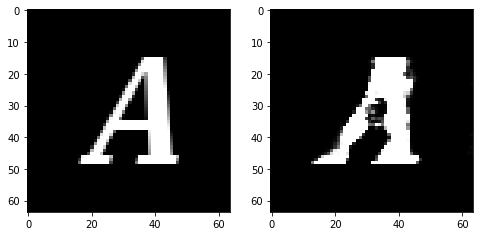

Epoch 201, Iteration 126, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.698478426784277, Loss SSIM 2.3124725222587585, Loss Local 194.99684858322144


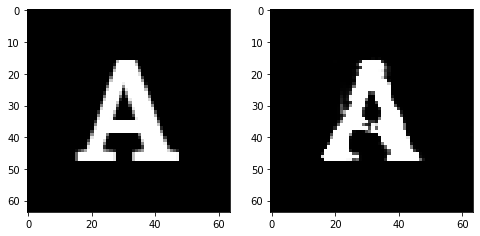

Epoch 201, Iteration 151, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.6285417526960373, Loss SSIM 2.199019193649292, Loss Local 181.52486419677734


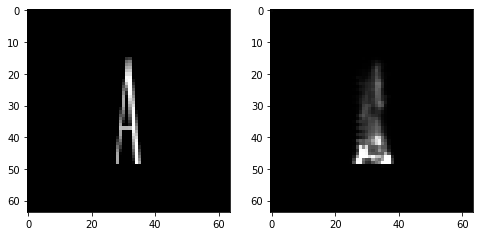

Epoch 201, Iteration 176, Loss D 34.65736210346222, Loss Disc 17.32868105173111, Loss L1 1.682489536702633, Loss SSIM 2.2911632657051086, Loss Local 187.57218074798584


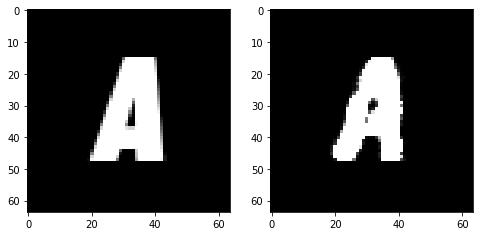

KeyboardInterrupt: 

In [204]:
main()

In [210]:
import pickle

with open("loss_l1", "wb") as f:
    pickle.dump(loss_l1_list, f)
    
with open("lossD", "wb") as f:
    pickle.dump(lossD_list, f)

with open("loss_disc", "wb") as f:
    pickle.dump(loss_disc_list, f)

with open("loss_ssim", "wb") as f:
    pickle.dump(loss_ssim_list, f)

with open("loss_local", "wb") as f:
    pickle.dump(loss_local_list, f)

In [211]:
with open("loss_local", "rb") as f:
    x=np.load(f)
print(x)

ValueError: Cannot load file containing pickled data when allow_pickle=False

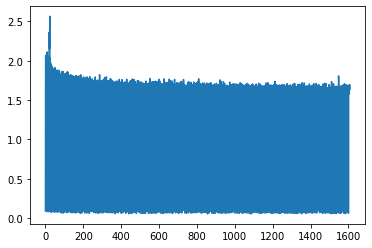

In [209]:
# plot losses
plt.plot(loss_l1_list)
plt.show()

In [ ]:
# path to font list
fonts_csv = "fonts.csv"
# root directory for dataset
dataroot = "images"
# number of workers for dataloader
workers = 0

dataset = FontDataset(csv_file=fonts_csv, 
                      root_dir=dataroot, 
                      transform=transforms.Compose([
                          transforms.ToTensor(),
                          transforms.Normalize(0.5, 0.5),
                      ]))

In [ ]:
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=workers)

encdec = EncoderDecoder()
encdec.load_state_dict(torch.load('encdec.pt'))
encdec.eval()

In [161]:
#look at result and ground truth side by side
for i, data in enumerate(dataloader):
    if i > 50:
        break
    fig = plt.figure(figsize=(8, 8))
    output = encdec(data['c1'])
    fig.add_subplot(1, 2, 1)
    plt.imshow(data['c2'][0].permute(1, 2, 0).detach().numpy(), cmap='gray')
    fig.add_subplot(1, 2, 2)
    plt.imshow(output[0].permute(1, 2, 0).detach().numpy(), cmap='gray')
    plt.show()

In [166]:
#set up for evaluation
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=workers)

encdec = EncoderDecoder()
encdec.load_state_dict(torch.load('encdec-Copy1.pt'))
encdec.eval()
criterion_L1 = nn.L1Loss()
criterion_ssim = MS_SSIM(win_size=3, data_range=1, size_average=True, channel=1)

In [168]:
#evaluate accuracy using L1 loss
for i, data in enumerate(dataloader):
    output = encdec(data['c1'])
    truth = data['c2']
    loss_L1 = criterion_L1(output, truth)
    
    output_norm = (output + 1) / 2
    truth_norm = (truth+1) / 2
    loss_ssim = 1 - criterion_ssim(output_norm, truth_norm)
    
    print(f'{i}, L1: {loss_L1}, ssim: {loss_ssim}')

0, L1: 0.11039647459983826, ssim: 0.17747068405151367
1, L1: 0.08089693635702133, ssim: 0.09386289119720459
2, L1: 0.06853260844945908, ssim: 0.08297383785247803
3, L1: 0.11089372634887695, ssim: 0.23213541507720947
4, L1: 0.038106516003608704, ssim: 0.027527153491973877
5, L1: 0.0792616680264473, ssim: 0.11540257930755615
6, L1: 0.04213376343250275, ssim: 0.03352046012878418
7, L1: 0.059157781302928925, ssim: 0.07703202962875366
8, L1: 0.24022439122200012, ssim: 0.4588257670402527
9, L1: 0.06825708597898483, ssim: 0.07667970657348633
10, L1: 0.051598817110061646, ssim: 0.051001548767089844
11, L1: 0.2085886001586914, ssim: 0.2567775249481201
12, L1: 0.07073262333869934, ssim: 0.0784960389137268
13, L1: 0.08040574193000793, ssim: 0.09605830907821655
14, L1: 0.05451987311244011, ssim: 0.058758437633514404
15, L1: 0.08923070132732391, ssim: 0.15772056579589844
16, L1: 0.11131218075752258, ssim: 0.13691407442092896
17, L1: 0.2438725084066391, ssim: 0.4737599492073059
18, L1: 0.08858506381

152, L1: 0.06889532506465912, ssim: 0.06919312477111816
153, L1: 0.0607423260807991, ssim: 0.06934094429016113
154, L1: 0.05836329609155655, ssim: 0.06114429235458374
155, L1: 0.08883416652679443, ssim: 0.1027938723564148
156, L1: 0.07575616985559464, ssim: 0.0858493447303772
157, L1: 0.07978146523237228, ssim: 0.10669815540313721
158, L1: 0.05258508026599884, ssim: 0.05345994234085083
159, L1: 0.05873097851872444, ssim: 0.05718791484832764
160, L1: 0.07342013716697693, ssim: 0.08319908380508423
161, L1: 0.07586877793073654, ssim: 0.09458595514297485
162, L1: 0.09478834271430969, ssim: 0.1022070050239563
163, L1: 0.10470055043697357, ssim: 0.22193455696105957
164, L1: 0.08443177491426468, ssim: 0.08526414632797241
165, L1: 0.0715842917561531, ssim: 0.0762944221496582
166, L1: 0.059848956763744354, ssim: 0.06284481287002563
167, L1: 0.09003887325525284, ssim: 0.10121101140975952
168, L1: 0.07221962511539459, ssim: 0.08247703313827515
169, L1: 0.05456048250198364, ssim: 0.057745993137359

302, L1: 0.09000823646783829, ssim: 0.10436290502548218
303, L1: 0.03278225660324097, ssim: 0.03346598148345947
304, L1: 0.06608622521162033, ssim: 0.05992388725280762
305, L1: 0.07300208508968353, ssim: 0.0842466950416565
306, L1: 0.0675133690237999, ssim: 0.0772365927696228
307, L1: 0.05704762414097786, ssim: 0.04869323968887329
308, L1: 0.1096034049987793, ssim: 0.13312697410583496
309, L1: 0.06016245484352112, ssim: 0.04968059062957764
310, L1: 0.13053369522094727, ssim: 0.19141721725463867
311, L1: 0.07232728600502014, ssim: 0.08200651407241821
312, L1: 0.06184431537985802, ssim: 0.06264740228652954
313, L1: 0.09022515267133713, ssim: 0.10453170537948608
314, L1: 0.08760853856801987, ssim: 0.11121916770935059
315, L1: 0.06120019033551216, ssim: 0.09021127223968506
316, L1: 0.05880950391292572, ssim: 0.06488174200057983
317, L1: 0.07695657014846802, ssim: 0.08762592077255249
318, L1: 0.07153172791004181, ssim: 0.08104550838470459
319, L1: 0.11937202513217926, ssim: 0.17387765645980

455, L1: 0.07434134930372238, ssim: 0.0922250747680664
456, L1: 0.09858784079551697, ssim: 0.18295514583587646
457, L1: 0.17381393909454346, ssim: 0.2208053469657898
458, L1: 0.13513469696044922, ssim: 0.15482217073440552
459, L1: 0.08193998038768768, ssim: 0.09691119194030762
460, L1: 0.10298686474561691, ssim: 0.1109459400177002
461, L1: 0.07968256622552872, ssim: 0.06657242774963379
462, L1: 0.059610363095998764, ssim: 0.059905290603637695
463, L1: 0.06045956164598465, ssim: 0.06798720359802246
464, L1: 0.19083385169506073, ssim: 0.24148380756378174
465, L1: 0.045080821961164474, ssim: 0.03660166263580322
466, L1: 0.11044272035360336, ssim: 0.12912142276763916
467, L1: 0.1096285954117775, ssim: 0.11498904228210449


KeyboardInterrupt: 